In [1]:
import numpy as np
import matplotlib.pyplot as plt
import natsort, glob, h5py
from scipy.optimize import curve_fit
import scipy.signal
import json

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
# changing the display so that the cells fill the whole window

In [3]:
def gauss_fun(x, A, mu, sig):
    return A * np.exp( -(x-mu)**2/(2*sig**2) )

def lin_fun(x, m, x1):
    return m*(x-x1)

In [4]:
def rebin_histogram(bins, counts, new_bin_size):
    """Rebin a histogram to a new bin size.
    Parameters:
        bins (np.ndarray): The bin edges of the histogram.
        counts (np.ndarray): The number of counts in each bin.
        new_bin_size (float): The size of the new bins.
    Returns:
        np.ndarray: The new bin edges.
        np.ndarray: The new bin counts.
    """
    # Find the new number of bins
    new_nbins = int((bins[-1] - bins[0]) / new_bin_size)
    # Create the new bin edges
    new_bins = np.linspace(bins[0], bins[-1], new_nbins + 1)
    # Digitize the original bins into the new bins
    digitized_bins = np.digitize(bins, new_bins)
    # Calculate the new counts
    new_counts = np.array([counts[digitized_bins == i].sum() for i in range(1, new_nbins + 1)])

    new_centers = new_bins[:-1] + np.diff(new_bins)/2
    return new_centers, new_counts

In [5]:
def load_directory(path, file_types='All'):
    # getting files from a certain directory and selecting the data type such as source and wavelength
    # sourting them into a dictionary labeled by the file type
    files = {}
    
    file_list = natsort.realsorted(glob.glob(path + "mca_*.h5"))[::-1] # sorting all of the files in the given directory
    print('Number of files found: ', len(file_list))
    for file in file_list:
        file_parts = file.split("_")
        try:
            file_wavelength = float(file_parts[-2]) # get wavelength from filename
        except ValueError:
            file_wavelength = file_parts[-2] # leaving tag as a string for source data
        if file_types == 'All': # loading all file types
            if file_wavelength not in files: # starting the dictionary of files according to type
                files[file_wavelength] = [file]
            else:
                files[file_wavelength].append(file)
    
        elif str(file_wavelength) in str(file_types): # loading only the specified file types
            if file_wavelength not in files: # starting the dictionary of files according to type
                files[file_wavelength] = [file]
            else:
                files[file_wavelength].append(file)
        else:
            pass
    
    if file_types == 'All': # printing the number of files in the directory
        print('Number of files: ', len(file_list))
    else:
        length = np.sum([len(each) for each in files.values()]) # getting the number of files of a specified type
        print('Number of files: ', length)
    
    return files

In [6]:
def peak_fit_srs10(x_data, y_data, voltage, min_distance=20, max_peaks=5, min_thresh=10, peak_range=500):
    # Find the peaks in the spectrum using the find_peaks function from scipy.signal
    
    peaks_index, _ = scipy.signal.find_peaks(y_data, distance=min_distance)
    
    # Fit each peak with a Gaussian function using the curve_fit function from scipy
    gain_info = [] # parameters to fit the gain
    peak_params = [] # parameters to plot the gaussian
    peak_number = 1 # corresponds to single photoelectron peak
    peaks = [] # list of where all the peaks are that are used in the fits
    peak_cuts = []
    for peak in peaks_index:
        if peak_number > max_peaks: # stopping the loop after we have reached the max number of peaks
            break

        if peak < min_thresh:
            continue
        
        peaks.append(np.array([x_data[peak], y_data[peak]]))
        
        # initial guess for the Gaussian parameters
        amplitude_guess = y_data[peak]
        mean_guess = x_data[peak]
        standard_deviation_guess = 10
        initial_guess = [amplitude_guess, mean_guess, standard_deviation_guess]
        
        # cutting data around each peak
        if peak_number == 1: # trying to not include the pedestal for the first peak
            cut = (x_data < (x_data[peak] + peak_range)) & (x_data > (x_data[peak] - 40))
        else:
            cut = (x_data < (x_data[peak] + peak_range)) & (x_data > (x_data[peak] - peak_range))
        peak_x = x_data[cut] # x values of peak for fitting
        peak_y = y_data[cut] # y values of peak for fitting
        peak_cuts.append([peak_x, peak_y])
        
#         plt.yscale('log')
#         plt.plot(x_data[cut], y_data[cut], alpha=0.5)
        
        # Perform the curve fitting
        try:
            # trying to fit the peaks
            params, params_covariance = curve_fit(gauss_fun, peak_x, peak_y, p0=initial_guess)
            # params are returned as amplitude, mean, std dev
            print('Guess: ', initial_guess)
            print('Params: ', params)
            peak_params.append(params)
            gain_info.append([peak_number, params[1], np.sqrt(params_covariance[1,1])]) # peak number, mean, and covariance
        except RuntimeError as r:
            # if curve fit doesn't work then we will just use the peak amplitude and center that find_peaks found
            print('fit failed')
            params = initial_guess
            peak_params.append(initial_guess)
            gain_info.append([peak, mean_guess, np.nan])
#             xx = np.linspace( x_data[peak] - 2*standard_deviation_guess, x_data[peak] + 2*standard_deviation_guess, 100 )
        
        peak_number += 1 # (goes to n*spe until it reaches max_peak)
        
    plt.show()
    return np.array(peak_params), np.array(gain_info), np.array(peaks), peak_cuts

In [7]:
def gain_fit(pe_locations):
    # fitting a line of the peak centers and heights to get the slope (gain) 
    fpts = ~np.isnan(pe_locations[:,1])
    if(np.sum(fpts) < 3):
        return
    # fitting the peak locations to a line to find the gain (slope)
    gain_bp, gain_bc = curve_fit(lin_fun, pe_locations[fpts, 0], pe_locations[fpts, 1])

    x = pe_locations[fpts, 0]
    
    return x, gain_bp, gain_bc

def find_bv(g_vs_v, wavelength):
    # finding the breakdown voltage using fitted gain data of a certain wavelength (310, 405, or source)
    data_to_use = np.asarray(g_vs_v[wavelength])
    
    # fitting the curve 
    bv_params, bv_cov = curve_fit(lin_fun, data_to_use[:, 0], data_to_use[:, 1], sigma=data_to_use[:, 2])
    
    return bv_params, bv_cov

In [8]:
def plot_fit_gain_dc(file, peak_dist, SRS_gain, binsize):
    # doing the gain calculations and plotting the results (hopefully store this in a separate script at some point)
    gain_vs_volts = {}
    print("Working on file %s"%(file))
    
    file_parts = file.split("_")
    file_volts = float( file_parts[-3][:-2] ) # get voltage from filename
    try:
        file_wavelength = float(file_parts[-2]) # get wavelength from filename
    except ValueError:
        file_wavelength = file_parts[-2] # leaving tag as a string for source data
    
    if (SRS_gain == 10):
    # setting the peak range for low gain data
        if file_volts < 31.5 and file_volts >=30.5:
            peak_range = 45 # picking a smaller range of values to fit over for the lower OV files
        elif file_volts < 30.5:
            print('low voltage range')
            peak_range = 25
        else:
            peak_range = 55 
    
    # extracting the data from the files
    f = h5py.File(file, 'r')  
    ch2 = f.get('ch2')
    for key in ch2.keys():
        mca_hist = np.array(ch2.get(key))
    bin_num = np.arange(len(mca_hist))
    b, c = rebin_histogram(bin_num, mca_hist, binsize) ## might add a conditional binsize once we figure out what that needs to be for each thing
    
    # getting the peak and fit info
    if file_wavelength == 'source':
        peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, file_volts, min_distance=peak_dist*25/100, min_thresh=17, peak_range=peak_range)
    elif file_wavelength == 405.0:
        peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, file_volts, min_distance=peak_dist*25/100, min_thresh=17, peak_range=peak_range, max_peaks=4)
    elif file_wavelength == 310.0:
        peak_info, pe_locs, peaks, data_for_fits = peak_fit_srs10(b, c, file_volts, min_distance=peak_dist*25/100, min_thresh=17, peak_range=peak_range, max_peaks=3)
    
    
    # starting the plots
    plt.figure(figsize=(18,6))
    
    # calculating and plotting the gain 
    plt.subplot(1,2,2)
    plt.errorbar( pe_locs[:,0], pe_locs[:,1], yerr=pe_locs[:,2], fmt='ko' )

    xx, gain_params, gain_cov = gain_fit(pe_locs)
    gain_error = np.sqrt(np.diag(gain_cov))[0]
    plt.plot( xx, lin_fun(xx, *gain_params), 'r', label=r'Gain: %.2f $\pm$ %.2f'%(gain_params[0], gain_error))  #(str(np.round(popt_temp[0],2)))+'$\pm$'+str(np.round(np.sqrt(np.diag(pcov_temp))[0],2))+' ADC/PE'
    plt.legend()
    

    
    # plotting the peaks
    plt.subplot(1,2,1)
    plt.grid()
    plt.ylim(0.1, 8000)
    plt.yscale('log')
#     plt.ylim(0.1, np.max(mca_hist)*2)
    plt.xlim(0.1, 1000)
#     plt.xticks(np.arange(0, 9, 1))
    
    plt.plot(b, c, 'k')
    plt.plot(peaks[:,0], peaks[:,1], 'o', color='r')
    for fit_params, data_peaks in zip(peak_info, data_for_fits):
        plt.plot(b, gauss_fun(b, *fit_params))
        plt.plot(data_peaks[0], data_peaks[1])
    plt.show()
    
    return b, c, gain_params[0], gain_error, gain_params[1]

# Positive E Field

In [9]:
# getting the data that we need
path_10 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/'
files_10 = load_directory(path_10)
SRS_gain_10 = 10 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_10 = 275 # center of noise pedestal peak

Number of files found:  104
Number of files:  104


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_34.h5
Guess:  [1570, 205.0375457875458, 10]
Params:  [1515.66283453  204.43553119   24.07303356]
Guess:  [723, 295.0540293040293, 10]
Params:  [640.22310449 297.91657661  30.84700752]
Guess:  [398, 405.0741758241758, 10]
Params:  [377.53631454 397.28494787  29.46944338]
Guess:  [233, 485.0888278388278, 10]
Params:  [215.52667942 489.99061937  37.32235948]
Guess:  [154, 585.1071428571429, 10]
Params:  [147.43912246 590.14144816  33.5986548 ]


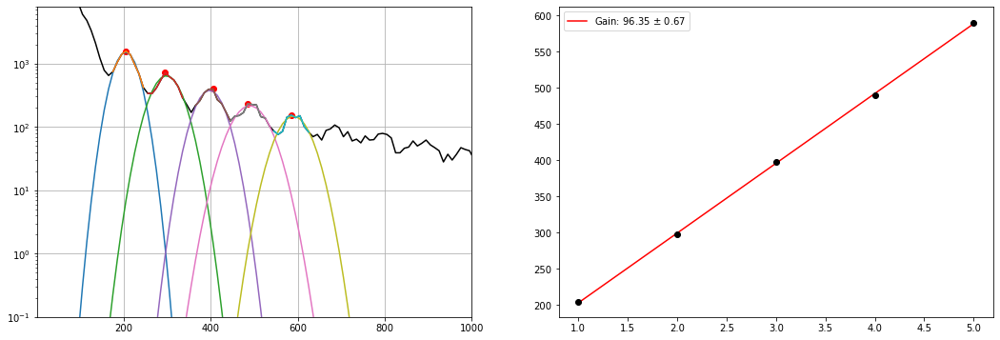

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_33.h5
Guess:  [1547, 205.0375457875458, 10]
Params:  [1473.75713094  203.4066389    24.98635408]
Guess:  [709, 295.0540293040293, 10]
Params:  [674.71434451 297.13538355  29.49656732]
Guess:  [378, 395.0723443223443, 10]
Params:  [377.31495208 394.01725139  30.37515925]
Guess:  [228, 495.09065934065933, 10]
Params:  [224.84252581 491.68036795  32.85404412]
Guess:  [153, 595.1089743589744, 10]
Params:  [151.8370839  591.02843387  32.98877767]


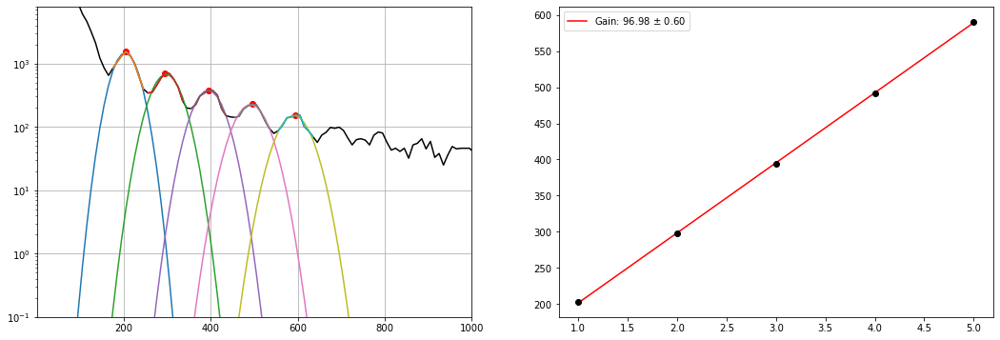

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_32.h5
Guess:  [1403, 205.0375457875458, 10]
Params:  [1350.54733888  204.13344323   26.14277466]
Guess:  [641, 305.0558608058608, 10]
Params:  [628.56196224 299.38111562  29.13377892]
Guess:  [375, 395.0723443223443, 10]
Params:  [365.79642303 396.41967127  29.98969028]
Guess:  [220, 505.09249084249086, 10]
Params:  [208.2759198  493.31078575  36.36976153]
Guess:  [158, 585.1071428571429, 10]
Params:  [140.32947672 590.21542486  34.98459153]


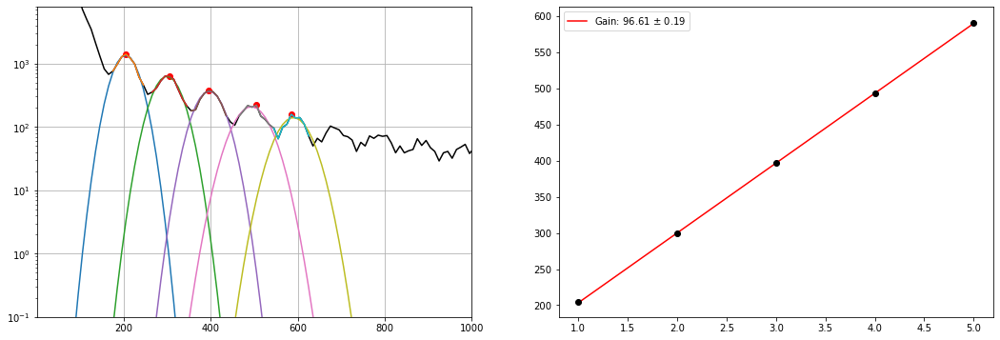

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_31.h5
Guess:  [1540, 205.0375457875458, 10]
Params:  [1491.4759263   204.43669575   23.60254306]
Guess:  [670, 295.0540293040293, 10]
Params:  [646.36114637 297.70010256  30.92242376]
Guess:  [363, 395.0723443223443, 10]
Params:  [351.79010193 395.72865176  30.63272965]
Guess:  [243, 485.0888278388278, 10]
Params:  [219.01029673 491.12476092  35.00668611]
Guess:  [146, 585.1071428571429, 10]
Params:  [139.4900255  594.02924161  42.39363555]


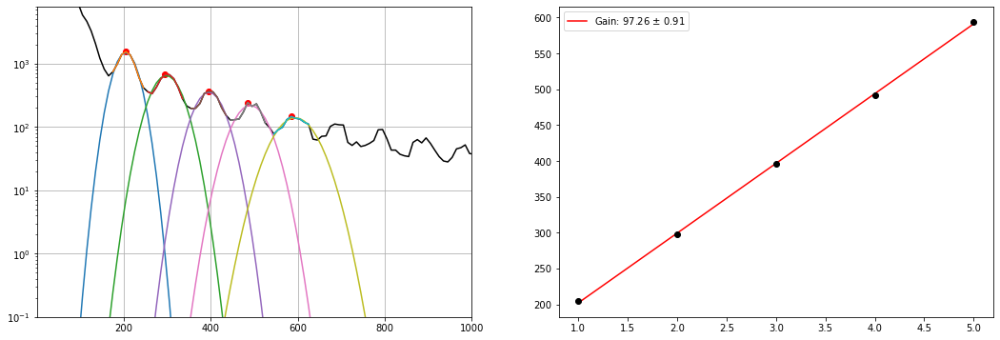

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_30.h5
Guess:  [1442, 205.0375457875458, 10]
Params:  [1400.67588193  204.24755139   24.75505909]
Guess:  [693, 295.0540293040293, 10]
Params:  [663.94142983 298.4566345   30.11071526]
Guess:  [397, 405.0741758241758, 10]
Params:  [373.23459245 398.25226609  28.84567396]
Guess:  [260, 495.09065934065933, 10]
Params:  [220.8118265  493.76713599  32.16858426]
Guess:  [162, 595.1089743589744, 10]
Params:  [144.63999481 590.55188024  35.06059873]


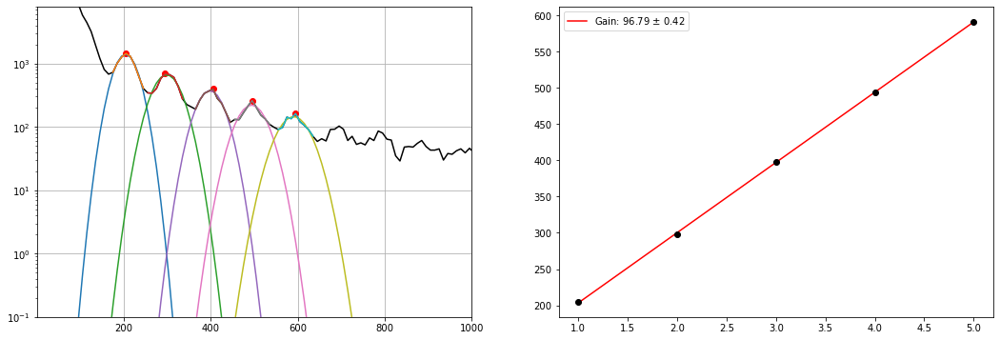

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_29.h5
Guess:  [1557, 205.0375457875458, 10]
Params:  [1497.21303688  204.26677262   23.98320867]
Guess:  [706, 295.0540293040293, 10]
Params:  [667.07107154 298.61880683  29.59611113]
Guess:  [398, 405.0741758241758, 10]
Params:  [374.7222353  397.53888016  28.54608406]
Guess:  [219, 485.0888278388278, 10]
Params:  [213.58356455 489.86421132  36.92369833]
Guess:  [143, 595.1089743589744, 10]
Params:  [140.35787542 588.41679325  40.21432607]


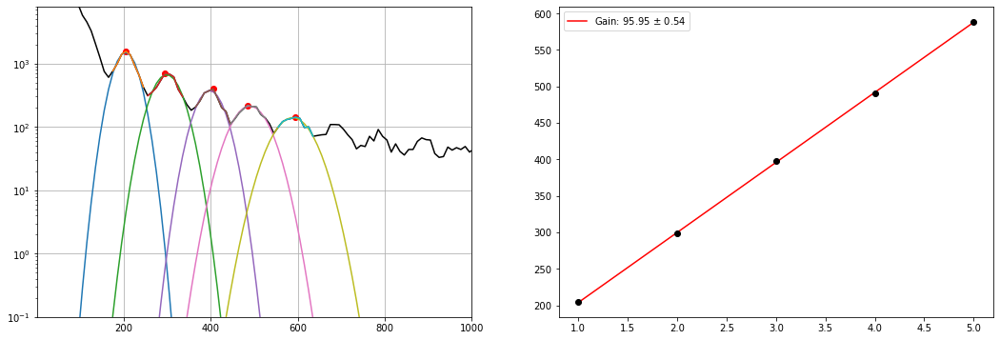

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_28.h5
Guess:  [1570, 205.0375457875458, 10]
Params:  [1551.39358604  203.32214865   22.46778306]
Guess:  [680, 295.0540293040293, 10]
Params:  [666.93610574 297.18345517  27.96450432]
Guess:  [389, 395.0723443223443, 10]
Params:  [368.30320885 394.79923506  28.74186042]
Guess:  [254, 495.09065934065933, 10]
Params:  [239.87579453 492.0296686   30.41316037]
Guess:  [163, 585.1071428571429, 10]
Params:  [148.74409418 584.4526556   33.96009812]


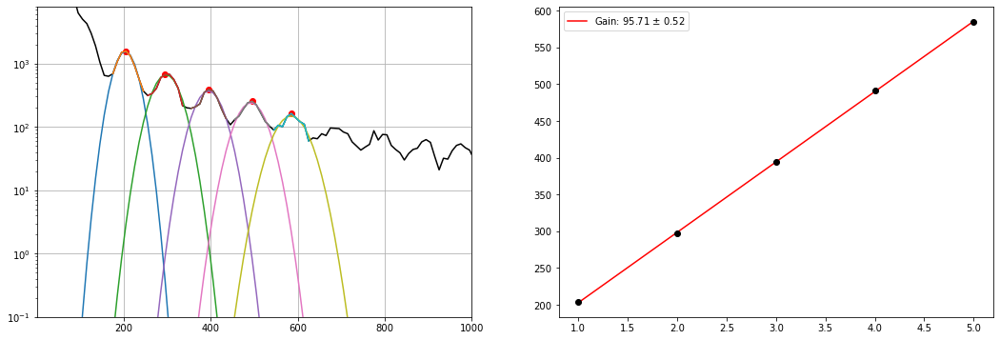

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_27.h5
Guess:  [1466, 205.0375457875458, 10]
Params:  [1437.28128852  203.25080407   22.83865135]
Guess:  [685, 305.0558608058608, 10]
Params:  [664.32991766 299.70234427  25.72265367]
Guess:  [397, 395.0723443223443, 10]
Params:  [372.46299329 395.51188605  28.15196424]
Guess:  [240, 495.09065934065933, 10]
Params:  [214.04342759 493.66474382  29.9761248 ]
Guess:  [162, 595.1089743589744, 10]
Params:  [154.06369603 592.5669022   29.57074154]


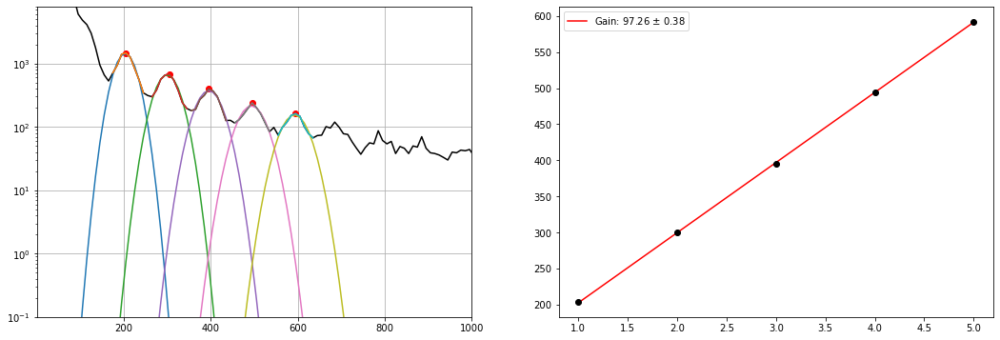

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_26.h5
Guess:  [1412, 205.0375457875458, 10]
Params:  [1392.07333397  203.42238456   26.63696493]
Guess:  [654, 295.0540293040293, 10]
Params:  [626.89823773 299.1474495   32.56710955]
Guess:  [405, 405.0741758241758, 10]
Params:  [372.4028096  398.25695403  29.47680175]
Guess:  [246, 495.09065934065933, 10]
Params:  [222.38124745 494.76533676  32.39337821]
Guess:  [156, 605.1108058608058, 10]
Params:  [138.43436771 593.68895037  39.91581212]


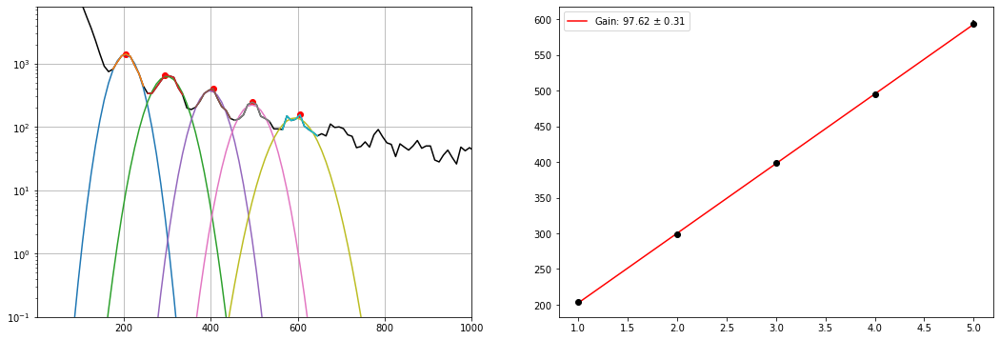

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_25.h5
Guess:  [1511, 205.0375457875458, 10]
Params:  [1458.38253749  204.19329517   24.44300571]
Guess:  [680, 305.0558608058608, 10]
Params:  [671.47231948 300.40459681  28.54886004]
Guess:  [392, 395.0723443223443, 10]
Params:  [361.8566148  396.65259049  32.40447729]
Guess:  [253, 495.09065934065933, 10]
Params:  [241.41674129 493.34804382  27.99135044]
Guess:  [150, 585.1071428571429, 10]
Params:  [137.72247047 589.8586018   41.71896996]


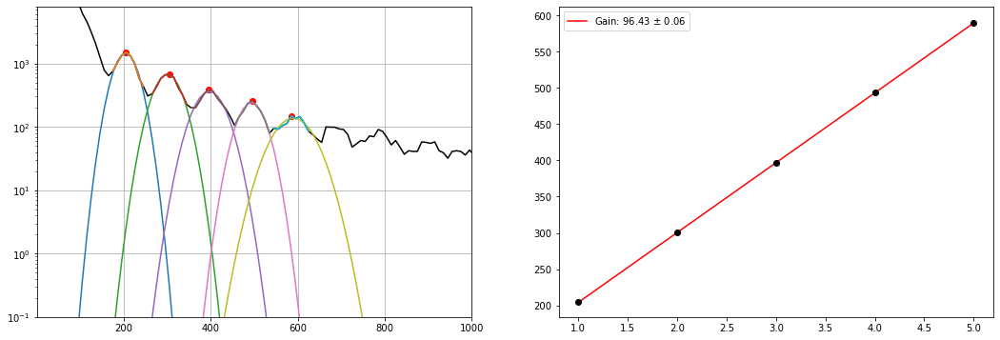

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_24.h5
Guess:  [1512, 205.0375457875458, 10]
Params:  [1515.56321559  203.39745196   23.14418247]
Guess:  [689, 305.0558608058608, 10]
Params:  [687.15574606 299.19630432  26.63231933]
Guess:  [407, 395.0723443223443, 10]
Params:  [398.19471758 394.10057978  27.4472409 ]
Guess:  [236, 485.0888278388278, 10]
Params:  [227.25461412 488.45683416  33.96904875]
Guess:  [153, 585.1071428571429, 10]
Params:  [150.62107307 586.35530698  31.37315407]


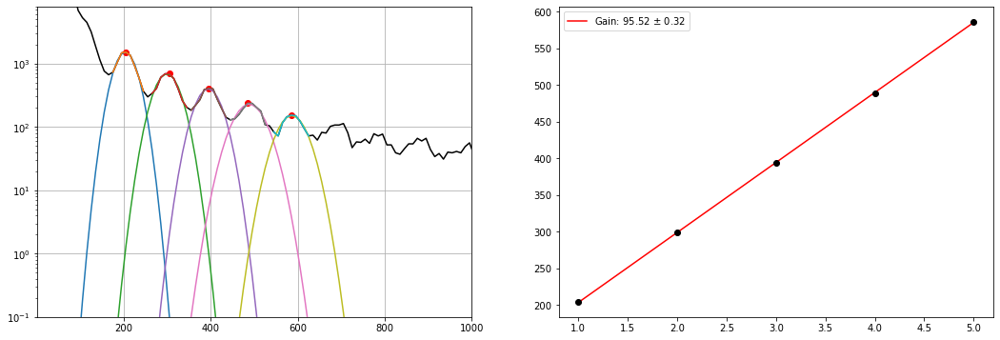

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_23.h5
Guess:  [1487, 205.0375457875458, 10]
Params:  [1487.79082165  202.69977856   23.92913707]
Guess:  [714, 295.0540293040293, 10]
Params:  [685.916944   297.54855153  27.65796905]
Guess:  [438, 395.0723443223443, 10]
Params:  [388.71448596 395.34877002  28.17894752]
Guess:  [253, 495.09065934065933, 10]
Params:  [227.54448015 493.22110561  31.63524921]
Guess:  [154, 595.1089743589744, 10]
Params:  [142.07845252 591.34227302  36.02709374]


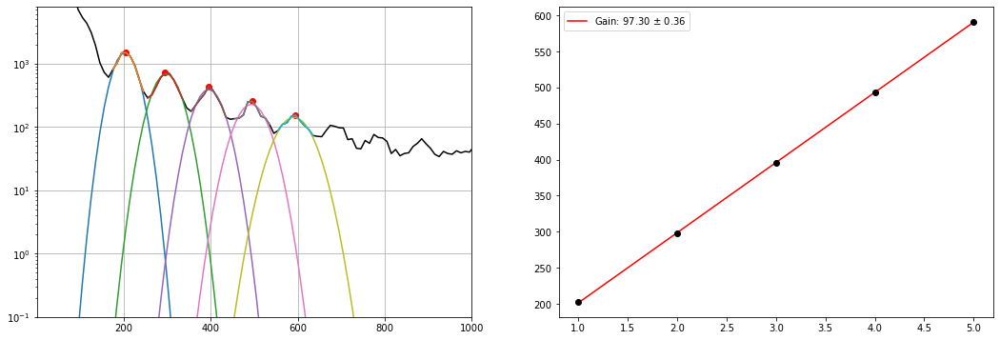

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_22.h5
Guess:  [1527, 205.0375457875458, 10]
Params:  [1469.78443583  204.10517696   23.09835859]
Guess:  [651, 305.0558608058608, 10]
Params:  [650.9803805  300.43471081  27.20008378]
Guess:  [375, 395.0723443223443, 10]
Params:  [358.09239143 394.9968195   29.55124943]
Guess:  [227, 485.0888278388278, 10]
Params:  [219.88146975 492.67244769  35.0921016 ]
Guess:  [170, 595.1089743589744, 10]
Params:  [142.38475379 592.50512775  32.06314364]


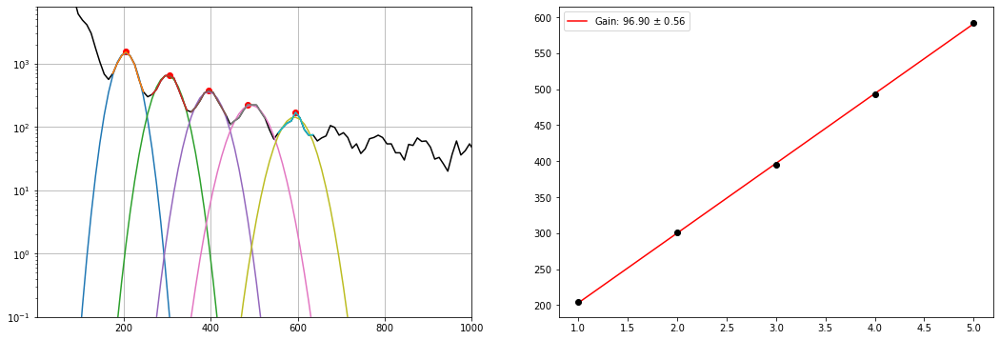

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_21.h5
Guess:  [1495, 205.0375457875458, 10]
Params:  [1416.20841485  203.58301871   24.28873107]
Guess:  [693, 305.0558608058608, 10]
Params:  [666.31973476 299.79957722  26.61946739]
Guess:  [389, 395.0723443223443, 10]
Params:  [372.37373912 395.25608272  29.55040821]
Guess:  [234, 485.0888278388278, 10]
Params:  [221.25469031 490.30663142  35.51275631]
Guess:  [163, 595.1089743589744, 10]
Params:  [146.4000081  592.75750902  32.57930665]


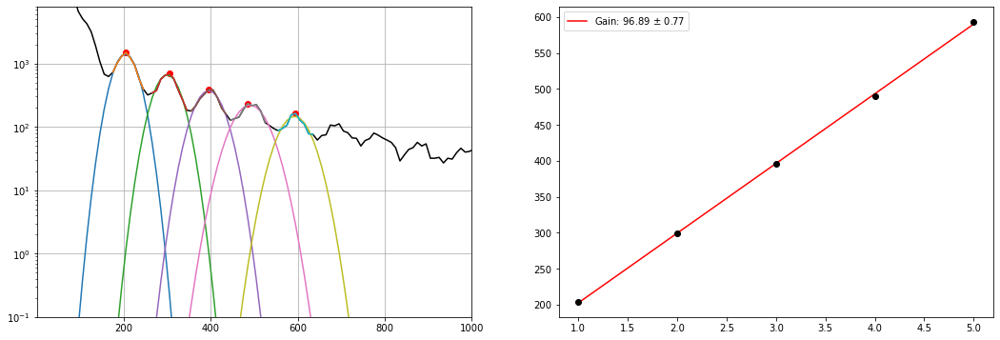

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_20.h5
Guess:  [1463, 205.0375457875458, 10]
Params:  [1445.97498002  203.64073549   25.0719423 ]
Guess:  [671, 305.0558608058608, 10]
Params:  [655.28110364 300.06922495  27.30919131]
Guess:  [352, 395.0723443223443, 10]
Params:  [345.04164562 395.25217521  32.59537145]
Guess:  [268, 495.09065934065933, 10]
Params:  [232.72068194 495.37186572  29.52881985]
Guess:  [147, 595.1089743589744, 10]
Params:  [134.64851361 589.46570085  42.48461643]


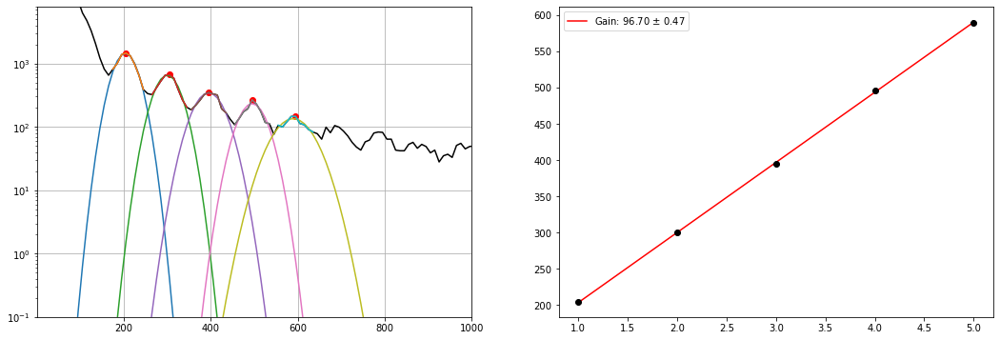

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_19.h5
Guess:  [1513, 205.0375457875458, 10]
Params:  [1427.05059335  204.2179985    24.55642409]
Guess:  [679, 295.0540293040293, 10]
Params:  [637.14461437 297.96888277  30.64856569]
Guess:  [364, 405.0741758241758, 10]
Params:  [353.89057291 396.42492208  30.88236804]
Guess:  [244, 495.09065934065933, 10]
Params:  [223.82298798 491.25870936  32.34855257]
Guess:  [160, 595.1089743589744, 10]
Params:  [152.9069447  589.12519418  33.10697869]


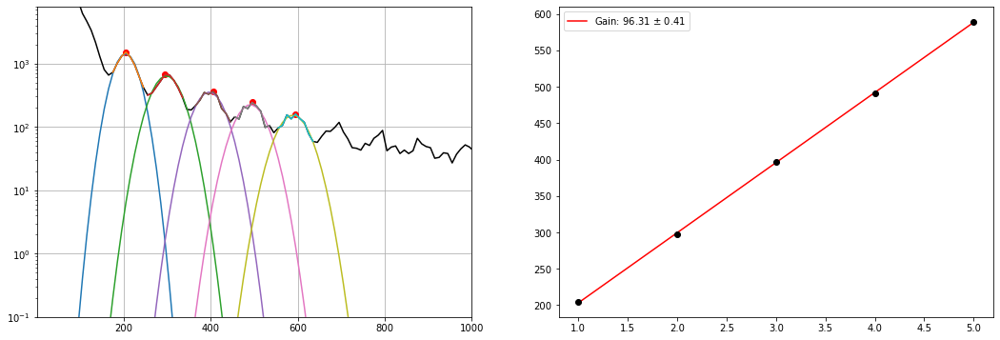

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_18.h5
Guess:  [1419, 205.0375457875458, 10]
Params:  [1386.08677961  204.38889464   25.34743625]
Guess:  [748, 295.0540293040293, 10]
Params:  [668.68839592 298.29001959  28.08534431]
Guess:  [401, 405.0741758241758, 10]
Params:  [352.3254782  398.58451971  31.46854084]
Guess:  [216, 495.09065934065933, 10]
Params:  [211.46370575 490.88168224  32.7286046 ]
Guess:  [150, 585.1071428571429, 10]
Params:  [141.87631875 586.66861659  34.14051046]


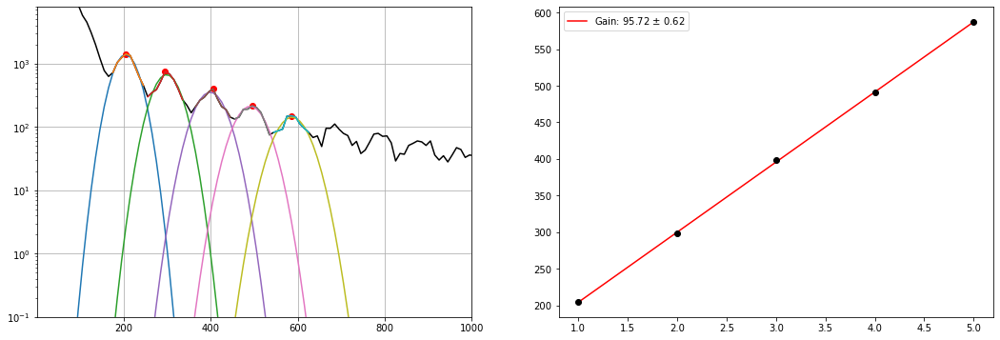

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_17.h5
Guess:  [1630, 205.0375457875458, 10]
Params:  [1491.7330378   203.16494289   23.52020448]
Guess:  [762, 295.0540293040293, 10]
Params:  [707.63662687 298.07010862  26.95501633]
Guess:  [409, 395.0723443223443, 10]
Params:  [387.77264545 396.44364203  29.51143728]
Guess:  [247, 495.09065934065933, 10]
Params:  [228.02696632 492.0910136   29.53681142]
Guess:  [180, 595.1089743589744, 10]
Params:  [157.31452853 588.23220454  31.95961872]


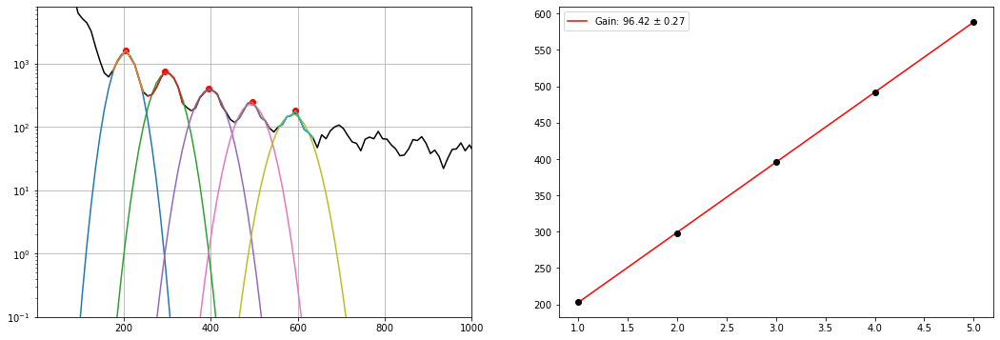

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_16.h5
Guess:  [1516, 205.0375457875458, 10]
Params:  [1494.77459242  203.79275023   24.10132667]
Guess:  [694, 295.0540293040293, 10]
Params:  [660.61268663 298.57644781  29.92589165]
Guess:  [380, 395.0723443223443, 10]
Params:  [354.33379144 394.69537376  31.54616282]
Guess:  [241, 495.09065934065933, 10]
Params:  [230.99896427 495.19397661  31.47560989]
Guess:  [154, 595.1089743589744, 10]
Params:  [149.66858123 587.40939169  33.36653904]


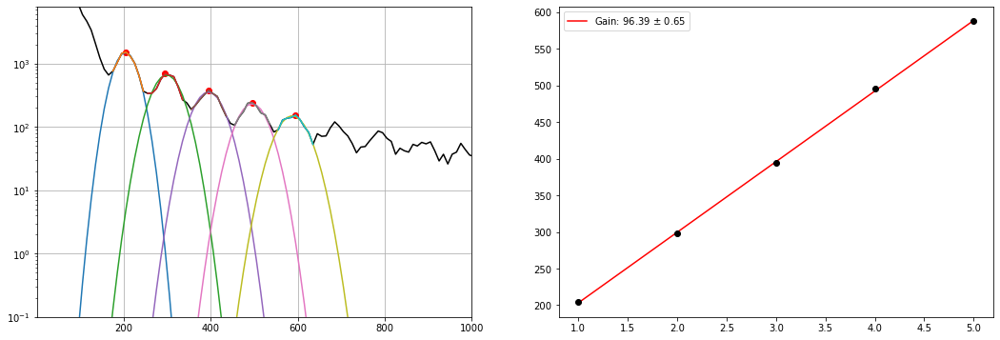

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_15.h5
Guess:  [1516, 205.0375457875458, 10]
Params:  [1496.44549612  203.45476371   23.86931654]
Guess:  [715, 295.0540293040293, 10]
Params:  [692.52578609 298.37426949  26.64811215]
Guess:  [390, 395.0723443223443, 10]
Params:  [370.51991829 395.70145332  30.45833097]
Guess:  [230, 495.09065934065933, 10]
Params:  [222.44660355 491.71199776  33.06933121]
Guess:  [146, 595.1089743589744, 10]
Params:  [142.34253614 590.00690101  34.29763456]


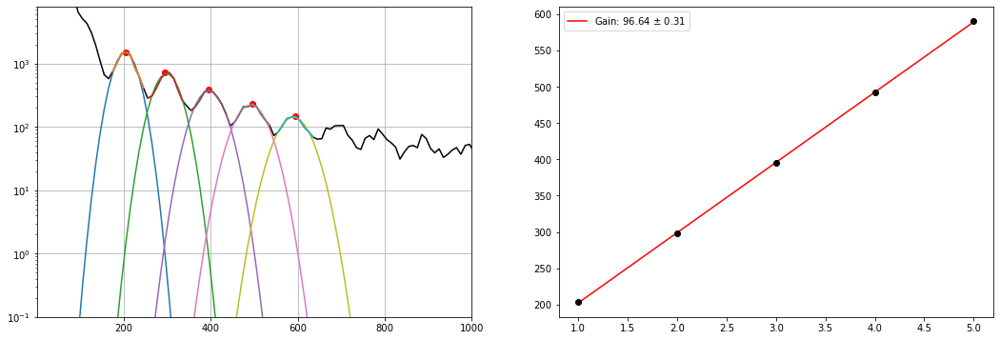

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_14.h5
Guess:  [1611, 205.0375457875458, 10]
Params:  [1545.25974065  203.11145844   22.99638666]
Guess:  [700, 305.0558608058608, 10]
Params:  [677.76612665 299.00274316  26.40185705]
Guess:  [405, 395.0723443223443, 10]
Params:  [376.22515697 394.36752873  28.94699291]
Guess:  [272, 495.09065934065933, 10]
Params:  [237.41170409 494.42687982  30.86163062]
Guess:  [169, 595.1089743589744, 10]
Params:  [154.83169766 590.59050147  30.68505051]


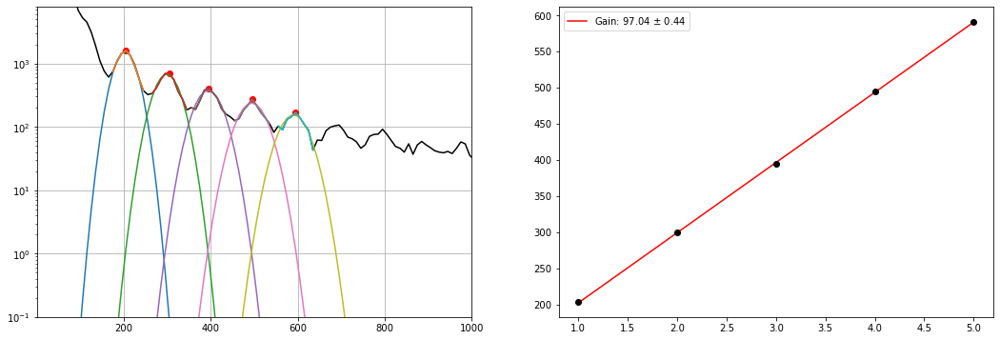

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_13.h5
Guess:  [1542, 205.0375457875458, 10]
Params:  [1499.17293725  203.36765493   23.27869732]
Guess:  [677, 295.0540293040293, 10]
Params:  [658.61833457 298.45828927  27.68978422]
Guess:  [368, 395.0723443223443, 10]
Params:  [356.55196861 394.5070366   30.18719261]
Guess:  [229, 495.09065934065933, 10]
Params:  [228.26035087 492.32343283  31.14991511]
Guess:  [160, 605.1108058608058, 10]
Params:  [147.46839422 591.00036497  35.89161853]


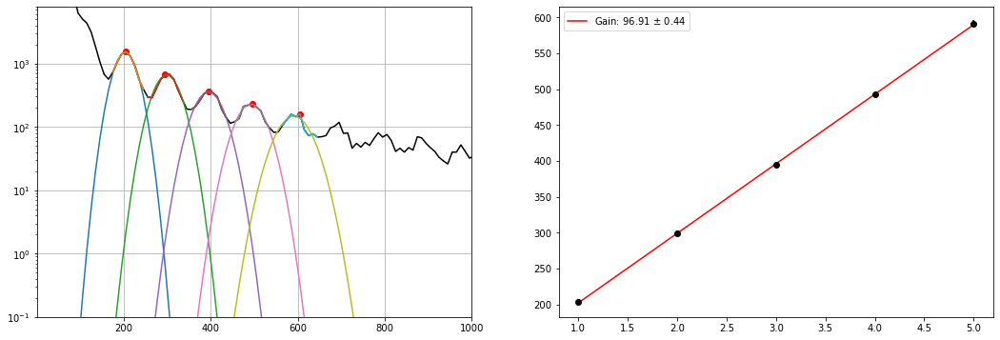

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_12.h5
Guess:  [1579, 205.0375457875458, 10]
Params:  [1535.29736568  203.90904319   23.21852328]
Guess:  [760, 295.0540293040293, 10]
Params:  [691.14709485 297.79877851  27.51780361]
Guess:  [413, 405.0741758241758, 10]
Params:  [376.58171533 396.17812444  30.08268151]
Guess:  [276, 495.09065934065933, 10]
Params:  [243.90316556 492.91720982  30.61955179]
Guess:  [172, 595.1089743589744, 10]
Params:  [155.05681088 589.97314217  30.65049679]


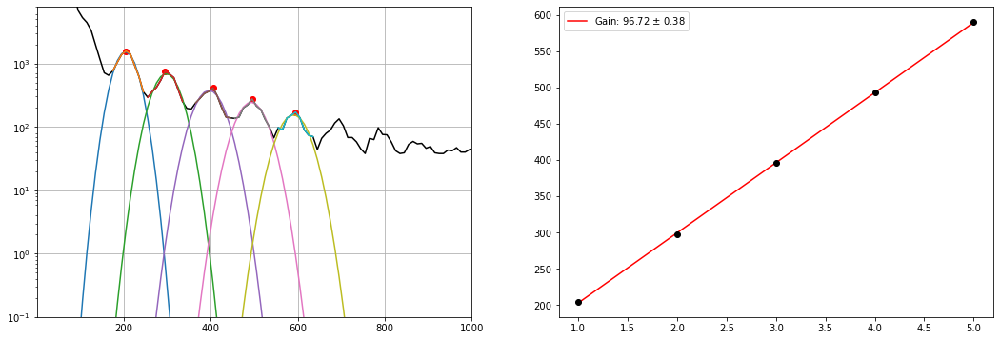

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_11.h5
Guess:  [1557, 205.0375457875458, 10]
Params:  [1494.56059873  203.68386349   23.27523545]
Guess:  [707, 305.0558608058608, 10]
Params:  [699.09688803 300.25329671  26.68591281]
Guess:  [397, 395.0723443223443, 10]
Params:  [369.09861083 395.31107799  29.74027175]
Guess:  [255, 495.09065934065933, 10]
Params:  [242.12347568 495.08875439  29.64677874]
Guess:  [157, 595.1089743589744, 10]
Params:  [148.06817021 589.26131406  37.49320575]


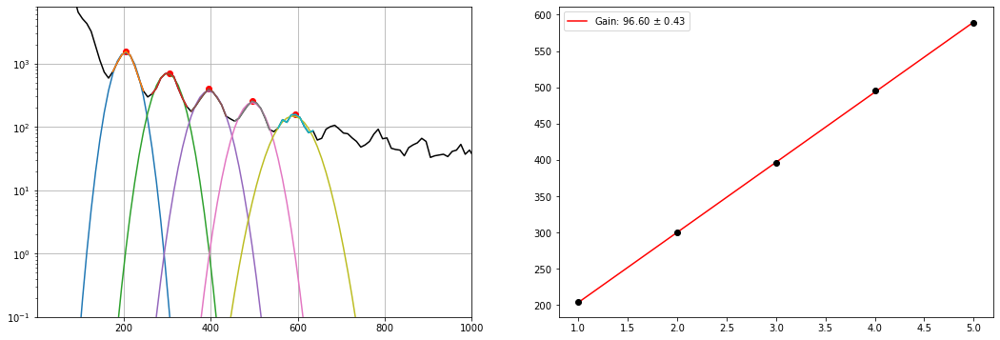

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_10.h5
Guess:  [1599, 205.0375457875458, 10]
Params:  [1570.92093449  203.3407446    22.20057356]
Guess:  [697, 295.0540293040293, 10]
Params:  [672.51862838 297.63027234  27.1586286 ]
Guess:  [417, 395.0723443223443, 10]
Params:  [388.26708611 394.63157793  28.90232322]
Guess:  [234, 505.09249084249086, 10]
Params:  [227.73528233 495.59714803  31.37123377]
Guess:  [149, 595.1089743589744, 10]
Params:  [136.32003959 594.06416976  34.16429894]


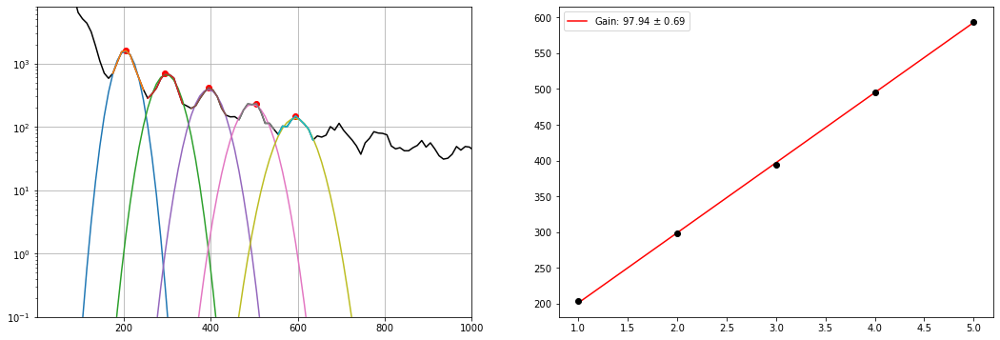

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_9.h5
Guess:  [1519, 205.0375457875458, 10]
Params:  [1476.22668856  203.23628586   23.30338414]
Guess:  [701, 305.0558608058608, 10]
Params:  [688.48342012 300.80643528  26.21518184]
Guess:  [390, 385.0705128205128, 10]
Params:  [358.76960249 390.88150728  35.70872525]
Guess:  [202, 495.09065934065933, 10]
Params:  [197.17170807 493.58071329  35.43196589]
Guess:  [162, 585.1071428571429, 10]
Params:  [142.45414839 586.9887613   38.6544493 ]


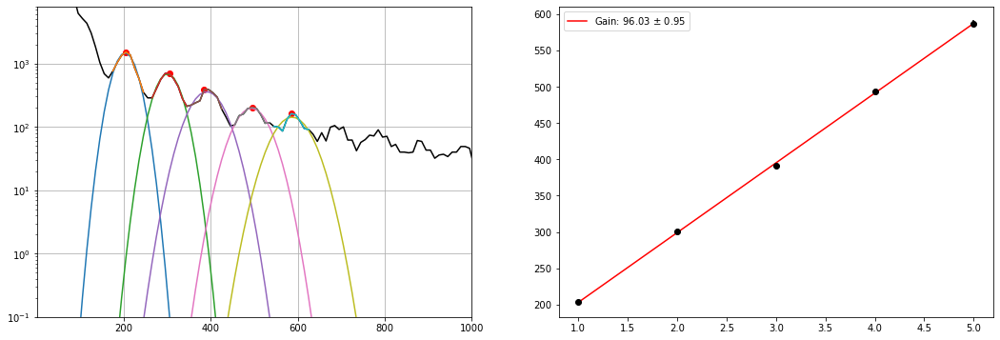

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_8.h5
Guess:  [1543, 205.0375457875458, 10]
Params:  [1511.3061854   203.79227523   23.42684524]
Guess:  [719, 305.0558608058608, 10]
Params:  [700.02330467 300.20254865  25.75426787]
Guess:  [415, 395.0723443223443, 10]
Params:  [392.69894816 395.22038988  28.47378753]
Guess:  [229, 505.09249084249086, 10]
Params:  [210.87224051 494.02014883  32.2357353 ]
Guess:  [155, 595.1089743589744, 10]
Params:  [143.3303901  588.13023118  36.20459892]


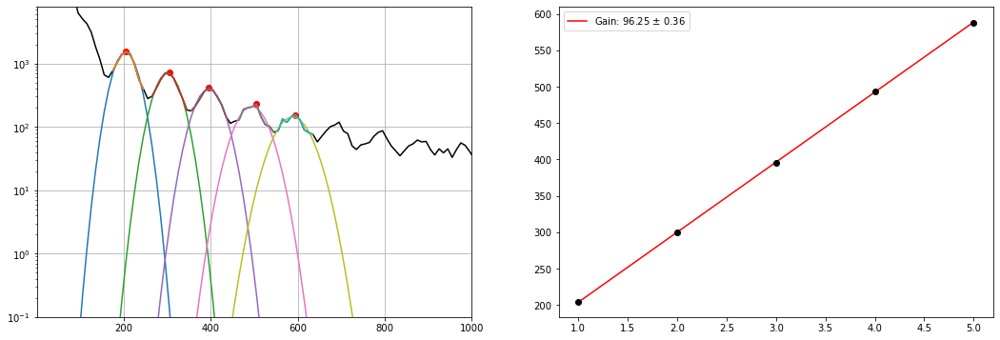

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_7.h5
Guess:  [1549, 205.0375457875458, 10]
Params:  [1487.39407014  204.30816162   23.60660838]
Guess:  [717, 295.0540293040293, 10]
Params:  [657.34856824 299.27420224  28.97863069]
Guess:  [402, 395.0723443223443, 10]
Params:  [380.30219839 395.30719623  30.11026072]
Guess:  [253, 495.09065934065933, 10]
Params:  [226.5137983  492.60045398  31.51946567]
Guess:  [164, 595.1089743589744, 10]
Params:  [164.66770233 590.34456387  29.26884852]


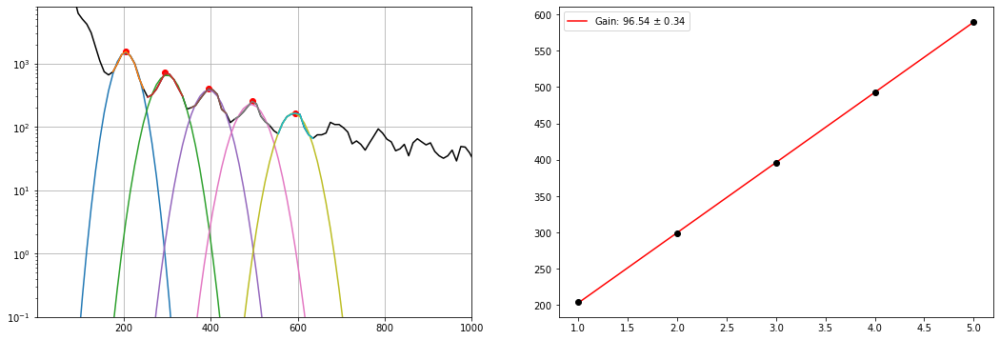

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_6.h5
Guess:  [1578, 205.0375457875458, 10]
Params:  [1524.21665845  203.12538401   23.29410787]
Guess:  [716, 305.0558608058608, 10]
Params:  [686.25626035 300.33339928  26.63365191]
Guess:  [388, 395.0723443223443, 10]
Params:  [359.85683292 396.66057959  30.40504414]
Guess:  [251, 495.09065934065933, 10]
Params:  [235.8130507  493.28525886  30.60101292]
Guess:  [163, 595.1089743589744, 10]
Params:  [149.05924268 591.7761905   31.25032392]


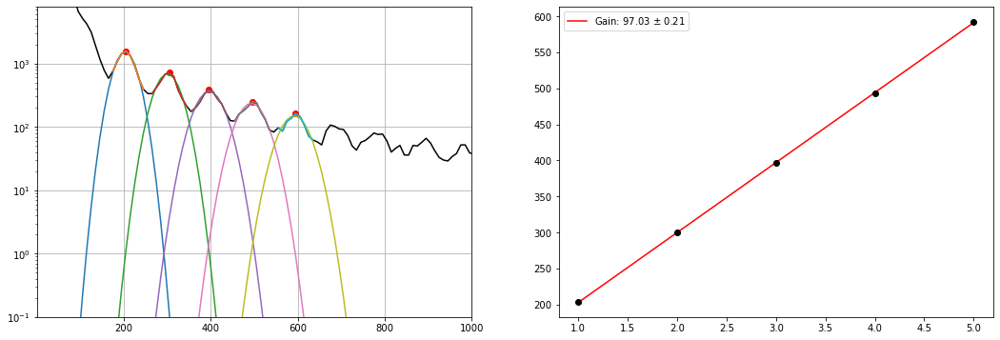

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_5.h5
Guess:  [1587, 205.0375457875458, 10]
Params:  [1529.6215049   203.98086303   22.81926234]
Guess:  [759, 295.0540293040293, 10]
Params:  [702.31950349 297.95669467  26.61084286]
Guess:  [390, 405.0741758241758, 10]
Params:  [375.18179237 395.64987415  28.16773639]
Guess:  [262, 495.09065934065933, 10]
Params:  [233.64844682 493.36614577  30.81664315]
Guess:  [161, 595.1089743589744, 10]
Params:  [154.12995874 589.02641142  29.16140009]


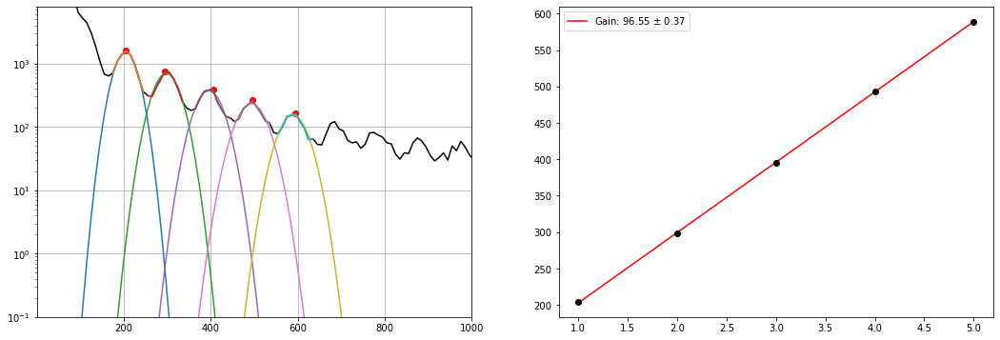

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_4.h5
Guess:  [1448, 205.0375457875458, 10]
Params:  [1433.4609211   204.10278586   22.45215605]
Guess:  [679, 305.0558608058608, 10]
Params:  [644.83221756 299.62624503  26.10254018]
Guess:  [363, 405.0741758241758, 10]
Params:  [343.67472494 397.01623722  28.71895853]
Guess:  [214, 495.09065934065933, 10]
Params:  [207.0079016  494.067677    31.72193035]
Guess:  [154, 585.1071428571429, 10]
Params:  [139.21041277 588.83798878  37.6274641 ]


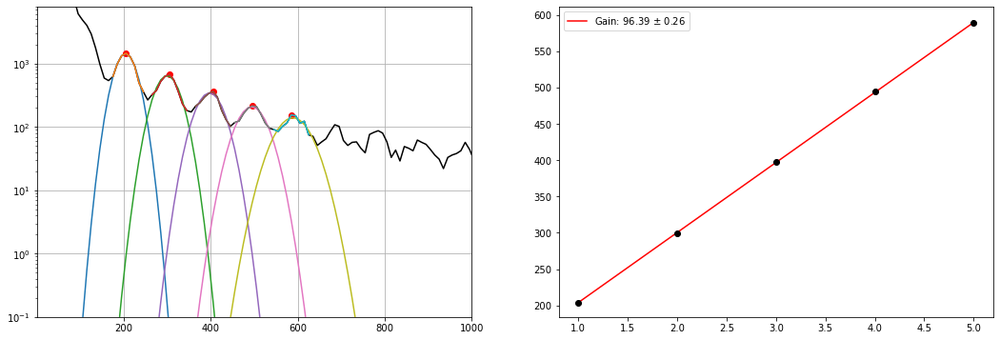

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_3.h5
Guess:  [1525, 205.0375457875458, 10]
Params:  [1455.53715101  203.80304723   24.30050713]
Guess:  [695, 295.0540293040293, 10]
Params:  [660.35868737 299.64185027  28.8520859 ]
Guess:  [384, 395.0723443223443, 10]
Params:  [377.74077744 395.54572949  29.01252615]
Guess:  [254, 485.0888278388278, 10]
Params:  [234.37165277 488.80281179  33.59702663]
Guess:  [158, 585.1071428571429, 10]
Params:  [142.61055841 589.37284012  39.75630321]


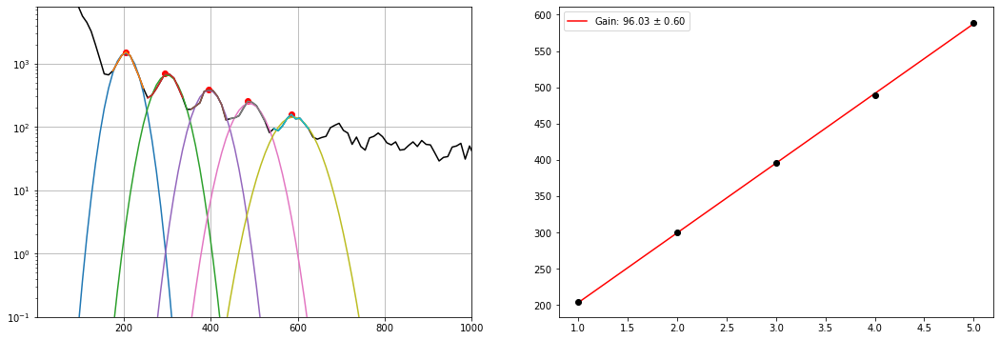

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_2.h5
Guess:  [1434, 205.0375457875458, 10]
Params:  [1385.13769742  204.25925272   25.47858205]
Guess:  [715, 305.0558608058608, 10]
Params:  [669.68581655 300.43742996  27.97316557]
Guess:  [359, 405.0741758241758, 10]
Params:  [355.16524254 397.7557636   31.3181558 ]
Guess:  [244, 495.09065934065933, 10]
Params:  [220.8177972  493.98428541  34.6735055 ]
Guess:  [159, 585.1071428571429, 10]
Params:  [146.27922803 588.4611948   36.00615558]


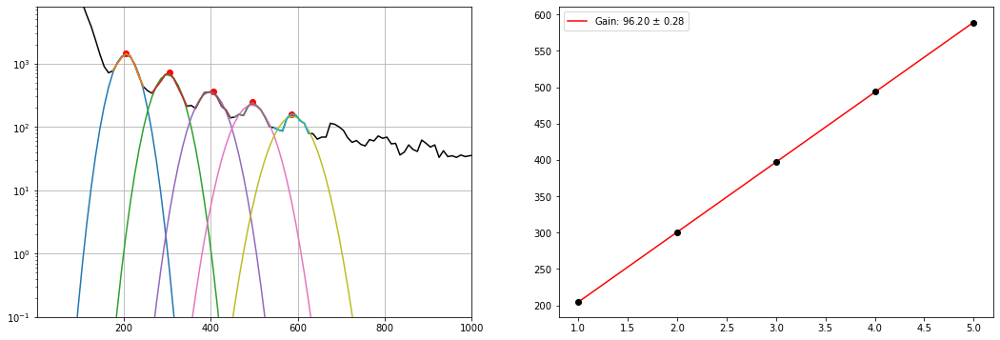

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_1.h5
Guess:  [1326, 205.0375457875458, 10]
Params:  [1352.16499298  204.32511863   27.58686432]
Guess:  [671, 305.0558608058608, 10]
Params:  [634.30828972 299.65859686  30.58372714]
Guess:  [375, 405.0741758241758, 10]
Params:  [354.39891825 399.0988074   31.56593453]
Guess:  [243, 495.09065934065933, 10]
Params:  [228.61721982 493.47875557  35.73978479]
Guess:  [146, 605.1108058608058, 10]
Params:  [130.63163697 594.85669137  42.09567461]


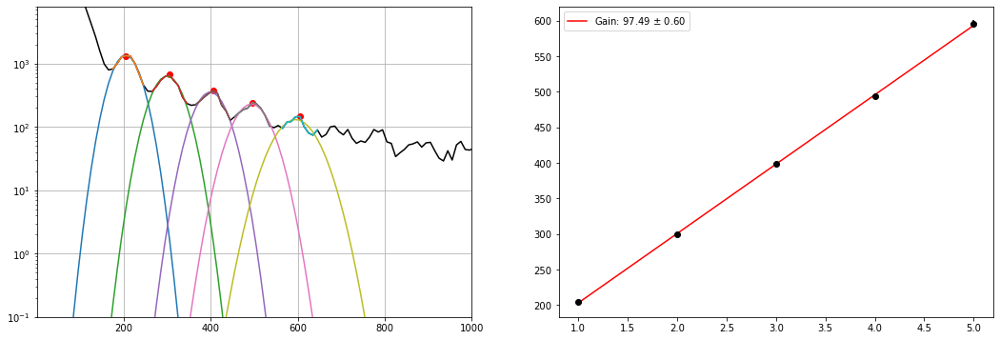

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_source_0.h5
Guess:  [1340, 205.0375457875458, 10]
Params:  [1307.30178709  204.0408482    27.94029339]
Guess:  [673, 305.0558608058608, 10]
Params:  [646.68556092 299.97108294  29.30121095]
Guess:  [359, 395.0723443223443, 10]
Params:  [351.10256467 395.1876152   31.34854722]
Guess:  [218, 485.0888278388278, 10]
Params:  [202.88821797 490.79391978  38.73786191]
Guess:  [141, 585.1071428571429, 10]
Params:  [127.49489801 585.16967292  45.6737198 ]


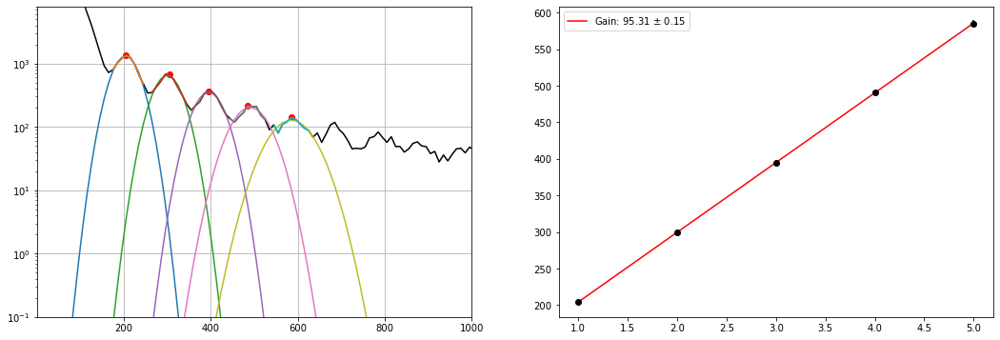

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_34.h5
Guess:  [401, 205.0375457875458, 10]
Params:  [410.13683229 202.55635922  25.64375071]
Guess:  [320, 295.0540293040293, 10]
Params:  [278.14551066 296.62649839  31.55743717]
Guess:  [220, 385.0705128205128, 10]
Params:  [216.97635914 384.0662661   33.69618242]
Guess:  [168, 485.0888278388278, 10]
Params:  [155.48402535 476.7436367   45.26869686]


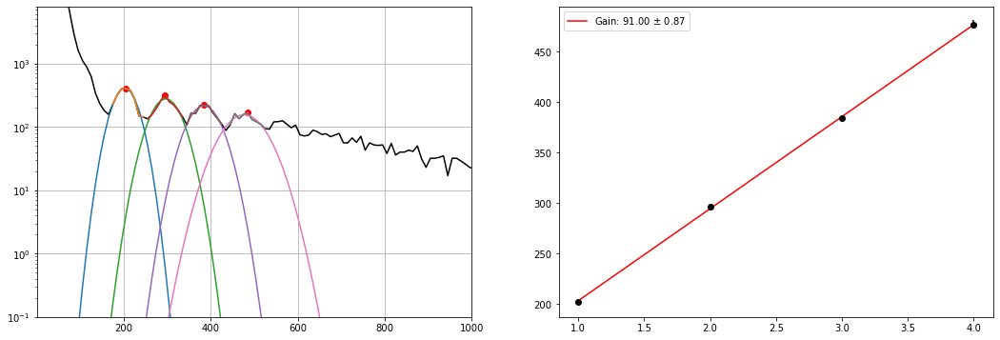

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_33.h5
Guess:  [431, 205.0375457875458, 10]
Params:  [400.98766391 202.46048173  25.38876393]
Guess:  [302, 295.0540293040293, 10]
Params:  [286.79845886 293.7482612   30.05246208]
Guess:  [206, 395.0723443223443, 10]
Params:  [189.12223441 382.56712856  42.46529313]
Guess:  [163, 475.0869963369963, 10]
Params:  [148.30747157 477.46024072  46.60574221]


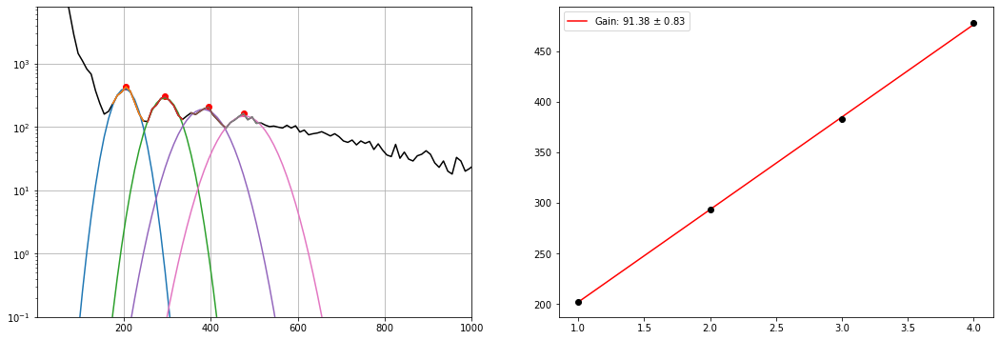

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_32.h5
Guess:  [394, 195.03571428571428, 10]
Params:  [376.44805074 199.8808969   26.29914878]
Guess:  [279, 295.0540293040293, 10]
Params:  [263.02029216 293.21280066  30.43133083]
Guess:  [200, 385.0705128205128, 10]
Params:  [195.69832148 383.19072223  38.88168386]
fit failed


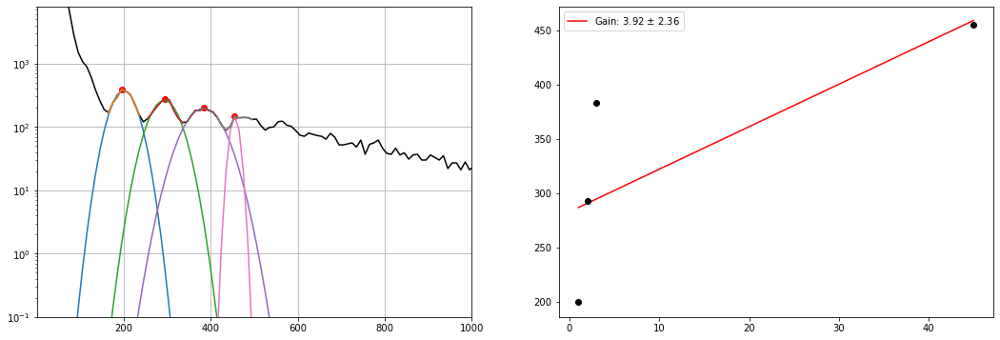

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_31.h5
Guess:  [393, 205.0375457875458, 10]
Params:  [396.58639654 203.29109055  25.44584944]
Guess:  [301, 295.0540293040293, 10]
Params:  [278.21425282 295.12608756  29.04825339]
Guess:  [199, 385.0705128205128, 10]
Params:  [197.4983294  383.47127312  38.55502698]
Guess:  [157, 475.0869963369963, 10]
Params:  [148.35365238 473.56696594  44.70839806]


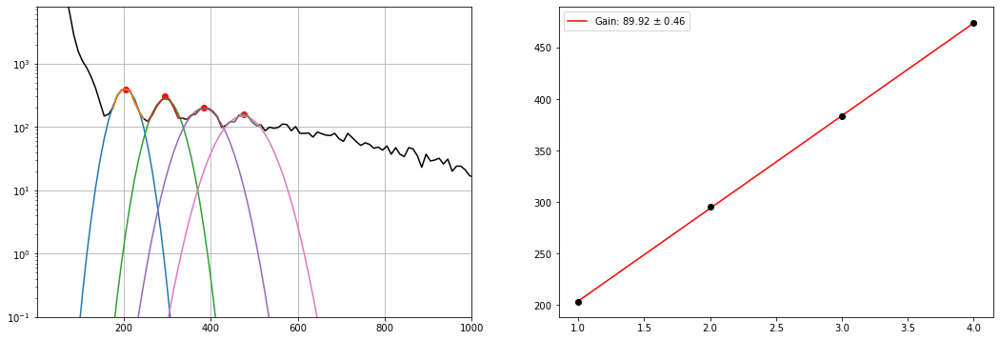

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_30.h5
Guess:  [423, 205.0375457875458, 10]
Params:  [399.65158688 202.95783834  24.75587003]
Guess:  [292, 295.0540293040293, 10]
Params:  [266.54145439 295.45866097  29.04239339]
Guess:  [199, 375.06868131868134, 10]
Params:  [187.10463033 382.37047817  44.79519825]
Guess:  [157, 495.09065934065933, 10]
Params:  [145.73652253 466.55828048  70.18445388]


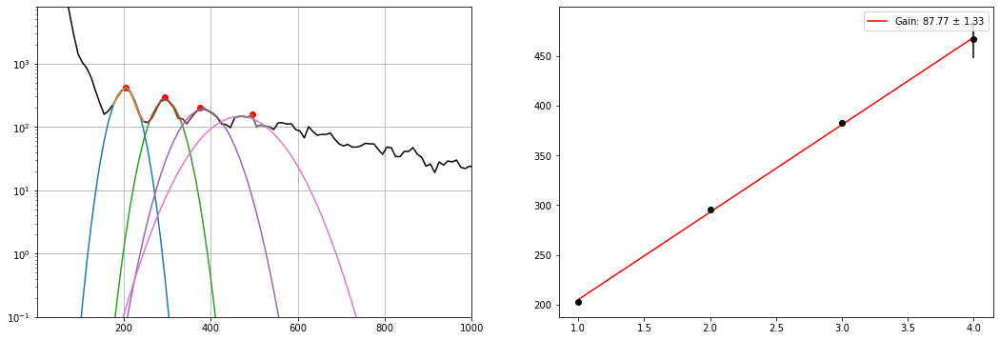

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_29.h5
Guess:  [418, 205.0375457875458, 10]
Params:  [384.9524158  202.36742695  24.85949651]
Guess:  [260, 295.0540293040293, 10]
Params:  [249.95593474 295.03073207  31.72282716]
Guess:  [207, 395.0723443223443, 10]
Params:  [199.80559315 387.17181545  37.19144571]
Guess:  [141, 485.0888278388278, 10]
Params:  [132.35244453 480.60266128  53.34168602]


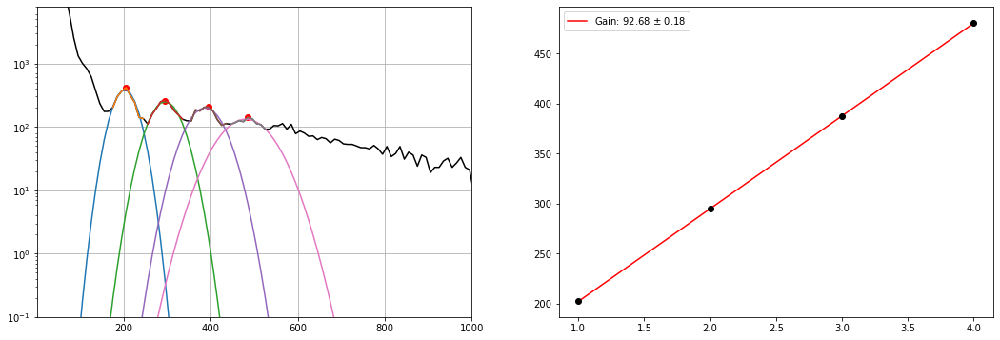

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_28.h5
Guess:  [428, 205.0375457875458, 10]
Params:  [400.75227825 201.9450187   25.48708135]
Guess:  [287, 295.0540293040293, 10]
Params:  [262.70267765 291.6207992   32.58374033]
Guess:  [229, 385.0705128205128, 10]
Params:  [210.94165926 384.87768503  36.37128333]
Guess:  [146, 475.0869963369963, 10]
Params:  [144.64474629 477.12178842  49.95433002]


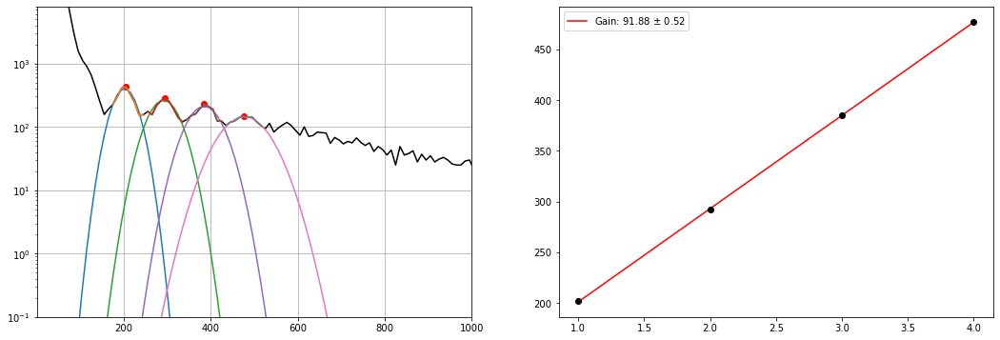

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_27.h5
Guess:  [415, 205.0375457875458, 10]
Params:  [385.50465795 201.62488305  24.54174077]
Guess:  [293, 295.0540293040293, 10]
Params:  [268.70518075 293.99435286  29.16428662]
Guess:  [213, 385.0705128205128, 10]
Params:  [195.97031541 383.90263905  35.01361449]
Guess:  [158, 475.0869963369963, 10]
Params:  [154.72679237 471.20805143  40.51628804]


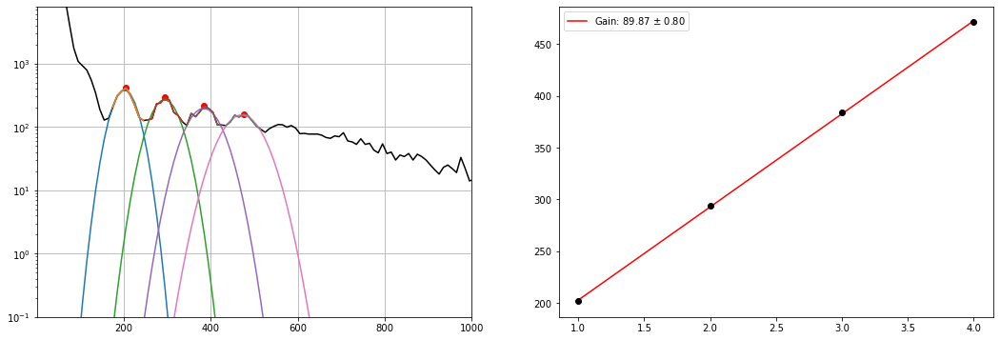

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_26.h5
Guess:  [398, 205.0375457875458, 10]
Params:  [373.0954297  202.40940185  26.12548793]
Guess:  [271, 295.0540293040293, 10]
Params:  [250.46096908 293.24345686  33.0323066 ]
Guess:  [195, 385.0705128205128, 10]
Params:  [176.20444803 388.81264665  51.11230321]
Guess:  [142, 485.0888278388278, 10]
Params:  [139.46346887 480.67634296  52.62019302]


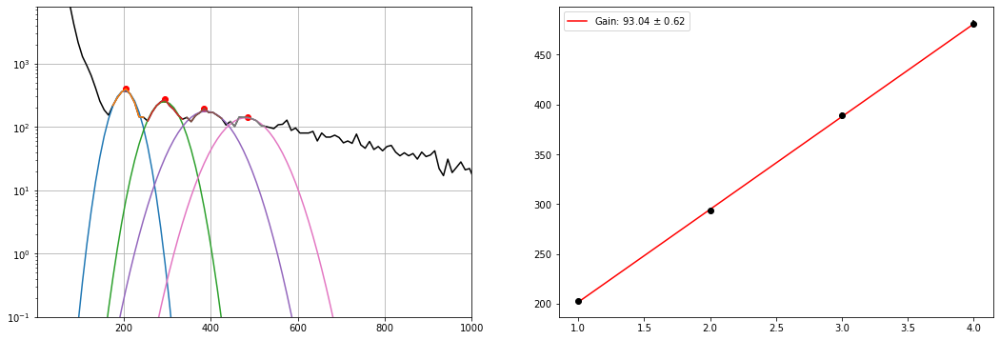

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_25.h5
Guess:  [386, 205.0375457875458, 10]
Params:  [364.93164364 203.87775146  26.98687916]
Guess:  [277, 295.0540293040293, 10]
Params:  [255.30549391 294.10154657  31.80321784]
Guess:  [190, 375.06868131868134, 10]
Params:  [184.90331632 382.51684274  44.69664763]
Guess:  [157, 475.0869963369963, 10]
Params:  [146.29386459 477.02491598  51.36056476]


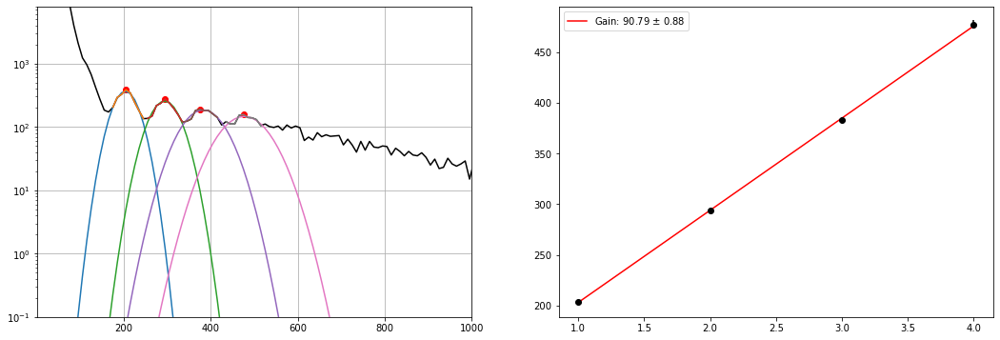

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_24.h5
Guess:  [405, 205.0375457875458, 10]
Params:  [396.7514592  202.45908568  25.36436558]
Guess:  [262, 295.0540293040293, 10]
Params:  [253.10250089 294.73653832  31.76574495]
Guess:  [211, 375.06868131868134, 10]
Params:  [206.42002708 380.99611993  39.05193226]
Guess:  [150, 455.08333333333337, 10]
Params:  [135.34793973 480.99742164 102.67518867]


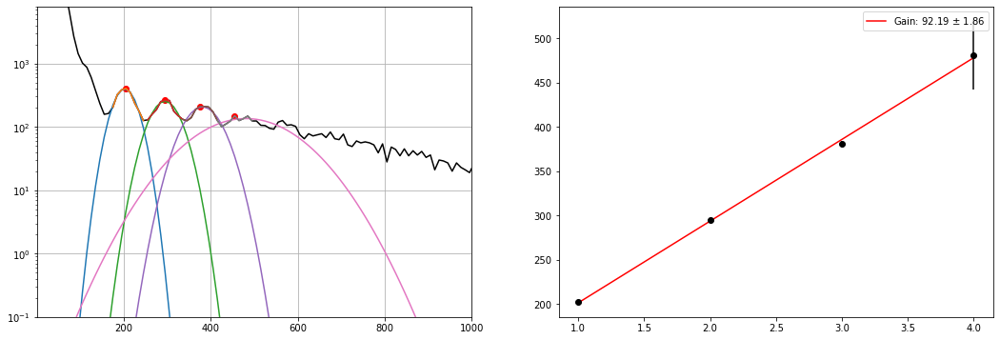

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_23.h5
Guess:  [458, 195.03571428571428, 10]
Params:  [443.20683578 200.35607994  23.53074855]
Guess:  [304, 295.0540293040293, 10]
Params:  [281.50152404 291.89416259  30.26277617]
Guess:  [226, 375.06868131868134, 10]
Params:  [207.6491279  381.78086247  38.25294786]
Guess:  [156, 465.08516483516485, 10]
Params:  [146.99685123 471.38165711  53.02805116]


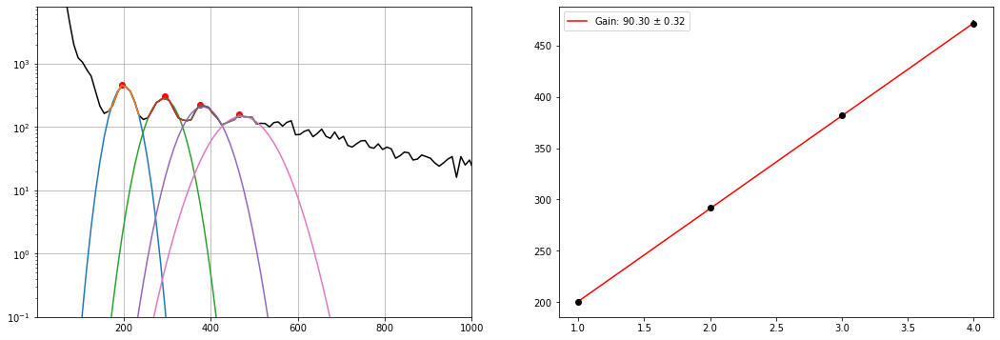

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_22.h5
Guess:  [395, 205.0375457875458, 10]
Params:  [388.01122786 201.4201136   24.42346689]
Guess:  [286, 295.0540293040293, 10]
Params:  [267.83027864 294.12092356  28.72228385]
Guess:  [213, 385.0705128205128, 10]
Params:  [206.28479309 382.0578581   34.74367719]
Guess:  [155, 475.0869963369963, 10]
Params:  [137.62200955 473.87696959  43.66490296]


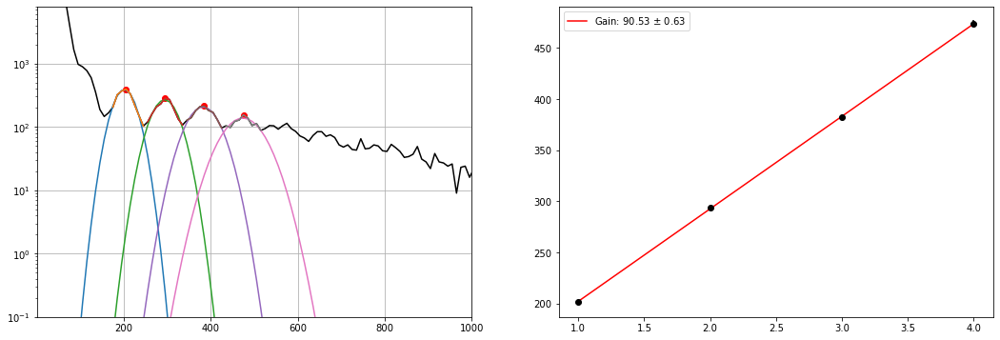

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_21.h5
Guess:  [398, 195.03571428571428, 10]
Params:  [400.536802   199.97505553  25.32540629]
Guess:  [261, 285.05219780219784, 10]
Params:  [249.64878811 291.30832196  33.37608824]
Guess:  [192, 375.06868131868134, 10]
Params:  [188.06386642 380.60663573  36.57515624]
Guess:  [160, 475.0869963369963, 10]
Params:  [144.07331783 477.30962071  54.75687996]


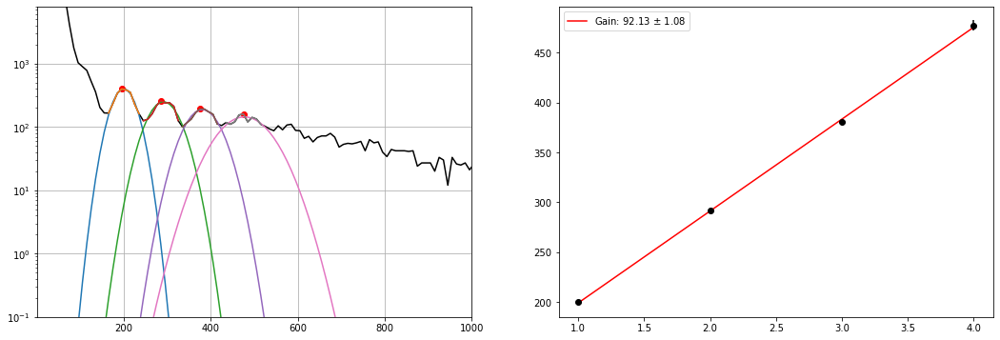

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_20.h5
Guess:  [384, 205.0375457875458, 10]
Params:  [370.60427659 202.32849375  28.18012808]
Guess:  [287, 305.0558608058608, 10]
Params:  [281.9332669  295.14683804  30.65063207]
Guess:  [220, 385.0705128205128, 10]
Params:  [207.62708943 388.25960123  36.67258481]
Guess:  [163, 485.0888278388278, 10]
Params:  [144.37010806 483.16498939  47.75754496]


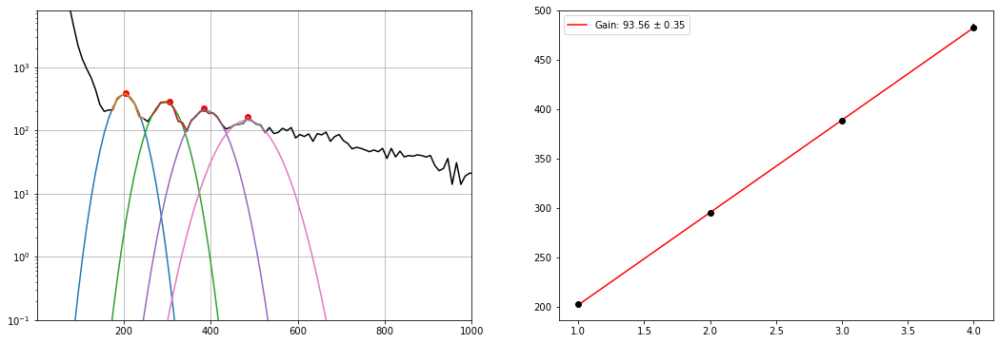

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_19.h5
Guess:  [404, 205.0375457875458, 10]
Params:  [394.8379209  202.80541108  26.34445635]
Guess:  [268, 285.05219780219784, 10]
Params:  [246.81381043 290.32712519  36.46218143]
Guess:  [204, 385.0705128205128, 10]
Params:  [189.90035629 383.79502343  39.26311991]
Guess:  [166, 475.0869963369963, 10]
Params:  [151.2180696  472.02512737  49.27205998]


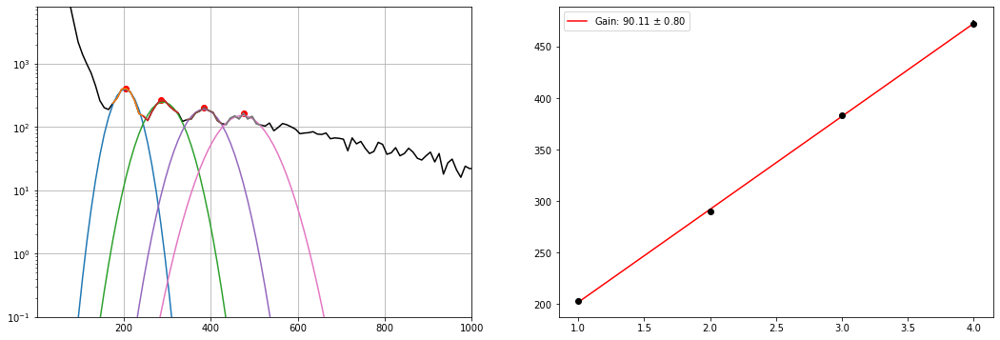

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_18.h5
Guess:  [415, 195.03571428571428, 10]
Params:  [414.68192596 201.19317272  25.78487003]
Guess:  [295, 295.0540293040293, 10]
Params:  [281.32488648 294.2791272   32.85115209]
Guess:  [228, 385.0705128205128, 10]
Params:  [206.88876908 384.01390428  37.60489269]
Guess:  [171, 475.0869963369963, 10]
Params:  [156.54456529 478.33173027  41.92836568]


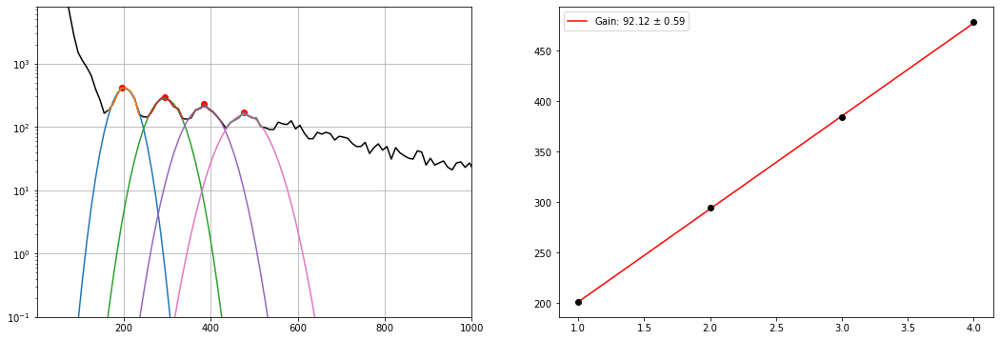

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_17.h5
Guess:  [442, 195.03571428571428, 10]
Params:  [427.46097666 200.21367051  23.47438373]
Guess:  [290, 295.0540293040293, 10]
Params:  [274.98290467 292.49430461  31.76260819]
Guess:  [220, 385.0705128205128, 10]
Params:  [208.53552237 385.15891094  35.89099272]
Guess:  [169, 475.0869963369963, 10]
Params:  [159.844039   473.53022071  44.37395258]


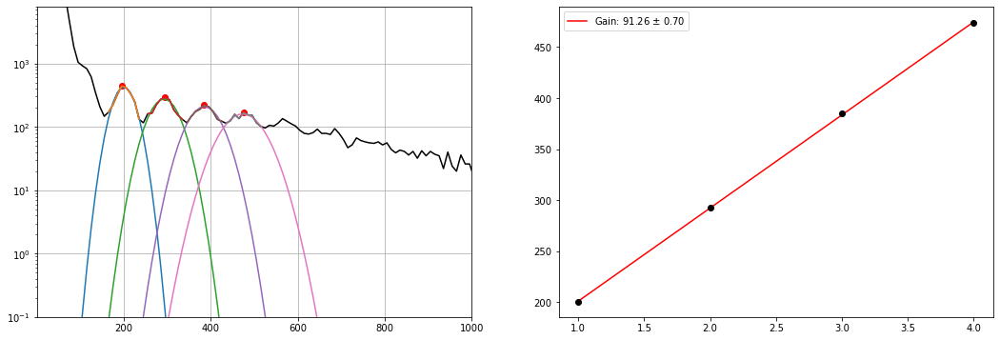

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_16.h5
Guess:  [448, 205.0375457875458, 10]
Params:  [412.78264832 201.19551448  24.77901241]
Guess:  [291, 295.0540293040293, 10]
Params:  [274.74742632 292.91102622  32.45467633]
Guess:  [221, 385.0705128205128, 10]
Params:  [204.83450879 385.45979388  34.51113748]
Guess:  [167, 465.08516483516485, 10]
Params:  [159.58434962 469.64587565  50.76391708]


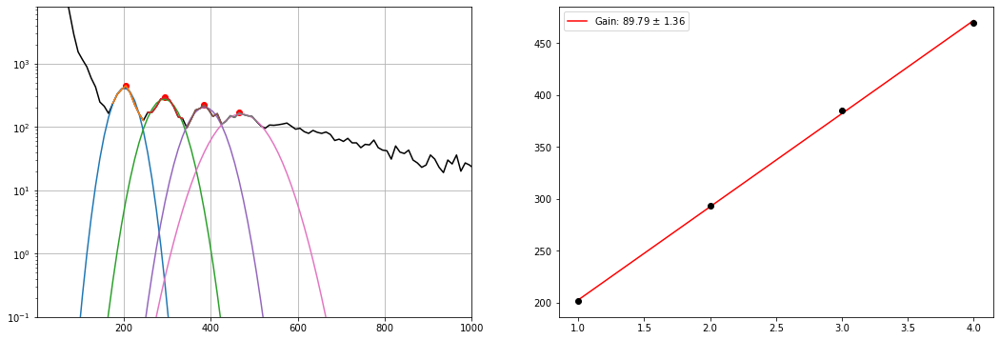

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_15.h5
Guess:  [402, 205.0375457875458, 10]
Params:  [407.33468749 201.60725456  23.65861912]
Guess:  [272, 285.05219780219784, 10]
Params:  [251.74163379 289.59912399  32.35011679]
Guess:  [210, 375.06868131868134, 10]
Params:  [200.09033479 382.33065543  41.12950419]
Guess:  [156, 485.0888278388278, 10]
Params:  [140.926148   481.15250923  47.02140361]


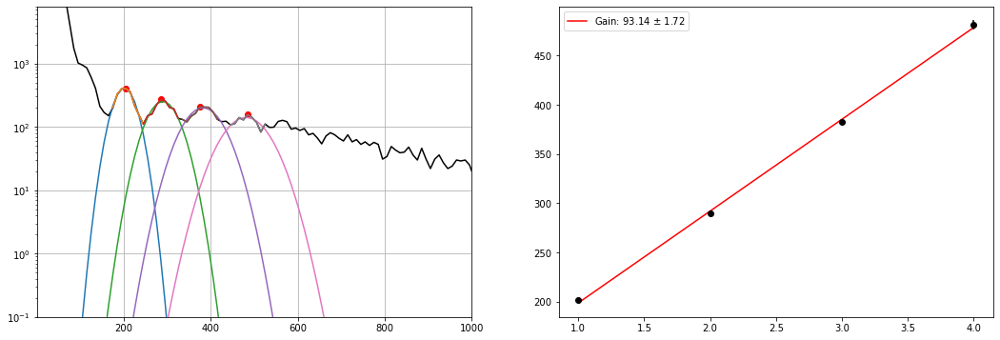

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_14.h5
Guess:  [411, 205.0375457875458, 10]
Params:  [404.72424058 200.26409331  25.90297158]
Guess:  [298, 295.0540293040293, 10]
Params:  [286.99020301 294.26535637  28.89290322]
Guess:  [205, 385.0705128205128, 10]
Params:  [204.5792134  383.95200198  35.91099671]
Guess:  [142, 475.0869963369963, 10]
Params:  [142.43438076 471.79230758  49.01336234]


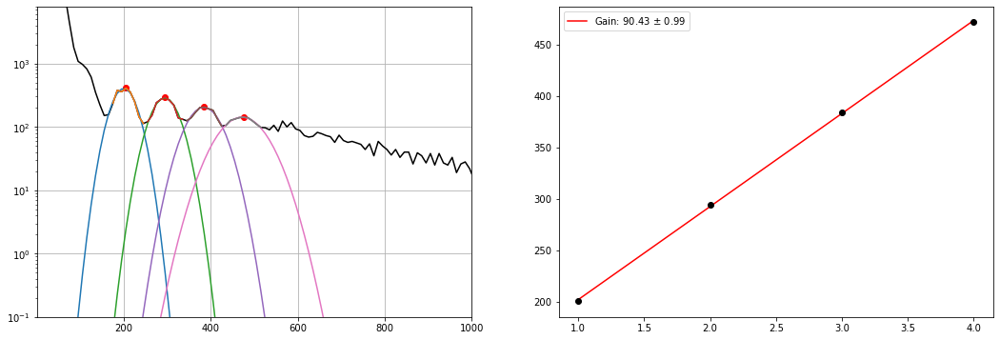

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_13.h5
Guess:  [399, 195.03571428571428, 10]
Params:  [400.33105195 201.03776562  24.01496012]
Guess:  [289, 295.0540293040293, 10]
Params:  [278.10517331 293.21853806  29.58136437]
Guess:  [204, 395.0723443223443, 10]
Params:  [194.75141341 388.8494504   41.34655902]
Guess:  [146, 475.0869963369963, 10]
Params:  [141.46221053 471.49883069  48.97136477]


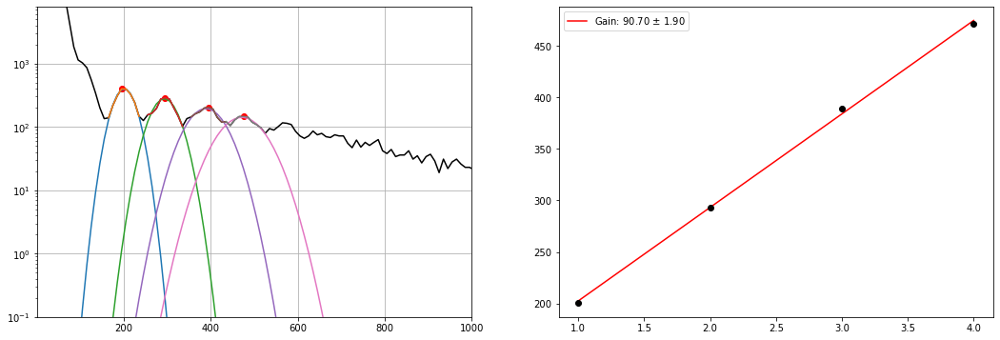

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_12.h5
Guess:  [434, 205.0375457875458, 10]
Params:  [428.51080489 201.9272399   23.57449639]
Guess:  [305, 295.0540293040293, 10]
Params:  [278.8820188  294.20683033  29.1307739 ]
Guess:  [239, 385.0705128205128, 10]
Params:  [211.5871915  385.97649858  35.04854195]
Guess:  [158, 475.0869963369963, 10]
Params:  [155.83400867 475.46085034  41.92923798]


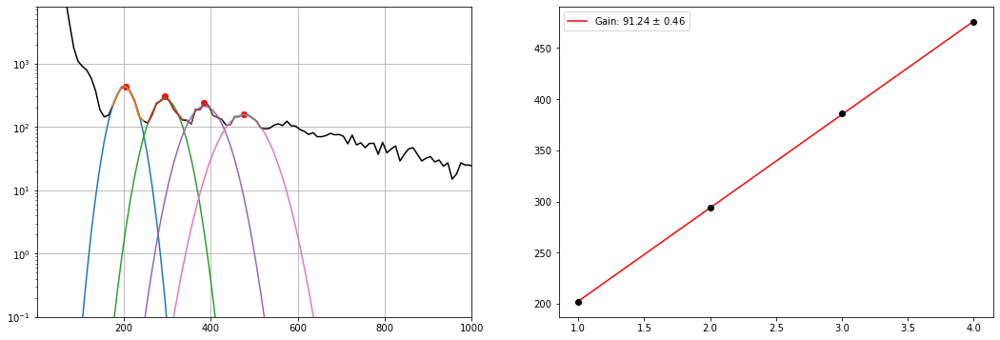

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_11.h5
Guess:  [431, 205.0375457875458, 10]
Params:  [420.00941381 202.63809017  24.49021564]
Guess:  [310, 295.0540293040293, 10]
Params:  [263.17876632 292.76445449  31.03094713]
Guess:  [213, 395.0723443223443, 10]
Params:  [201.31290453 386.41852983  37.61519598]
Guess:  [162, 485.0888278388278, 10]
Params:  [143.29954334 478.28702875  51.73296106]


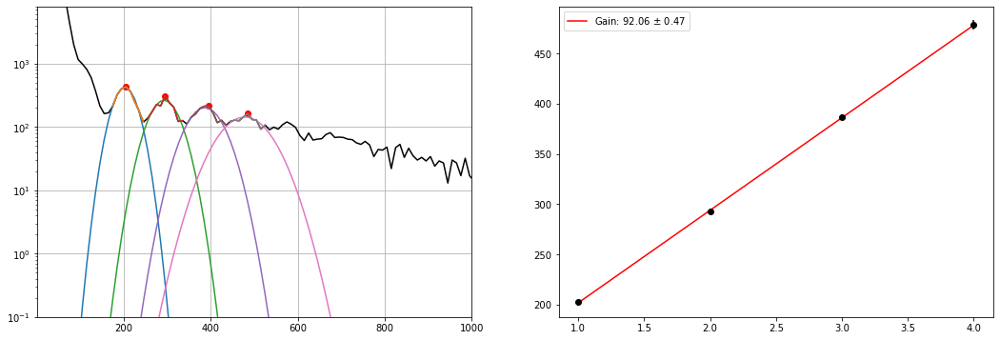

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_10.h5
Guess:  [433, 205.0375457875458, 10]
Params:  [414.09263559 201.44541079  25.06528048]
Guess:  [265, 295.0540293040293, 10]
Params:  [252.24999647 293.45217667  33.36837707]
Guess:  [194, 385.0705128205128, 10]
Params:  [183.41837617 382.84103418  39.34610778]
Guess:  [148, 475.0869963369963, 10]
Params:  [141.54639991 474.5901385   50.53683339]


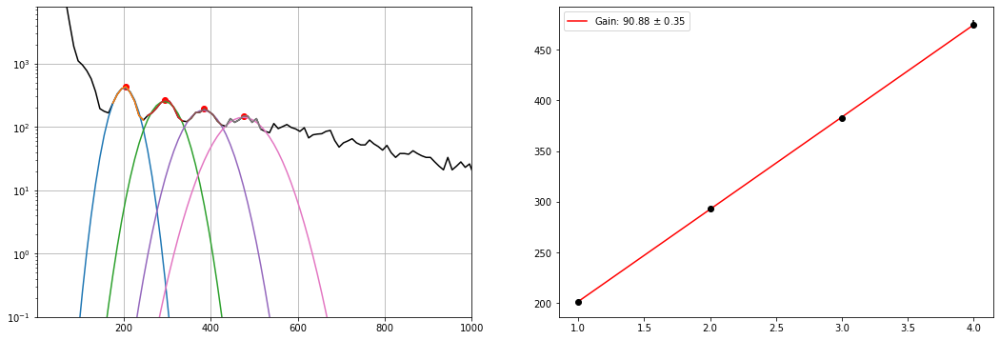

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_9.h5
Guess:  [445, 205.0375457875458, 10]
Params:  [423.02304084 201.49948921  23.61332266]
Guess:  [299, 295.0540293040293, 10]
Params:  [276.4368984  291.91372874  29.84624081]
Guess:  [215, 385.0705128205128, 10]
Params:  [206.08463367 382.70238731  35.96999685]
Guess:  [158, 455.08333333333337, 10]
Params:  [133.92539773 468.16745135 136.78382246]


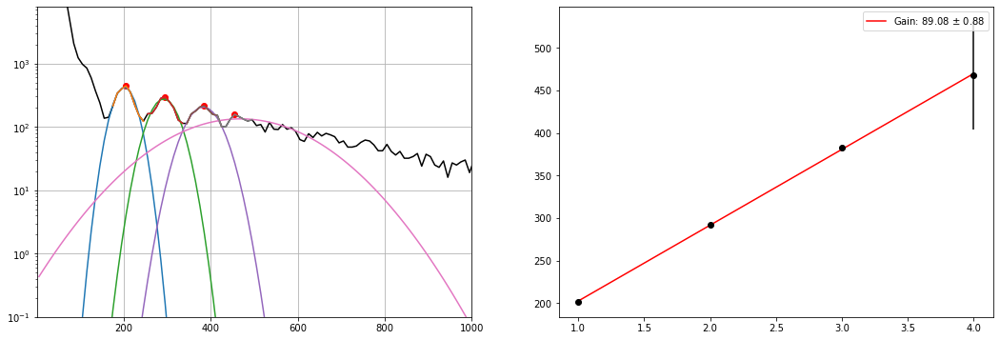

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_8.h5
Guess:  [437, 205.0375457875458, 10]
Params:  [419.98641154 202.68225364  23.773593  ]
Guess:  [286, 305.0558608058608, 10]
Params:  [257.81651061 295.78727669  33.6430194 ]
Guess:  [208, 395.0723443223443, 10]
Params:  [190.41545803 388.72275475  38.87425613]
Guess:  [147, 475.0869963369963, 10]
Params:  [147.31767901 473.39046887  43.65627352]


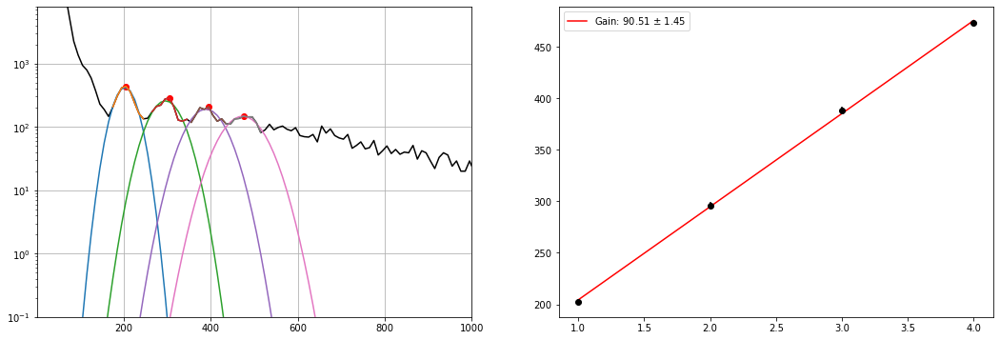

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_7.h5
Guess:  [405, 205.0375457875458, 10]
Params:  [392.55315319 202.10472241  25.48047704]
Guess:  [291, 295.0540293040293, 10]
Params:  [275.3076796  294.81173911  29.20091597]
Guess:  [211, 375.06868131868134, 10]
Params:  [195.90293185 383.81187968  37.64519357]
Guess:  [144, 485.0888278388278, 10]
Params:  [141.81647029 472.80829245  48.00109254]


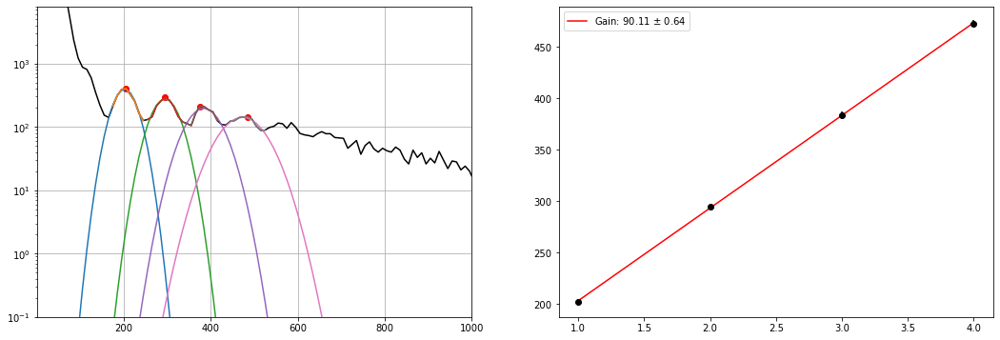

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_6.h5
Guess:  [379, 205.0375457875458, 10]
Params:  [379.83603187 202.54591865  25.89086268]
Guess:  [262, 295.0540293040293, 10]
Params:  [257.5178895  293.21542826  28.87913834]
Guess:  [216, 385.0705128205128, 10]
Params:  [189.87740457 385.63205687  37.95551177]
Guess:  [144, 485.0888278388278, 10]
Params:  [139.12470649 478.46078907  41.35223166]


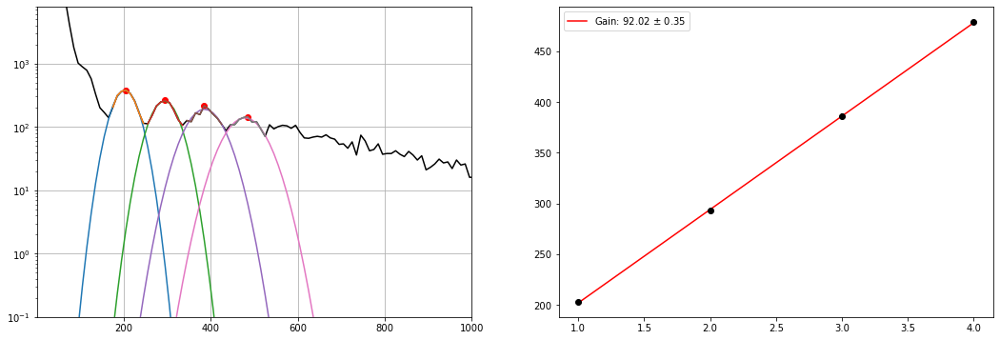

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_5.h5
Guess:  [390, 205.0375457875458, 10]
Params:  [379.27796945 200.68377447  25.04421941]
Guess:  [283, 295.0540293040293, 10]
Params:  [274.45057944 294.245787    27.63054124]
Guess:  [217, 385.0705128205128, 10]
Params:  [196.58425107 384.08312055  37.59516132]
Guess:  [149, 465.08516483516485, 10]
Params:  [140.83412775 467.60678211  49.82967258]


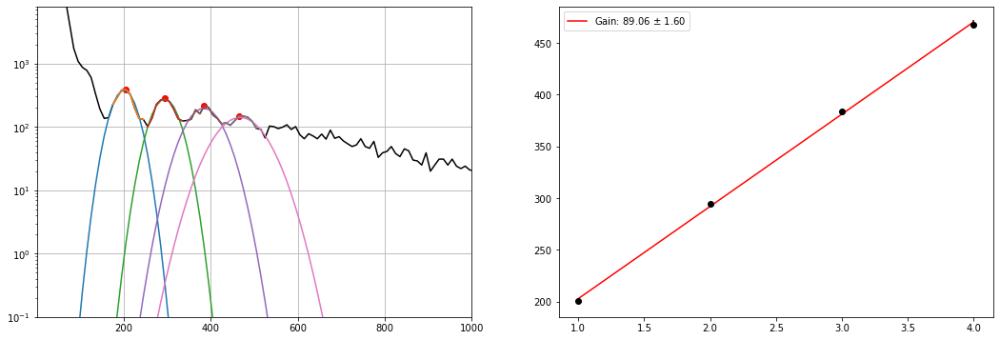

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_4.h5
Guess:  [399, 195.03571428571428, 10]
Params:  [392.26164505 200.91058296  24.05077201]
Guess:  [274, 285.05219780219784, 10]
Params:  [268.90545371 290.90027409  28.23423566]
Guess:  [203, 375.06868131868134, 10]
Params:  [194.08957606 381.35917557  37.66607631]
Guess:  [144, 485.0888278388278, 10]
Params:  [143.27392314 474.49649544  47.96858599]


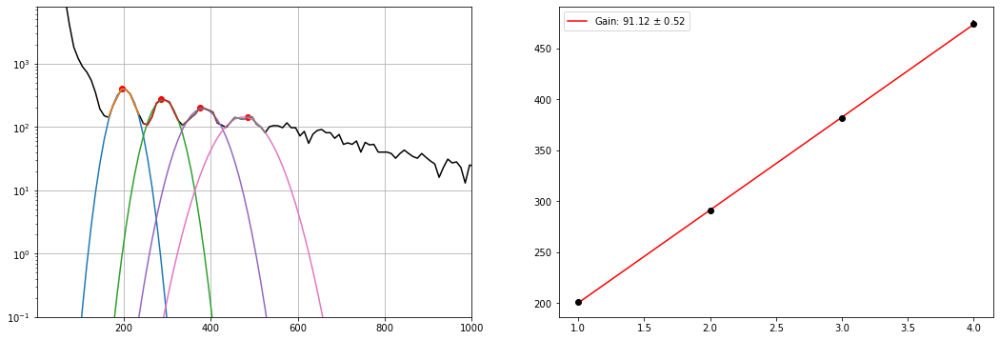

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_3.h5
Guess:  [429, 205.0375457875458, 10]
Params:  [413.27502392 200.82198644  24.13329984]
Guess:  [278, 295.0540293040293, 10]
Params:  [269.83433015 292.02548052  31.85278057]
Guess:  [207, 375.06868131868134, 10]
Params:  [199.87625996 384.61260202  39.69280919]
Guess:  [159, 475.0869963369963, 10]
Params:  [150.24667077 468.72349168  43.77639338]


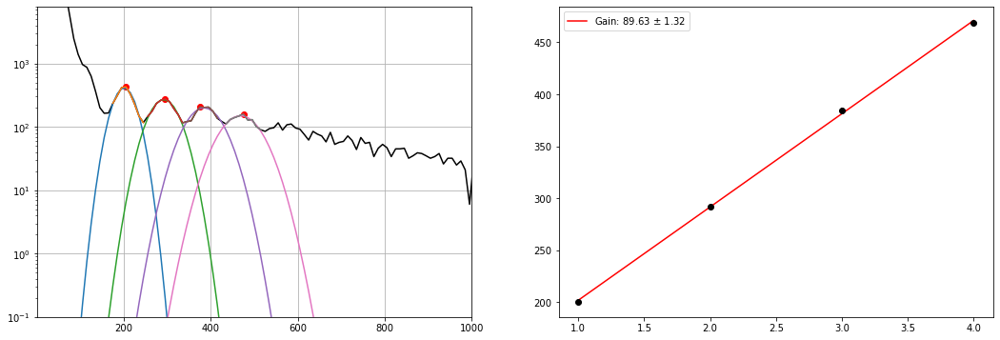

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_2.h5
Guess:  [416, 195.03571428571428, 10]
Params:  [405.26337957 200.9354829   24.93349518]
Guess:  [279, 285.05219780219784, 10]
Params:  [266.64353815 291.40511602  33.26244731]
Guess:  [238, 375.06868131868134, 10]
Params:  [207.69268717 383.29633644  38.90925665]
Guess:  [158, 475.0869963369963, 10]
Params:  [149.73604124 474.34348069  52.77820158]


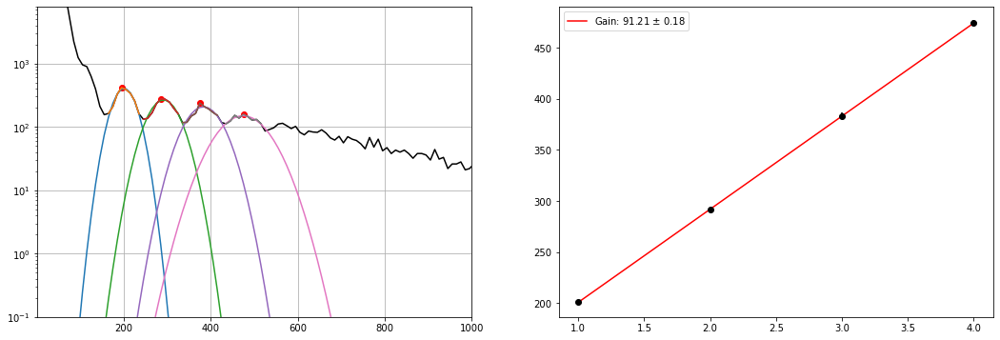

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_1.h5
Guess:  [364, 205.0375457875458, 10]
Params:  [357.97275539 202.26295894  31.84131758]
Guess:  [257, 305.0558608058608, 10]
Params:  [247.66988617 296.11641782  37.62384207]
Guess:  [199, 385.0705128205128, 10]
Params:  [187.29148712 382.45835166  46.79881416]
Guess:  [145, 475.0869963369963, 10]
Params:  [137.81024965 471.8868444   60.98216382]


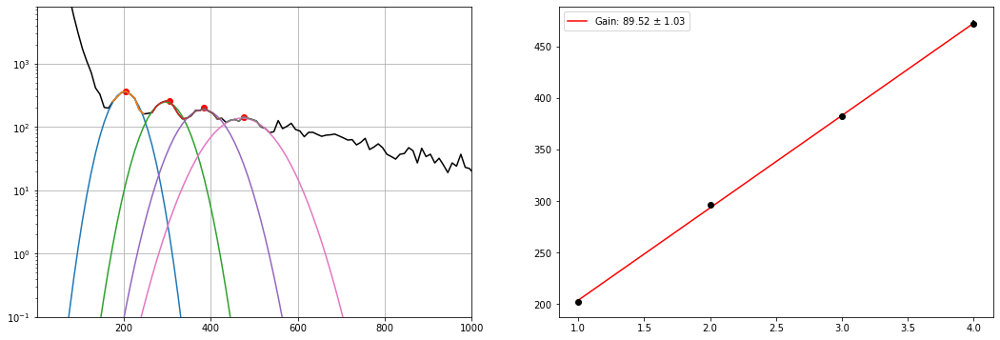

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_405_0.h5
Guess:  [416, 195.03571428571428, 10]
Params:  [387.30054543 198.68188747  27.56919365]
Guess:  [296, 295.0540293040293, 10]
Params:  [271.79408463 293.61078096  31.43624212]
Guess:  [240, 385.0705128205128, 10]
Params:  [202.6836921  383.83095568  37.3675349 ]
Guess:  [159, 485.0888278388278, 10]
Params:  [155.78985814 476.87658595  40.72218997]


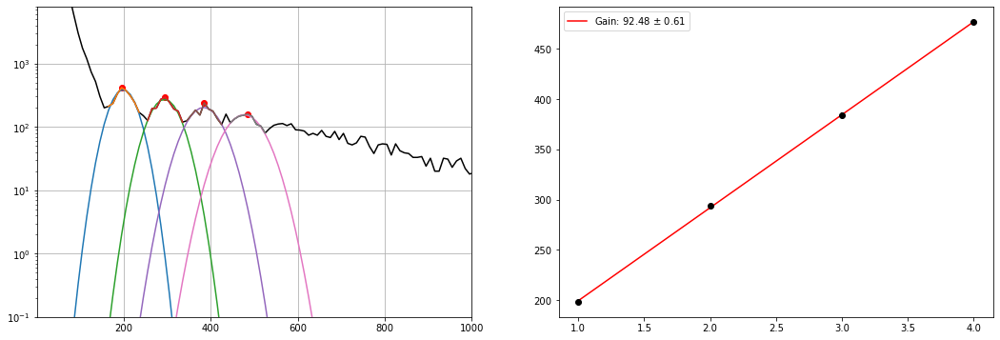

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_33.h5
Guess:  [255, 205.0375457875458, 10]
Params:  [236.28434148 201.6334885   28.49386983]
Guess:  [134, 295.0540293040293, 10]
Params:  [125.62121273 293.97706233  27.79172942]
Guess:  [75, 395.0723443223443, 10]
Params:  [ 74.81997909 394.2396501   39.68751965]


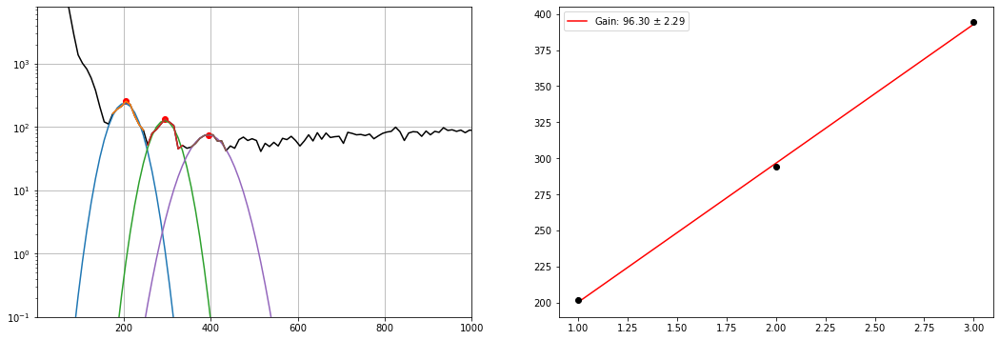

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_32.h5
Guess:  [245, 205.0375457875458, 10]
Params:  [235.32316801 202.25632174  24.02248955]
Guess:  [119, 295.0540293040293, 10]
Params:  [121.60696427 297.84467643  29.45622748]
Guess:  [78, 385.0705128205128, 10]
Params:  [ 75.231262   390.95232987  32.05220441]


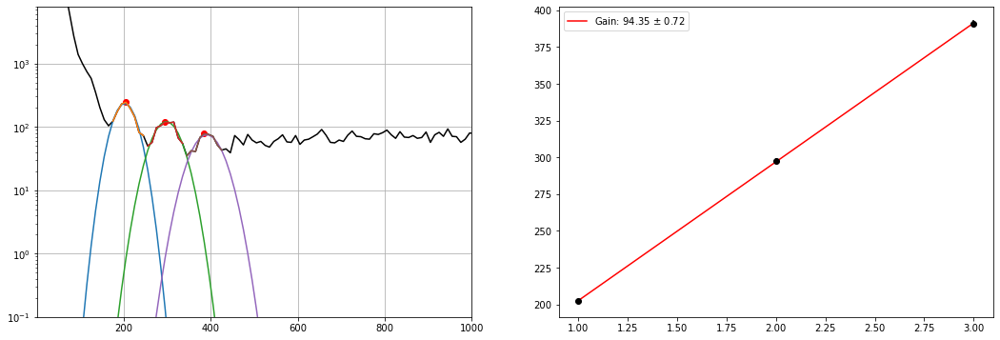

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_31.h5
Guess:  [247, 205.0375457875458, 10]
Params:  [224.60431671 203.01951016  23.52530206]
Guess:  [107, 295.0540293040293, 10]
Params:  [103.70728137 298.23723248  34.48380889]
Guess:  [86, 395.0723443223443, 10]
Params:  [ 74.16960506 395.16521094  34.49710253]


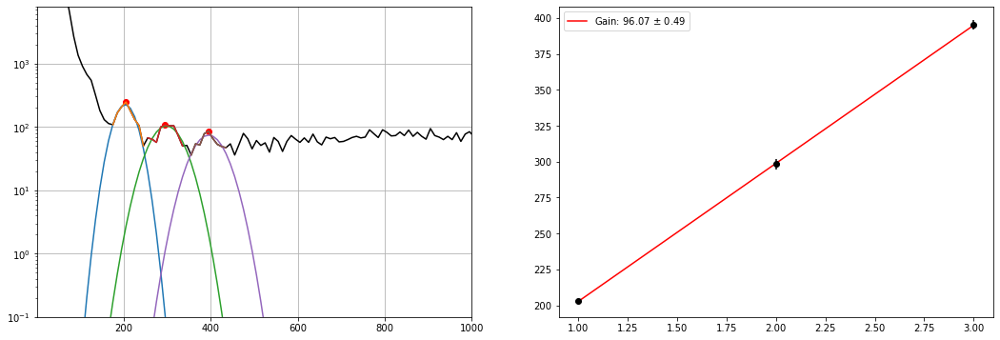

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_30.h5
Guess:  [247, 205.0375457875458, 10]
Params:  [235.85691343 204.4999064   23.85530284]
Guess:  [134, 295.0540293040293, 10]
Params:  [112.21063407 294.22627556  29.14848808]
Guess:  [71, 385.0705128205128, 10]
Params:  [ 65.98053432 391.58591738  41.04861224]


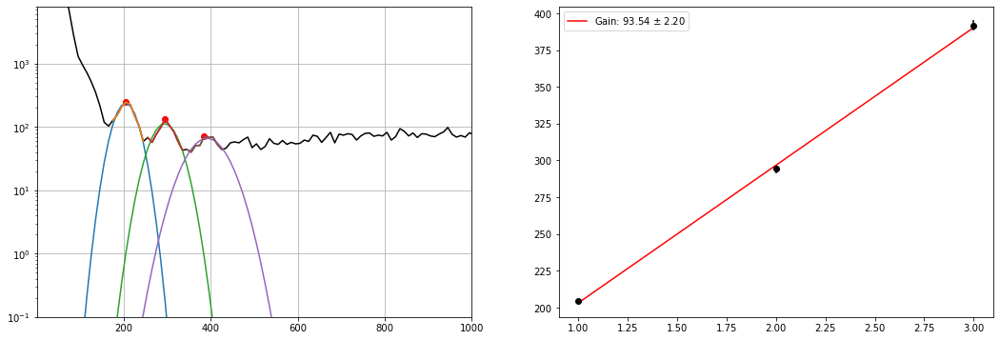

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_29.h5
Guess:  [237, 205.0375457875458, 10]
Params:  [231.80328771 203.19754696  25.30388321]
Guess:  [130, 295.0540293040293, 10]
Params:  [114.87430743 299.50883169  30.54736825]
Guess:  [72, 385.0705128205128, 10]
Params:  [ 67.38888146 392.83149432  43.73663339]


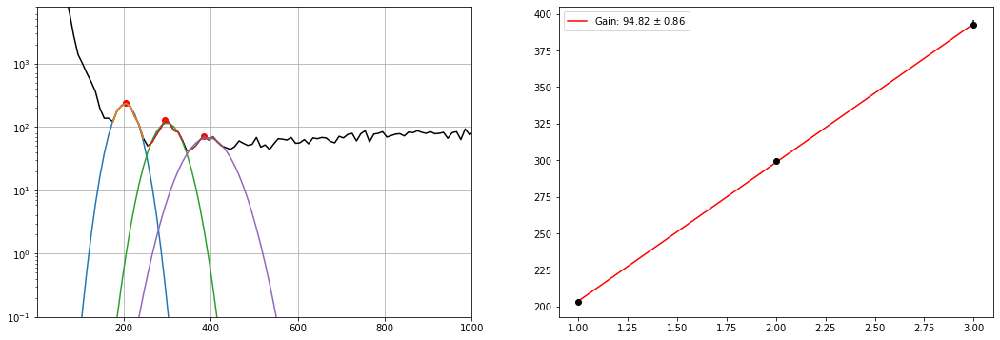

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_28.h5
Guess:  [279, 205.0375457875458, 10]
Params:  [262.72837605 202.81656115  23.2096323 ]
Guess:  [113, 295.0540293040293, 10]
Params:  [106.92274265 296.69081073  35.78585596]
Guess:  [90, 395.0723443223443, 10]
Params:  [ 76.39335804 390.22244462  30.55696519]


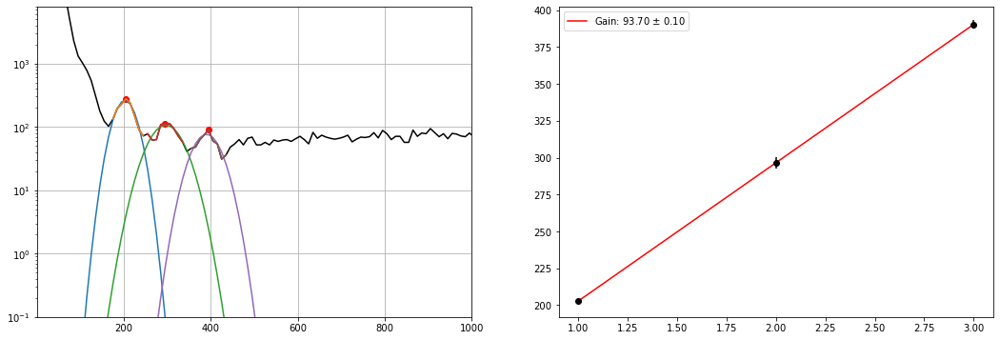

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_27.h5
Guess:  [252, 195.03571428571428, 10]
Params:  [239.89239718 199.36255164  23.17640523]
Guess:  [116, 295.0540293040293, 10]
Params:  [111.90420534 296.12541944  28.52269746]
Guess:  [79, 395.0723443223443, 10]
Params:  [ 70.95977802 399.13919313  43.77002634]


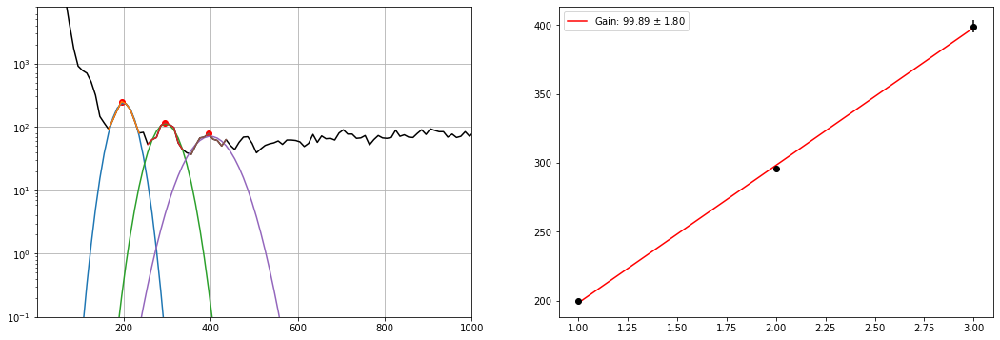

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_26.h5
Guess:  [232, 195.03571428571428, 10]
Params:  [231.95462692 201.37674923  27.86545455]
Guess:  [117, 285.05219780219784, 10]
Params:  [ 97.31512125 289.78909732  42.70194362]
Guess:  [84, 395.0723443223443, 10]
Params:  [ 73.25503971 389.89419631  44.69068738]


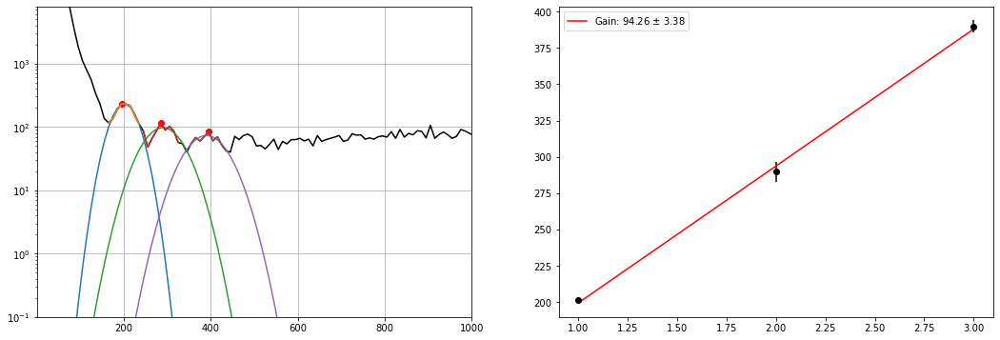

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_25.h5
Guess:  [231, 205.0375457875458, 10]
Params:  [213.83520017 203.87174713  26.23887444]
Guess:  [131, 305.0558608058608, 10]
Params:  [120.13921677 298.17358753  29.40548572]
Guess:  [79, 395.0723443223443, 10]
Params:  [ 76.06558735 395.38593311  34.60504888]


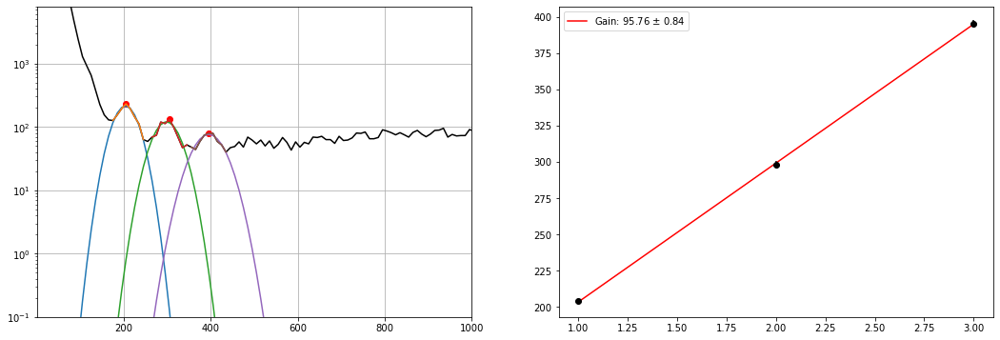

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_24.h5
Guess:  [244, 205.0375457875458, 10]
Params:  [241.8135773  202.94031536  24.22082642]
Guess:  [118, 295.0540293040293, 10]
Params:  [113.02129176 295.69479134  31.22701397]
Guess:  [91, 395.0723443223443, 10]
Params:  [ 77.66955761 393.51467153  34.82016377]


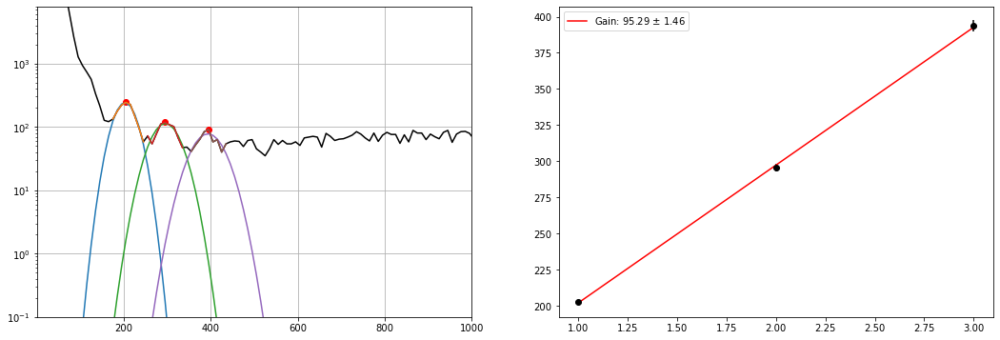

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_23.h5
Guess:  [275, 195.03571428571428, 10]
Params:  [258.565201   200.41179014  27.29684806]
Guess:  [124, 305.0558608058608, 10]
Params:  [119.59950609 298.15829721  32.35428024]
Guess:  [95, 395.0723443223443, 10]
Params:  [ 82.87968741 386.59231691  38.71654882]


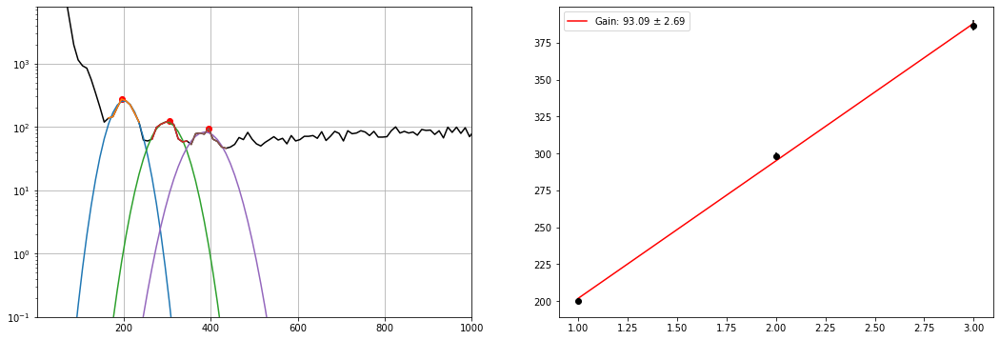

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_22.h5
Guess:  [230, 205.0375457875458, 10]
Params:  [239.00737827 199.9847052   23.50417473]
Guess:  [129, 305.0558608058608, 10]
Params:  [110.2629609  297.99372136  30.70333918]
Guess:  [83, 395.0723443223443, 10]
Params:  [ 74.03095772 391.75329512  36.29474119]


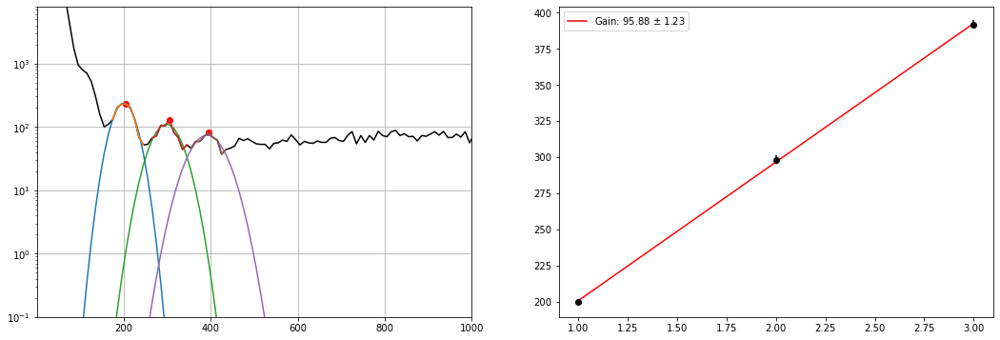

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_21.h5
Guess:  [264, 205.0375457875458, 10]
Params:  [247.20767854 202.63587279  24.58854471]
Guess:  [124, 295.0540293040293, 10]
Params:  [114.54605524 292.49151387  29.35467491]
Guess:  [100, 385.0705128205128, 10]
Params:  [ 83.51395286 386.55964588  30.11630023]


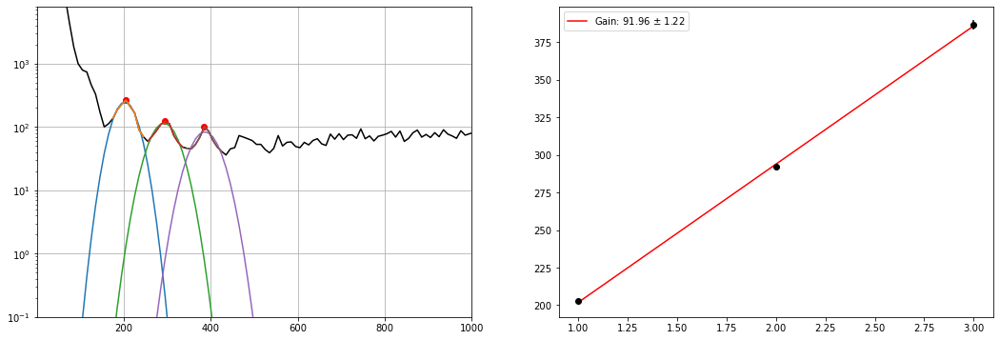

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_20.h5
Guess:  [244, 195.03571428571428, 10]
Params:  [235.44624663 202.55501108  27.98879213]
Guess:  [121, 295.0540293040293, 10]
Params:  [116.58102864 299.1539134   32.91904476]
Guess:  [78, 385.0705128205128, 10]
Params:  [ 70.9515058  394.61118345  40.41819765]


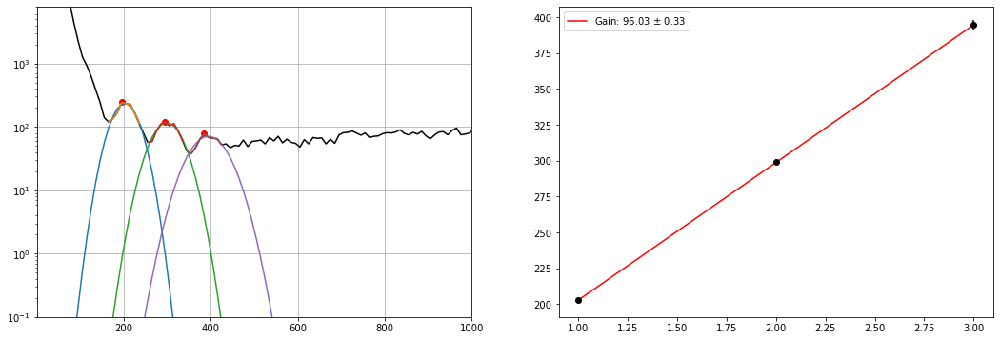

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_19.h5
Guess:  [223, 195.03571428571428, 10]
Params:  [218.22936036 200.82858914  29.82569396]
Guess:  [113, 305.0558608058608, 10]
Params:  [108.74990486 297.45451431  35.19968021]
Guess:  [77, 385.0705128205128, 10]
Params:  [ 67.28856316 384.91534676  40.43025706]


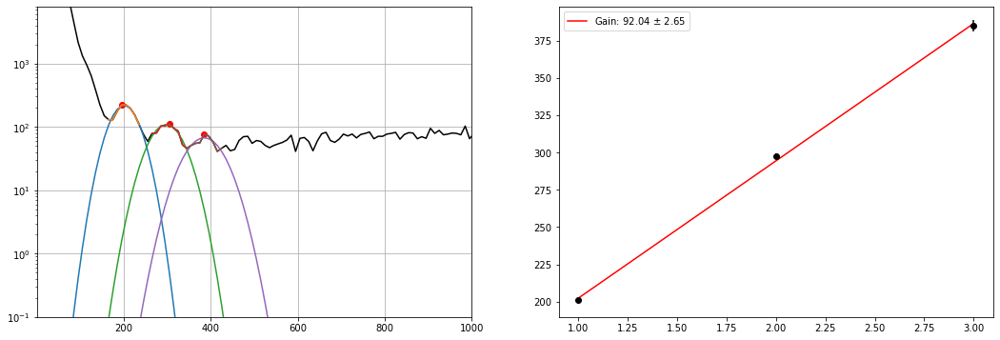

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_18.h5
Guess:  [258, 205.0375457875458, 10]
Params:  [243.65793481 201.94733501  24.35131907]
Guess:  [118, 295.0540293040293, 10]
Params:  [114.1870288  296.04520987  30.40457717]
Guess:  [77, 395.0723443223443, 10]
Params:  [ 72.65684998 387.59855776  39.43419655]


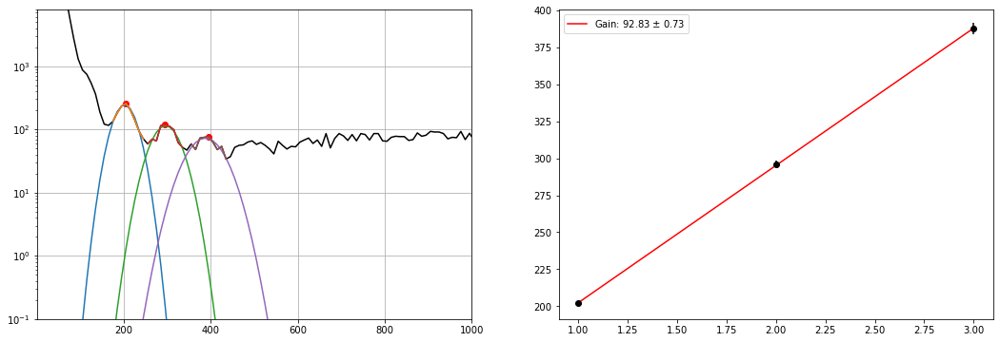

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_17.h5
Guess:  [251, 205.0375457875458, 10]
Params:  [248.73530033 203.90390729  24.02572468]
Guess:  [123, 295.0540293040293, 10]
Params:  [116.65227031 298.11351841  30.83019264]
Guess:  [83, 395.0723443223443, 10]
Params:  [ 76.08740647 392.63163907  37.27455329]


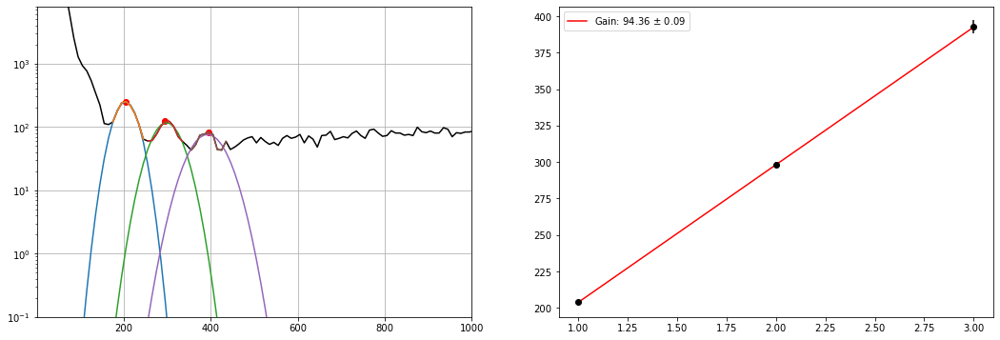

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_16.h5
Guess:  [284, 205.0375457875458, 10]
Params:  [264.02076176 204.36568518  22.43325585]
Guess:  [121, 285.05219780219784, 10]
Params:  [112.03398119 293.84673951  31.3912937 ]
Guess:  [78, 375.06868131868134, 10]
Params:  [ 67.90664462 387.34038311  41.69925093]


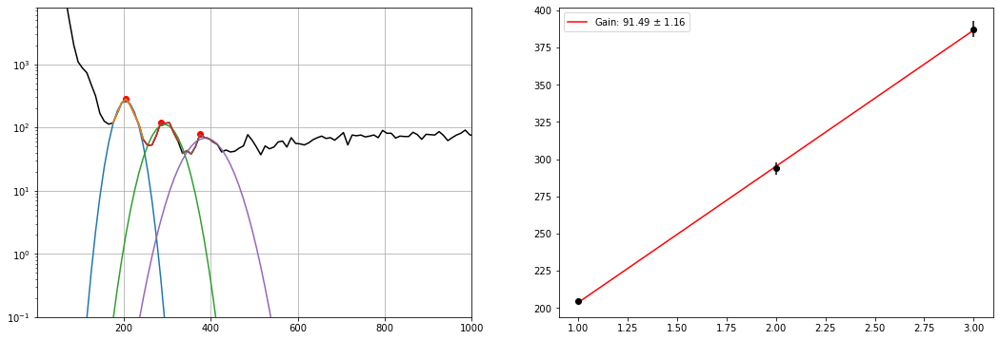

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_15.h5
Guess:  [264, 205.0375457875458, 10]
Params:  [247.44647138 201.73547581  24.68576938]
Guess:  [117, 295.0540293040293, 10]
Params:  [112.0676364  295.36878073  29.75855881]
Guess:  [76, 395.0723443223443, 10]
Params:  [ 74.3690728  396.04149666  38.98418495]


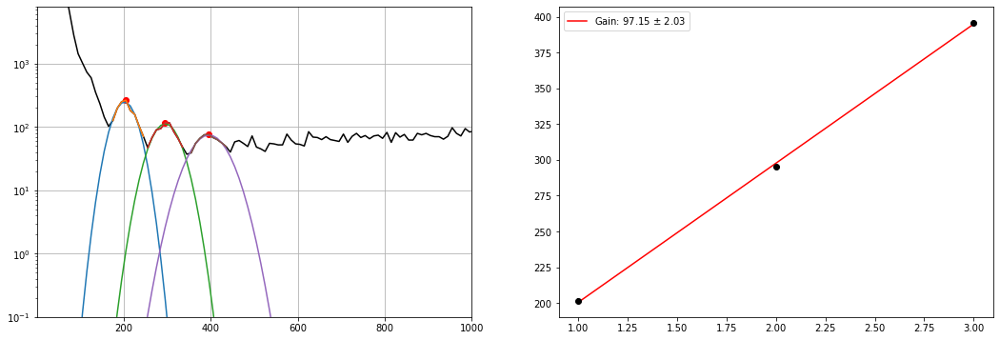

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_14.h5
Guess:  [247, 205.0375457875458, 10]
Params:  [233.79826085 203.68115228  23.71144679]
Guess:  [126, 285.05219780219784, 10]
Params:  [111.93450946 295.11274918  33.63030219]
Guess:  [77, 405.0741758241758, 10]
Params:  [ 72.99105748 392.49883623  46.77578292]


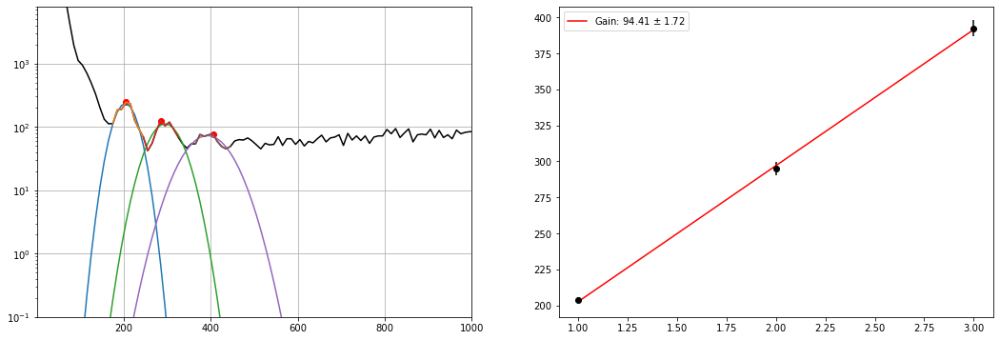

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_13.h5
Guess:  [237, 205.0375457875458, 10]
Params:  [237.14637068 202.94553297  24.77989469]
Guess:  [129, 295.0540293040293, 10]
Params:  [121.00559716 294.59390602  28.91192427]
Guess:  [76, 385.0705128205128, 10]
Params:  [ 72.94775617 388.56989011  42.32164452]


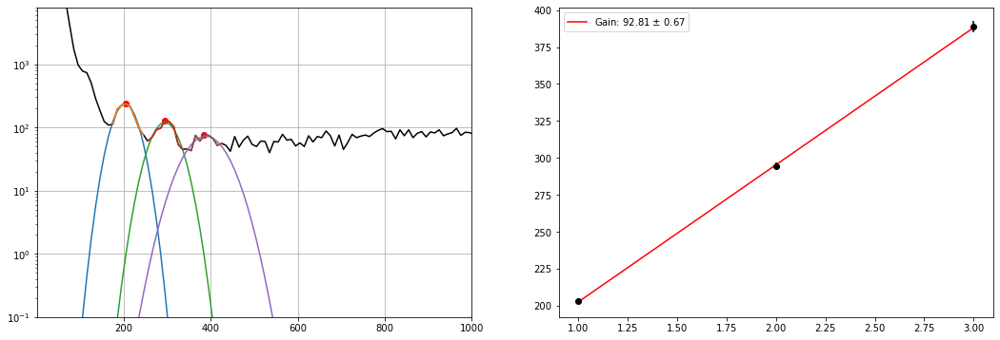

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_12.h5
Guess:  [262, 205.0375457875458, 10]
Params:  [263.44119063 202.60039091  22.82243048]
Guess:  [116, 305.0558608058608, 10]
Params:  [110.42541363 297.97236048  32.85980938]
Guess:  [84, 395.0723443223443, 10]
Params:  [ 74.49814344 395.65938569  35.86062295]


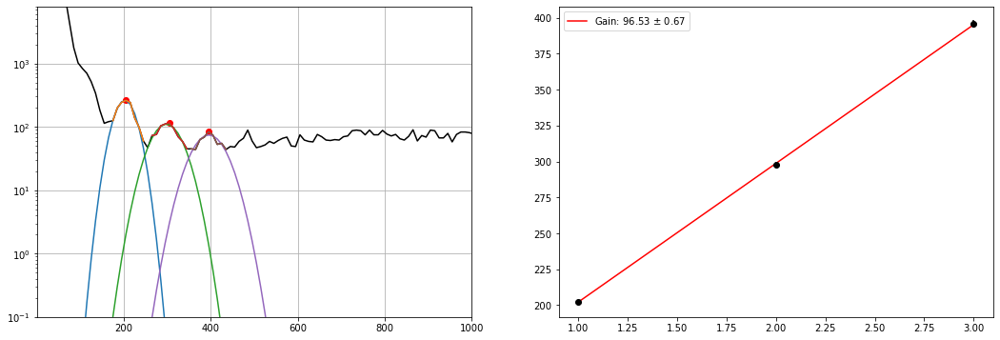

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_11.h5
Guess:  [268, 205.0375457875458, 10]
Params:  [260.36062772 202.80550269  23.38056035]
Guess:  [134, 295.0540293040293, 10]
Params:  [128.63711432 294.745862    27.31636343]
Guess:  [86, 395.0723443223443, 10]
Params:  [ 74.69547428 391.17620236  39.34579683]


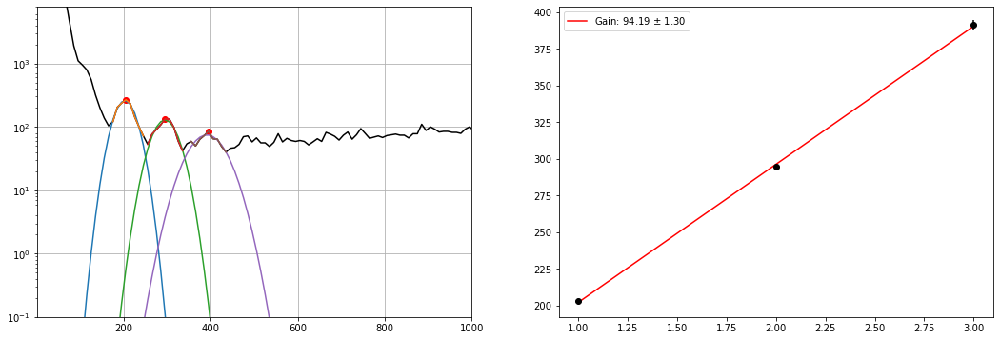

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_10.h5
Guess:  [250, 205.0375457875458, 10]
Params:  [239.71506936 201.18312345  24.53621869]
Guess:  [115, 295.0540293040293, 10]
Params:  [108.97607587 297.56742655  31.79497491]
Guess:  [92, 395.0723443223443, 10]
Params:  [ 84.30711422 392.44399608  31.04092291]


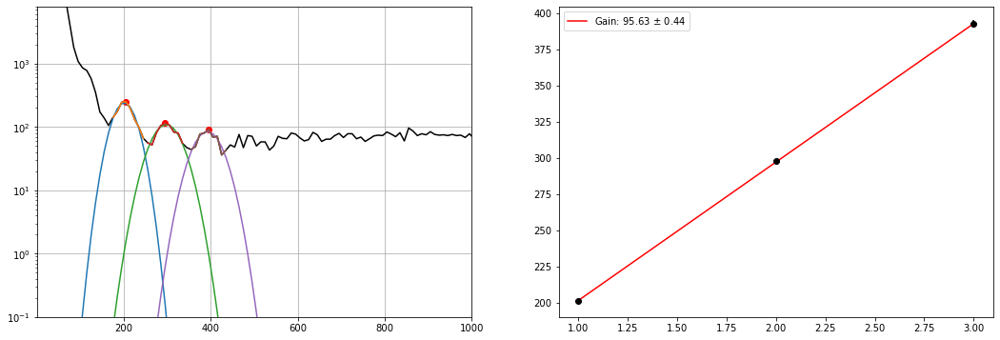

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_9.h5
Guess:  [260, 195.03571428571428, 10]
Params:  [252.44115247 201.76666662  25.80843741]
Guess:  [145, 295.0540293040293, 10]
Params:  [117.41811351 294.72334462  29.06073148]
Guess:  [100, 395.0723443223443, 10]
Params:  [ 91.00018962 390.97689659  31.13442168]


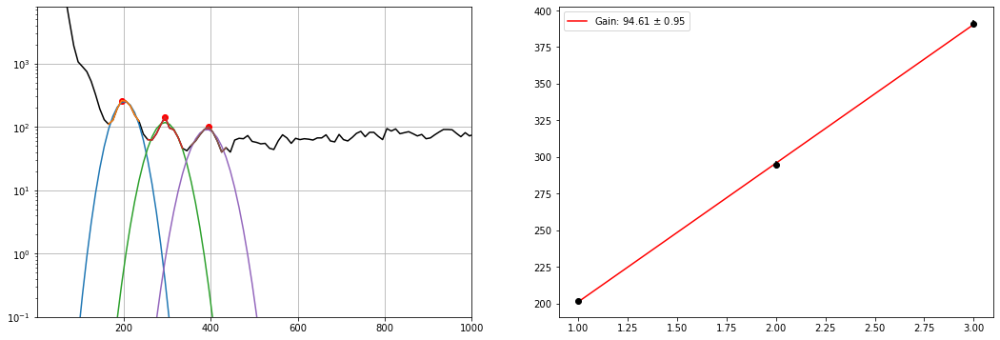

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_8.h5
Guess:  [242, 195.03571428571428, 10]
Params:  [239.71333845 201.96977392  26.8009966 ]
Guess:  [120, 295.0540293040293, 10]
Params:  [118.23380739 297.56424165  30.30736989]
Guess:  [99, 395.0723443223443, 10]
Params:  [ 75.28167181 387.40121212  41.94677204]


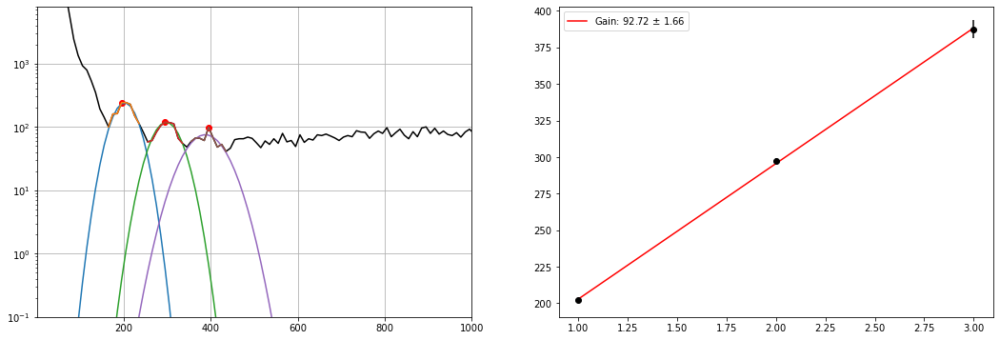

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_7.h5
Guess:  [248, 205.0375457875458, 10]
Params:  [242.20066833 201.30987956  24.77023441]
Guess:  [130, 295.0540293040293, 10]
Params:  [114.1125652  295.37312372  27.54709906]
Guess:  [88, 395.0723443223443, 10]
Params:  [ 72.10878957 388.94631208  40.8215665 ]


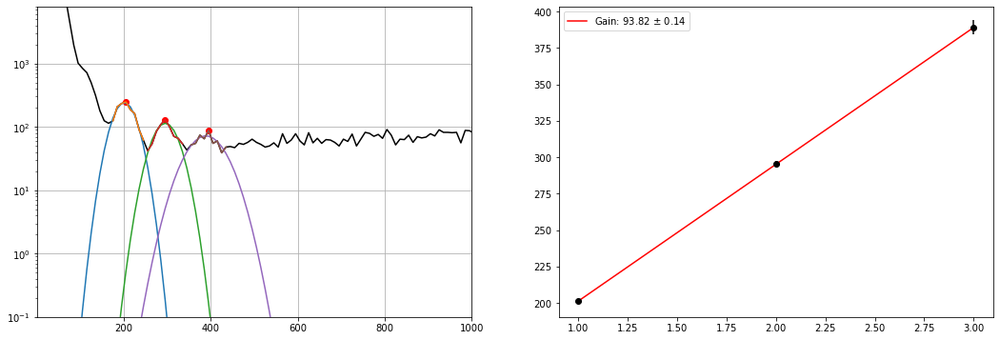

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_6.h5
Guess:  [259, 205.0375457875458, 10]
Params:  [242.80329987 201.42539253  24.18028824]
Guess:  [126, 295.0540293040293, 10]
Params:  [118.38553156 295.33904178  26.7330872 ]
Guess:  [75, 395.0723443223443, 10]
Params:  [ 73.19362433 390.67726462  37.35824309]


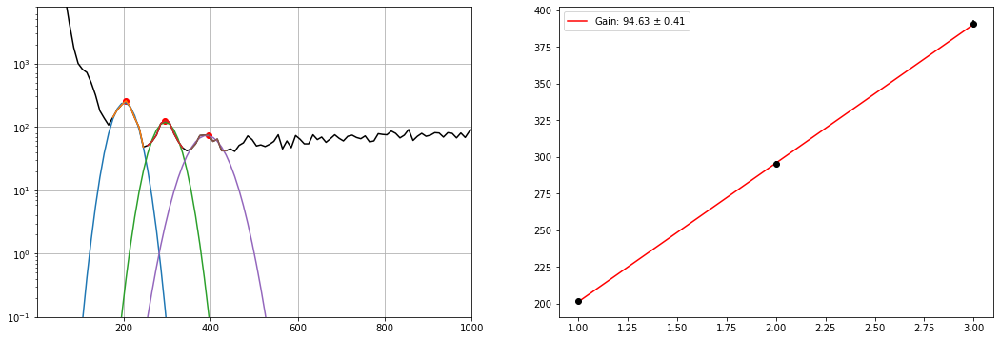

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_5.h5
Guess:  [248, 205.0375457875458, 10]
Params:  [239.02219559 201.57483533  24.30780716]
Guess:  [110, 295.0540293040293, 10]
Params:  [104.0458894  296.24789165  34.99901926]
Guess:  [84, 395.0723443223443, 10]
Params:  [ 68.42822629 396.38786116  51.37632969]


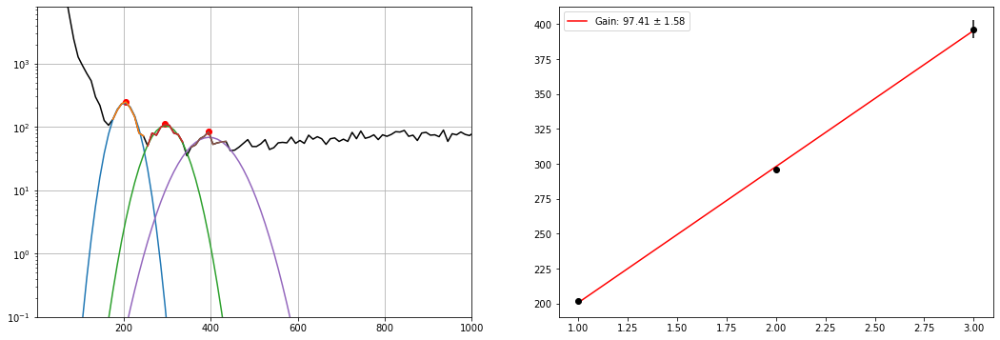

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_4.h5
Guess:  [253, 205.0375457875458, 10]
Params:  [241.200013   202.69993708  23.01341777]
Guess:  [136, 295.0540293040293, 10]
Params:  [123.98765823 294.0126931   24.72112459]
Guess:  [79, 395.0723443223443, 10]
Params:  [ 69.75313602 390.6611939   42.66561297]


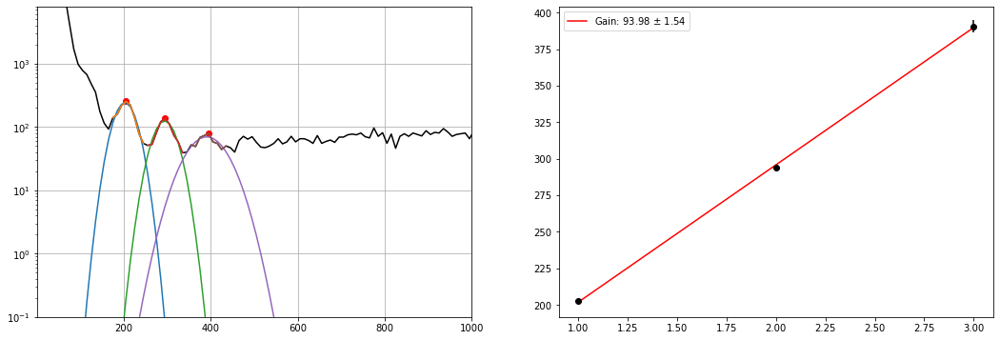

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_3.h5
Guess:  [241, 195.03571428571428, 10]
Params:  [229.70313919 202.64708061  24.02840585]
Guess:  [128, 295.0540293040293, 10]
Params:  [110.64436137 298.63695151  26.77980751]
Guess:  [80, 395.0723443223443, 10]
Params:  [ 71.70690141 393.19752308  36.21728916]


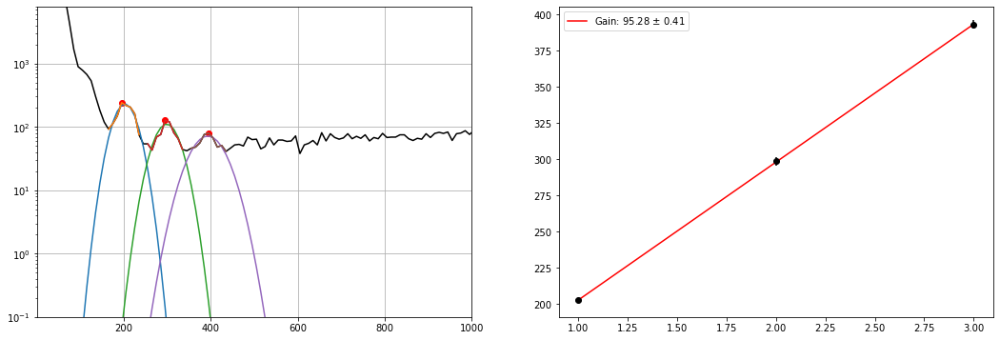

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_2.h5
Guess:  [275, 205.0375457875458, 10]
Params:  [273.41674006 203.16385581  23.81585502]
Guess:  [120, 305.0558608058608, 10]
Params:  [123.11473738 297.15249631  30.29770932]
Guess:  [86, 415.07600732600736, 10]
Params:  [ 76.6641952  394.42863062  52.28983102]


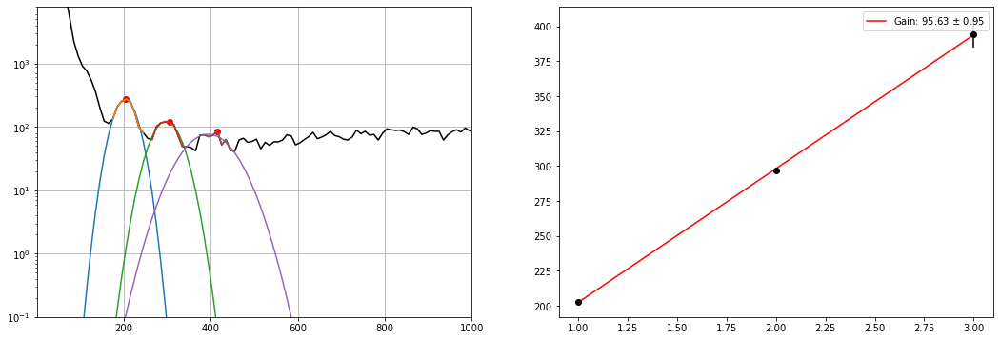

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_1.h5
Guess:  [234, 205.0375457875458, 10]
Params:  [224.58924059 204.88653513  26.88298764]
Guess:  [104, 305.0558608058608, 10]
Params:  [ 96.16610175 299.4037136   37.25519807]
Guess:  [81, 395.0723443223443, 10]
Params:  [ 72.12446108 390.44049145  39.29214112]


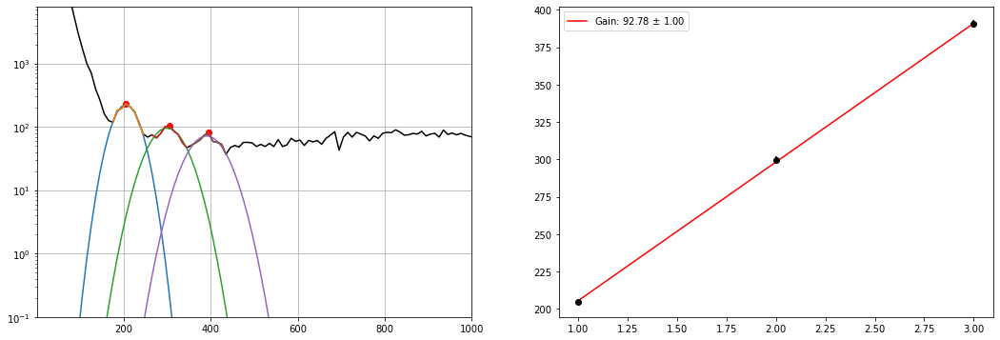

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step10/mca_keith_31.40OV_310_0.h5
Guess:  [220, 195.03571428571428, 10]
Params:  [225.21265328 200.54117956  29.13508599]
Guess:  [117, 305.0558608058608, 10]
Params:  [113.16938034 298.54012555  33.84131611]
Guess:  [81, 375.06868131868134, 10]
Params:  [ 68.22669105 380.11831036  51.86697264]


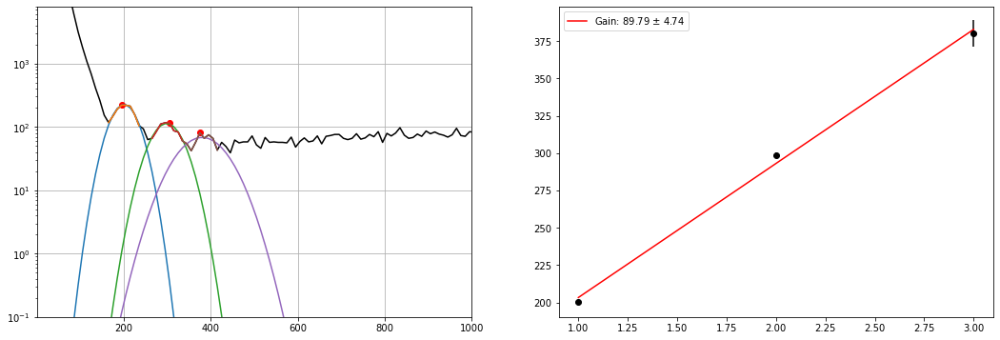

In [10]:
data_POS_FIELD = {'source':{}, 405.0:{}, 310.0:{}}

for file_type, file_list in files_10.items():
    # creating the data fields in the dict
    data_POS_FIELD[file_type]['pe_data'] = []
    data_POS_FIELD[file_type]['counts'] = []
    data_POS_FIELD[file_type]['gain'] = np.empty(len(file_list))
    data_POS_FIELD[file_type]['gain_err'] = np.empty(len(file_list))
    data_POS_FIELD[file_type]['dc_offset'] = np.empty(len(file_list))
    for i, file in enumerate(file_list):
        pe, counts, gain, gain_err, dc_offset = plot_fit_gain_dc(file, 25, 10, 10)
        data_POS_FIELD[file_type]['pe_data'].append(pe)
        data_POS_FIELD[file_type]['counts'].append(counts)
        data_POS_FIELD[file_type]['gain'][i] = gain
        data_POS_FIELD[file_type]['gain_err'][i] = gain_err
        data_POS_FIELD[file_type]['dc_offset'][i] = dc_offset
    # converting all the lists to arrays 
    data_POS_FIELD[file_type]['pe_data'] = np.array(data_POS_FIELD[file_type]['pe_data'])
    data_POS_FIELD[file_type]['counts'] = np.array(data_POS_FIELD[file_type]['counts'])

-1.1022387428742475
-1.2211971881411505
-1.1402481092503292


<Figure size 648x432 with 0 Axes>

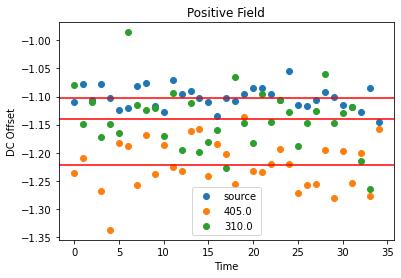

In [11]:
plt.figure(figsize = (9, 6))
# plotting the dc offset over time

# getting the "time"
time_POS_FIELD = {}
for key in files_10:
    time_POS_FIELD[key] = np.arange(0, len(files_10[key]))
plt.figure(figsize=(6,4))
for key in data_POS_FIELD:
    data_POS_FIELD[key]['dc_offset'] = np.asarray(data_POS_FIELD[key]['dc_offset'])
    data_POS_FIELD[key]['dc_offset'][data_POS_FIELD[key]['dc_offset'] < -5] = np.nan # setting any outliers to nan
    masked_data = np.ma.masked_array(data_POS_FIELD[key]['dc_offset'], np.isnan(data_POS_FIELD[key]['dc_offset'])) # creating a masked array to ignore the nan when tkaing the average dc offset
    dc_offset_mean = np.ma.average(masked_data)
    data_POS_FIELD[key]['mean_dc_offset'] = dc_offset_mean
    plt.scatter(time_POS_FIELD[key], data_POS_FIELD[key]['dc_offset'], marker='o', label= str(key))
    plt.axhline(y=dc_offset_mean, color='r')
    print(dc_offset_mean)

plt.ylabel('DC Offset')
plt.xlabel('Time')
plt.title('Positive Field')
# plt.ylim(-1.4, -1)
# plt.grid()
plt.legend(loc='best')
# plt.savefig('NO_FIELD_gain_comparison.pdf')
plt.show()

# Negative E Field

In [12]:
# getting the data that we need
path_12 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/'
files_12 = load_directory(path_12)
SRS_gain_12 = 10 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_12 = 275 # center of noise pedestal peak

Number of files found:  105
Number of files:  105


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_34.h5
Guess:  [1432, 205.0375457875458, 10]
Params:  [1409.56194169  203.45683938   23.91580474]
Guess:  [666, 295.0540293040293, 10]
Params:  [626.75617773 299.45194301  29.412088  ]
Guess:  [374, 405.0741758241758, 10]
Params:  [350.67454103 397.45734215  31.35729209]
Guess:  [227, 505.09249084249086, 10]
Params:  [215.30843723 494.07031425  32.65173263]
Guess:  [161, 585.1071428571429, 10]
Params:  [145.51510042 591.58273117  33.88499119]


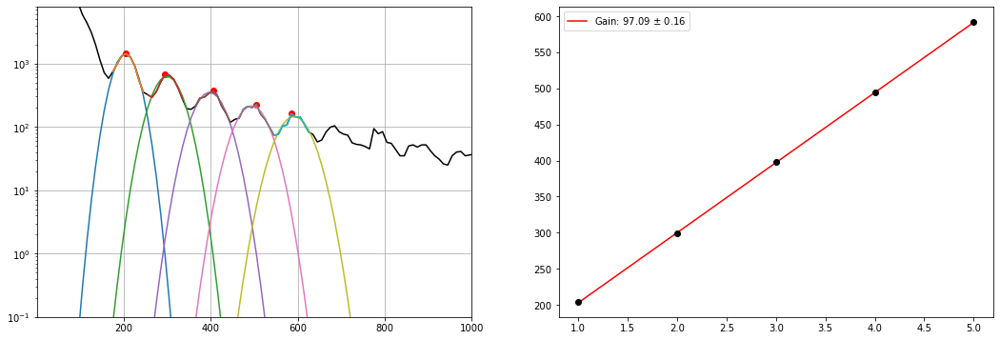

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_33.h5
Guess:  [1434, 205.0375457875458, 10]
Params:  [1376.25450264  204.22863595   23.87269642]
Guess:  [637, 295.0540293040293, 10]
Params:  [610.47619223 298.02100142  30.67325058]
Guess:  [352, 405.0741758241758, 10]
Params:  [339.77096354 396.84006562  29.75844943]
Guess:  [216, 495.09065934065933, 10]
Params:  [207.70221059 494.33390142  31.66619941]
Guess:  [145, 595.1089743589744, 10]
Params:  [131.84504031 589.81075511  36.00008133]


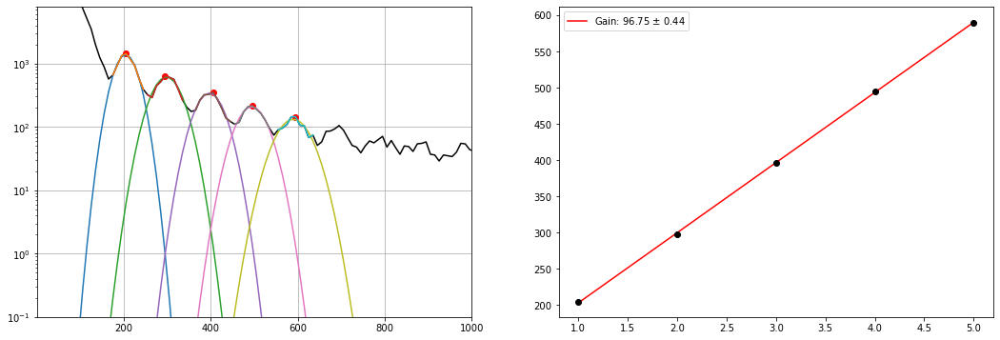

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_32.h5
Guess:  [1370, 205.0375457875458, 10]
Params:  [1358.50171322  204.23828471   23.90371818]
Guess:  [645, 305.0558608058608, 10]
Params:  [629.76262198 300.17635085  26.3848641 ]
Guess:  [330, 385.0705128205128, 10]
Params:  [316.16580371 394.72910981  39.27426242]
Guess:  [230, 505.09249084249086, 10]
Params:  [217.03013891 497.05768552  27.99345721]
Guess:  [143, 585.1071428571429, 10]
Params:  [126.44725929 588.24944052  43.09056005]


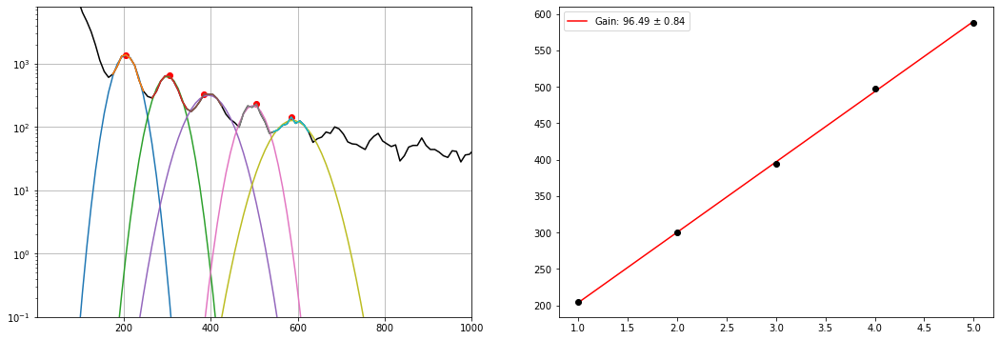

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_31.h5
Guess:  [1493, 205.0375457875458, 10]
Params:  [1388.58413637  204.36298292   24.91729716]
Guess:  [664, 305.0558608058608, 10]
Params:  [652.93806636 299.46914031  26.15523414]
Guess:  [352, 395.0723443223443, 10]
Params:  [337.50303282 395.45231464  32.4850255 ]
Guess:  [209, 495.09065934065933, 10]
Params:  [194.5444611  495.44385641  33.60720425]
Guess:  [139, 595.1089743589744, 10]
Params:  [134.71115329 591.79213112  31.82112099]


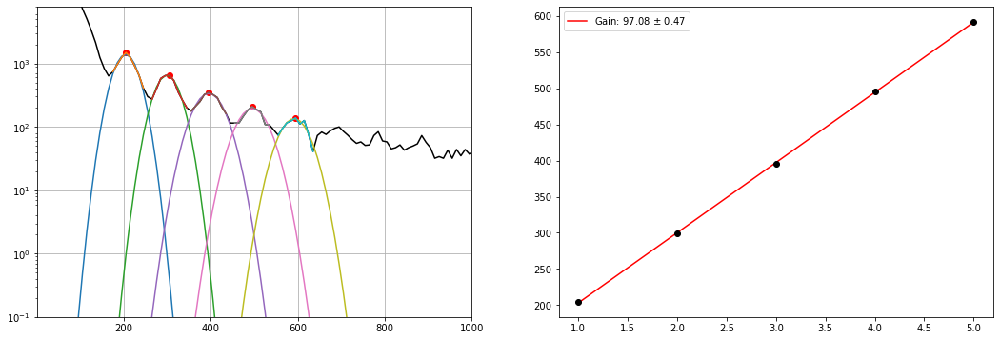

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_30.h5
Guess:  [1399, 205.0375457875458, 10]
Params:  [1370.16607818  203.95438928   25.00720092]
Guess:  [679, 305.0558608058608, 10]
Params:  [650.73192519 300.09305289  27.55617226]
Guess:  [352, 395.0723443223443, 10]
Params:  [346.3871782  394.99040292  31.21582184]
Guess:  [231, 505.09249084249086, 10]
Params:  [219.34030311 495.24047247  31.57121504]
Guess:  [166, 585.1071428571429, 10]
Params:  [152.31391988 588.41847468  33.48573849]


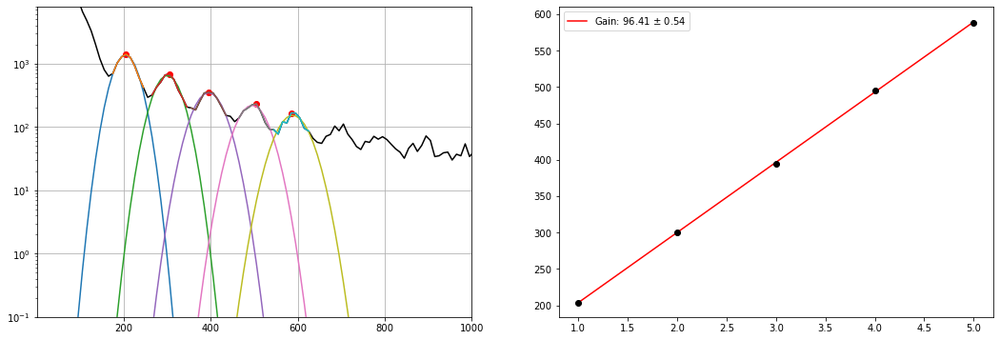

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_29.h5
Guess:  [1465, 205.0375457875458, 10]
Params:  [1409.43190024  203.67251883   24.57968519]
Guess:  [714, 305.0558608058608, 10]
Params:  [661.72945875 299.81861733  27.74207721]
Guess:  [373, 405.0741758241758, 10]
Params:  [358.14926919 396.84349245  30.74706741]
Guess:  [228, 495.09065934065933, 10]
Params:  [214.50359676 494.04289269  30.16187228]
Guess:  [166, 595.1089743589744, 10]
Params:  [159.33710164 590.8534558   32.42179397]


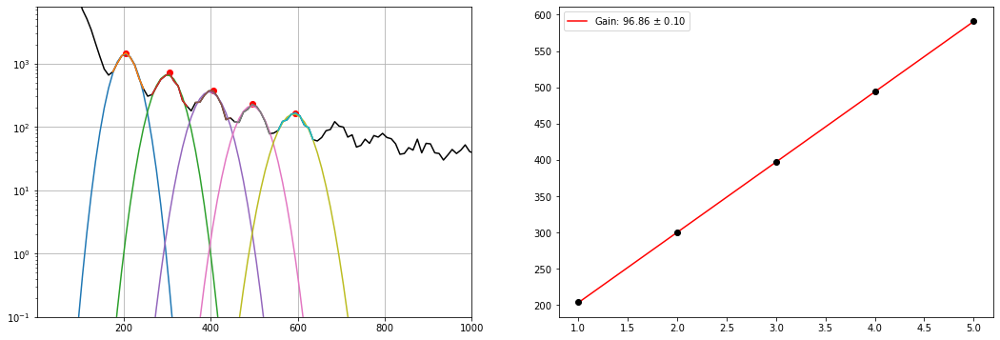

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_28.h5
Guess:  [1419, 205.0375457875458, 10]
Params:  [1380.84311941  203.80809649   24.30424962]
Guess:  [672, 295.0540293040293, 10]
Params:  [641.25541396 296.69802846  29.51152897]
Guess:  [397, 395.0723443223443, 10]
Params:  [360.20236929 394.79965681  28.97231014]
Guess:  [247, 495.09065934065933, 10]
Params:  [228.7334612  490.75040587  31.17377741]
Guess:  [163, 595.1089743589744, 10]
Params:  [134.78045603 592.1928097   35.98009983]


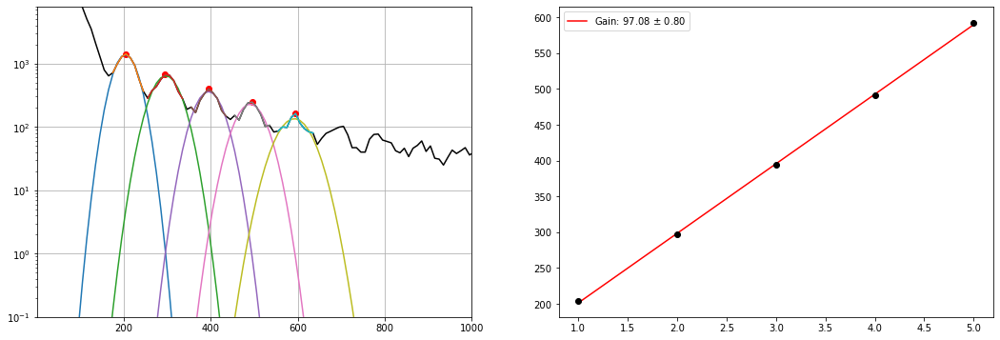

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_27.h5
Guess:  [1349, 205.0375457875458, 10]
Params:  [1317.64726018  203.72287352   25.06291687]
Guess:  [641, 305.0558608058608, 10]
Params:  [618.33807515 299.2259702   27.3359506 ]
Guess:  [361, 395.0723443223443, 10]
Params:  [341.70053496 396.26505683  30.3863989 ]
Guess:  [230, 495.09065934065933, 10]
Params:  [211.35840531 492.95742499  31.69913184]
Guess:  [144, 595.1089743589744, 10]
Params:  [136.02221881 590.62737631  35.51356182]


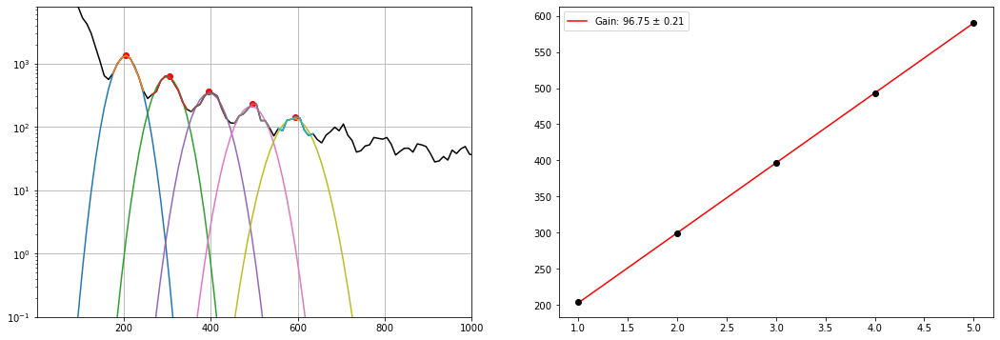

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_26.h5
Guess:  [1428, 205.0375457875458, 10]
Params:  [1401.86484057  203.30429116   24.84460871]
Guess:  [718, 305.0558608058608, 10]
Params:  [662.63767537 300.10922379  26.88633223]
Guess:  [386, 395.0723443223443, 10]
Params:  [362.53278716 396.19368002  29.77058908]
Guess:  [237, 495.09065934065933, 10]
Params:  [226.62799981 493.20291412  31.2226503 ]
Guess:  [142, 595.1089743589744, 10]
Params:  [130.52270962 589.31456198  37.55163535]


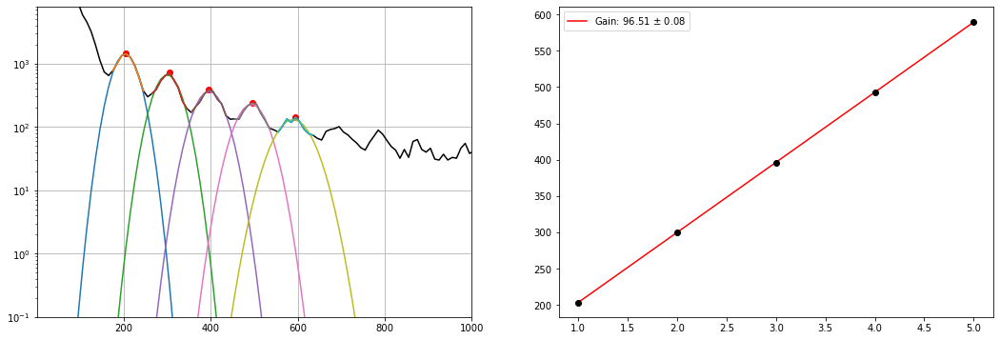

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_25.h5
Guess:  [1408, 205.0375457875458, 10]
Params:  [1408.14743769  203.4458286    24.65397883]
Guess:  [665, 305.0558608058608, 10]
Params:  [636.82828409 299.34610063  28.37756711]
Guess:  [388, 405.0741758241758, 10]
Params:  [358.0397297  396.92847562  29.96154502]
Guess:  [227, 495.09065934065933, 10]
Params:  [210.11538489 493.1703834   32.14159014]
Guess:  [144, 595.1089743589744, 10]
Params:  [145.01969075 591.7940485   31.46186598]


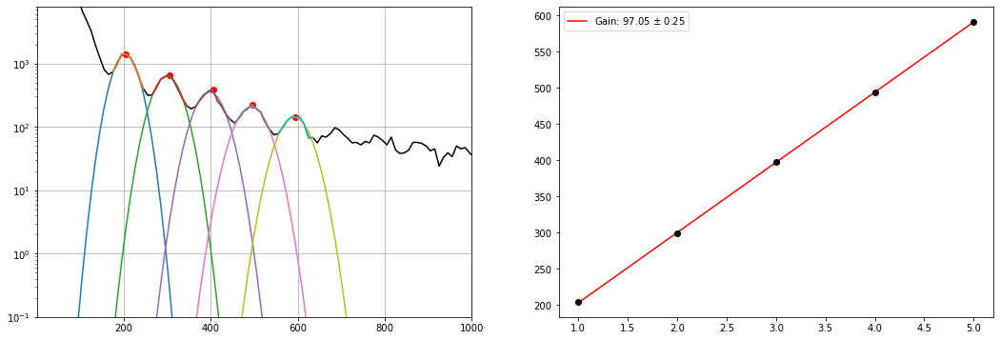

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_24.h5
Guess:  [1393, 205.0375457875458, 10]
Params:  [1409.75816584  204.13519621   24.47564005]
Guess:  [719, 305.0558608058608, 10]
Params:  [689.47039547 299.97362073  24.89369194]
Guess:  [359, 395.0723443223443, 10]
Params:  [326.69291331 396.15962331  32.75539338]
Guess:  [257, 495.09065934065933, 10]
Params:  [235.19240163 492.90214617  28.90078159]
Guess:  [155, 595.1089743589744, 10]
Params:  [144.83057363 591.70159486  30.38773984]


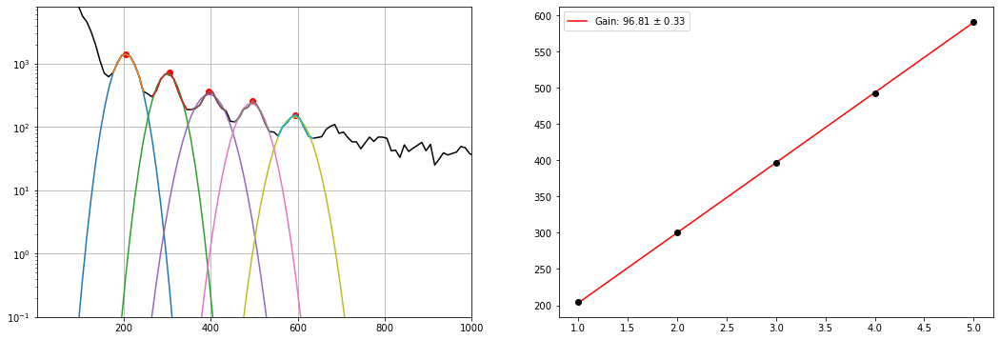

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_23.h5
Guess:  [1432, 205.0375457875458, 10]
Params:  [1416.57660248  203.39170721   23.98966753]
Guess:  [663, 305.0558608058608, 10]
Params:  [628.13475374 300.36925566  27.94676207]
Guess:  [364, 395.0723443223443, 10]
Params:  [342.6963514  394.6819719   29.23477963]
Guess:  [235, 495.09065934065933, 10]
Params:  [219.72652787 493.59531626  31.39528538]
Guess:  [133, 585.1071428571429, 10]
Params:  [134.25101078 586.21686277  37.8885585 ]


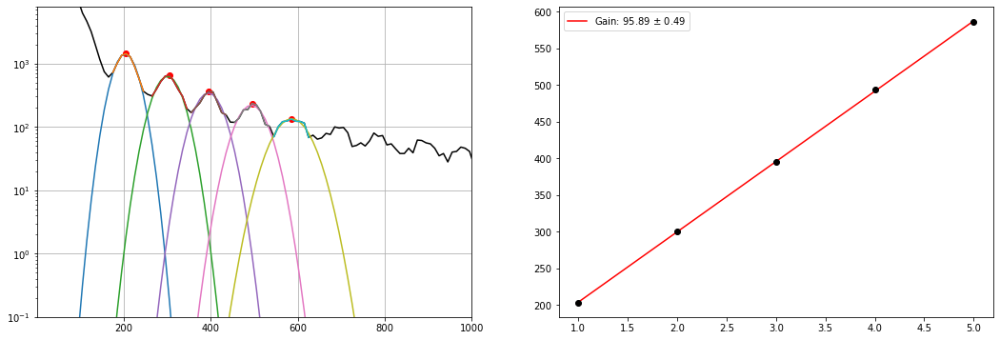

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_22.h5
Guess:  [1406, 205.0375457875458, 10]
Params:  [1334.41182254  203.50592578   24.97697074]
Guess:  [667, 305.0558608058608, 10]
Params:  [646.62660545 300.22746481  27.02975154]
Guess:  [365, 395.0723443223443, 10]
Params:  [344.07414013 395.40322497  30.49330142]
Guess:  [226, 495.09065934065933, 10]
Params:  [213.52859788 494.06511977  32.96832645]
Guess:  [163, 595.1089743589744, 10]
Params:  [149.42680617 590.41699181  31.46466414]


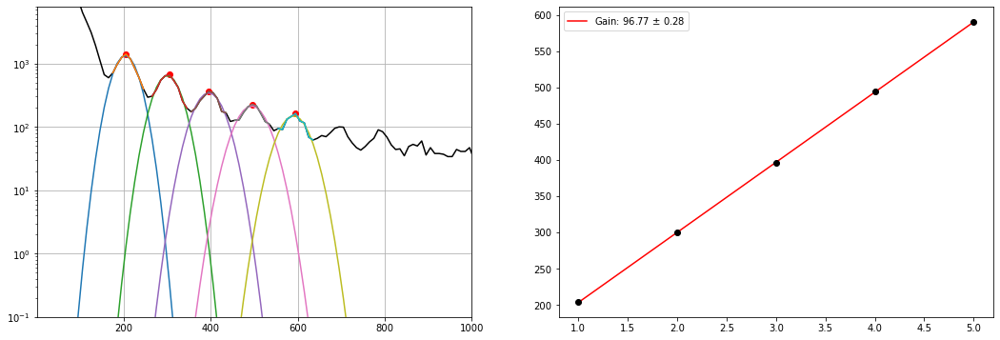

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_21.h5
Guess:  [1478, 205.0375457875458, 10]
Params:  [1430.23391317  203.84672829   23.77590965]
Guess:  [674, 295.0540293040293, 10]
Params:  [634.4631248  299.39312622  28.35300426]
Guess:  [373, 395.0723443223443, 10]
Params:  [345.72732211 396.92823977  31.93330029]
Guess:  [214, 485.0888278388278, 10]
Params:  [204.98919185 492.04523134  36.6170374 ]
Guess:  [144, 605.1108058608058, 10]
Params:  [135.21824586 593.55719669  34.23787659]


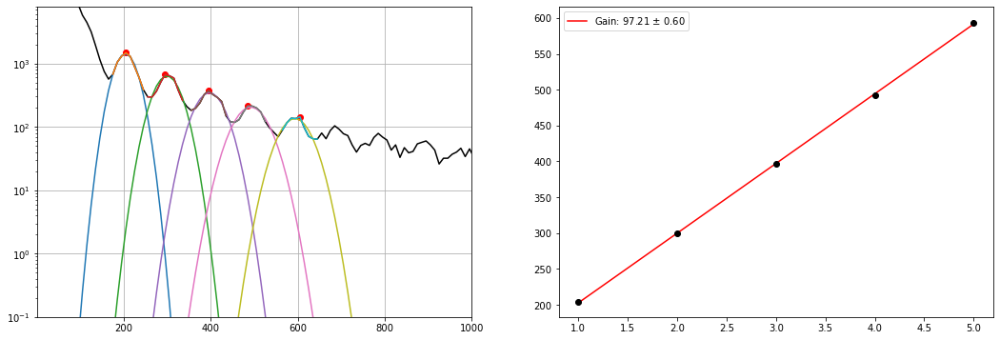

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_20.h5
Guess:  [1449, 205.0375457875458, 10]
Params:  [1429.088269    203.13221968   24.41656397]
Guess:  [698, 305.0558608058608, 10]
Params:  [679.38247432 300.84718247  25.92846615]
Guess:  [367, 385.0705128205128, 10]
Params:  [331.5365968  394.84171063  40.59252562]
Guess:  [216, 495.09065934065933, 10]
Params:  [205.61490632 493.15065904  34.97244011]
Guess:  [159, 595.1089743589744, 10]
Params:  [145.83750978 590.82263139  37.53731403]


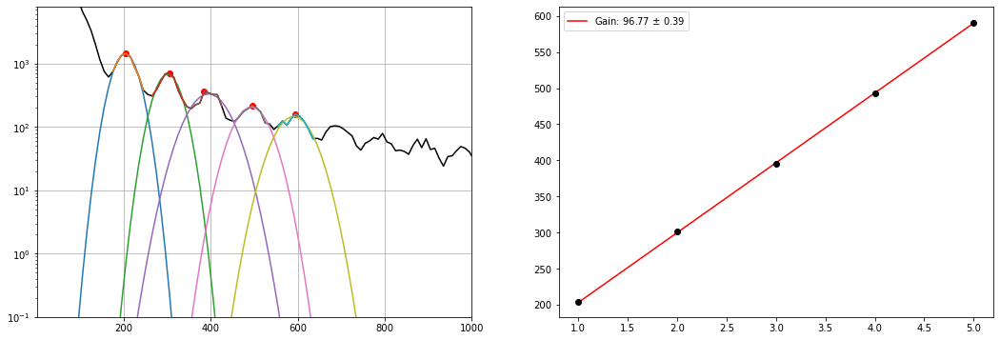

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_19.h5
Guess:  [1383, 205.0375457875458, 10]
Params:  [1356.55894042  203.62807814   25.23014499]
Guess:  [715, 295.0540293040293, 10]
Params:  [663.82271982 298.16890985  27.85175047]
Guess:  [389, 405.0741758241758, 10]
Params:  [377.21672114 398.04289779  27.85536994]
Guess:  [229, 495.09065934065933, 10]
Params:  [215.50890096 492.27856735  29.99080192]
Guess:  [158, 595.1089743589744, 10]
Params:  [151.24441246 591.00592497  31.59983369]


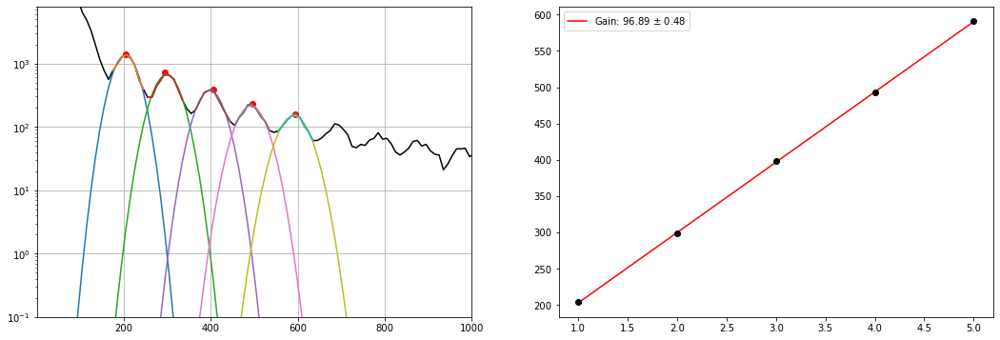

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_18.h5
Guess:  [1435, 205.0375457875458, 10]
Params:  [1419.0977656   204.08600242   23.59327529]
Guess:  [705, 305.0558608058608, 10]
Params:  [665.57798996 299.78581417  27.01269945]
Guess:  [384, 395.0723443223443, 10]
Params:  [355.7286309  396.62448616  30.88463281]
Guess:  [240, 495.09065934065933, 10]
Params:  [224.79015663 492.1691302   29.93427989]
Guess:  [165, 595.1089743589744, 10]
Params:  [150.36803599 591.78257169  31.34162756]


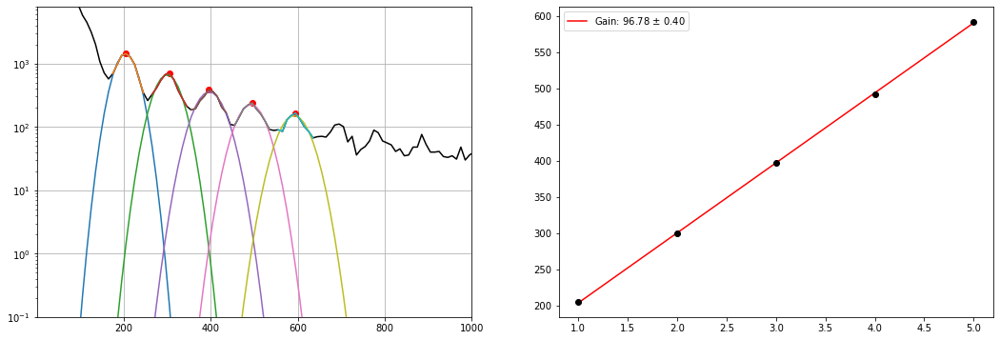

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_17.h5
Guess:  [1409, 205.0375457875458, 10]
Params:  [1392.18974495  203.88980261   24.12244207]
Guess:  [651, 295.0540293040293, 10]
Params:  [638.57399319 298.50224098  27.57866385]
Guess:  [370, 395.0723443223443, 10]
Params:  [345.95631362 395.51981984  31.19348818]
Guess:  [232, 495.09065934065933, 10]
Params:  [209.93512123 493.04922579  30.10992504]
Guess:  [153, 585.1071428571429, 10]
Params:  [135.71014604 587.82996093  35.55840364]


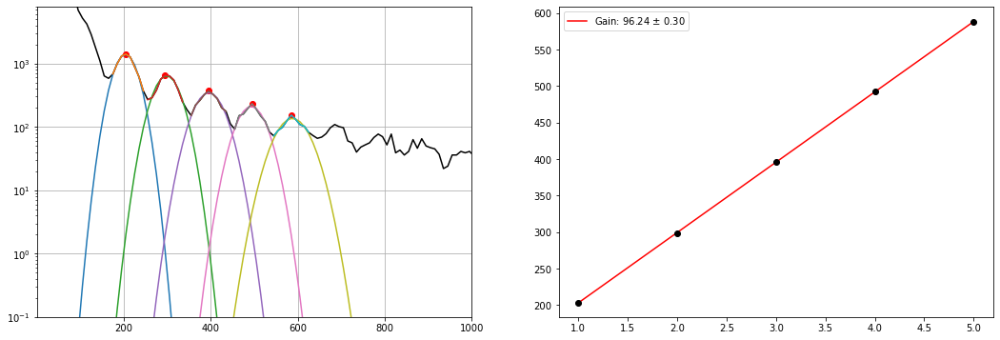

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_16.h5
Guess:  [1422, 205.0375457875458, 10]
Params:  [1406.9020745   203.83218595   24.86947908]
Guess:  [666, 295.0540293040293, 10]
Params:  [636.92003534 298.35349366  28.25355278]
Guess:  [390, 395.0723443223443, 10]
Params:  [347.60507037 396.41976664  28.89859769]
Guess:  [242, 495.09065934065933, 10]
Params:  [233.63593548 493.53215025  31.2381673 ]
Guess:  [159, 605.1108058608058, 10]
Params:  [142.54531194 596.87176764  32.08804232]


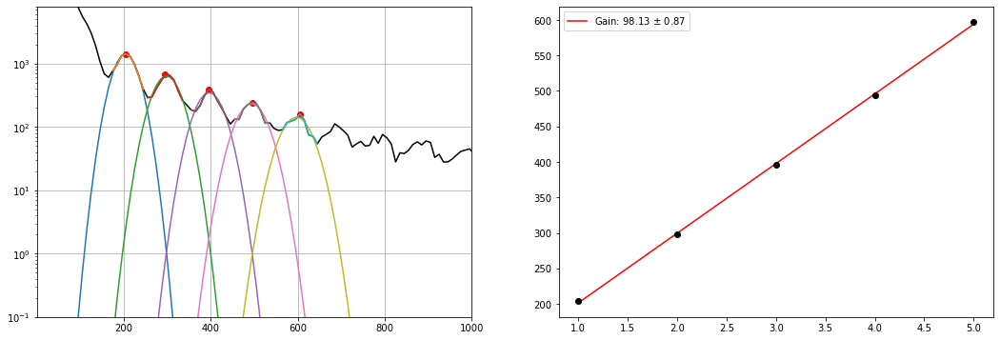

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_15.h5
Guess:  [1563, 205.0375457875458, 10]
Params:  [1455.67260162  203.57709203   23.91064362]
Guess:  [664, 295.0540293040293, 10]
Params:  [631.3079547  297.62454106  30.6927417 ]
Guess:  [367, 395.0723443223443, 10]
Params:  [347.87928973 396.35313197  31.93763268]
Guess:  [221, 485.0888278388278, 10]
Params:  [205.28034263 491.75174739  37.92856755]
Guess:  [161, 585.1071428571429, 10]
Params:  [139.51231493 588.47898453  39.67857007]


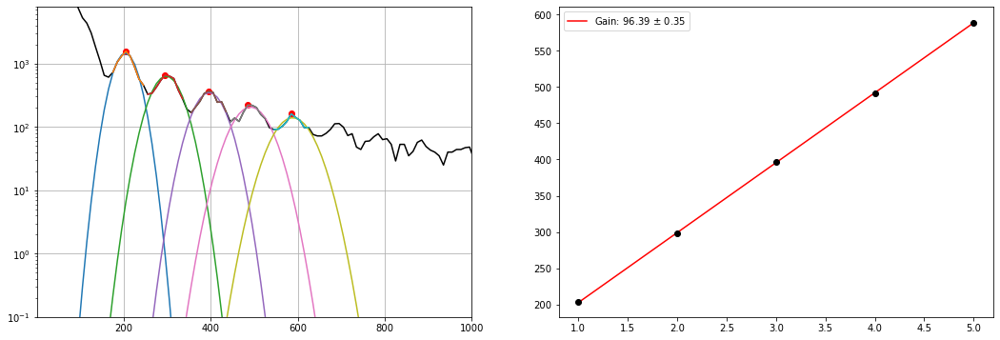

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_14.h5
Guess:  [1462, 205.0375457875458, 10]
Params:  [1445.54433523  203.6477001    23.25447895]
Guess:  [671, 305.0558608058608, 10]
Params:  [651.21351349 300.01966577  26.86242508]
Guess:  [377, 395.0723443223443, 10]
Params:  [349.54300999 395.61048059  30.12375846]
Guess:  [219, 485.0888278388278, 10]
Params:  [201.47288885 489.92178752  36.49463414]
Guess:  [157, 585.1071428571429, 10]
Params:  [150.34453585 588.2934805   30.40353236]


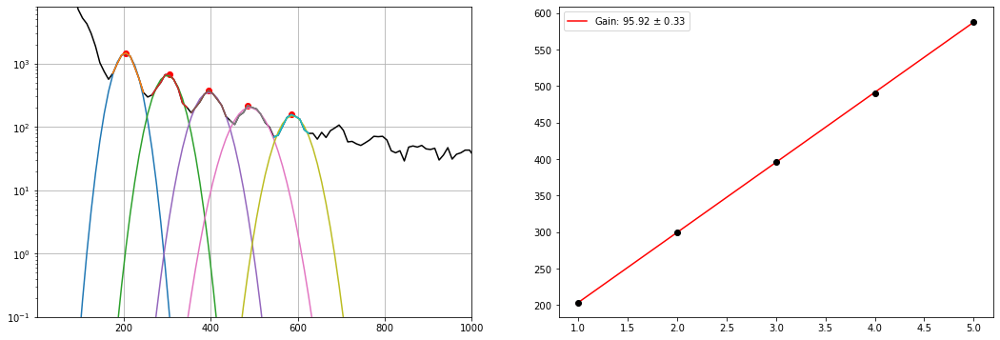

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_13.h5
Guess:  [1418, 205.0375457875458, 10]
Params:  [1386.94311836  203.90807433   23.96352606]
Guess:  [672, 305.0558608058608, 10]
Params:  [654.33751092 299.96999611  25.96653375]
Guess:  [369, 395.0723443223443, 10]
Params:  [353.26099722 395.61648623  28.01217729]
Guess:  [243, 495.09065934065933, 10]
Params:  [218.27666013 494.24400366  30.92391283]
Guess:  [143, 595.1089743589744, 10]
Params:  [138.73687012 590.95252993  30.10622007]


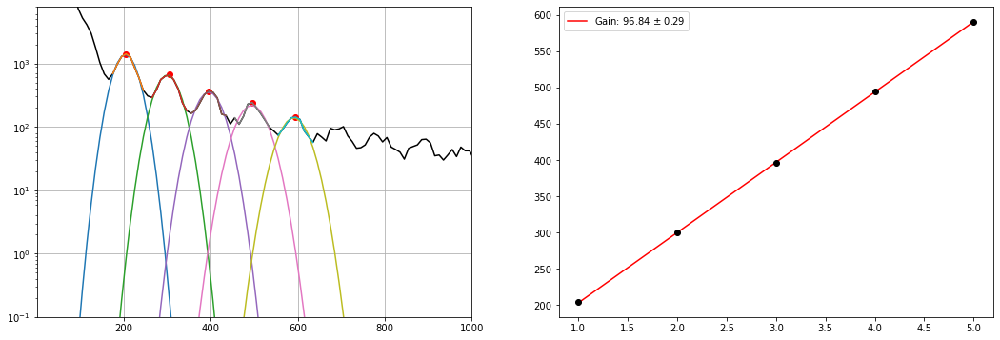

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_12.h5
Guess:  [1429, 205.0375457875458, 10]
Params:  [1401.74061168  203.50303083   24.2052886 ]
Guess:  [696, 295.0540293040293, 10]
Params:  [648.50245615 297.73228126  28.38174087]
Guess:  [379, 405.0741758241758, 10]
Params:  [357.08339699 397.00719987  27.97733797]
Guess:  [232, 495.09065934065933, 10]
Params:  [211.14741946 493.23780451  34.13496728]
Guess:  [140, 585.1071428571429, 10]
Params:  [142.47900476 589.76105849  37.26327665]


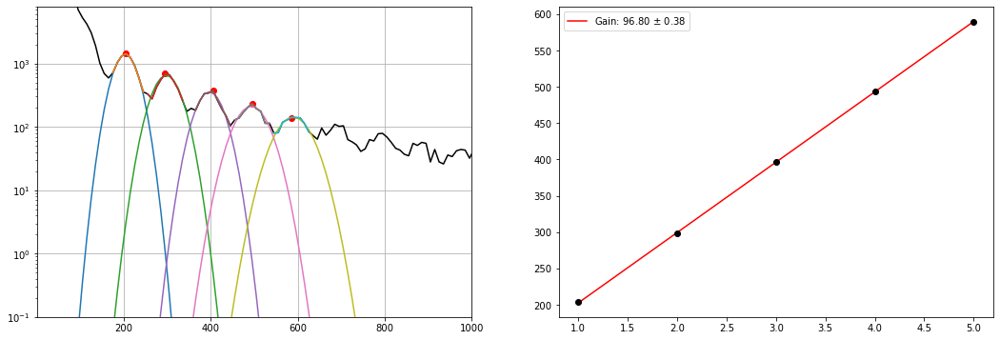

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_11.h5
Guess:  [1413, 205.0375457875458, 10]
Params:  [1390.79865729  204.17900178   23.91817361]
Guess:  [611, 295.0540293040293, 10]
Params:  [598.28929437 299.10819652  29.54580427]
Guess:  [407, 395.0723443223443, 10]
Params:  [364.22603442 394.6484273   28.21111246]
Guess:  [228, 495.09065934065933, 10]
Params:  [217.81692481 492.54382915  30.36450254]
Guess:  [139, 605.1108058608058, 10]
Params:  [133.8314958  593.44629752  34.30467952]


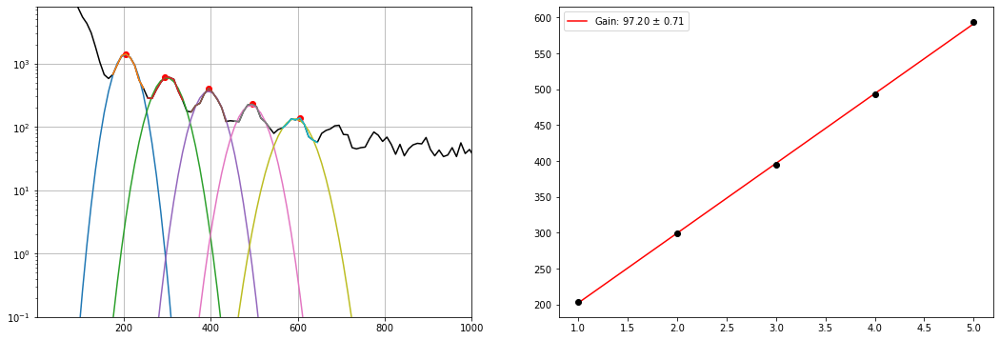

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_10.h5
Guess:  [1433, 205.0375457875458, 10]
Params:  [1411.48070972  203.76274167   23.71421957]
Guess:  [652, 305.0558608058608, 10]
Params:  [637.22142365 300.47839987  26.37627112]
Guess:  [402, 395.0723443223443, 10]
Params:  [380.40585407 395.61207998  26.60458713]
Guess:  [244, 505.09249084249086, 10]
Params:  [217.35861254 495.05357786  30.18555174]
Guess:  [163, 585.1071428571429, 10]
Params:  [147.40939927 589.51238992  33.55652409]


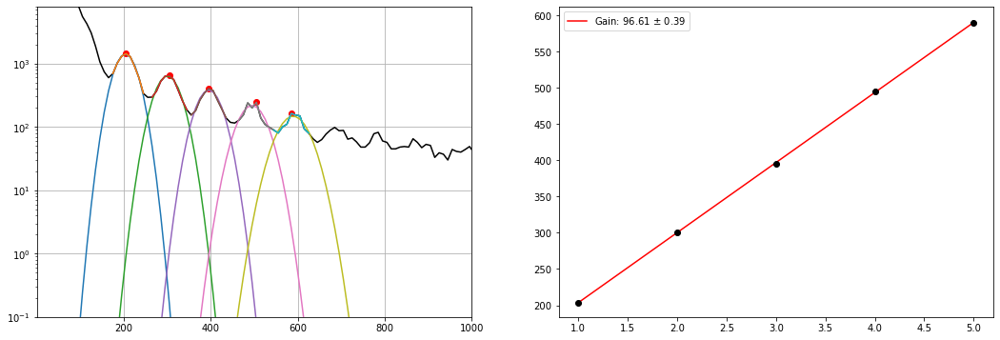

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_9.h5
Guess:  [1412, 205.0375457875458, 10]
Params:  [1378.68169552  203.48611494   24.32998489]
Guess:  [710, 305.0558608058608, 10]
Params:  [672.21598732 299.27991716  26.39050134]
Guess:  [371, 405.0741758241758, 10]
Params:  [351.78865039 397.15575141  29.45503543]
Guess:  [224, 495.09065934065933, 10]
Params:  [211.2259659  491.46430614  32.25928117]
Guess:  [165, 585.1071428571429, 10]
Params:  [145.53883434 584.29730719  33.9142789 ]


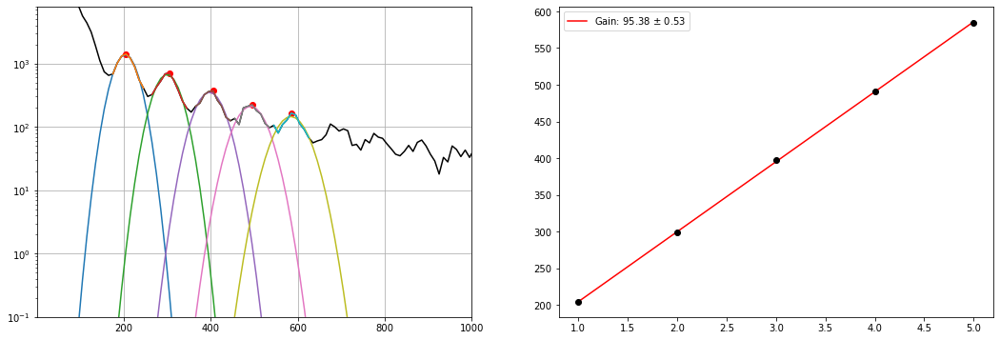

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_8.h5
Guess:  [1426, 205.0375457875458, 10]
Params:  [1341.91511745  203.90777357   23.87900515]
Guess:  [640, 305.0558608058608, 10]
Params:  [618.06649599 299.53567658  27.64674152]
Guess:  [373, 395.0723443223443, 10]
Params:  [354.84153383 395.43881193  30.65306127]
Guess:  [229, 505.09249084249086, 10]
Params:  [213.56011884 494.22095569  30.92481155]
Guess:  [150, 585.1071428571429, 10]
Params:  [131.12588922 589.11856253  39.43286379]


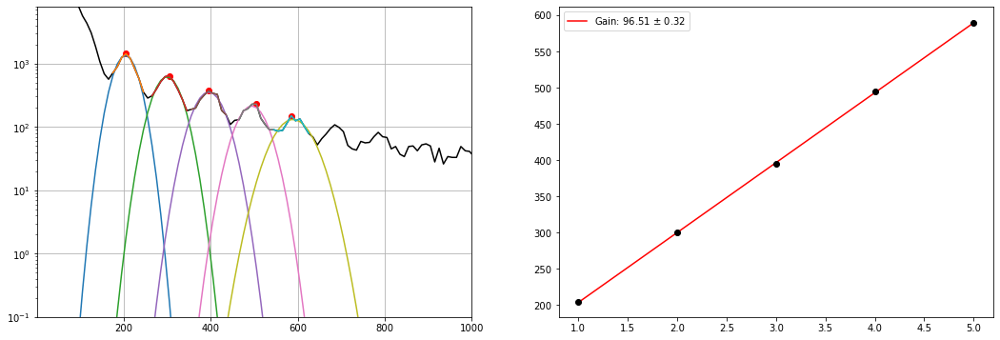

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_7.h5
Guess:  [1371, 205.0375457875458, 10]
Params:  [1368.44825113  203.61098378   24.78644991]
Guess:  [694, 295.0540293040293, 10]
Params:  [654.55454689 298.14549817  28.41510268]
Guess:  [355, 395.0723443223443, 10]
Params:  [360.66371612 395.99665307  29.54832484]
Guess:  [211, 495.09065934065933, 10]
Params:  [203.30874493 490.81264872  34.13066145]
Guess:  [143, 595.1089743589744, 10]
Params:  [141.79638973 593.6791661   31.33587995]


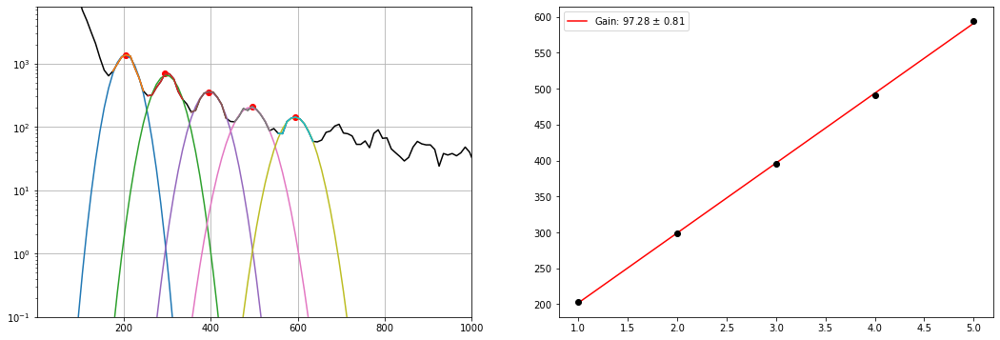

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_6.h5
Guess:  [1418, 205.0375457875458, 10]
Params:  [1366.60347891  204.50263421   23.5379652 ]
Guess:  [693, 305.0558608058608, 10]
Params:  [653.38141287 300.11302816  26.66011114]
Guess:  [368, 395.0723443223443, 10]
Params:  [342.19817478 397.11814443  30.22318908]
Guess:  [218, 495.09065934065933, 10]
Params:  [206.56204489 493.87680796  32.13576451]
Guess:  [154, 595.1089743589744, 10]
Params:  [138.95090346 594.27845775  32.71206139]


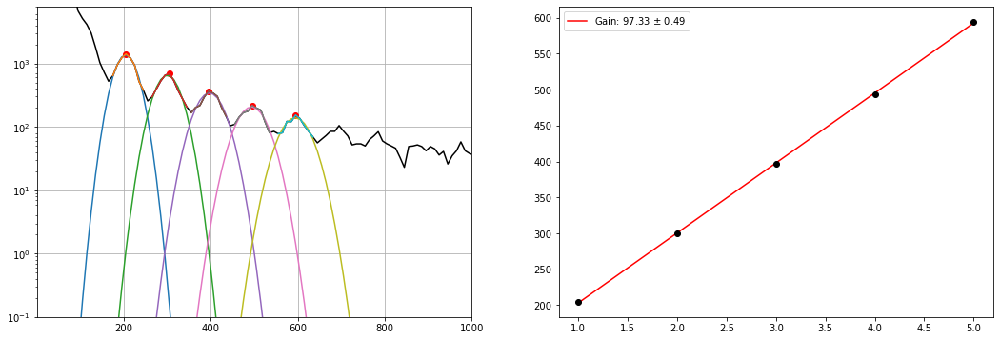

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_5.h5
Guess:  [1423, 205.0375457875458, 10]
Params:  [1415.83154907  203.86826028   24.03020578]
Guess:  [665, 305.0558608058608, 10]
Params:  [644.63124561 299.96824577  27.58424299]
Guess:  [363, 395.0723443223443, 10]
Params:  [345.66844442 395.0154319   31.21652303]
Guess:  [236, 495.09065934065933, 10]
Params:  [206.78359925 491.14957315  33.16779487]
Guess:  [168, 585.1071428571429, 10]
Params:  [142.5154845  589.01870587  36.32014269]


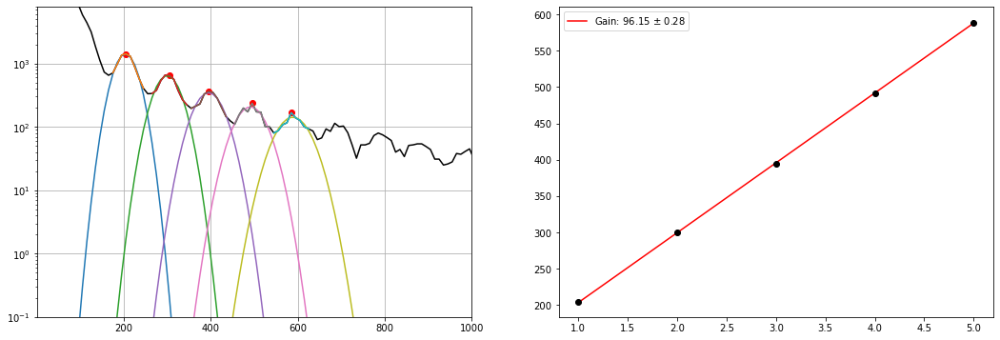

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_4.h5
Guess:  [1426, 205.0375457875458, 10]
Params:  [1395.36513715  203.32247474   23.97642655]
Guess:  [667, 305.0558608058608, 10]
Params:  [643.69493853 299.44640802  26.189731  ]
Guess:  [400, 395.0723443223443, 10]
Params:  [342.30783074 394.46960559  30.98243734]
Guess:  [218, 505.09249084249086, 10]
Params:  [212.62744946 491.83701818  32.21006994]
Guess:  [157, 585.1071428571429, 10]
Params:  [145.02508123 588.97421595  32.23701426]


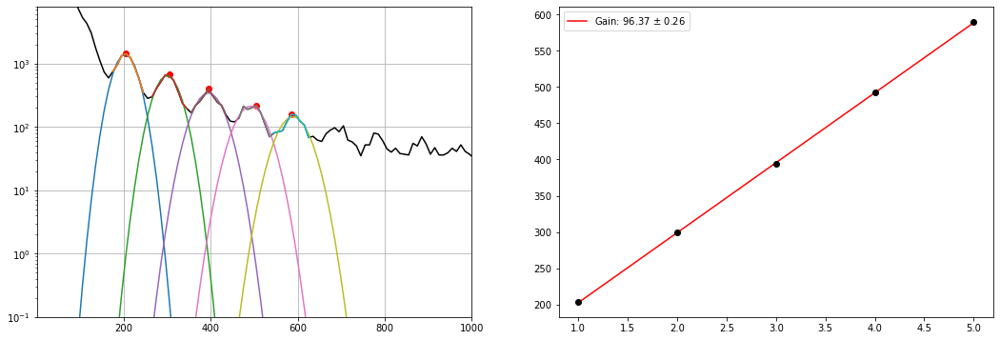

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_3.h5
Guess:  [1468, 205.0375457875458, 10]
Params:  [1385.96635524  204.08962327   23.73678937]
Guess:  [659, 295.0540293040293, 10]
Params:  [633.16808588 299.2657753   27.93838466]
Guess:  [410, 395.0723443223443, 10]
Params:  [379.12097582 395.45430206  25.93468427]
Guess:  [257, 495.09065934065933, 10]
Params:  [225.13081014 494.03004747  29.35458301]
Guess:  [145, 585.1071428571429, 10]
Params:  [135.4158374  588.15722172  35.19148024]


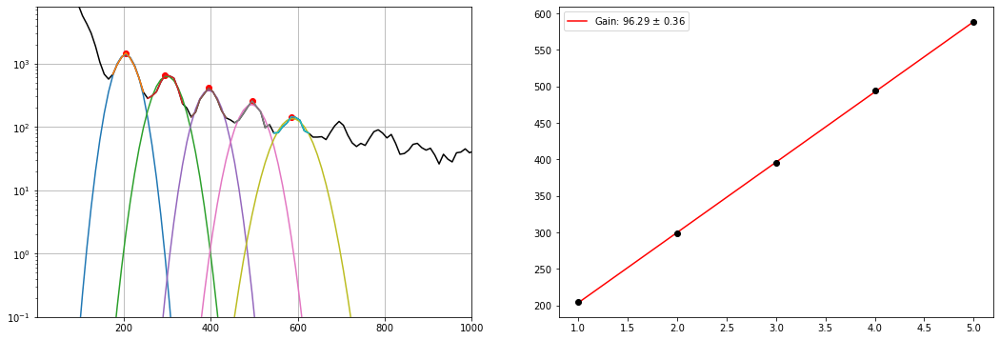

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_2.h5
Guess:  [1534, 205.0375457875458, 10]
Params:  [1438.98950698  204.27496963   23.0461564 ]
Guess:  [689, 305.0558608058608, 10]
Params:  [665.48096467 300.89969571  27.0348244 ]
Guess:  [373, 405.0741758241758, 10]
Params:  [364.5595437  395.84320387  28.77394573]
Guess:  [238, 495.09065934065933, 10]
Params:  [231.37506479 493.57417941  28.81086213]
Guess:  [157, 595.1089743589744, 10]
Params:  [135.78730092 591.23031951  37.05311538]


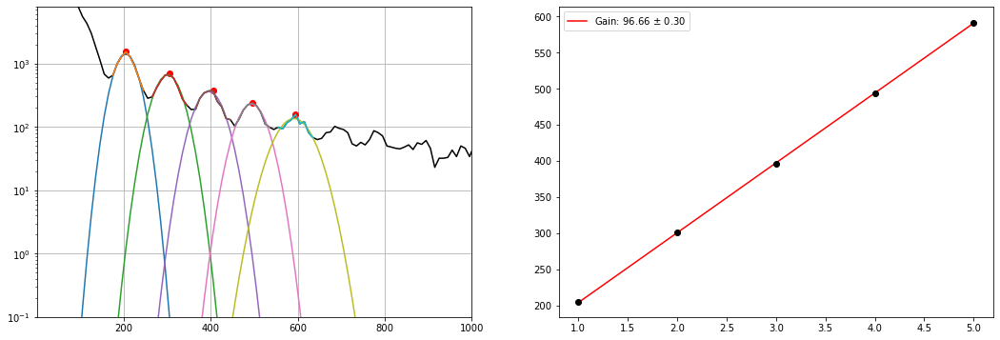

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_1.h5
Guess:  [1461, 205.0375457875458, 10]
Params:  [1424.97003214  204.22103401   24.33304183]
Guess:  [704, 295.0540293040293, 10]
Params:  [670.13197731 297.63852475  28.51719506]
Guess:  [385, 395.0723443223443, 10]
Params:  [362.83424032 396.4257211   30.26483555]
Guess:  [230, 485.0888278388278, 10]
Params:  [221.95064827 492.5994594   33.47514874]
Guess:  [181, 595.1089743589744, 10]
Params:  [150.68035478 593.30147795  31.39664651]


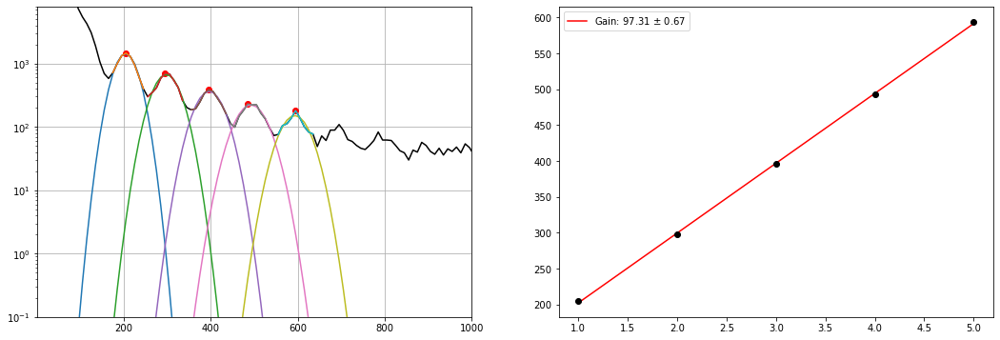

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_source_0.h5
Guess:  [1474, 205.0375457875458, 10]
Params:  [1402.12434421  203.73749808   23.88860336]
Guess:  [690, 295.0540293040293, 10]
Params:  [660.86510987 298.78400769  27.59704317]
Guess:  [379, 395.0723443223443, 10]
Params:  [347.4539097  395.41640687  31.20187733]
Guess:  [244, 485.0888278388278, 10]
Params:  [222.86666428 491.25431124  33.69486864]
Guess:  [173, 585.1071428571429, 10]
Params:  [156.32247847 588.33092715  32.44328071]


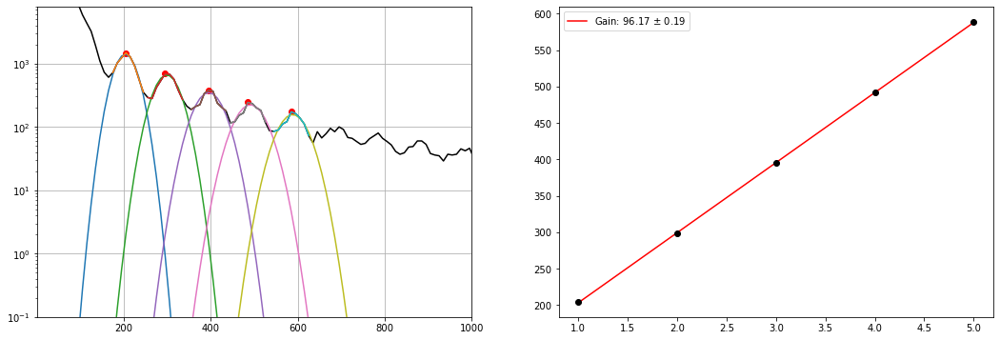

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_34.h5
Guess:  [387, 195.03571428571428, 10]
Params:  [375.48863005 200.86933383  24.82837515]
Guess:  [306, 295.0540293040293, 10]
Params:  [263.32216337 293.62310252  31.60807073]
Guess:  [196, 405.0741758241758, 10]
Params:  [184.76384636 384.76598067  53.3103334 ]
Guess:  [136, 485.0888278388278, 10]
Params:  [130.34342943 474.62121206  54.16346136]


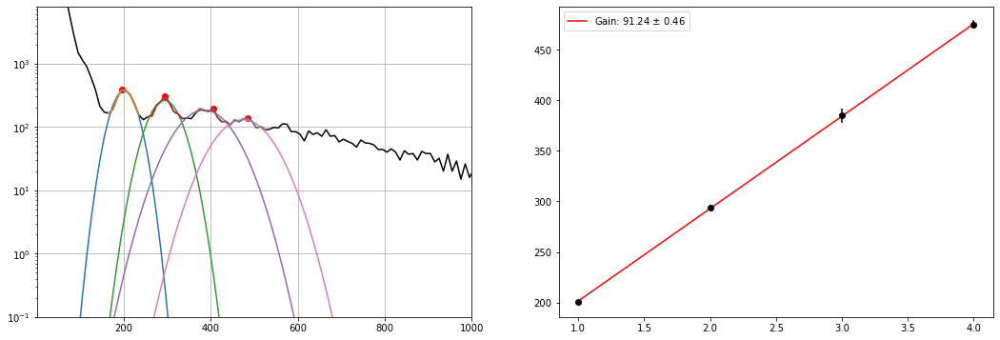

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_33.h5
Guess:  [400, 205.0375457875458, 10]
Params:  [366.39019167 201.98278496  26.23582496]
Guess:  [269, 285.05219780219784, 10]
Params:  [257.57713162 291.37382225  31.74538022]
Guess:  [202, 385.0705128205128, 10]
Params:  [183.13039579 380.94658099  43.99709496]
Guess:  [154, 475.0869963369963, 10]
Params:  [153.59181768 475.41369172  37.98654552]


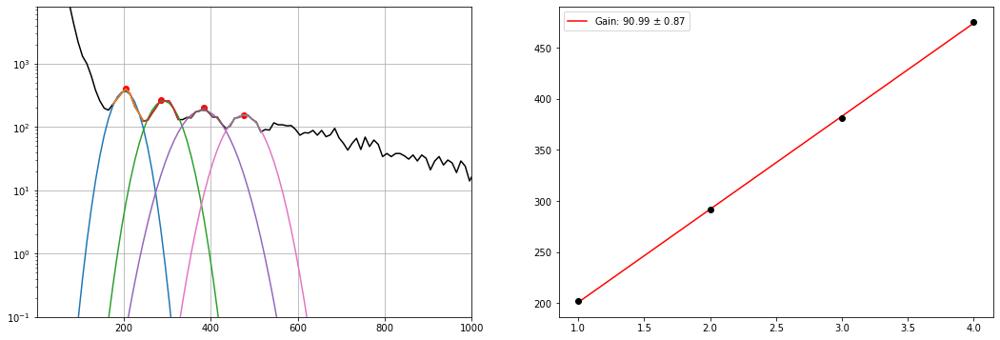

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_32.h5
Guess:  [390, 205.0375457875458, 10]
Params:  [373.61575541 201.01441154  26.43845724]
Guess:  [269, 295.0540293040293, 10]
Params:  [266.27707709 292.85467877  29.20651526]
Guess:  [196, 385.0705128205128, 10]
Params:  [181.53948371 384.66618048  41.72747866]
Guess:  [153, 465.08516483516485, 10]
Params:  [141.57286451 464.19707986  56.37259122]


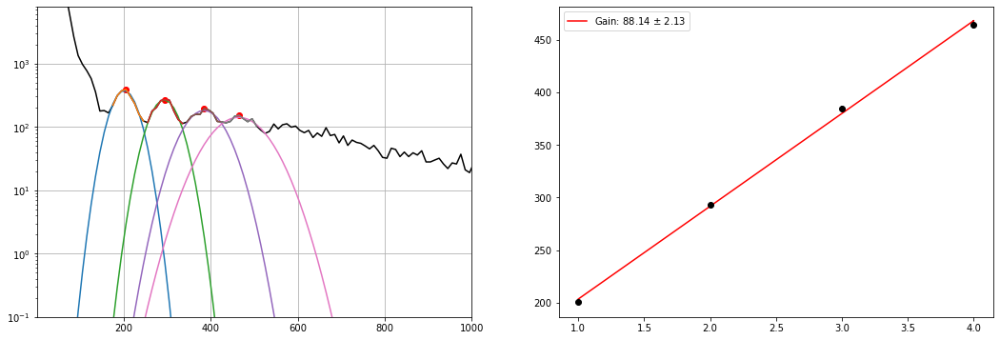

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_31.h5
Guess:  [377, 195.03571428571428, 10]
Params:  [372.32667793 201.42996014  25.50281757]
Guess:  [277, 295.0540293040293, 10]
Params:  [256.00911083 295.17353328  29.054508  ]
Guess:  [193, 375.06868131868134, 10]
Params:  [188.50971452 383.62850987  41.53619961]
Guess:  [151, 485.0888278388278, 10]
Params:  [141.46036895 478.5217321   41.76391434]


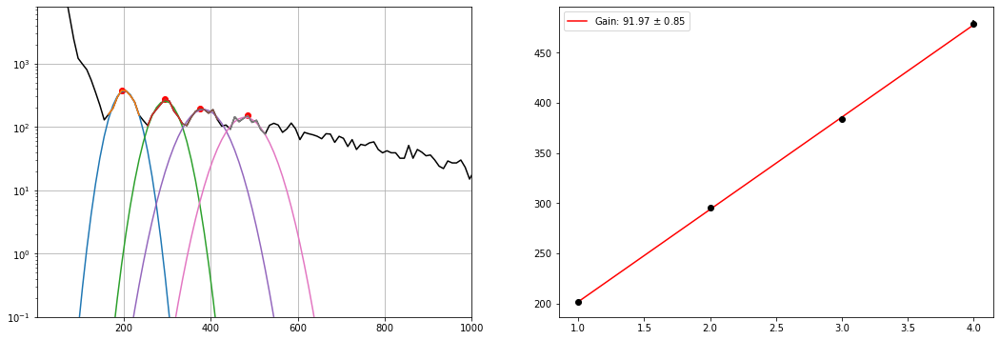

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_30.h5
Guess:  [383, 195.03571428571428, 10]
Params:  [389.90000991 199.97413382  24.89244738]
Guess:  [254, 295.0540293040293, 10]
Params:  [250.40489949 293.34641434  31.03939002]
Guess:  [219, 385.0705128205128, 10]
Params:  [198.8618934  383.67515312  34.31051249]
Guess:  [137, 465.08516483516485, 10]
Params:  [134.46879065 466.87912751  78.84298497]


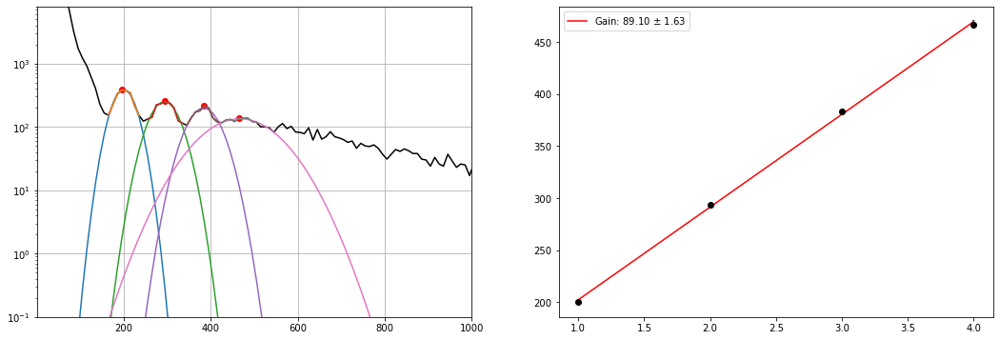

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_29.h5
Guess:  [361, 205.0375457875458, 10]
Params:  [363.40992194 202.60967104  25.92042727]
Guess:  [273, 295.0540293040293, 10]
Params:  [245.8909015  295.46351967  31.20431307]
Guess:  [212, 385.0705128205128, 10]
Params:  [189.85933357 385.52997508  38.97111377]
Guess:  [153, 465.08516483516485, 10]
Params:  [139.31288151 469.58808873  53.97763674]


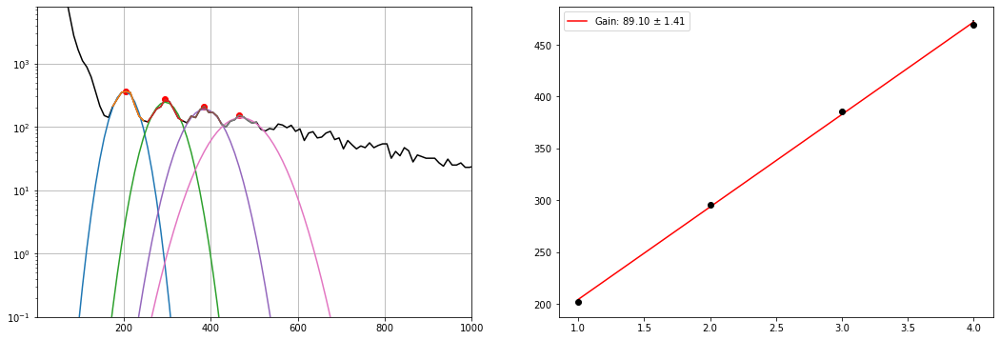

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_28.h5
Guess:  [410, 205.0375457875458, 10]
Params:  [388.56207547 200.82438843  25.94078008]
Guess:  [247, 285.05219780219784, 10]
Params:  [240.09286953 294.58911474  35.28108892]
Guess:  [212, 385.0705128205128, 10]
Params:  [198.12726484 383.6536692   34.87929954]
Guess:  [149, 475.0869963369963, 10]
Params:  [138.48432872 472.93615715  52.12368098]


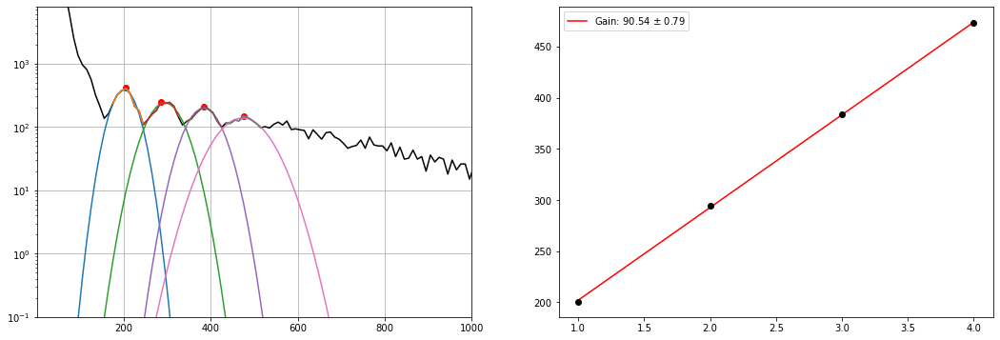

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_27.h5
Guess:  [388, 195.03571428571428, 10]
Params:  [370.76387792 200.32838548  24.27860336]
Guess:  [289, 285.05219780219784, 10]
Params:  [261.55686698 291.5697276   30.47897971]
Guess:  [209, 375.06868131868134, 10]
Params:  [184.99202994 382.95086507  41.87660701]
Guess:  [143, 465.08516483516485, 10]
Params:  [134.3529828  464.58787412  60.40641571]


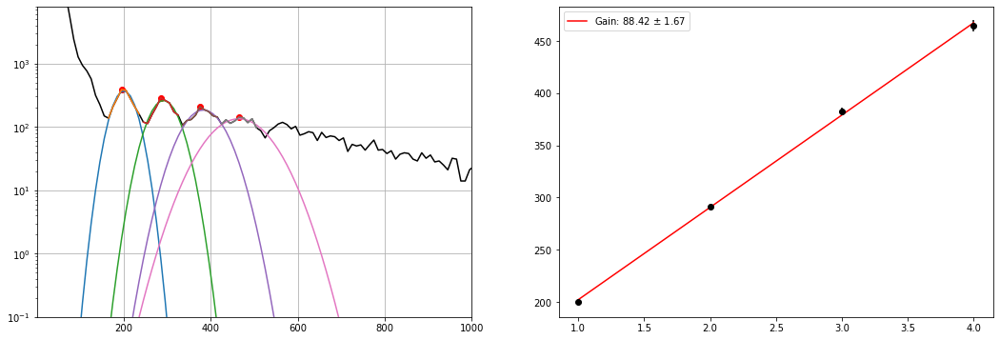

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_26.h5
Guess:  [409, 205.0375457875458, 10]
Params:  [395.03962792 201.16190403  25.09151747]
Guess:  [261, 285.05219780219784, 10]
Params:  [249.60437562 292.67287786  34.21858889]
Guess:  [210, 385.0705128205128, 10]
Params:  [199.66980681 382.08176031  37.81849636]
Guess:  [172, 475.0869963369963, 10]
Params:  [154.90974514 474.27757082  39.4301125 ]


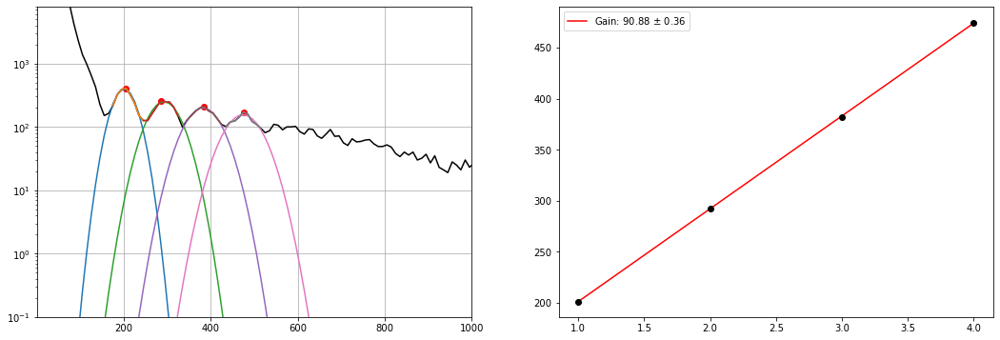

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_25.h5
Guess:  [391, 205.0375457875458, 10]
Params:  [371.48931182 203.37428849  25.52267757]
Guess:  [269, 295.0540293040293, 10]
Params:  [248.89155744 294.13195383  33.27389845]
Guess:  [201, 385.0705128205128, 10]
Params:  [191.53343136 385.91241591  39.24763621]
Guess:  [149, 475.0869963369963, 10]
Params:  [132.89695438 468.44846917  52.70070317]


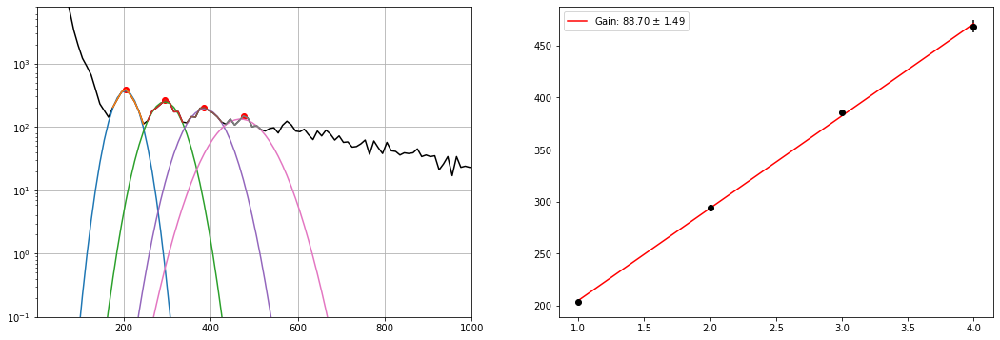

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_24.h5
Guess:  [405, 195.03571428571428, 10]
Params:  [397.13304909 200.48326819  23.46023485]
Guess:  [270, 285.05219780219784, 10]
Params:  [238.49003889 291.34041173  32.78200849]
Guess:  [195, 385.0705128205128, 10]
Params:  [174.77240681 388.1303896   48.00966141]
Guess:  [143, 495.09065934065933, 10]
Params:  [133.85770776 474.74260295  59.0789161 ]


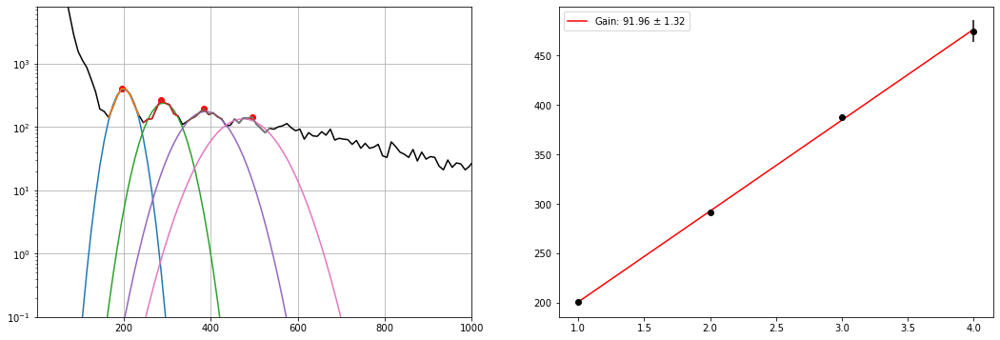

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_23.h5
Guess:  [408, 205.0375457875458, 10]
Params:  [387.78605192 202.22314912  24.5095703 ]
Guess:  [281, 285.05219780219784, 10]
Params:  [273.71414687 291.20187671  30.26334068]
Guess:  [204, 385.0705128205128, 10]
Params:  [192.64221845 384.93925268  38.82239299]
Guess:  [162, 485.0888278388278, 10]
Params:  [148.01278157 475.70740447  44.84945394]


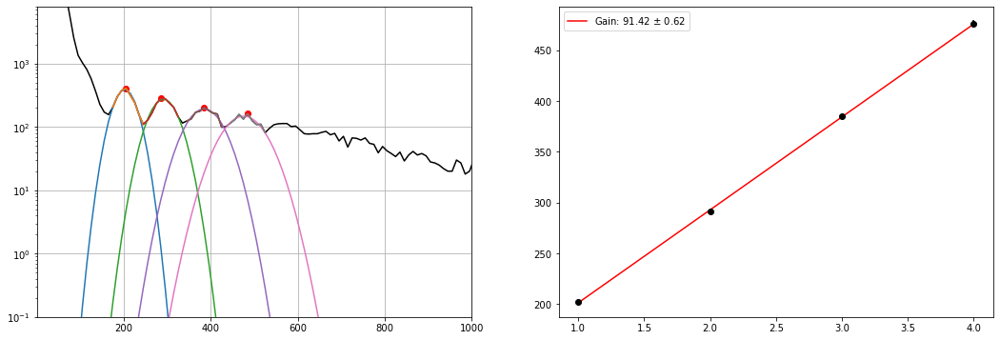

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_22.h5
Guess:  [389, 195.03571428571428, 10]
Params:  [361.61841647 201.21076628  25.70356108]
Guess:  [268, 295.0540293040293, 10]
Params:  [261.07711446 291.51496417  31.40499358]
Guess:  [204, 395.0723443223443, 10]
Params:  [183.58835849 383.30301708  42.36663128]
Guess:  [137, 485.0888278388278, 10]
Params:  [128.16968915 471.90944105  64.97884152]


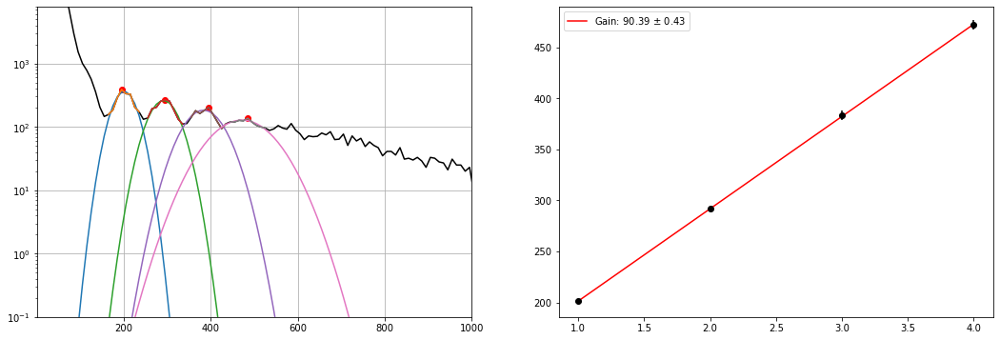

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_21.h5
Guess:  [409, 205.0375457875458, 10]
Params:  [383.93120046 202.6717352   24.99936326]
Guess:  [302, 295.0540293040293, 10]
Params:  [274.97584194 296.2555487   30.61464202]
Guess:  [215, 385.0705128205128, 10]
Params:  [193.79505621 383.86817101  39.20543649]
Guess:  [158, 495.09065934065933, 10]
Params:  [138.65683824 478.4538948   67.05293105]


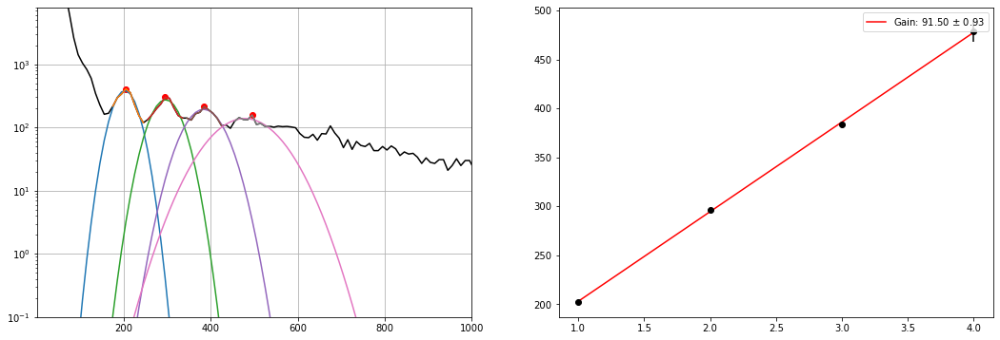

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_20.h5
Guess:  [379, 205.0375457875458, 10]
Params:  [371.72740756 202.77286786  24.97162232]
Guess:  [285, 305.0558608058608, 10]
Params:  [263.45251174 296.87024559  32.43521149]
Guess:  [196, 385.0705128205128, 10]
Params:  [168.28544873 381.69047298  49.96651088]
Guess:  [168, 475.0869963369963, 10]
Params:  [147.16922371 471.19921266  44.97057016]


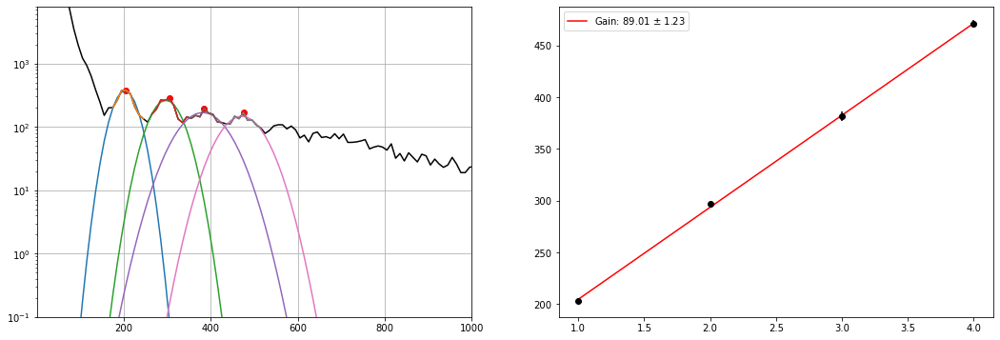

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_19.h5
Guess:  [383, 205.0375457875458, 10]
Params:  [378.96875599 203.16278367  25.62157666]
Guess:  [272, 295.0540293040293, 10]
Params:  [259.73212832 293.27728622  32.34854508]
Guess:  [209, 385.0705128205128, 10]
Params:  [196.75155948 385.8748549   32.98502412]
Guess:  [147, 485.0888278388278, 10]
Params:  [141.58583614 477.67583875  52.56779479]


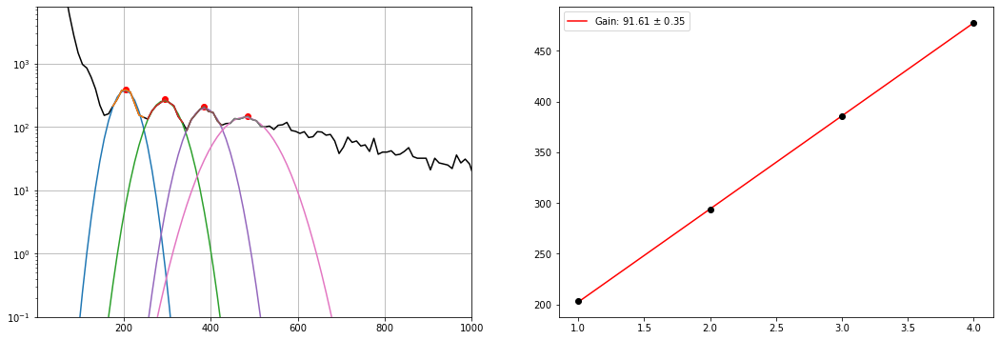

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_18.h5
Guess:  [357, 195.03571428571428, 10]
Params:  [353.23289515 200.01420646  26.8154226 ]
Guess:  [247, 285.05219780219784, 10]
Params:  [248.74068155 292.54308883  32.41143551]
Guess:  [223, 375.06868131868134, 10]
Params:  [195.80901909 380.69890076  38.63215697]
Guess:  [155, 465.08516483516485, 10]
Params:  [145.82319855 471.65865596  48.89469963]


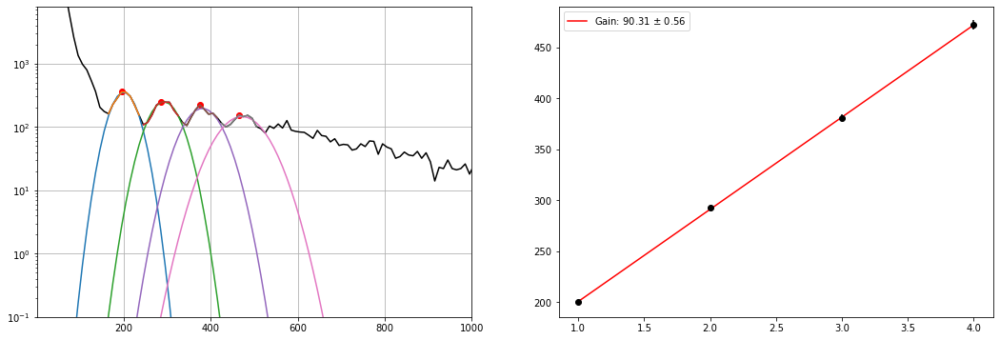

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_17.h5
Guess:  [398, 205.0375457875458, 10]
Params:  [372.43584846 203.52998104  23.94495199]
Guess:  [256, 285.05219780219784, 10]
Params:  [239.83035205 293.89148065  35.17231542]
Guess:  [214, 385.0705128205128, 10]
Params:  [193.62299975 384.4507697   34.26339336]
Guess:  [153, 475.0869963369963, 10]
Params:  [141.6401883  473.56002174  48.59245872]


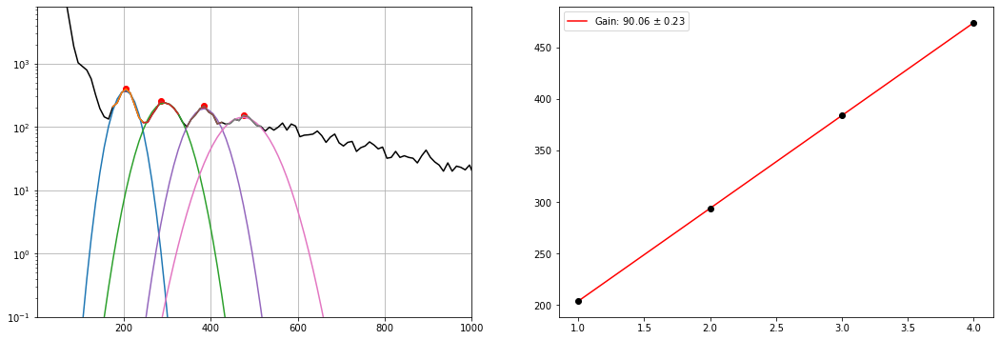

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_16.h5
Guess:  [401, 205.0375457875458, 10]
Params:  [403.28610708 202.42191232  24.20522113]
Guess:  [276, 295.0540293040293, 10]
Params:  [254.73519459 293.27357476  33.65362616]
Guess:  [212, 385.0705128205128, 10]
Params:  [195.06835825 385.6039147   37.48292613]
Guess:  [145, 475.0869963369963, 10]
Params:  [143.58057024 475.34949613  48.34603525]


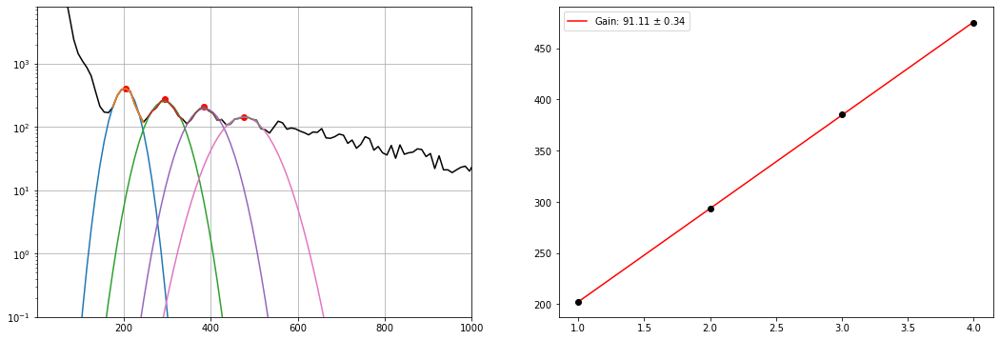

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_15.h5
Guess:  [381, 205.0375457875458, 10]
Params:  [389.79207111 202.38757169  25.092302  ]
Guess:  [304, 295.0540293040293, 10]
Params:  [276.72358253 294.24600277  28.031386  ]
Guess:  [214, 375.06868131868134, 10]
Params:  [196.00571336 382.92195327  37.21972471]
Guess:  [143, 495.09065934065933, 10]
Params:  [128.54359995 480.32895245  70.75029549]


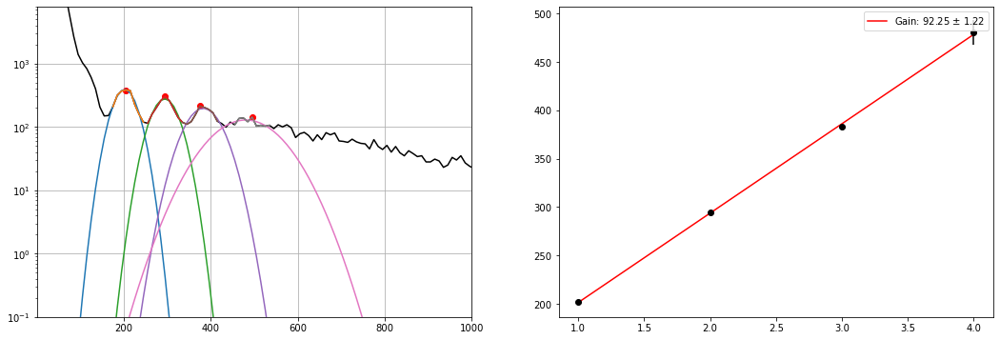

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_14.h5
Guess:  [401, 205.0375457875458, 10]
Params:  [397.90848564 201.91628002  24.08990838]
Guess:  [264, 285.05219780219784, 10]
Params:  [255.84809514 291.83519332  30.65873258]
Guess:  [196, 385.0705128205128, 10]
Params:  [187.12009359 381.95197951  38.19346142]
Guess:  [161, 465.08516483516485, 10]
Params:  [140.75586622 467.4626011   45.43519331]


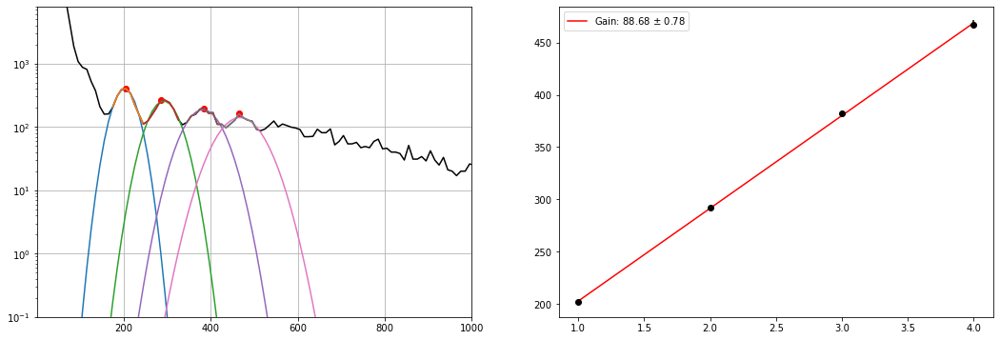

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_13.h5
Guess:  [382, 205.0375457875458, 10]
Params:  [376.22972826 202.30233649  25.22765118]
Guess:  [261, 295.0540293040293, 10]
Params:  [244.24331453 293.59541575  32.36543251]
Guess:  [204, 375.06868131868134, 10]
Params:  [192.01903206 380.20429218  38.06506865]
Guess:  [161, 475.0869963369963, 10]
Params:  [142.5434245  472.75610016  45.41987852]


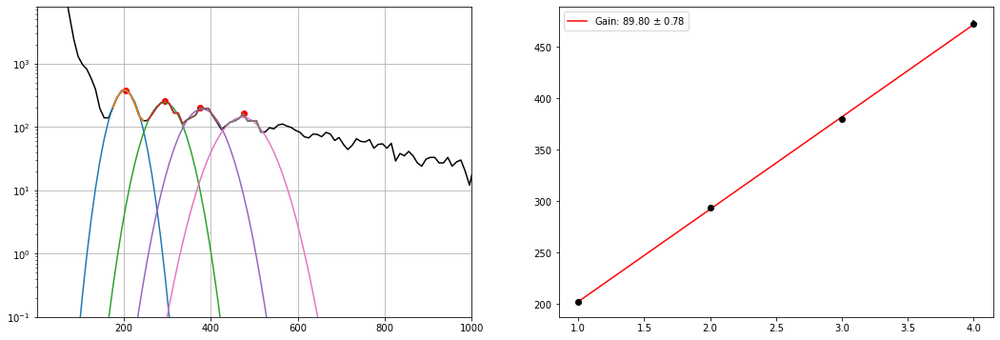

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_12.h5
Guess:  [378, 205.0375457875458, 10]
Params:  [369.89796545 202.42199749  23.45107275]
Guess:  [258, 295.0540293040293, 10]
Params:  [254.18611125 292.20467775  30.26026128]
Guess:  [185, 395.0723443223443, 10]
Params:  [173.38467893 383.68431219  43.72799615]
Guess:  [149, 465.08516483516485, 10]
Params:  [131.11155159 476.03689679  69.18890264]


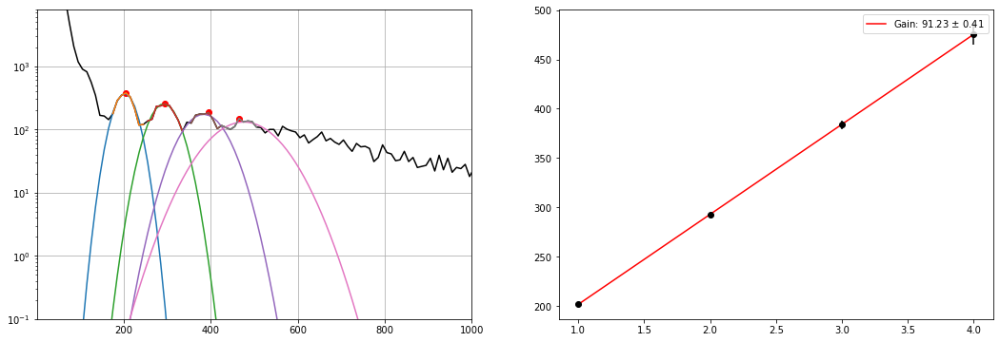

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_11.h5
Guess:  [402, 205.0375457875458, 10]
Params:  [376.39470321 201.80656195  24.79847086]
Guess:  [251, 285.05219780219784, 10]
Params:  [237.08057147 291.50088384  33.22857652]
Guess:  [186, 375.06868131868134, 10]
Params:  [172.72324405 379.59941261  41.34419462]
Guess:  [141, 495.09065934065933, 10]
Params:  [130.93559772 482.25262936  61.19977156]


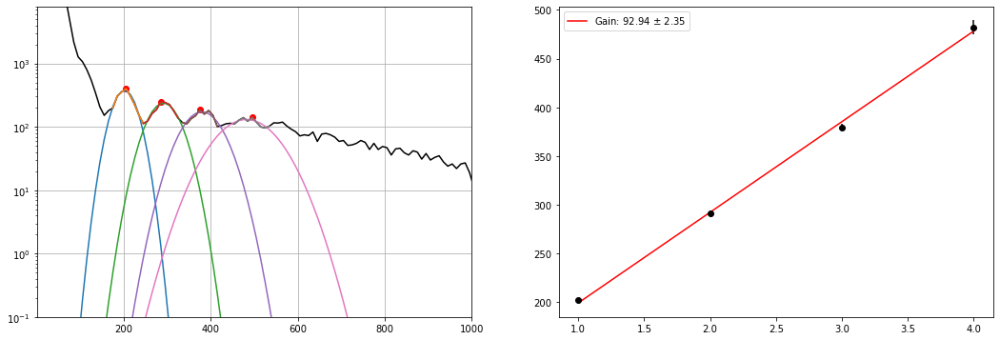

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_10.h5
Guess:  [385, 205.0375457875458, 10]
Params:  [365.55841345 201.79922012  24.5828228 ]
Guess:  [276, 285.05219780219784, 10]
Params:  [257.87585655 291.49048344  28.74414604]
Guess:  [209, 385.0705128205128, 10]
Params:  [194.12899137 384.27791964  35.77707374]
Guess:  [149, 485.0888278388278, 10]
Params:  [141.61456873 469.87145198  47.9340337 ]


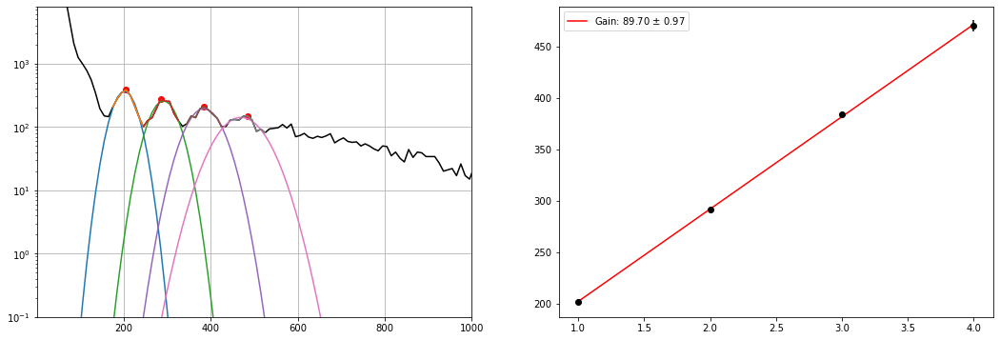

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_9.h5
Guess:  [434, 205.0375457875458, 10]
Params:  [410.78507187 201.38688233  24.11561049]
Guess:  [295, 295.0540293040293, 10]
Params:  [268.77961727 292.498377    30.39205127]
Guess:  [210, 375.06868131868134, 10]
Params:  [196.94610513 380.21429168  39.43144336]
Guess:  [179, 465.08516483516485, 10]
Params:  [154.45660426 473.27954105  49.77678932]


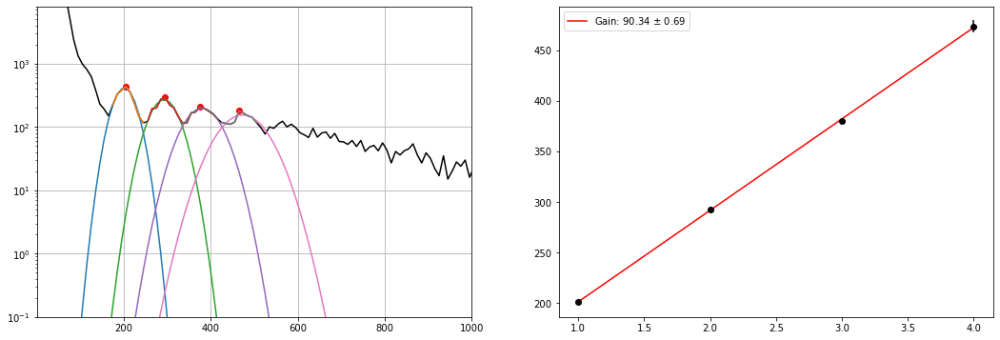

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_8.h5
Guess:  [389, 205.0375457875458, 10]
Params:  [378.7441413  201.66746552  24.99274297]
Guess:  [268, 295.0540293040293, 10]
Params:  [258.40858887 293.75960868  30.74838563]
Guess:  [191, 385.0705128205128, 10]
Params:  [189.25257741 381.27570136  38.46649162]
Guess:  [144, 485.0888278388278, 10]
Params:  [135.73101701 476.24303677  58.7147962 ]


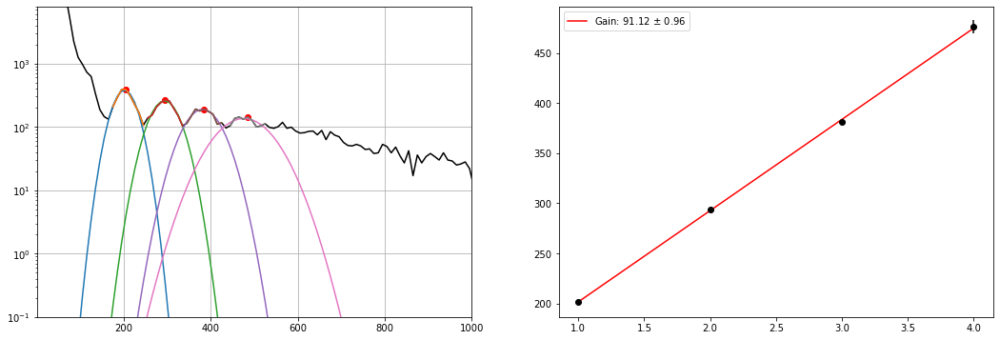

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_7.h5
Guess:  [390, 205.0375457875458, 10]
Params:  [380.55817608 202.49739794  24.09389146]
Guess:  [273, 295.0540293040293, 10]
Params:  [253.56956004 291.88099021  31.32305749]
Guess:  [194, 395.0723443223443, 10]
Params:  [184.52464919 386.05916618  45.00372226]
Guess:  [145, 465.08516483516485, 10]
Params:  [131.36959184 469.22035842  66.89675085]


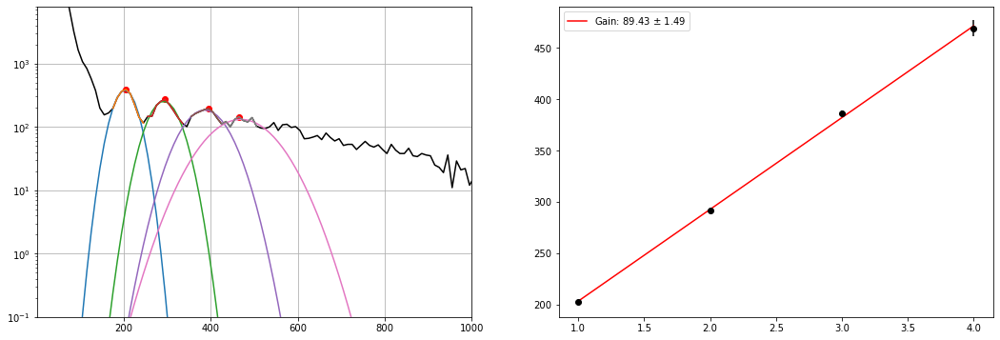

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_6.h5
Guess:  [452, 205.0375457875458, 10]
Params:  [393.30911037 202.96882816  23.34843018]
Guess:  [262, 295.0540293040293, 10]
Params:  [260.14458222 293.31328635  29.42029145]
Guess:  [201, 395.0723443223443, 10]
Params:  [191.97084994 387.15660997  39.51973851]
Guess:  [157, 485.0888278388278, 10]
Params:  [151.16088374 483.92990842  39.78040221]


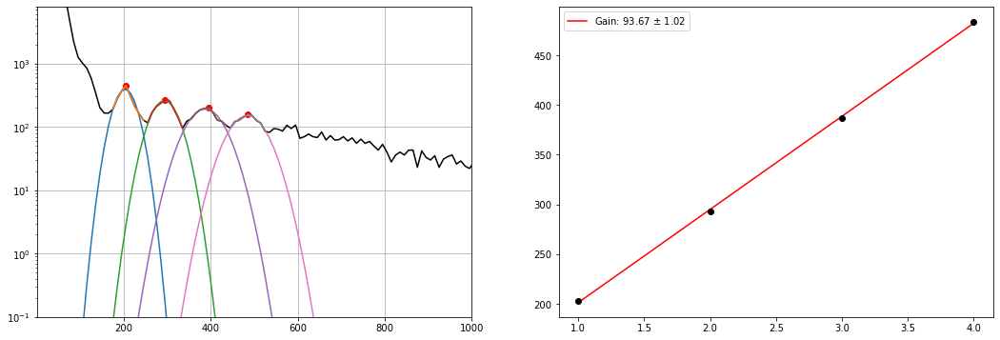

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_5.h5
Guess:  [389, 205.0375457875458, 10]
Params:  [383.55921242 201.91114367  23.90866933]
Guess:  [262, 295.0540293040293, 10]
Params:  [248.59463418 293.78455699  32.16911853]
Guess:  [191, 375.06868131868134, 10]
Params:  [181.07822312 381.27306238  44.35870861]
Guess:  [148, 475.0869963369963, 10]
Params:  [142.6708865  474.90829017  42.8654798 ]


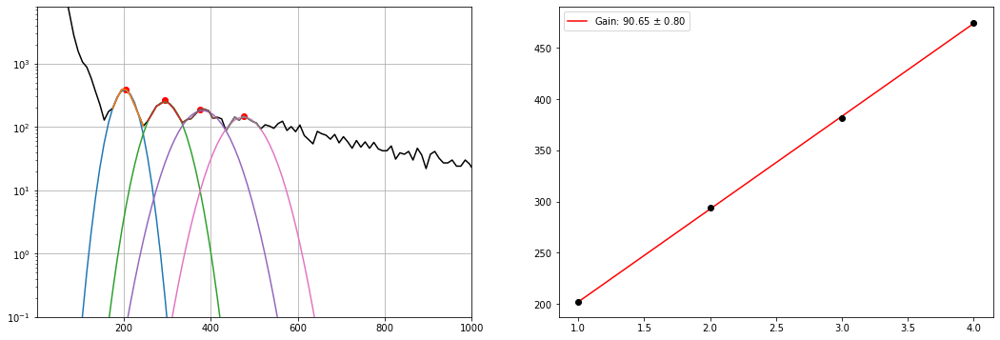

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_4.h5
Guess:  [380, 205.0375457875458, 10]
Params:  [370.23499091 201.38813888  26.22399565]
Guess:  [287, 295.0540293040293, 10]
Params:  [243.08596739 292.81626633  33.05157882]
Guess:  [197, 395.0723443223443, 10]
Params:  [185.78632756 384.88887192  41.35164013]
Guess:  [172, 465.08516483516485, 10]
Params:  [142.40039767 475.22127259  55.39214428]


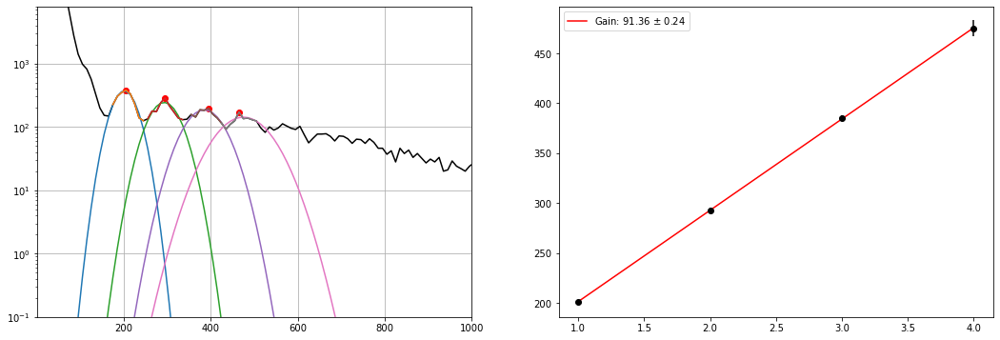

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_3.h5
Guess:  [413, 205.0375457875458, 10]
Params:  [389.39465906 200.95866215  24.29065163]
Guess:  [267, 285.05219780219784, 10]
Params:  [252.7762145  292.37721938  30.38985899]
Guess:  [212, 385.0705128205128, 10]
Params:  [199.08961195 383.2819019   33.67604905]
Guess:  [149, 475.0869963369963, 10]
Params:  [146.01454471 472.8759557   46.78233134]


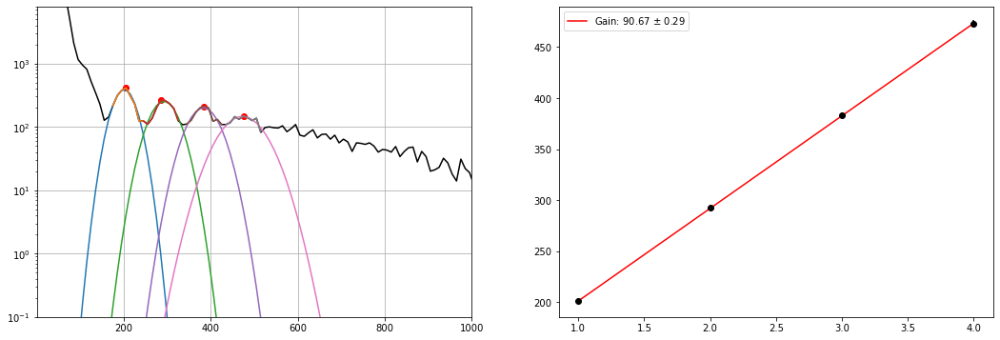

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_2.h5
Guess:  [421, 205.0375457875458, 10]
Params:  [381.0888034  202.14638731  23.35026323]
Guess:  [266, 295.0540293040293, 10]
Params:  [257.8201306  293.94815983  29.76529284]
Guess:  [195, 395.0723443223443, 10]
Params:  [186.48663267 386.63568903  44.72683708]
Guess:  [137, 475.0869963369963, 10]
Params:  [131.35099806 466.29557957  67.12279067]


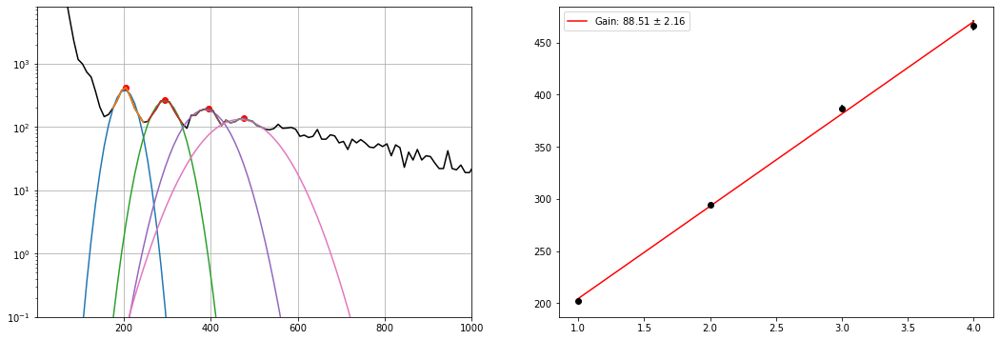

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_1.h5
Guess:  [416, 205.0375457875458, 10]
Params:  [386.24505739 202.2897208   24.99832645]
Guess:  [252, 295.0540293040293, 10]
Params:  [239.60267475 295.28671107  33.25467503]
Guess:  [206, 385.0705128205128, 10]
Params:  [195.47573416 386.55570106  35.86662205]
fit failed


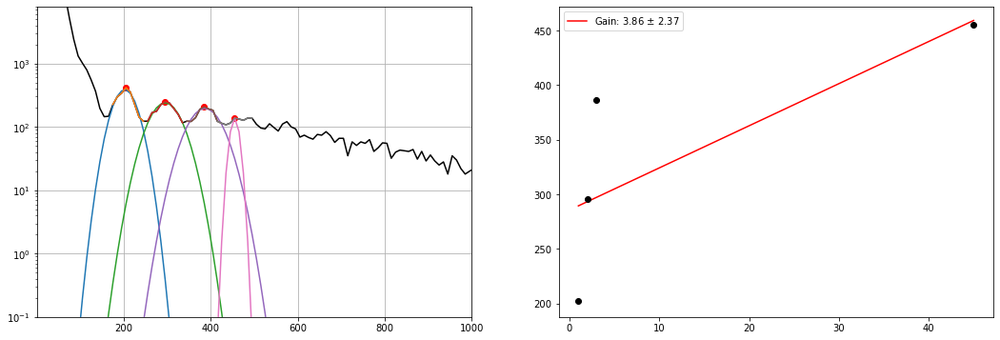

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_405_0.h5
Guess:  [393, 205.0375457875458, 10]
Params:  [364.31502095 203.15119406  25.45939431]
Guess:  [283, 285.05219780219784, 10]
Params:  [261.85334143 292.1216912   31.27624569]
Guess:  [204, 375.06868131868134, 10]
Params:  [186.87269329 382.52103049  45.02334098]
Guess:  [166, 475.0869963369963, 10]
Params:  [151.63344345 476.19691183  40.98874537]


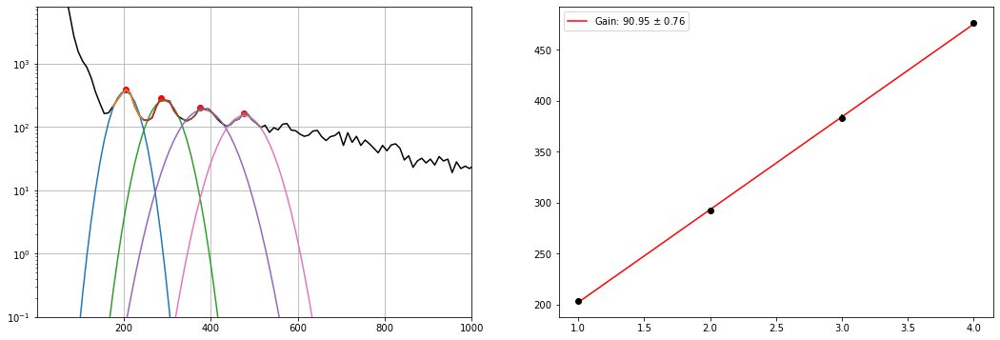

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_34.h5
Guess:  [262, 205.0375457875458, 10]
Params:  [245.59211615 203.19450213  24.11306293]
Guess:  [112, 285.05219780219784, 10]
Params:  [102.55849855 294.88770557  36.40785166]
Guess:  [85, 395.0723443223443, 10]
Params:  [ 66.27074741 390.44488223  39.63251252]


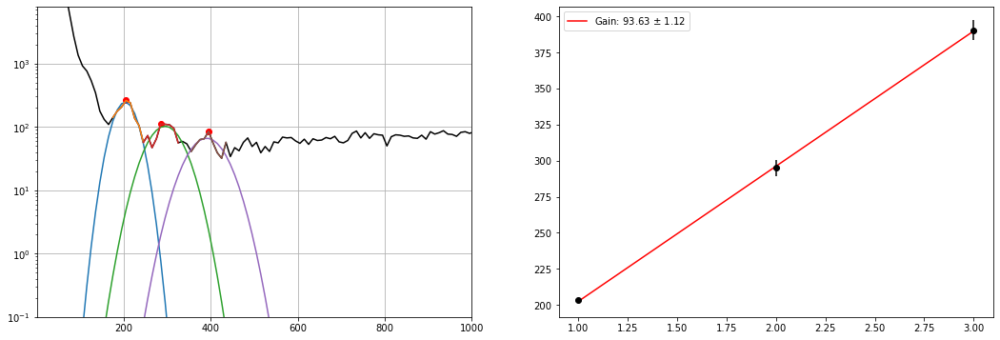

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_33.h5
Guess:  [267, 205.0375457875458, 10]
Params:  [239.61481837 201.77993766  26.59186073]
Guess:  [120, 295.0540293040293, 10]
Params:  [105.43996661 297.16007427  31.61591765]
Guess:  [80, 395.0723443223443, 10]
Params:  [ 71.61446796 390.7657518   41.85232782]


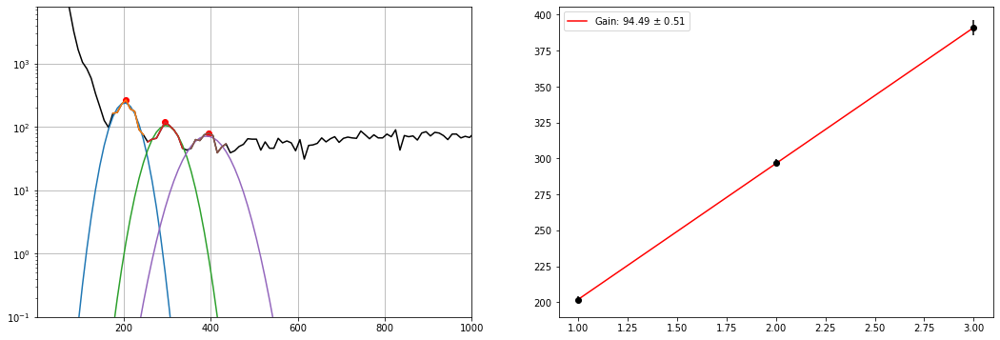

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_32.h5
Guess:  [223, 205.0375457875458, 10]
Params:  [231.31588417 200.53057897  24.19227028]
Guess:  [118, 295.0540293040293, 10]
Params:  [108.47532996 294.24097688  34.0927748 ]
Guess:  [95, 385.0705128205128, 10]
Params:  [ 72.55262995 385.16404871  35.6184161 ]


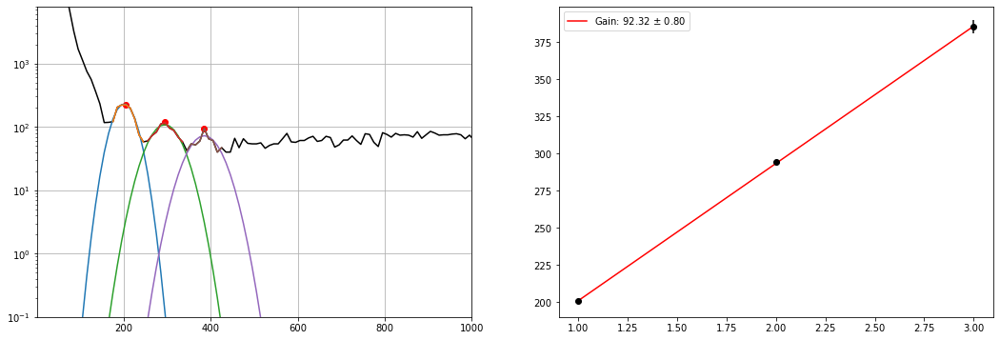

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_31.h5
Guess:  [259, 205.0375457875458, 10]
Params:  [251.54858658 202.10367573  23.59216762]
Guess:  [115, 305.0558608058608, 10]
Params:  [110.46715572 289.15761396  39.00339128]
Guess:  [82, 385.0705128205128, 10]
Params:  [ 74.05354294 385.26586622  38.16277798]


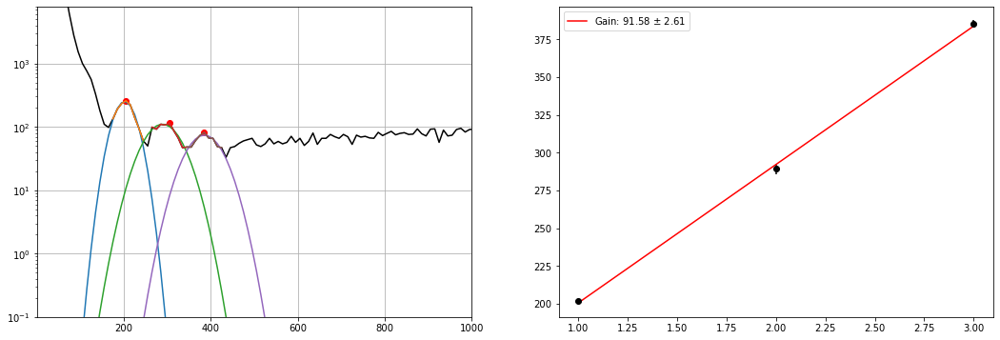

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_30.h5
Guess:  [223, 195.03571428571428, 10]
Params:  [220.79382243 199.62167184  26.54013648]
Guess:  [122, 295.0540293040293, 10]
Params:  [112.88197637 295.44877404  28.61856192]
Guess:  [80, 405.0741758241758, 10]
Params:  [ 68.93754148 396.70750696  49.98965183]


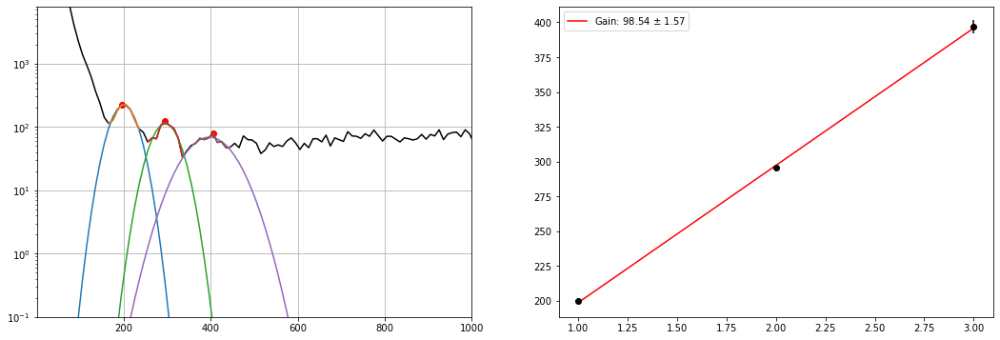

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_29.h5
Guess:  [242, 205.0375457875458, 10]
Params:  [229.43909947 201.86602865  27.04274833]
Guess:  [135, 305.0558608058608, 10]
Params:  [121.21461339 299.89878488  28.30262315]
Guess:  [84, 395.0723443223443, 10]
Params:  [ 73.46278147 392.54909274  38.88334894]


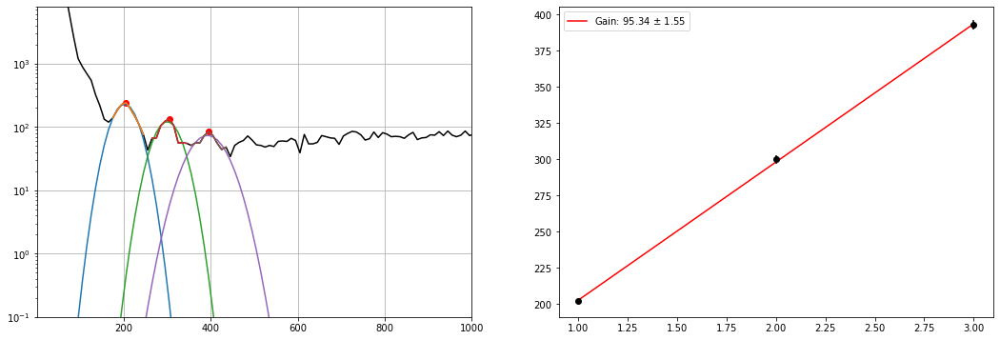

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_28.h5
Guess:  [244, 205.0375457875458, 10]
Params:  [226.28762419 204.14553444  26.25632534]
Guess:  [119, 295.0540293040293, 10]
Params:  [105.87174164 296.16044148  32.34659244]
Guess:  [86, 395.0723443223443, 10]
Params:  [ 82.52967654 393.06963694  29.68600899]


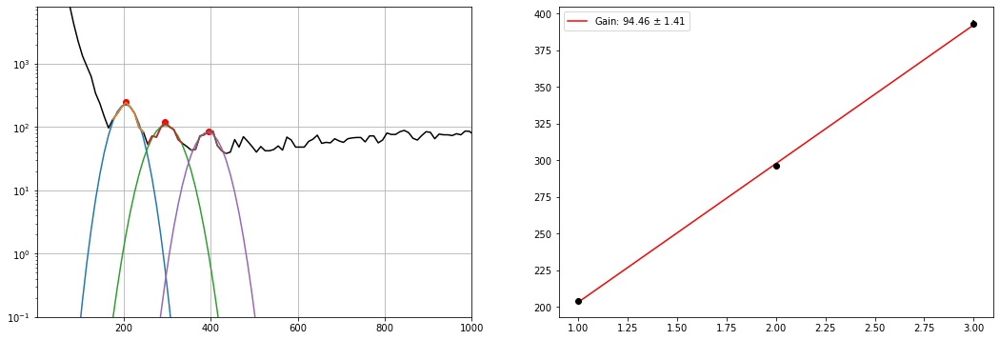

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_27.h5
Guess:  [241, 205.0375457875458, 10]
Params:  [238.48659    203.67221665  25.21577895]
Guess:  [126, 295.0540293040293, 10]
Params:  [115.47640221 295.75275835  28.12346207]
Guess:  [83, 395.0723443223443, 10]
Params:  [ 74.92556158 391.70930929  36.88021877]


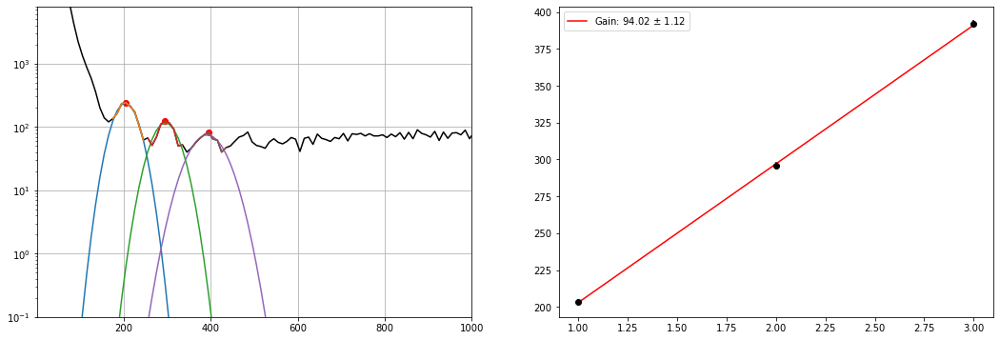

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_26.h5
Guess:  [224, 205.0375457875458, 10]
Params:  [215.28982328 203.50054578  25.28871836]
Guess:  [124, 295.0540293040293, 10]
Params:  [112.93904799 296.75604087  27.6100922 ]
Guess:  [87, 385.0705128205128, 10]
Params:  [ 76.19122008 385.91643979  32.62306649]


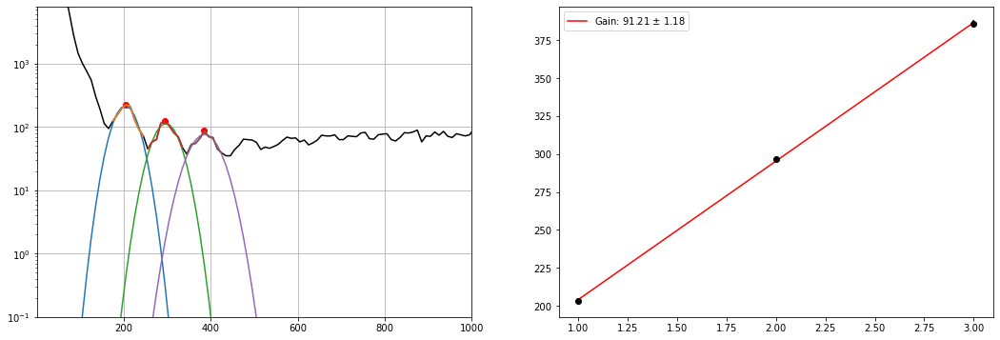

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_25.h5
Guess:  [234, 205.0375457875458, 10]
Params:  [235.69906883 201.2583207   25.76942726]
Guess:  [117, 295.0540293040293, 10]
Params:  [110.78106896 295.38429591  32.81825562]
Guess:  [83, 395.0723443223443, 10]
Params:  [ 64.59843404 390.65183194  48.39424601]


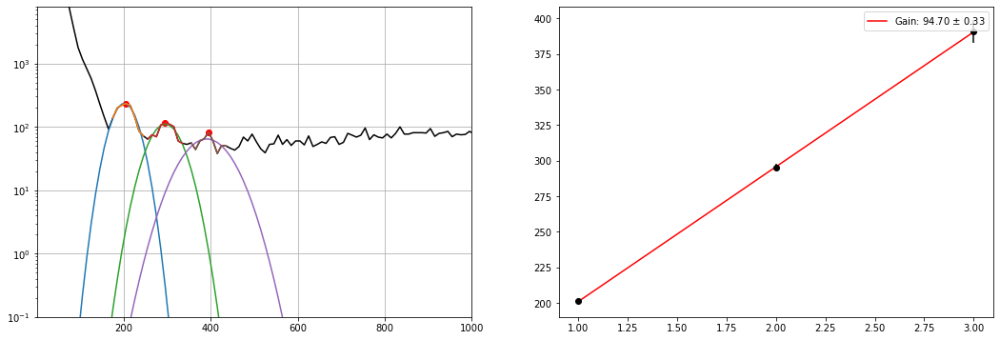

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_24.h5
Guess:  [221, 205.0375457875458, 10]
Params:  [226.28629381 201.24847776  25.11196384]
Guess:  [115, 305.0558608058608, 10]
Params:  [113.78493826 299.75356155  28.63998047]
Guess:  [68, 385.0705128205128, 10]
Params:  [ 67.09590792 387.95646797  37.98575916]


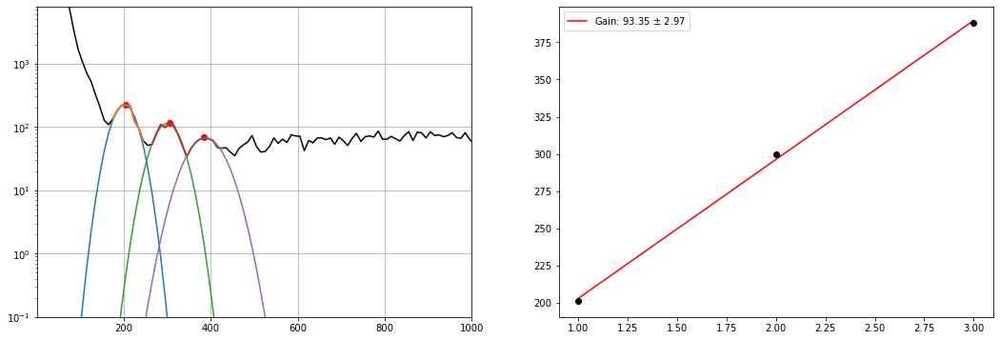

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_23.h5
Guess:  [248, 205.0375457875458, 10]
Params:  [233.89722461 204.77331382  22.29535899]
Guess:  [119, 305.0558608058608, 10]
Params:  [110.08421643 297.71200441  30.59910987]
Guess:  [97, 385.0705128205128, 10]
Params:  [ 70.04155829 385.36645978  36.99441755]


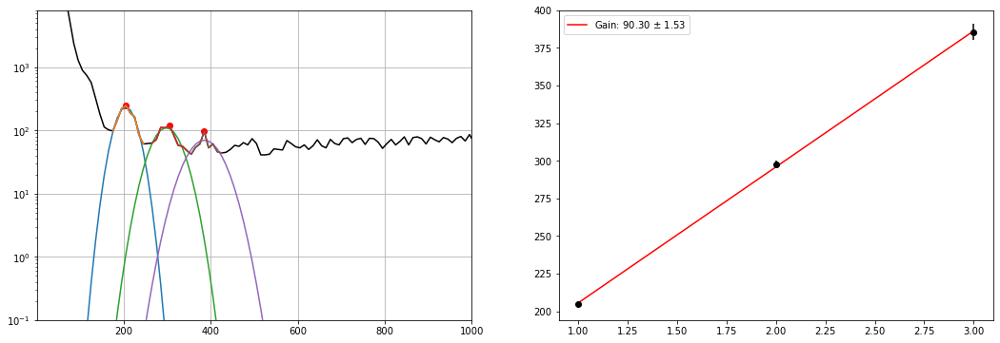

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_22.h5
Guess:  [236, 205.0375457875458, 10]
Params:  [229.49834712 204.22178138  23.90679559]
Guess:  [110, 295.0540293040293, 10]
Params:  [ 97.27831576 294.84108713  29.90559462]
Guess:  [74, 405.0741758241758, 10]
Params:  [ 68.31233917 391.48640073  44.19562325]


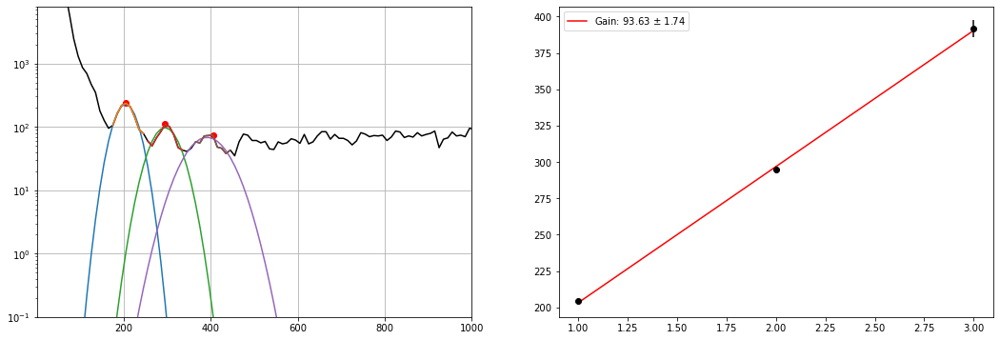

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_21.h5
Guess:  [253, 205.0375457875458, 10]
Params:  [243.2416044  203.1672507   23.30836388]
Guess:  [136, 295.0540293040293, 10]
Params:  [123.01784793 295.40443686  27.62653263]
Guess:  [83, 405.0741758241758, 10]
Params:  [ 72.45380529 393.8836082   40.40735487]


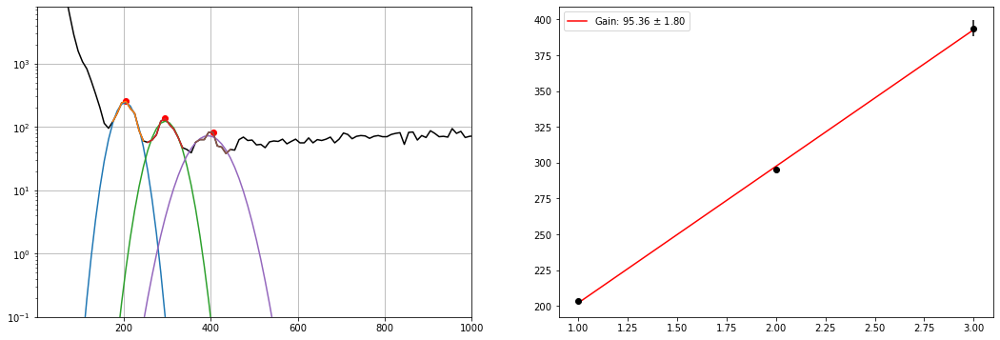

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_20.h5
Guess:  [246, 205.0375457875458, 10]
Params:  [241.15925657 203.19336655  23.02173064]
Guess:  [116, 305.0558608058608, 10]
Params:  [113.21732956 300.1991746   29.55854741]
Guess:  [76, 385.0705128205128, 10]
Params:  [ 71.62603661 388.01475412  36.9909553 ]


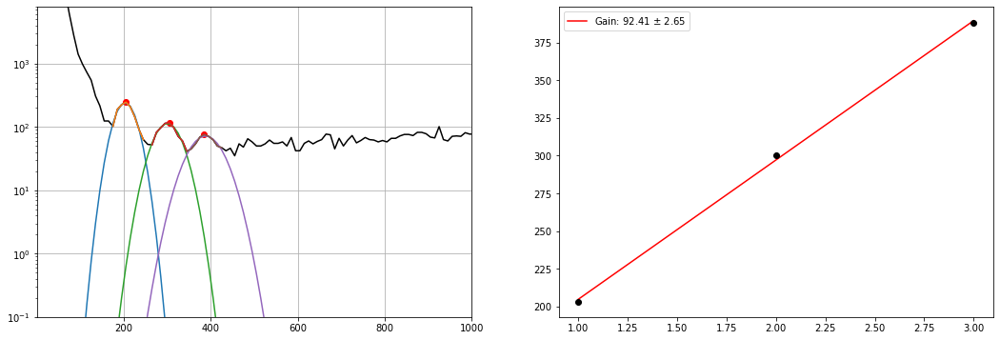

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_19.h5
Guess:  [256, 205.0375457875458, 10]
Params:  [226.63216262 202.11209971  25.55952523]
Guess:  [125, 305.0558608058608, 10]
Params:  [120.70727396 300.14659483  26.57995298]
Guess:  [80, 385.0705128205128, 10]
Params:  [ 75.40363369 385.89341043  38.62603521]


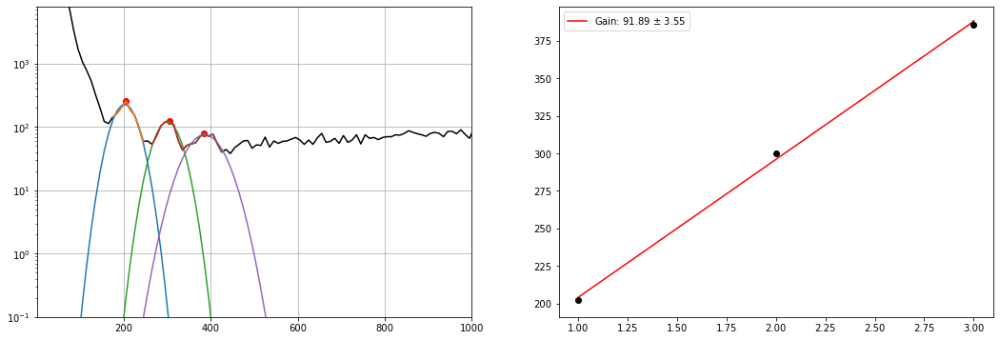

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_18.h5
Guess:  [249, 205.0375457875458, 10]
Params:  [242.87538353 202.63709689  24.32277807]
Guess:  [119, 295.0540293040293, 10]
Params:  [110.51126111 293.1319816   33.57853443]
Guess:  [101, 405.0741758241758, 10]
Params:  [ 80.89502852 396.15575202  34.09839068]


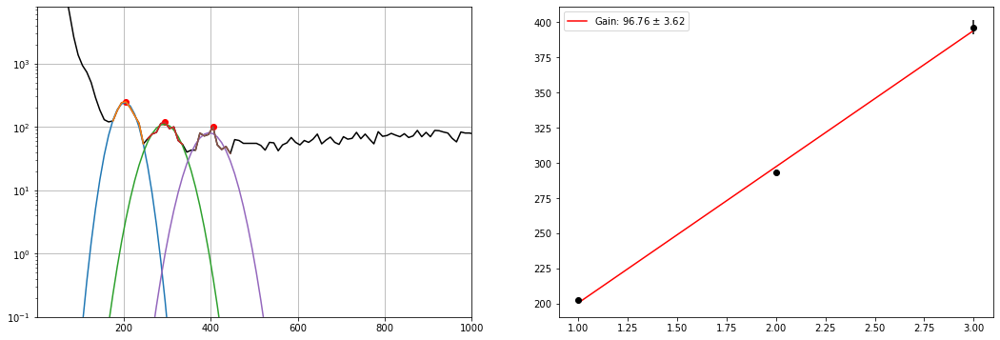

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_17.h5
Guess:  [227, 205.0375457875458, 10]
Params:  [220.20125852 203.52919034  23.91604425]
Guess:  [117, 305.0558608058608, 10]
Params:  [104.64347121 296.8981863   27.81349813]
Guess:  [78, 395.0723443223443, 10]
Params:  [ 76.50872001 388.83350841  37.81056539]


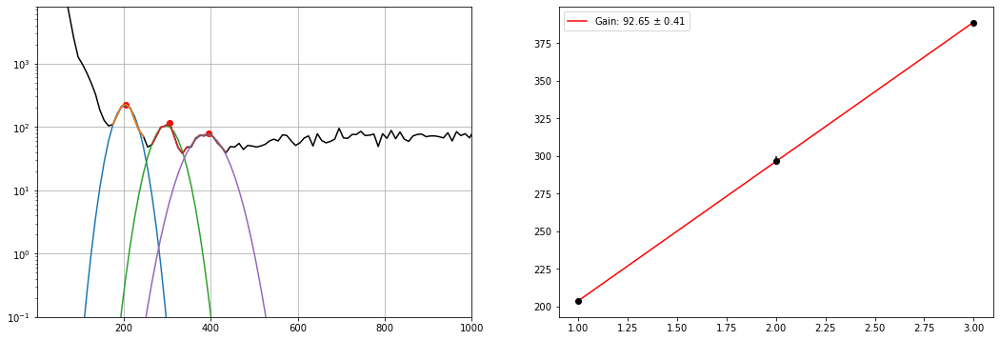

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_16.h5
Guess:  [273, 195.03571428571428, 10]
Params:  [243.45097184 200.39827217  26.29276405]
Guess:  [126, 295.0540293040293, 10]
Params:  [113.31757218 296.18554879  31.07268682]
Guess:  [87, 385.0705128205128, 10]
Params:  [ 71.30984741 391.75344197  38.31400655]


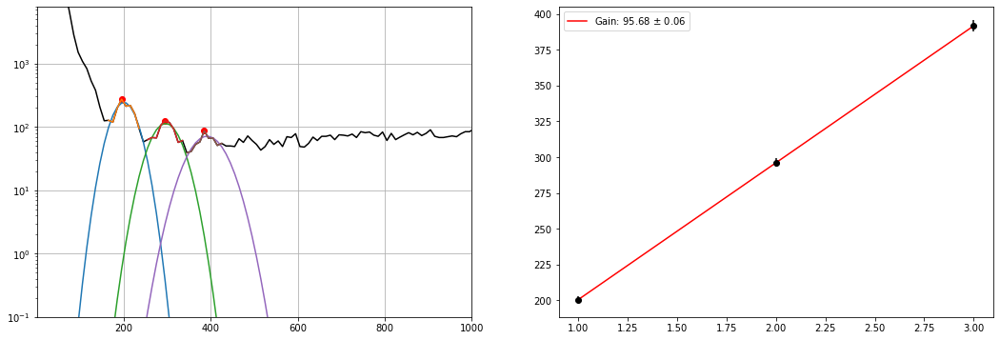

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_15.h5
Guess:  [240, 205.0375457875458, 10]
Params:  [220.79228875 202.5013164   25.12274209]
Guess:  [121, 295.0540293040293, 10]
Params:  [113.75887387 296.80043861  29.76323669]
Guess:  [77, 385.0705128205128, 10]
Params:  [ 65.74505192 391.86324294  41.35289166]


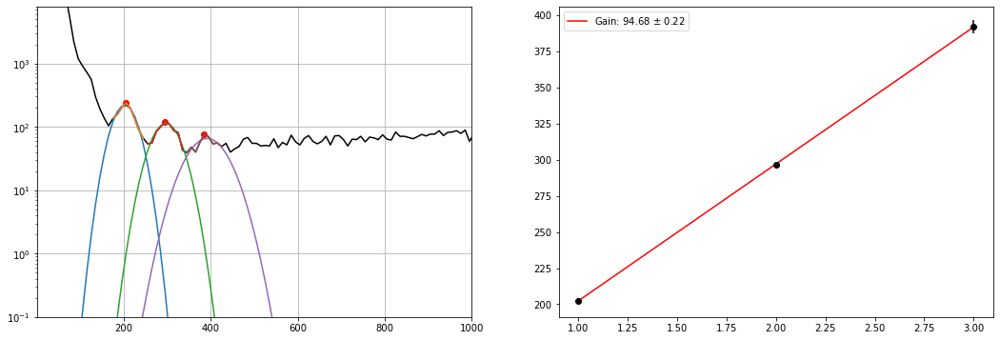

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_14.h5
Guess:  [234, 205.0375457875458, 10]
Params:  [238.05672175 204.31896135  24.26517852]
Guess:  [109, 305.0558608058608, 10]
Params:  [106.9840993  301.99094054  30.71656881]
Guess:  [75, 375.06868131868134, 10]
Params:  [ 70.35163143 376.27294495  38.63545893]


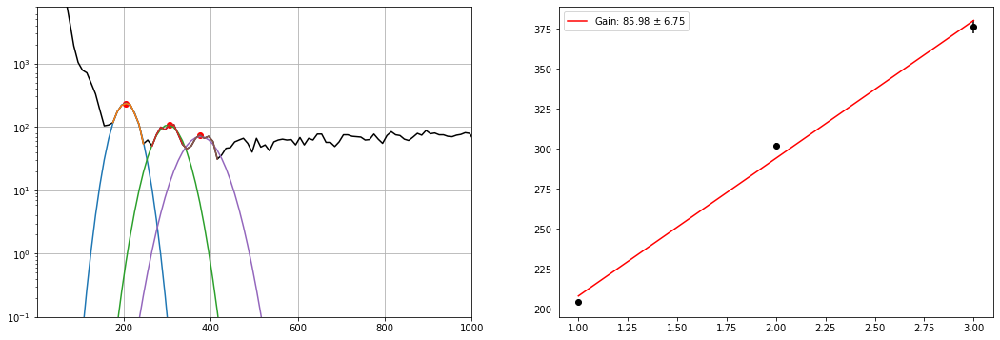

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_13.h5
Guess:  [233, 205.0375457875458, 10]
Params:  [227.40126484 201.95756596  24.63548722]
Guess:  [120, 295.0540293040293, 10]
Params:  [109.46560709 296.38153067  29.70964219]
Guess:  [67, 395.0723443223443, 10]
Params:  [ 63.14956963 387.73285682  40.47567439]


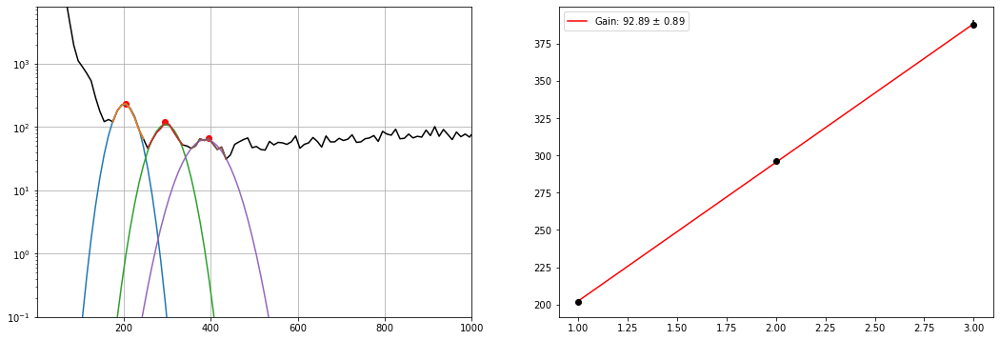

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_12.h5
Guess:  [234, 205.0375457875458, 10]
Params:  [230.56785897 202.37405737  24.53172912]
Guess:  [143, 295.0540293040293, 10]
Params:  [123.53512892 295.08787913  30.31413154]
Guess:  [85, 395.0723443223443, 10]
Params:  [ 75.65708635 390.54093335  35.47730538]


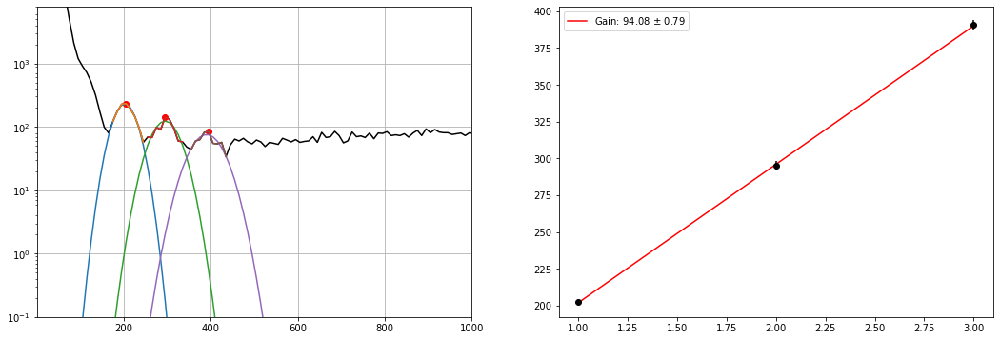

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_11.h5
Guess:  [255, 205.0375457875458, 10]
Params:  [237.95471175 202.6650727   25.33346973]
Guess:  [127, 295.0540293040293, 10]
Params:  [114.56350897 296.66201548  31.76790861]
Guess:  [85, 395.0723443223443, 10]
Params:  [ 75.14606445 389.38982062  40.72471449]


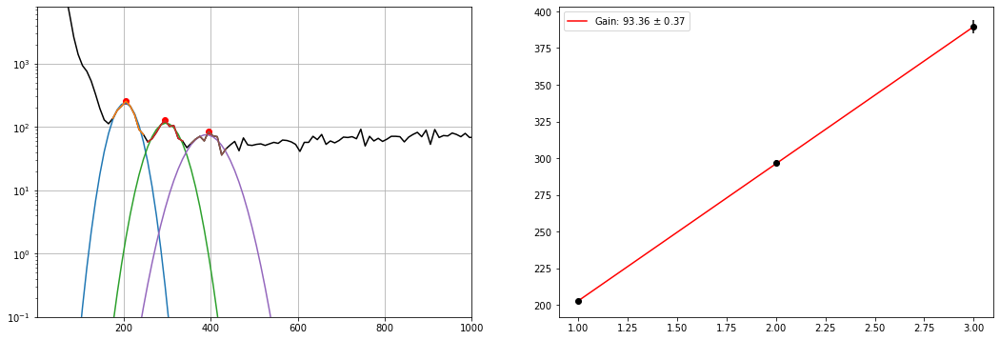

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_10.h5
Guess:  [236, 205.0375457875458, 10]
Params:  [228.74876556 203.31865884  25.17353849]
Guess:  [116, 295.0540293040293, 10]
Params:  [109.54301534 298.15516226  30.82953761]
Guess:  [94, 395.0723443223443, 10]
Params:  [ 74.14035603 395.96917566  32.67329847]


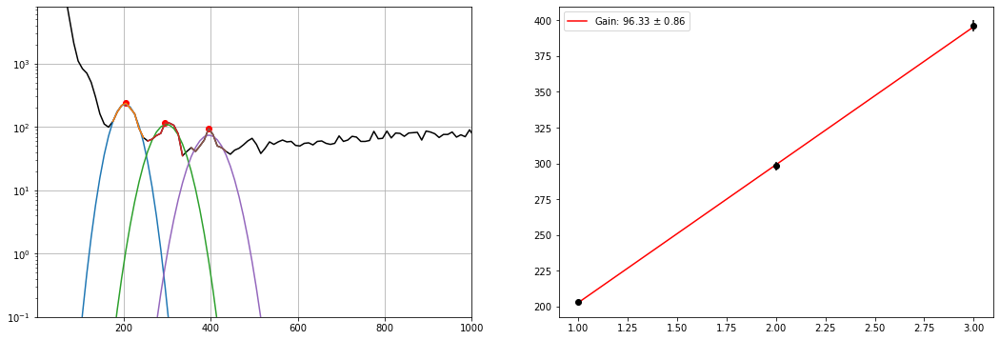

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_9.h5
Guess:  [225, 205.0375457875458, 10]
Params:  [227.23139037 203.52436719  25.04441099]
Guess:  [120, 295.0540293040293, 10]
Params:  [105.73144708 295.5132196   29.7149603 ]
Guess:  [84, 395.0723443223443, 10]
Params:  [ 76.9666685  392.43278216  31.45409118]


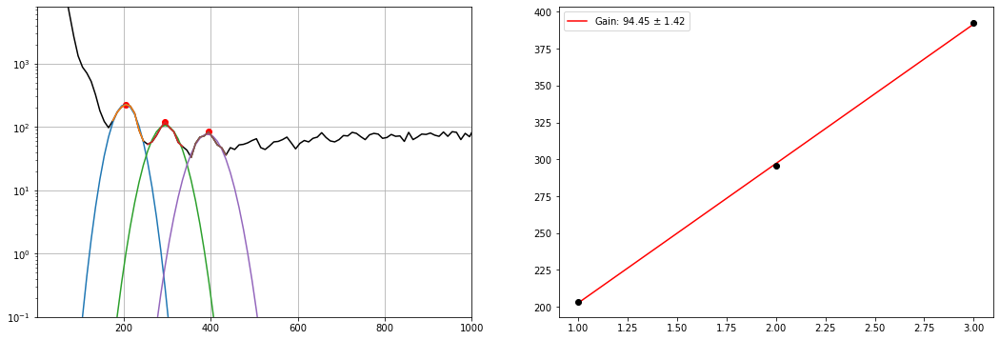

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_8.h5
Guess:  [238, 195.03571428571428, 10]
Params:  [226.82011855 200.15699147  24.63019458]
Guess:  [122, 295.0540293040293, 10]
Params:  [112.35295566 293.82066687  31.27955976]
Guess:  [79, 385.0705128205128, 10]
Params:  [ 72.6149362  389.60663369  34.13349347]


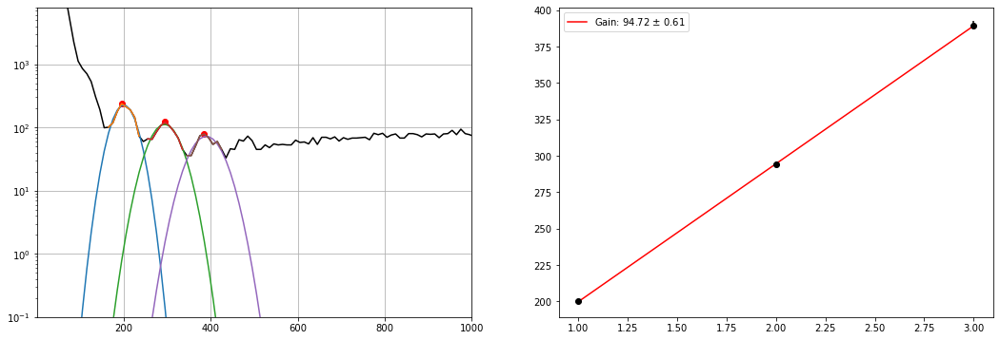

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_7.h5
Guess:  [239, 205.0375457875458, 10]
Params:  [234.67742753 204.18580697  23.68266572]
Guess:  [112, 305.0558608058608, 10]
Params:  [110.12902847 298.74123466  30.03135549]
Guess:  [90, 375.06868131868134, 10]
Params:  [ 71.56665843 386.86194755  44.84363421]


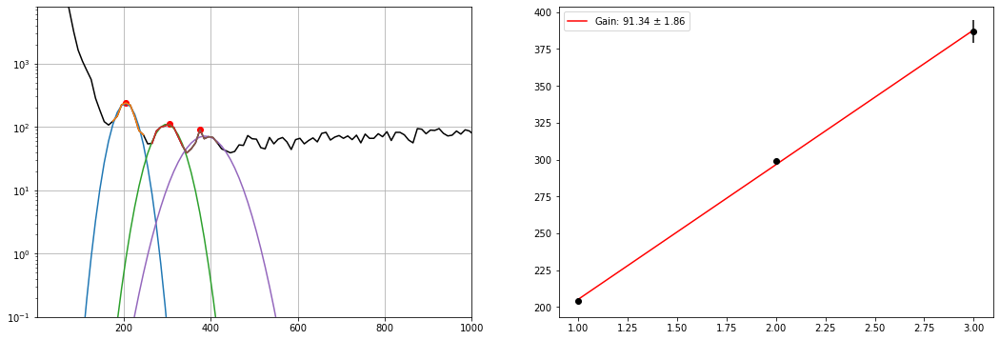

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_6.h5
Guess:  [239, 205.0375457875458, 10]
Params:  [238.93017359 203.03035642  24.34343755]
Guess:  [140, 295.0540293040293, 10]
Params:  [120.62409353 295.76528741  29.05691034]
Guess:  [84, 395.0723443223443, 10]
Params:  [ 75.54665159 394.99723023  36.83313504]


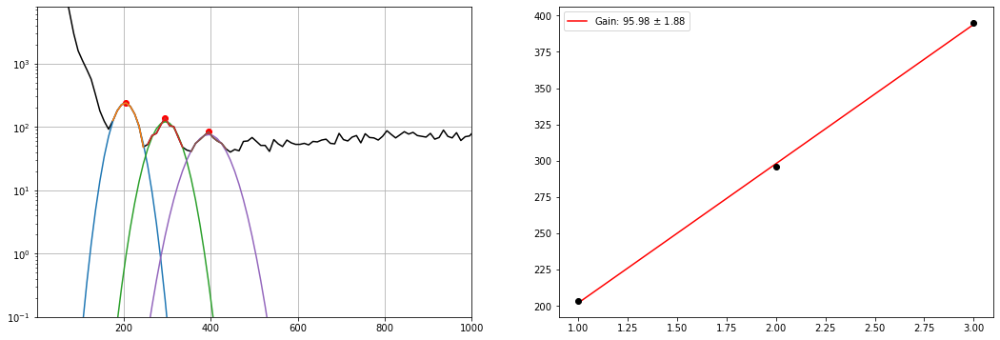

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_5.h5
Guess:  [258, 205.0375457875458, 10]
Params:  [255.99008088 203.4780657   23.74787513]
Guess:  [128, 285.05219780219784, 10]
Params:  [114.74683402 292.81710676  33.88667214]
Guess:  [75, 385.0705128205128, 10]
Params:  [ 71.15614094 392.60123443  40.37247306]


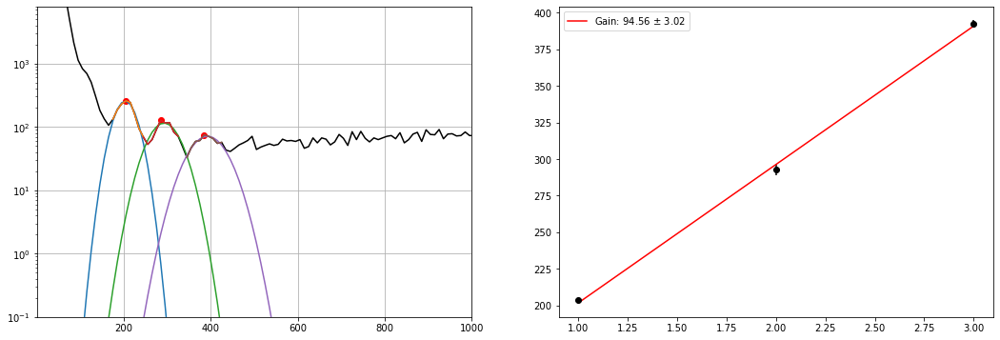

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_4.h5
Guess:  [240, 205.0375457875458, 10]
Params:  [241.59500639 203.64813127  23.5650916 ]
Guess:  [127, 295.0540293040293, 10]
Params:  [117.54366247 292.76164962  29.6072596 ]
Guess:  [91, 385.0705128205128, 10]
Params:  [ 80.79474488 387.68980131  31.59863911]


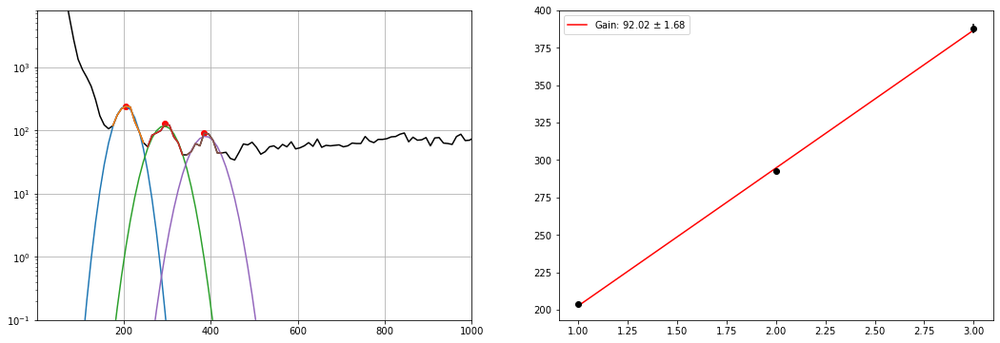

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_3.h5
Guess:  [234, 205.0375457875458, 10]
Params:  [233.75291641 202.58083367  24.45956274]
Guess:  [120, 305.0558608058608, 10]
Params:  [102.74975812 297.00916382  29.54555907]
Guess:  [80, 385.0705128205128, 10]
Params:  [ 78.77557647 388.23551708  33.39153986]


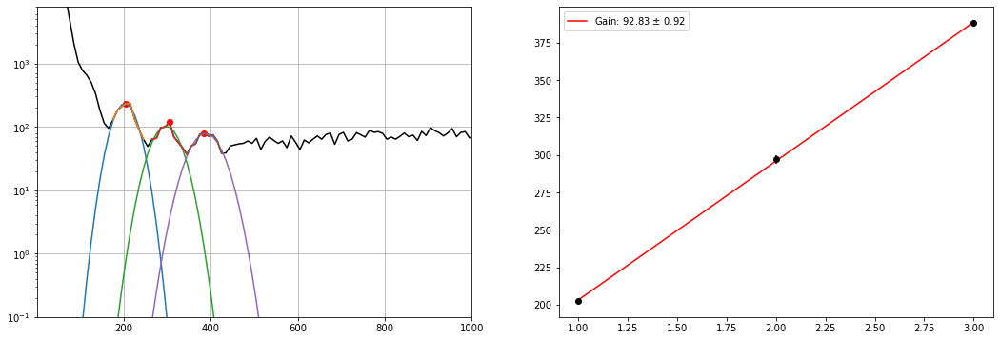

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_2.h5
Guess:  [253, 205.0375457875458, 10]
Params:  [239.93687546 203.58382021  22.53782393]
Guess:  [118, 295.0540293040293, 10]
Params:  [110.55925903 298.00277569  29.490305  ]
Guess:  [77, 405.0741758241758, 10]
Params:  [ 72.33986792 395.0685391   38.57651455]


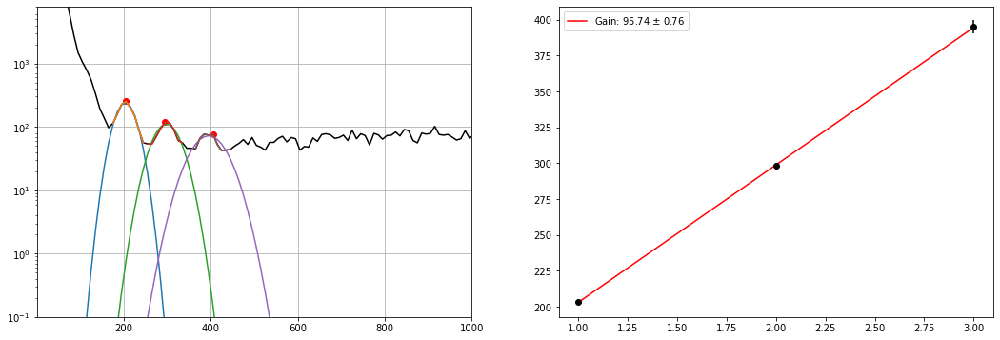

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_1.h5
Guess:  [265, 205.0375457875458, 10]
Params:  [242.56535199 202.89364539  23.78484691]
Guess:  [124, 295.0540293040293, 10]
Params:  [110.27394585 293.4572709   29.83024291]
Guess:  [69, 395.0723443223443, 10]
Params:  [ 68.40774568 394.40492893  39.29954225]


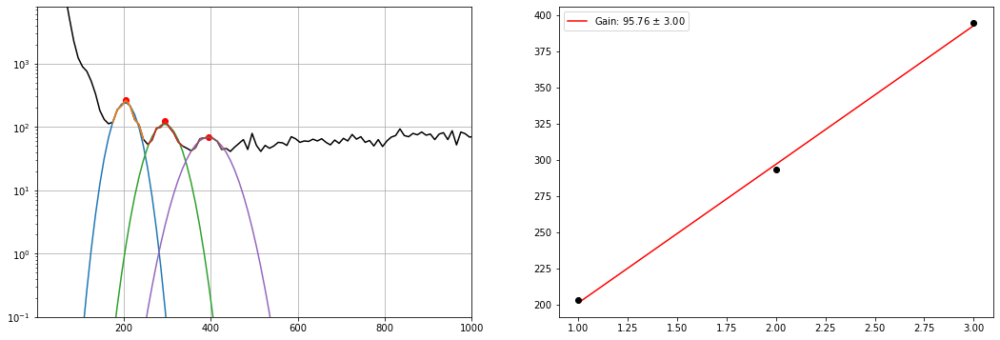

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step12/mca_keith_31.40OV_310_0.h5
Guess:  [246, 205.0375457875458, 10]
Params:  [235.49273418 203.11748499  23.28138085]
Guess:  [127, 305.0558608058608, 10]
Params:  [113.14050429 298.67065388  27.41172534]
Guess:  [83, 385.0705128205128, 10]
Params:  [ 69.4735214  386.25239106  37.50805052]


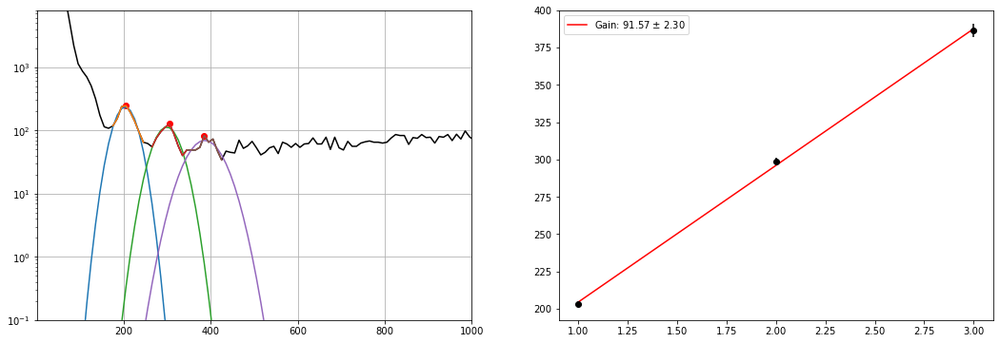

In [13]:
data_NEG_FIELD = {'source':{}, 405.0:{}, 310.0:{}}

for file_type, file_list in files_12.items():
    # creating the data fields in the dict
    data_NEG_FIELD[file_type]['pe_data'] = []
    data_NEG_FIELD[file_type]['counts'] = []
    data_NEG_FIELD[file_type]['gain'] = np.empty(len(file_list))
    data_NEG_FIELD[file_type]['gain_err'] = np.empty(len(file_list))
    data_NEG_FIELD[file_type]['dc_offset'] = np.empty(len(file_list))
    for i, file in enumerate(file_list):
        pe, counts, gain, gain_err, dc_offset = plot_fit_gain_dc(file, 25, 10, 10)
        data_NEG_FIELD[file_type]['pe_data'].append(pe)
        data_NEG_FIELD[file_type]['counts'].append(counts)
        data_NEG_FIELD[file_type]['gain'][i] = gain
        data_NEG_FIELD[file_type]['gain_err'][i] = gain_err
        data_NEG_FIELD[file_type]['dc_offset'][i] = dc_offset
    # converting all the lists to arrays 
    data_NEG_FIELD[file_type]['pe_data'] = np.array(data_NEG_FIELD[file_type]['pe_data'])
    data_NEG_FIELD[file_type]['counts'] = np.array(data_NEG_FIELD[file_type]['counts'])

-1.100353737856193
-1.2345089549933324
-1.1651981127745483


<Figure size 648x432 with 0 Axes>

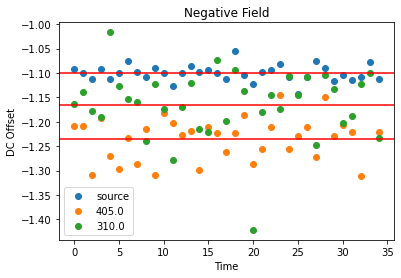

In [14]:
plt.figure(figsize = (9, 6))
# plotting the dc offset over time

# getting the "time"
time_NEG_FIELD = {}
for key in files_12:
    time_NEG_FIELD[key] = np.arange(0, len(files_12[key]))
plt.figure(figsize=(6,4))
for key in data_NEG_FIELD:
    data_NEG_FIELD[key]['dc_offset'] = np.asarray(data_NEG_FIELD[key]['dc_offset'])
    data_NEG_FIELD[key]['dc_offset'][data_NEG_FIELD[key]['dc_offset'] < -5] = np.nan # setting any outliers to nan
    masked_data = np.ma.masked_array(data_NEG_FIELD[key]['dc_offset'], np.isnan(data_NEG_FIELD[key]['dc_offset'])) # creating a masked array to ignore the nan when tkaing the average dc offset
    dc_offset_mean = np.ma.average(masked_data)
    data_NEG_FIELD[key]['mean_dc_offset'] = dc_offset_mean
    plt.scatter(time_NEG_FIELD[key], data_NEG_FIELD[key]['dc_offset'], marker='o', label= str(key))
    plt.axhline(y=dc_offset_mean, color='r')
    print(dc_offset_mean)

plt.ylabel('DC Offset')
plt.xlabel('Time')
plt.title('Negative Field')
# plt.ylim(-1.4, -1)
# plt.grid()
plt.legend(loc='best')
# plt.savefig('NO_FIELD_gain_comparison.pdf')
plt.show()

# 0 E Field

In [15]:
# getting the data that we need
path_7 = '/gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/'
files_7 = load_directory(path_7)
SRS_gain_7 = 10 # gain on the SRS bandpass filter
# peak_threshold = 700 # upper bound of pedestal
# breakdown = 27.4 # breakdown voltage of the SiPM
pedestal_7 = 275 # center of noise pedestal peak

Number of files found:  27
Number of files:  27


Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_8.h5
Guess:  [1869, 205.0375457875458, 10]
Params:  [1812.01539288  202.56690961   23.18896079]
Guess:  [827, 295.0540293040293, 10]
Params:  [782.06372946 296.22506146  29.19376025]
Guess:  [417, 395.0723443223443, 10]
Params:  [406.08639836 392.23859535  29.78614367]
Guess:  [263, 495.09065934065933, 10]
Params:  [247.30045573 490.82959081  30.5332294 ]
Guess:  [176, 595.1089743589744, 10]
Params:  [161.4006939  590.02784268  32.61768244]


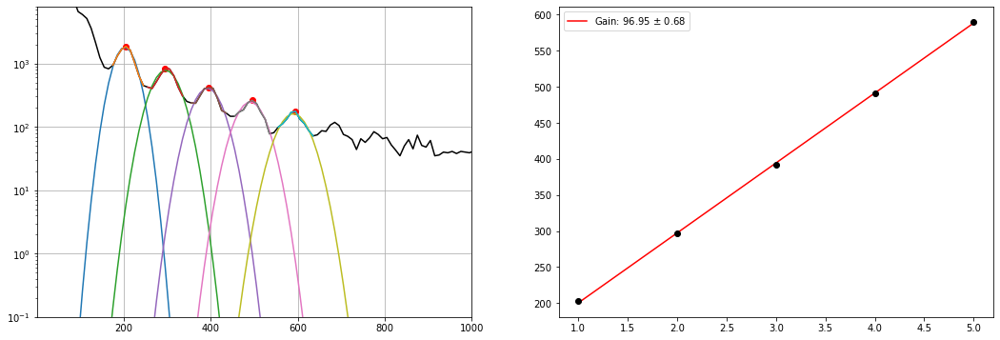

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_7.h5
Guess:  [1822, 205.0375457875458, 10]
Params:  [1799.12907269  202.39812364   24.2066894 ]
Guess:  [830, 295.0540293040293, 10]
Params:  [800.18082451 296.34120197  27.73521357]
Guess:  [466, 395.0723443223443, 10]
Params:  [424.47352702 393.17354593  28.13678391]
Guess:  [270, 485.0888278388278, 10]
Params:  [241.99895754 487.71512297  35.6548897 ]
Guess:  [194, 595.1089743589744, 10]
Params:  [178.43280748 588.78933893  30.95339491]


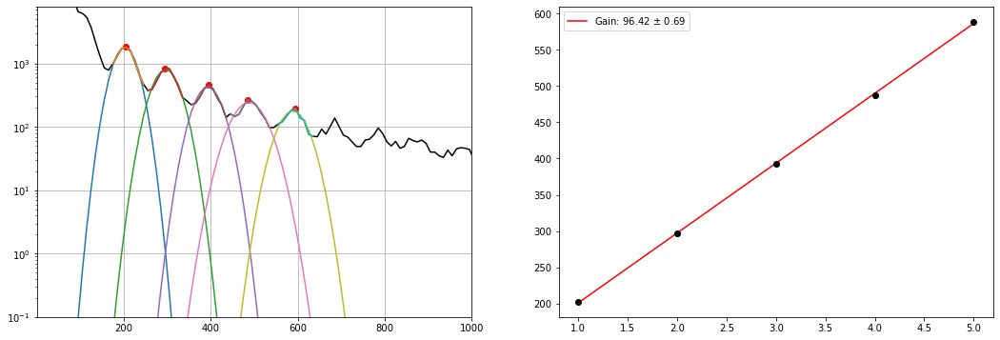

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_6.h5
Guess:  [1864, 205.0375457875458, 10]
Params:  [1803.95840238  201.67201038   23.37749925]
Guess:  [831, 295.0540293040293, 10]
Params:  [794.17797957 295.14791178  28.08459811]
Guess:  [410, 395.0723443223443, 10]
Params:  [399.09052441 392.8078346   30.78985841]
Guess:  [299, 495.09065934065933, 10]
Params:  [271.18589791 488.6705337   28.36913338]
Guess:  [161, 575.1053113553114, 10]
Params:  [146.71401577 580.24988458  42.1998931 ]


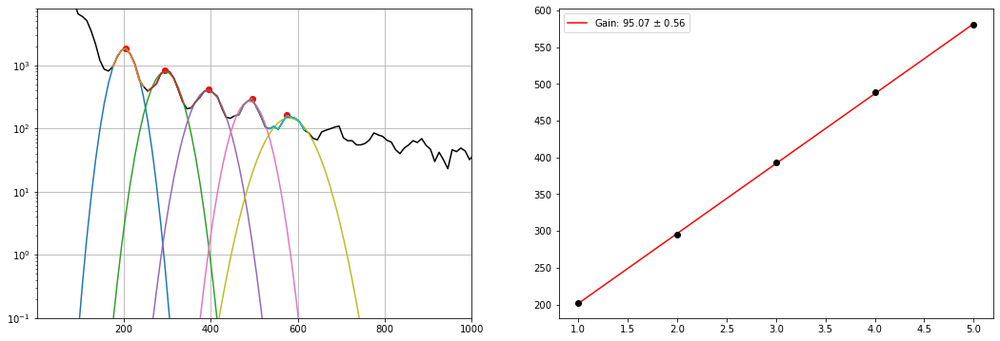

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_5.h5
Guess:  [1761, 205.0375457875458, 10]
Params:  [1708.59674182  201.91331419   22.7738481 ]
Guess:  [796, 305.0558608058608, 10]
Params:  [773.69636308 298.62773261  26.48208112]
Guess:  [476, 395.0723443223443, 10]
Params:  [405.15448195 393.9192261   28.32092955]
Guess:  [271, 495.09065934065933, 10]
Params:  [249.5180323  489.96492102  28.38686715]
Guess:  [155, 595.1089743589744, 10]
Params:  [147.05622726 589.14140686  32.3492075 ]


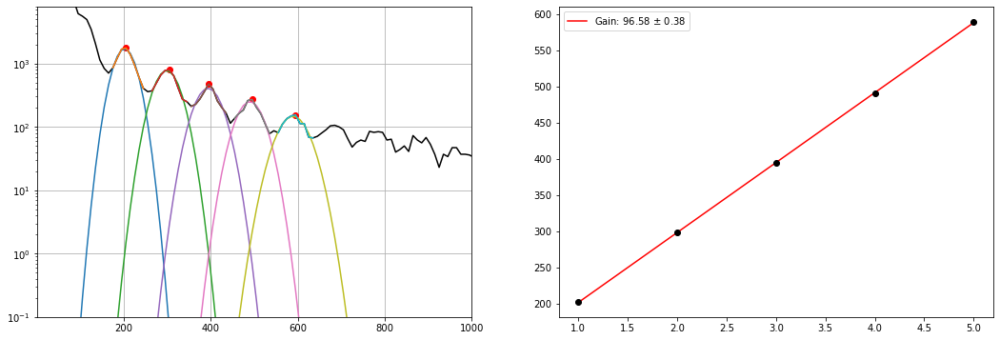

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_4.h5
Guess:  [1779, 205.0375457875458, 10]
Params:  [1752.91025922  202.58848098   24.19856298]
Guess:  [867, 295.0540293040293, 10]
Params:  [779.29124602 296.2380984   28.97476731]
Guess:  [445, 395.0723443223443, 10]
Params:  [415.92864958 391.91047336  29.28638729]
Guess:  [249, 495.09065934065933, 10]
Params:  [238.53101557 488.47649372  32.5075014 ]
Guess:  [192, 585.1071428571429, 10]
Params:  [176.79560255 585.72899298  32.20021734]


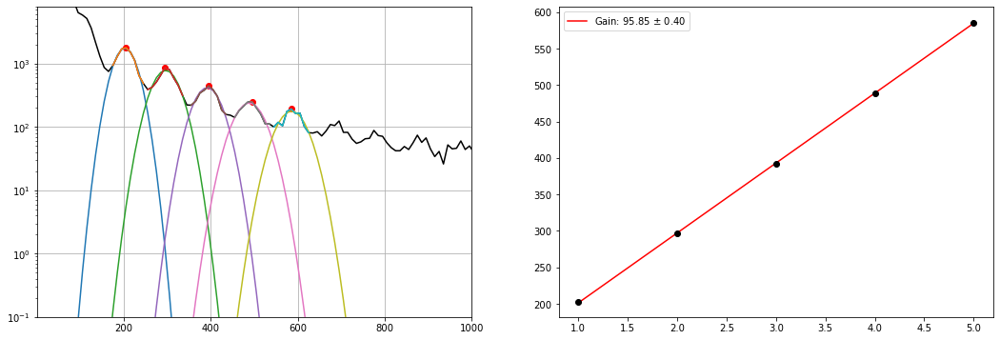

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_3.h5
Guess:  [1848, 205.0375457875458, 10]
Params:  [1793.67163716  202.16058491   23.41977923]
Guess:  [819, 305.0558608058608, 10]
Params:  [784.3513568  298.59478812  27.95737185]
Guess:  [435, 395.0723443223443, 10]
Params:  [409.29691719 393.70798423  29.84009375]
Guess:  [286, 495.09065934065933, 10]
Params:  [248.75842589 490.85297668  32.12271075]
Guess:  [166, 595.1089743589744, 10]
Params:  [160.69254459 590.30851815  33.33736178]


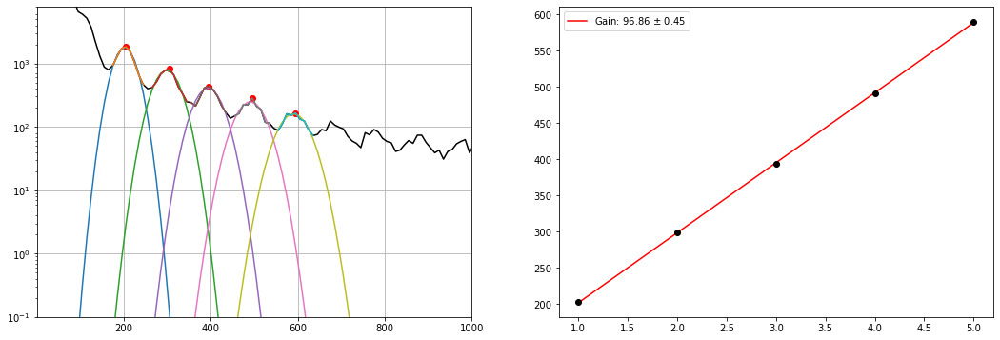

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_2.h5
Guess:  [1771, 205.0375457875458, 10]
Params:  [1756.81376251  202.07190435   24.34983132]
Guess:  [841, 305.0558608058608, 10]
Params:  [793.20297875 298.03751704  26.91908721]
Guess:  [482, 395.0723443223443, 10]
Params:  [424.36775366 392.23774988  29.58690606]
Guess:  [238, 495.09065934065933, 10]
Params:  [238.76001383 490.03542188  32.80774017]
Guess:  [166, 595.1089743589744, 10]
Params:  [156.20055646 588.63458747  33.50300315]


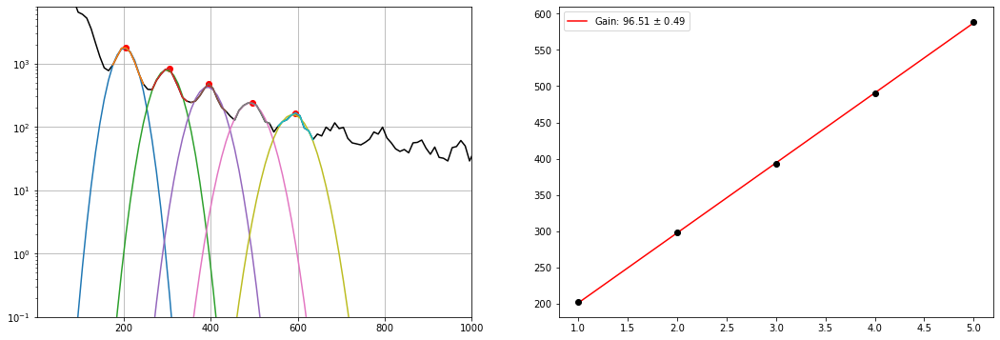

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_1.h5
Guess:  [1905, 205.0375457875458, 10]
Params:  [1840.86505619  202.59564463   23.32577532]
Guess:  [800, 295.0540293040293, 10]
Params:  [784.50699143 295.52147514  27.96164339]
Guess:  [448, 395.0723443223443, 10]
Params:  [428.24766441 393.5228202   28.95075341]
Guess:  [262, 485.0888278388278, 10]
Params:  [249.26593651 486.21499691  32.01571205]
Guess:  [159, 585.1071428571429, 10]
Params:  [155.57381381 584.59580116  31.39462698]


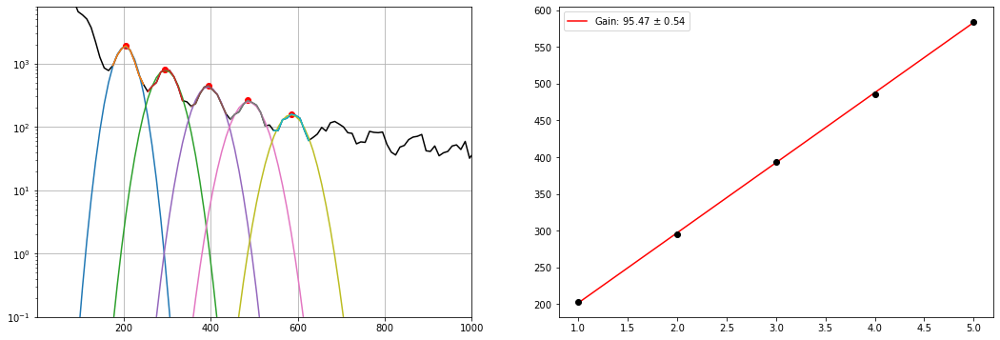

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_0.h5
Guess:  [1785, 205.0375457875458, 10]
Params:  [1729.13915089  202.40329482   23.47805482]
Guess:  [826, 295.0540293040293, 10]
Params:  [760.12959154 296.40783893  27.85450213]
Guess:  [426, 395.0723443223443, 10]
Params:  [409.25149341 393.16737141  28.72835317]
Guess:  [265, 495.09065934065933, 10]
Params:  [246.54097641 490.52060333  29.27160287]
Guess:  [165, 585.1071428571429, 10]
Params:  [143.23697842 583.27745488  43.58378743]


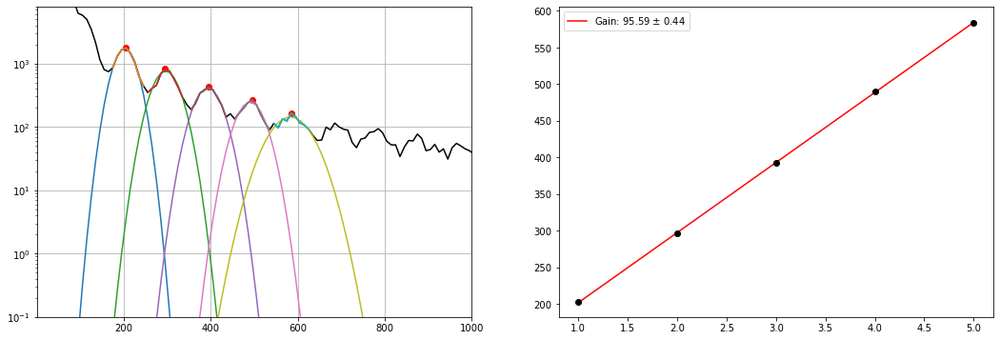

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_8.h5
Guess:  [531, 205.0375457875458, 10]
Params:  [532.70399109 203.28081307  22.07434   ]
Guess:  [311, 295.0540293040293, 10]
Params:  [299.43606525 295.15750427  23.73060062]
Guess:  [163, 385.0705128205128, 10]
Params:  [160.75028476 391.04392777  28.90306398]
Guess:  [112, 495.09065934065933, 10]
Params:  [ 95.11002861 486.91041792  32.75490081]


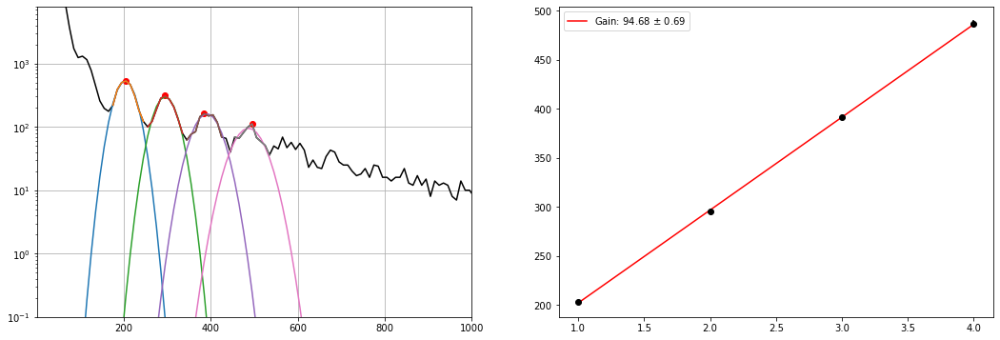

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_7.h5
Guess:  [578, 205.0375457875458, 10]
Params:  [556.85585138 201.75926241  22.22525052]
Guess:  [329, 295.0540293040293, 10]
Params:  [317.41291871 296.53275043  23.6572216 ]
Guess:  [181, 395.0723443223443, 10]
Params:  [167.56432536 390.731034    26.98481504]
Guess:  [126, 495.09065934065933, 10]
Params:  [119.47282903 487.73712897  28.18140582]


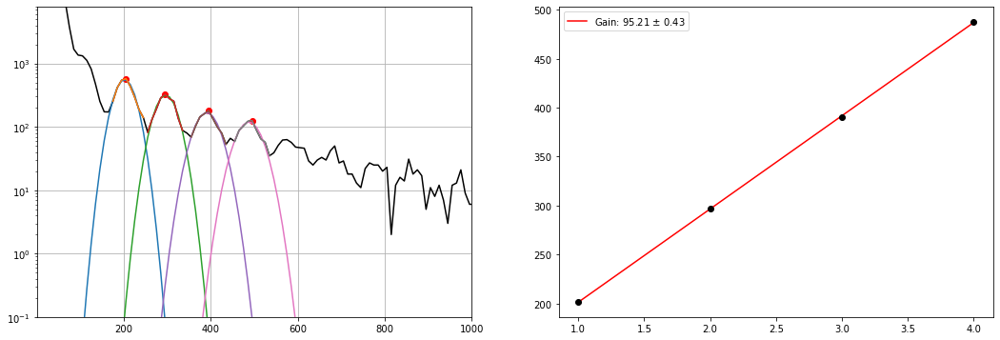

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_6.h5
Guess:  [525, 195.03571428571428, 10]
Params:  [521.51196372 201.11314481  22.54178581]
Guess:  [317, 295.0540293040293, 10]
Params:  [302.32566163 296.32100353  24.06419456]
Guess:  [169, 395.0723443223443, 10]
Params:  [166.2995125  391.34141438  28.77648793]
Guess:  [106, 485.0888278388278, 10]
Params:  [ 97.40056633 481.67319205  30.52040995]


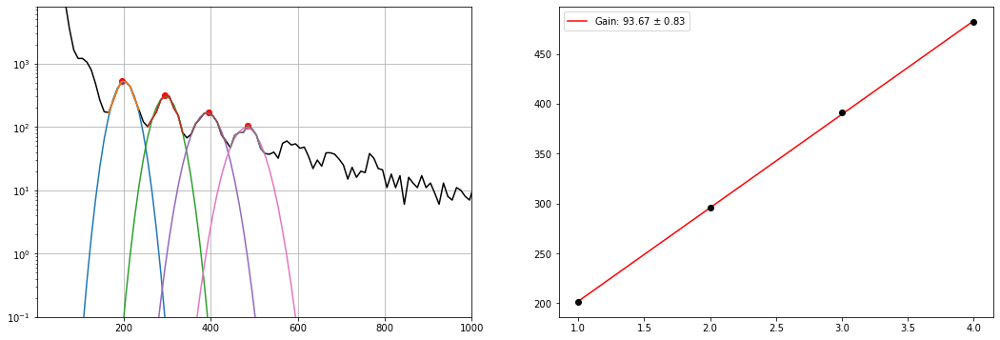

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_5.h5
Guess:  [552, 205.0375457875458, 10]
Params:  [545.34547316 201.76796593  21.61585065]
Guess:  [296, 295.0540293040293, 10]
Params:  [295.12130639 295.80852182  25.26107599]
Guess:  [181, 385.0705128205128, 10]
Params:  [170.82463833 389.12416148  27.71473028]
Guess:  [113, 495.09065934065933, 10]
Params:  [108.75166601 488.56846415  26.3915709 ]


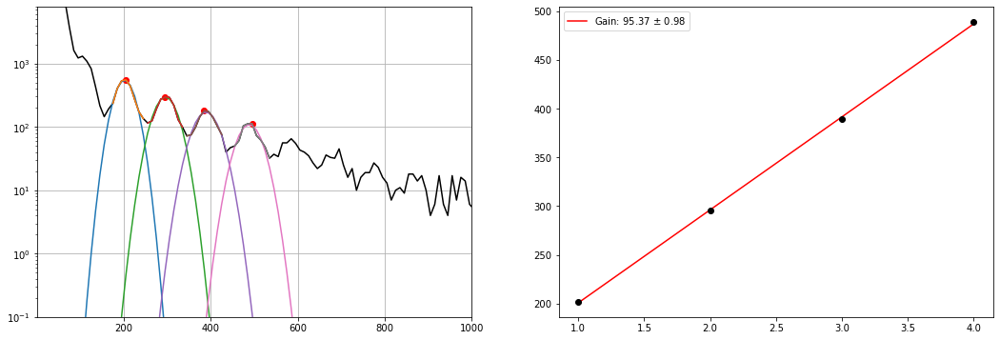

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_4.h5
Guess:  [547, 205.0375457875458, 10]
Params:  [518.1855258  203.87922735  21.06543771]
Guess:  [289, 295.0540293040293, 10]
Params:  [274.4709853  296.29512642  24.5593382 ]
Guess:  [190, 385.0705128205128, 10]
Params:  [174.84497919 391.81877044  26.24360865]
Guess:  [102, 495.09065934065933, 10]
Params:  [ 94.8583427  487.67469946  30.97600683]


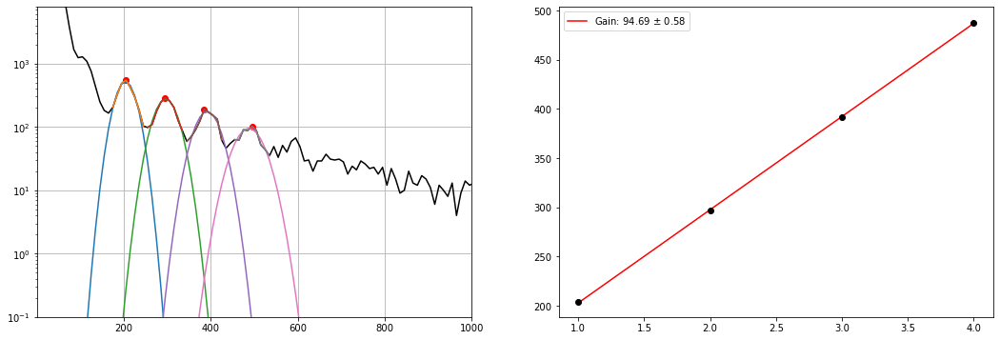

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_3.h5
Guess:  [533, 205.0375457875458, 10]
Params:  [516.24372828 203.63446762  22.10831577]
Guess:  [320, 295.0540293040293, 10]
Params:  [307.12828588 296.65198217  23.76100791]
Guess:  [154, 395.0723443223443, 10]
Params:  [152.8594127  392.67444314  29.01279772]
Guess:  [117, 485.0888278388278, 10]
Params:  [100.45331176 484.3830506   29.05734098]


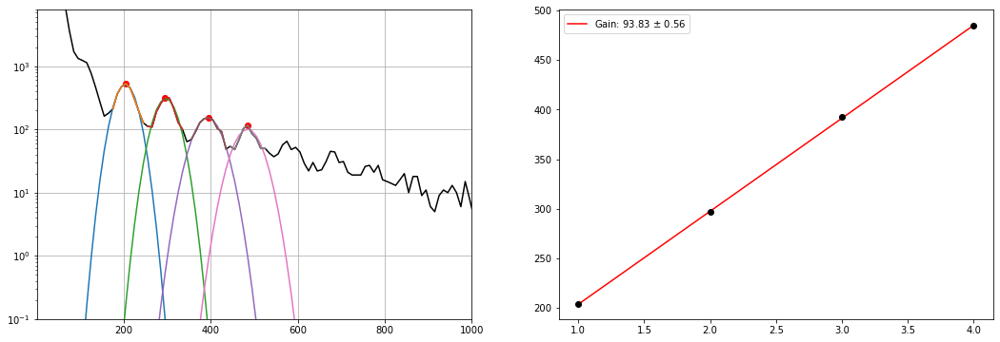

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_2.h5
Guess:  [573, 205.0375457875458, 10]
Params:  [560.33375592 201.96981355  21.883847  ]
Guess:  [284, 305.0558608058608, 10]
Params:  [286.91943215 296.83388689  25.47217435]
Guess:  [165, 385.0705128205128, 10]
Params:  [159.40344553 390.21836381  27.47134273]
Guess:  [106, 475.0869963369963, 10]
Params:  [ 96.78992598 484.23109482  31.9439248 ]


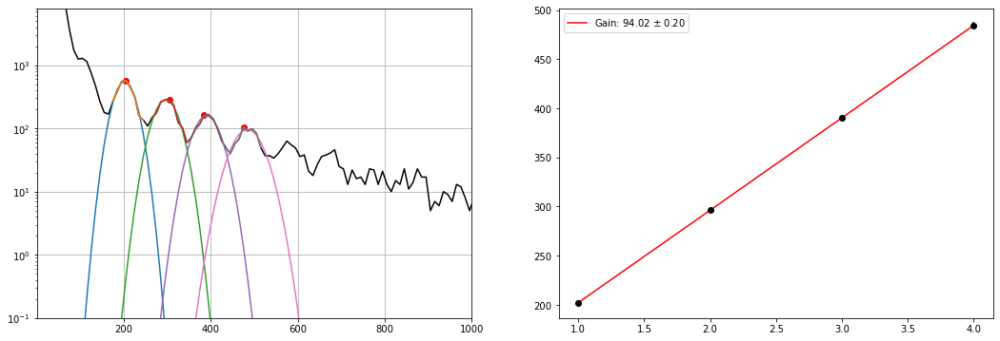

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_1.h5
Guess:  [543, 205.0375457875458, 10]
Params:  [545.49958924 201.77981636  21.83690156]
Guess:  [308, 295.0540293040293, 10]
Params:  [282.74855079 296.4427942   25.22160116]
Guess:  [184, 385.0705128205128, 10]
Params:  [169.19162075 389.61710859  27.29208765]
Guess:  [98, 505.09249084249086, 10]
Params:  [ 95.32833548 489.10913807  31.52731204]


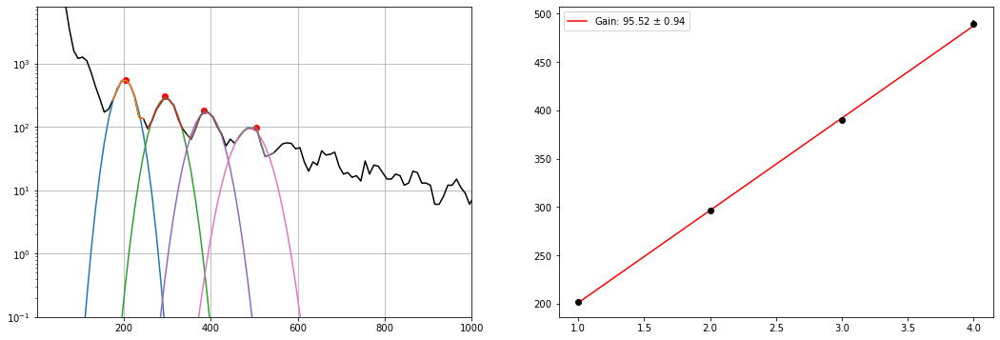

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_0.h5
Guess:  [541, 205.0375457875458, 10]
Params:  [517.44474065 202.5722464   22.2700805 ]
Guess:  [306, 305.0558608058608, 10]
Params:  [284.54190962 297.30906176  24.75936083]
Guess:  [176, 385.0705128205128, 10]
Params:  [157.28605999 391.71031513  28.19828685]
Guess:  [103, 495.09065934065933, 10]
Params:  [102.56215849 484.86167401  31.73670205]


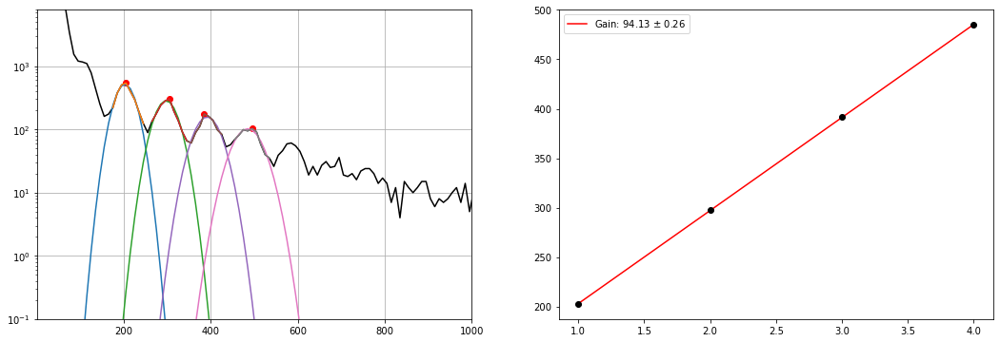

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_8.h5
Guess:  [408, 205.0375457875458, 10]
Params:  [395.39276083 202.56646245  22.81956235]
Guess:  [282, 295.0540293040293, 10]
Params:  [269.32422886 296.89433502  23.6932671 ]
Guess:  [234, 395.0723443223443, 10]
Params:  [226.66921365 392.29470568  23.87290263]


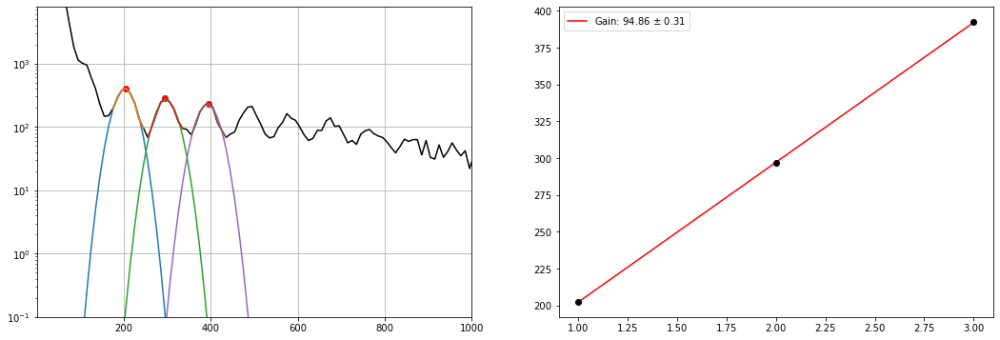

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_7.h5
Guess:  [419, 205.0375457875458, 10]
Params:  [420.60828359 202.41752528  22.19731948]
Guess:  [311, 295.0540293040293, 10]
Params:  [301.2264501  296.83186892  23.29797622]
Guess:  [250, 395.0723443223443, 10]
Params:  [227.75358232 392.12372874  25.1938656 ]


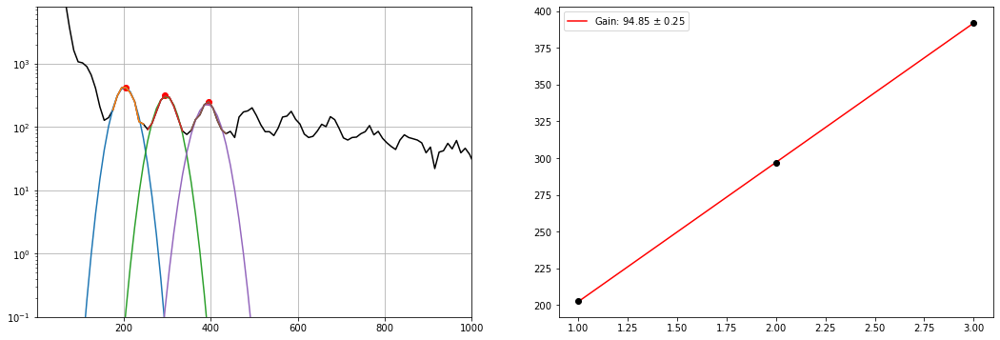

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_6.h5
Guess:  [432, 205.0375457875458, 10]
Params:  [424.60040358 201.80005341  21.62164965]
Guess:  [293, 295.0540293040293, 10]
Params:  [283.54760013 295.30717089  23.27043104]
Guess:  [236, 395.0723443223443, 10]
Params:  [221.85884269 392.35024207  26.53520504]


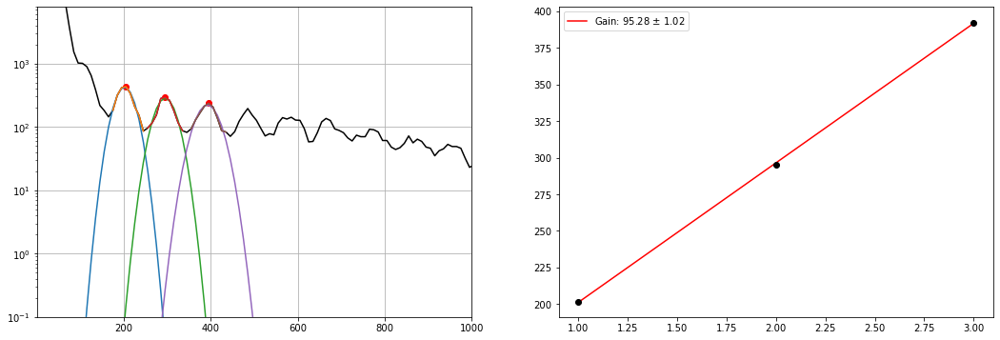

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_5.h5
Guess:  [408, 195.03571428571428, 10]
Params:  [384.26586028 200.69866521  24.61719673]
Guess:  [300, 295.0540293040293, 10]
Params:  [274.14802954 297.54386767  23.20005746]
Guess:  [241, 385.0705128205128, 10]
Params:  [218.80228599 389.46632141  27.1044213 ]


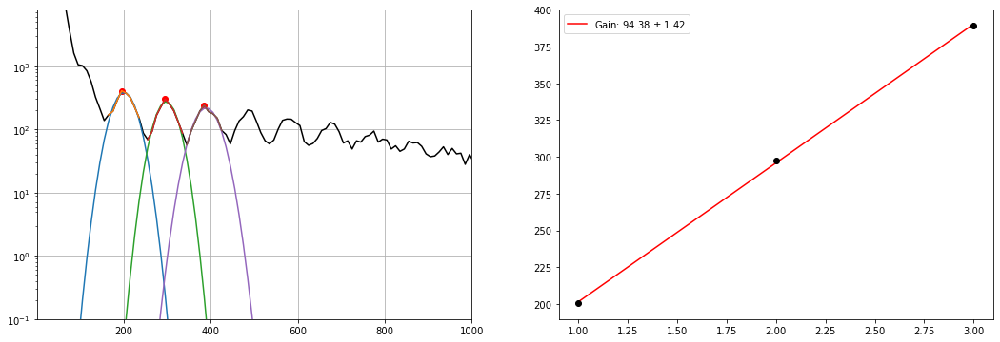

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_4.h5
Guess:  [383, 195.03571428571428, 10]
Params:  [387.7605959  200.81007697  24.10528469]
Guess:  [293, 295.0540293040293, 10]
Params:  [284.68931731 297.56131728  24.199498  ]
Guess:  [225, 395.0723443223443, 10]
Params:  [228.20359079 392.80385055  24.49872945]


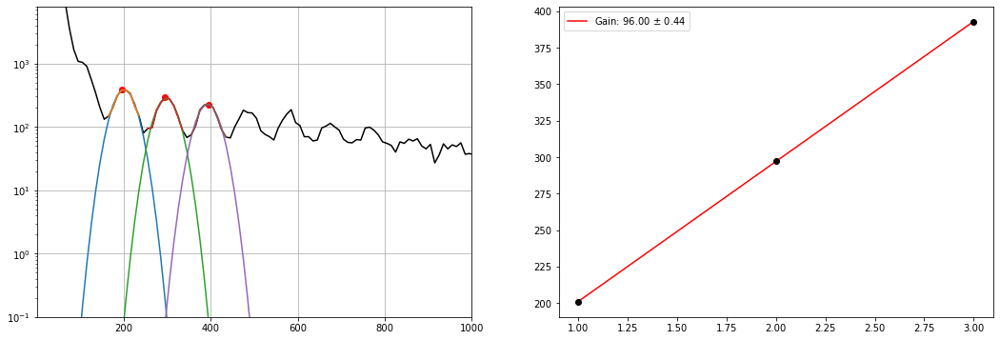

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_3.h5
Guess:  [409, 205.0375457875458, 10]
Params:  [406.36356286 202.27774928  22.3138069 ]
Guess:  [286, 295.0540293040293, 10]
Params:  [275.79446647 296.84752443  24.98656472]
Guess:  [254, 395.0723443223443, 10]
Params:  [229.13974448 392.64432467  24.73973515]


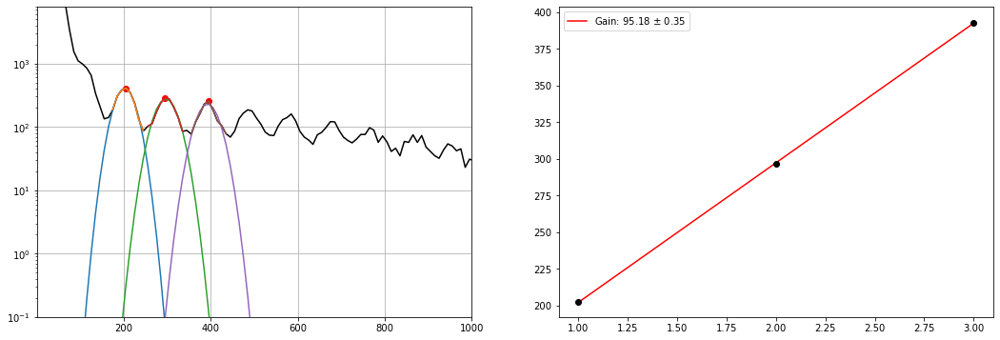

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_2.h5
Guess:  [395, 205.0375457875458, 10]
Params:  [400.348598   204.12926575  21.52939349]
Guess:  [304, 295.0540293040293, 10]
Params:  [287.67844137 296.01053035  22.96948945]
Guess:  [223, 385.0705128205128, 10]
Params:  [213.26935458 389.73208317  26.12230231]


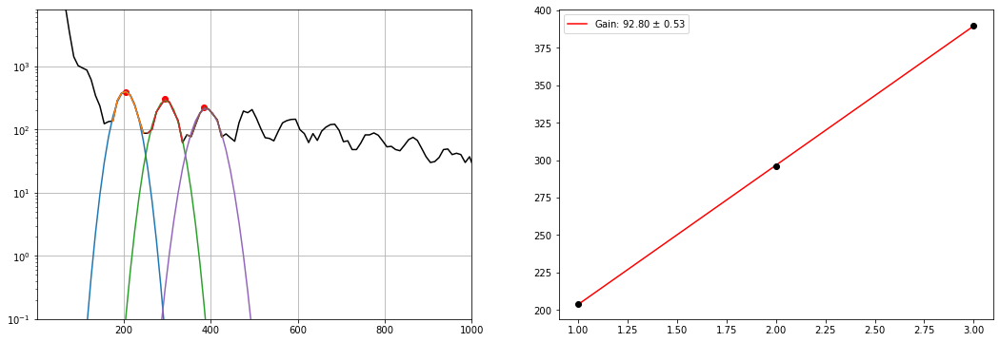

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_1.h5
Guess:  [397, 205.0375457875458, 10]
Params:  [399.17328282 200.1070331   23.99744066]
Guess:  [288, 295.0540293040293, 10]
Params:  [279.52570568 295.85147423  23.39640283]
Guess:  [237, 395.0723443223443, 10]
Params:  [230.36697744 392.84004334  24.93538348]


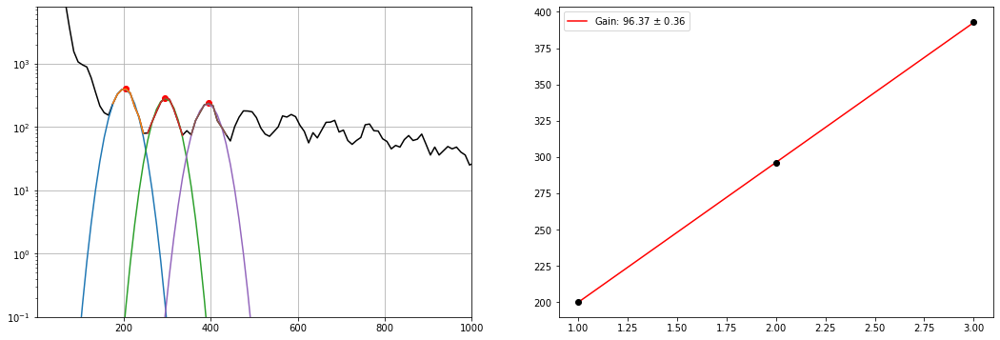

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_0.h5
Guess:  [423, 205.0375457875458, 10]
Params:  [388.61795934 202.509552    21.93323247]
Guess:  [302, 295.0540293040293, 10]
Params:  [273.09522191 296.75671126  23.78977813]
Guess:  [248, 395.0723443223443, 10]
Params:  [230.22821273 392.0095778   23.9555325 ]


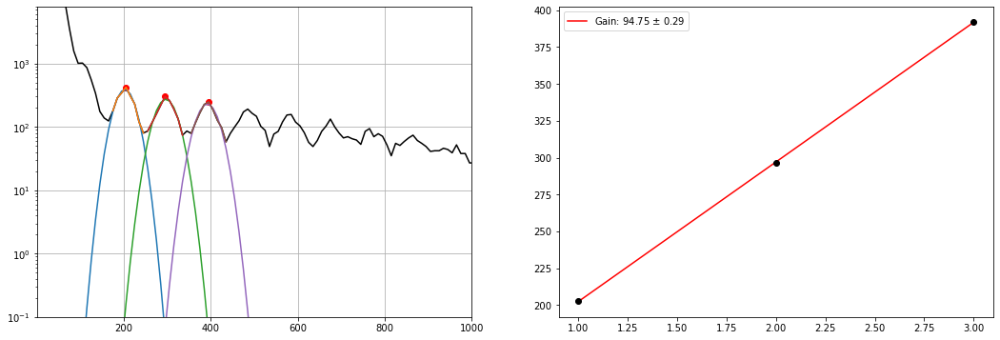

In [16]:
data_NO_FIELD = {'source':{}, 405.0:{}, 310.0:{}}

for file_type, file_list in files_7.items():
    # creating the data fields in the dict
    data_NO_FIELD[file_type]['pe_data'] = []
    data_NO_FIELD[file_type]['counts'] = []
    data_NO_FIELD[file_type]['gain'] = np.empty(len(file_list))
    data_NO_FIELD[file_type]['gain_err'] = np.empty(len(file_list))
    data_NO_FIELD[file_type]['dc_offset'] = np.empty(len(file_list))
    for i, file in enumerate(file_list):
        pe, counts, gain, gain_err, dc_offset = plot_fit_gain_dc(file, 25, 10, 10)
        data_NO_FIELD[file_type]['pe_data'].append(pe)
        data_NO_FIELD[file_type]['counts'].append(counts)
        data_NO_FIELD[file_type]['gain'][i] = gain
        data_NO_FIELD[file_type]['gain_err'][i] = gain_err
        data_NO_FIELD[file_type]['dc_offset'][i] = dc_offset
    # converting all the lists to arrays 
    data_NO_FIELD[file_type]['pe_data'] = np.array(data_NO_FIELD[file_type]['pe_data'])
    data_NO_FIELD[file_type]['counts'] = np.array(data_NO_FIELD[file_type]['counts'])

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_8.h5
Guess:  [1869, 205.0375457875458, 10]
Params:  [1812.01539288  202.56690961   23.18896079]
Guess:  [827, 295.0540293040293, 10]
Params:  [782.06372946 296.22506146  29.19376025]
Guess:  [417, 395.0723443223443, 10]
Params:  [406.08639836 392.23859535  29.78614367]
Guess:  [263, 495.09065934065933, 10]
Params:  [247.30045573 490.82959081  30.5332294 ]
Guess:  [176, 595.1089743589744, 10]
Params:  [161.4006939  590.02784268  32.61768244]


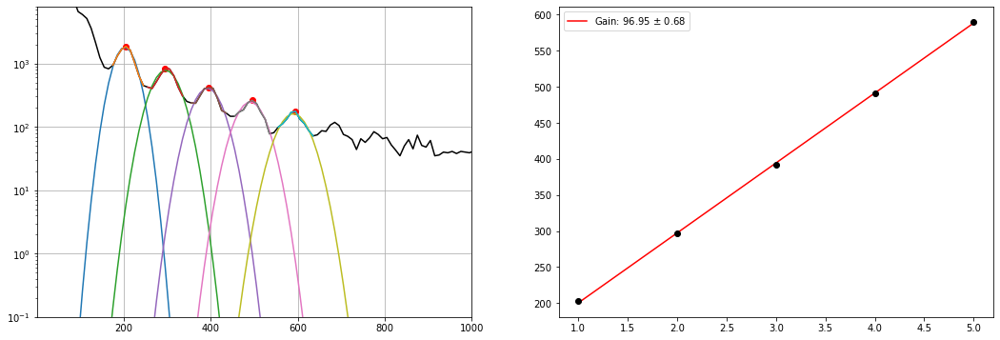

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_7.h5
Guess:  [1822, 205.0375457875458, 10]
Params:  [1799.12907269  202.39812364   24.2066894 ]
Guess:  [830, 295.0540293040293, 10]
Params:  [800.18082451 296.34120197  27.73521357]
Guess:  [466, 395.0723443223443, 10]
Params:  [424.47352702 393.17354593  28.13678391]
Guess:  [270, 485.0888278388278, 10]
Params:  [241.99895754 487.71512297  35.6548897 ]
Guess:  [194, 595.1089743589744, 10]
Params:  [178.43280748 588.78933893  30.95339491]


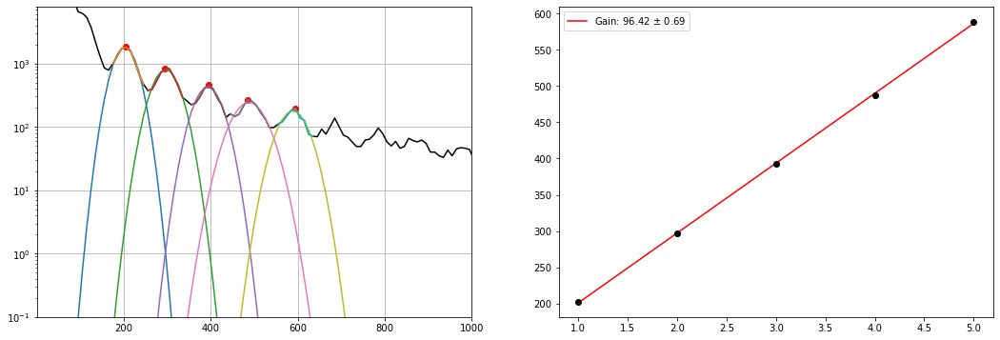

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_6.h5
Guess:  [1864, 205.0375457875458, 10]
Params:  [1803.95840238  201.67201038   23.37749925]
Guess:  [831, 295.0540293040293, 10]
Params:  [794.17797957 295.14791178  28.08459811]
Guess:  [410, 395.0723443223443, 10]
Params:  [399.09052441 392.8078346   30.78985841]
Guess:  [299, 495.09065934065933, 10]
Params:  [271.18589791 488.6705337   28.36913338]
Guess:  [161, 575.1053113553114, 10]
Params:  [146.71401577 580.24988458  42.1998931 ]


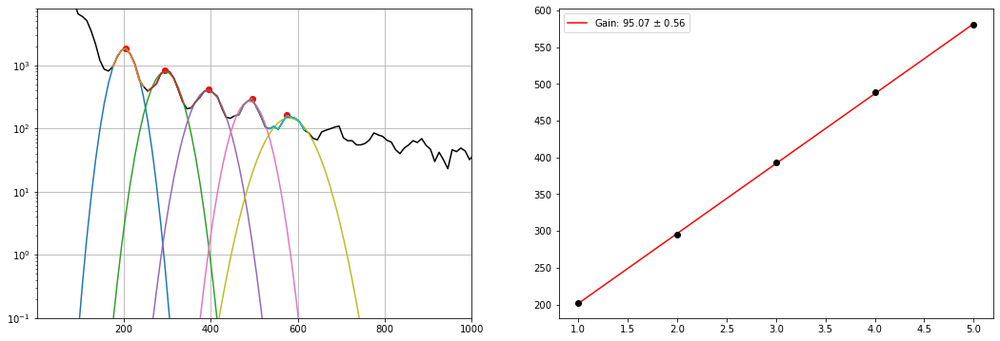

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_5.h5
Guess:  [1761, 205.0375457875458, 10]
Params:  [1708.59674182  201.91331419   22.7738481 ]
Guess:  [796, 305.0558608058608, 10]
Params:  [773.69636308 298.62773261  26.48208112]
Guess:  [476, 395.0723443223443, 10]
Params:  [405.15448195 393.9192261   28.32092955]
Guess:  [271, 495.09065934065933, 10]
Params:  [249.5180323  489.96492102  28.38686715]
Guess:  [155, 595.1089743589744, 10]
Params:  [147.05622726 589.14140686  32.3492075 ]


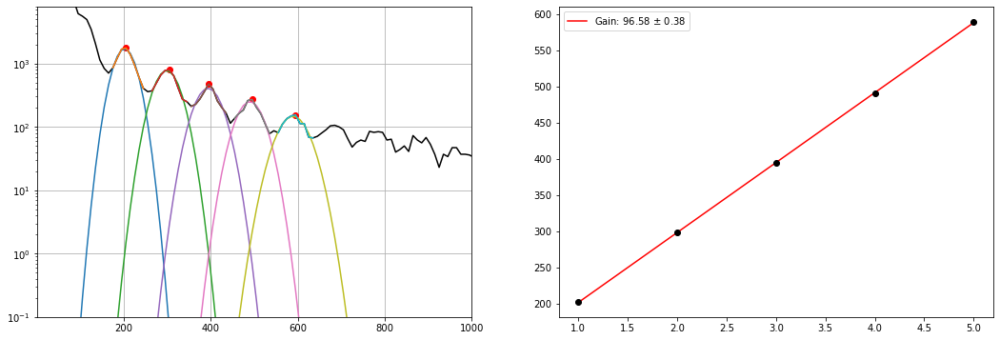

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_4.h5
Guess:  [1779, 205.0375457875458, 10]
Params:  [1752.91025922  202.58848098   24.19856298]
Guess:  [867, 295.0540293040293, 10]
Params:  [779.29124602 296.2380984   28.97476731]
Guess:  [445, 395.0723443223443, 10]
Params:  [415.92864958 391.91047336  29.28638729]
Guess:  [249, 495.09065934065933, 10]
Params:  [238.53101557 488.47649372  32.5075014 ]
Guess:  [192, 585.1071428571429, 10]
Params:  [176.79560255 585.72899298  32.20021734]


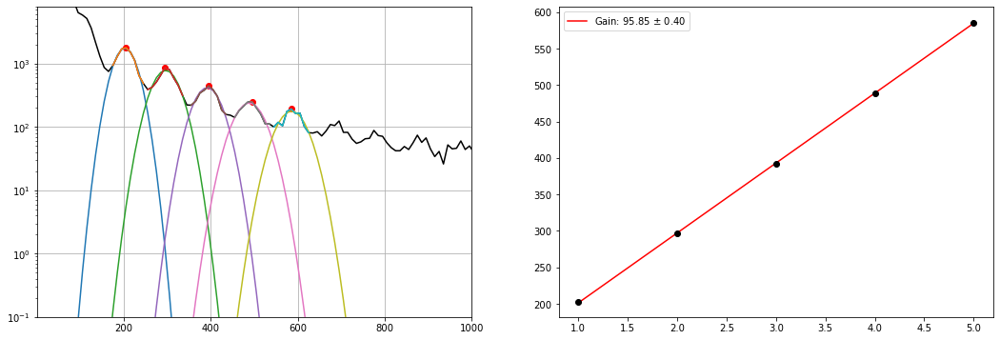

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_3.h5
Guess:  [1848, 205.0375457875458, 10]
Params:  [1793.67163716  202.16058491   23.41977923]
Guess:  [819, 305.0558608058608, 10]
Params:  [784.3513568  298.59478812  27.95737185]
Guess:  [435, 395.0723443223443, 10]
Params:  [409.29691719 393.70798423  29.84009375]
Guess:  [286, 495.09065934065933, 10]
Params:  [248.75842589 490.85297668  32.12271075]
Guess:  [166, 595.1089743589744, 10]
Params:  [160.69254459 590.30851815  33.33736178]


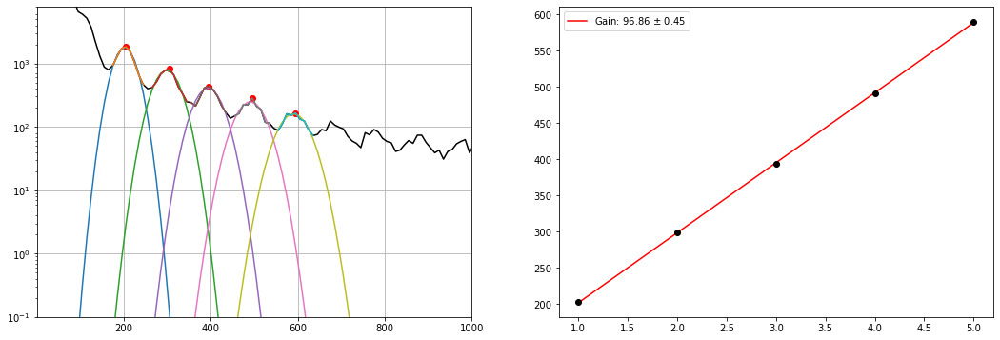

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_2.h5
Guess:  [1771, 205.0375457875458, 10]
Params:  [1756.81376251  202.07190435   24.34983132]
Guess:  [841, 305.0558608058608, 10]
Params:  [793.20297875 298.03751704  26.91908721]
Guess:  [482, 395.0723443223443, 10]
Params:  [424.36775366 392.23774988  29.58690606]
Guess:  [238, 495.09065934065933, 10]
Params:  [238.76001383 490.03542188  32.80774017]
Guess:  [166, 595.1089743589744, 10]
Params:  [156.20055646 588.63458747  33.50300315]


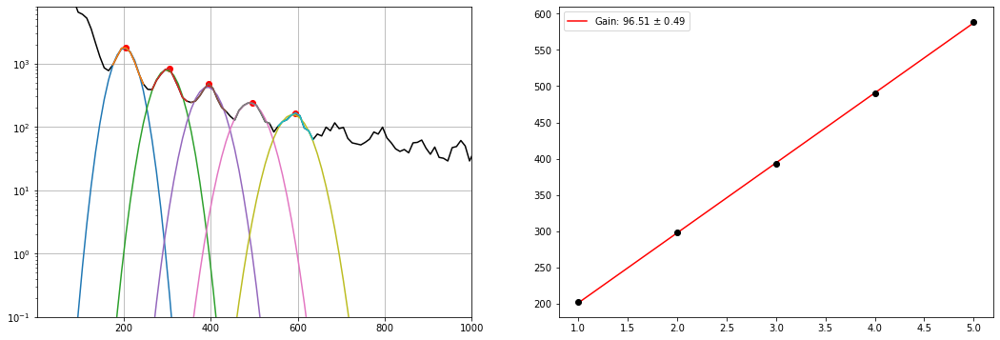

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_1.h5
Guess:  [1905, 205.0375457875458, 10]
Params:  [1840.86505619  202.59564463   23.32577532]
Guess:  [800, 295.0540293040293, 10]
Params:  [784.50699143 295.52147514  27.96164339]
Guess:  [448, 395.0723443223443, 10]
Params:  [428.24766441 393.5228202   28.95075341]
Guess:  [262, 485.0888278388278, 10]
Params:  [249.26593651 486.21499691  32.01571205]
Guess:  [159, 585.1071428571429, 10]
Params:  [155.57381381 584.59580116  31.39462698]


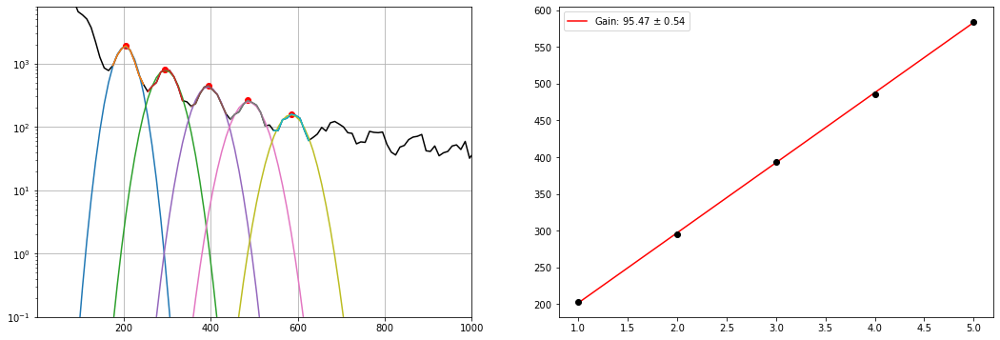

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_source_0.h5
Guess:  [1785, 205.0375457875458, 10]
Params:  [1729.13915089  202.40329482   23.47805482]
Guess:  [826, 295.0540293040293, 10]
Params:  [760.12959154 296.40783893  27.85450213]
Guess:  [426, 395.0723443223443, 10]
Params:  [409.25149341 393.16737141  28.72835317]
Guess:  [265, 495.09065934065933, 10]
Params:  [246.54097641 490.52060333  29.27160287]
Guess:  [165, 585.1071428571429, 10]
Params:  [143.23697842 583.27745488  43.58378743]


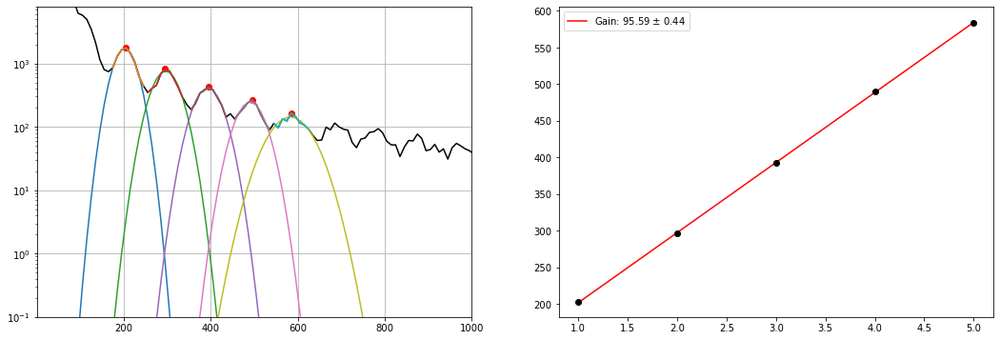

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_8.h5
Guess:  [531, 205.0375457875458, 10]
Params:  [532.70399109 203.28081307  22.07434   ]
Guess:  [311, 295.0540293040293, 10]
Params:  [299.43606525 295.15750427  23.73060062]
Guess:  [163, 385.0705128205128, 10]
Params:  [160.75028476 391.04392777  28.90306398]
Guess:  [112, 495.09065934065933, 10]
Params:  [ 95.11002861 486.91041792  32.75490081]


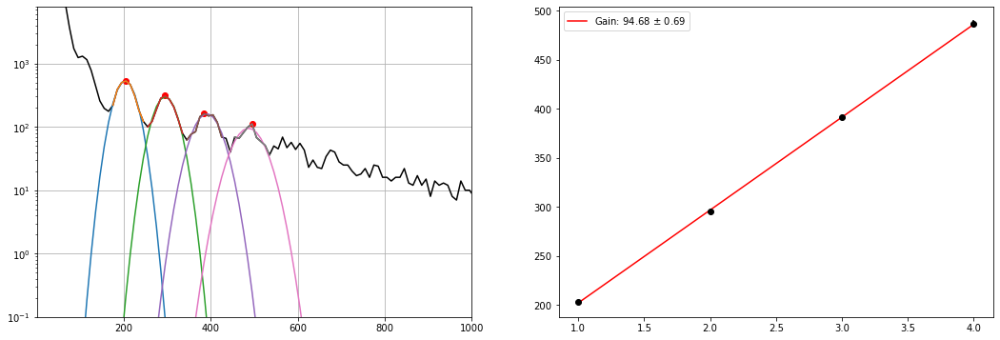

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_7.h5
Guess:  [578, 205.0375457875458, 10]
Params:  [556.85585138 201.75926241  22.22525052]
Guess:  [329, 295.0540293040293, 10]
Params:  [317.41291871 296.53275043  23.6572216 ]
Guess:  [181, 395.0723443223443, 10]
Params:  [167.56432536 390.731034    26.98481504]
Guess:  [126, 495.09065934065933, 10]
Params:  [119.47282903 487.73712897  28.18140582]


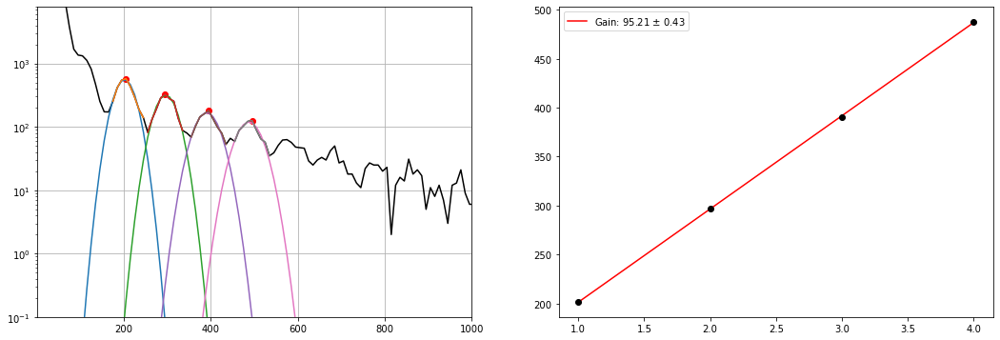

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_6.h5
Guess:  [525, 195.03571428571428, 10]
Params:  [521.51196372 201.11314481  22.54178581]
Guess:  [317, 295.0540293040293, 10]
Params:  [302.32566163 296.32100353  24.06419456]
Guess:  [169, 395.0723443223443, 10]
Params:  [166.2995125  391.34141438  28.77648793]
Guess:  [106, 485.0888278388278, 10]
Params:  [ 97.40056633 481.67319205  30.52040995]


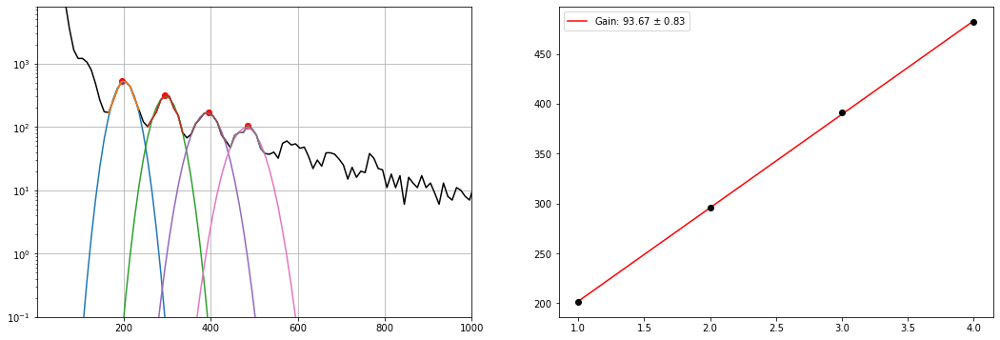

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_5.h5
Guess:  [552, 205.0375457875458, 10]
Params:  [545.34547316 201.76796593  21.61585065]
Guess:  [296, 295.0540293040293, 10]
Params:  [295.12130639 295.80852182  25.26107599]
Guess:  [181, 385.0705128205128, 10]
Params:  [170.82463833 389.12416148  27.71473028]
Guess:  [113, 495.09065934065933, 10]
Params:  [108.75166601 488.56846415  26.3915709 ]


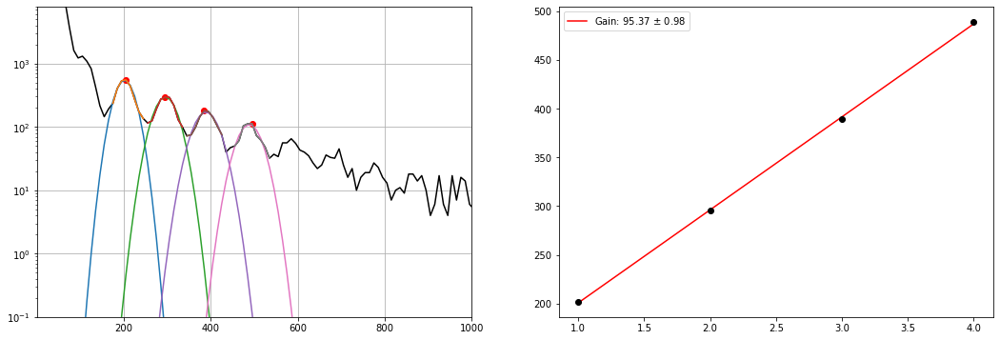

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_4.h5
Guess:  [547, 205.0375457875458, 10]
Params:  [518.1855258  203.87922735  21.06543771]
Guess:  [289, 295.0540293040293, 10]
Params:  [274.4709853  296.29512642  24.5593382 ]
Guess:  [190, 385.0705128205128, 10]
Params:  [174.84497919 391.81877044  26.24360865]
Guess:  [102, 495.09065934065933, 10]
Params:  [ 94.8583427  487.67469946  30.97600683]


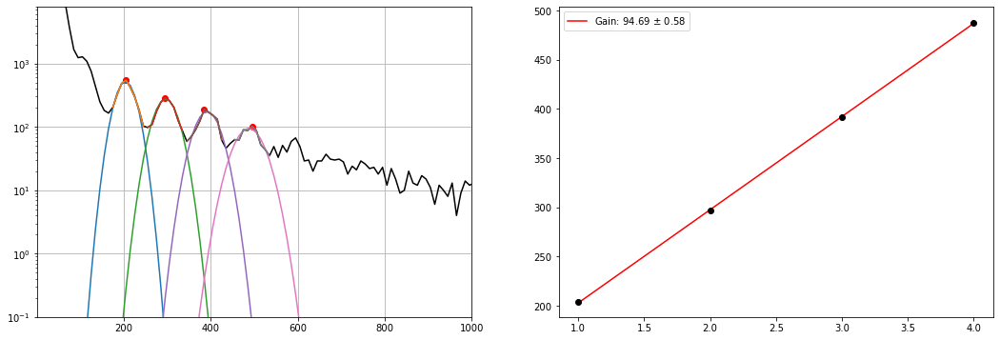

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_3.h5
Guess:  [533, 205.0375457875458, 10]
Params:  [516.24372828 203.63446762  22.10831577]
Guess:  [320, 295.0540293040293, 10]
Params:  [307.12828588 296.65198217  23.76100791]
Guess:  [154, 395.0723443223443, 10]
Params:  [152.8594127  392.67444314  29.01279772]
Guess:  [117, 485.0888278388278, 10]
Params:  [100.45331176 484.3830506   29.05734098]


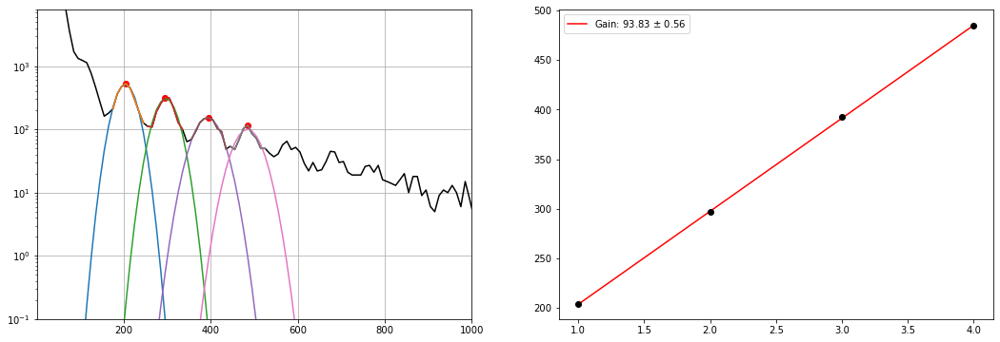

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_2.h5
Guess:  [573, 205.0375457875458, 10]
Params:  [560.33375592 201.96981355  21.883847  ]
Guess:  [284, 305.0558608058608, 10]
Params:  [286.91943215 296.83388689  25.47217435]
Guess:  [165, 385.0705128205128, 10]
Params:  [159.40344553 390.21836381  27.47134273]
Guess:  [106, 475.0869963369963, 10]
Params:  [ 96.78992598 484.23109482  31.9439248 ]


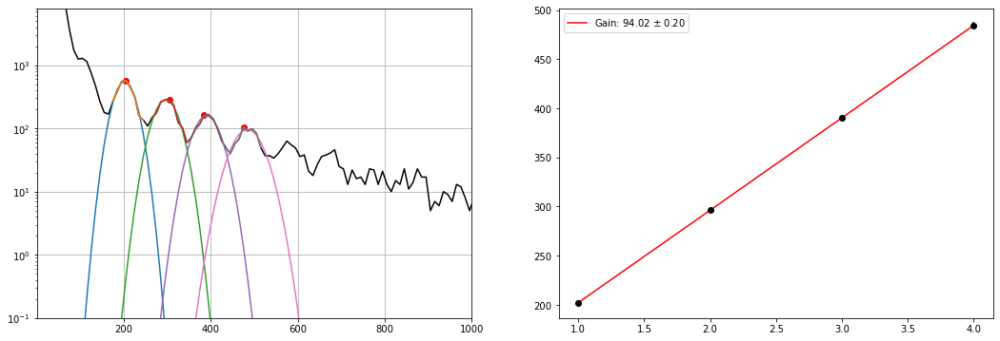

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_1.h5
Guess:  [543, 205.0375457875458, 10]
Params:  [545.49958924 201.77981636  21.83690156]
Guess:  [308, 295.0540293040293, 10]
Params:  [282.74855079 296.4427942   25.22160116]
Guess:  [184, 385.0705128205128, 10]
Params:  [169.19162075 389.61710859  27.29208765]
Guess:  [98, 505.09249084249086, 10]
Params:  [ 95.32833548 489.10913807  31.52731204]


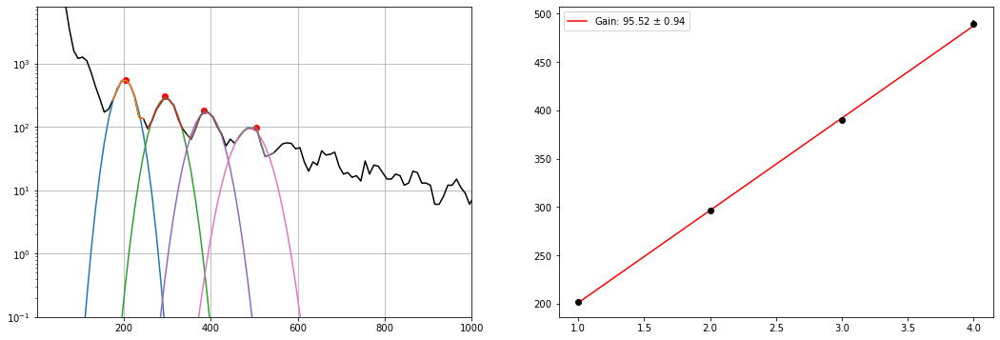

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_405_0.h5
Guess:  [541, 205.0375457875458, 10]
Params:  [517.44474065 202.5722464   22.2700805 ]
Guess:  [306, 305.0558608058608, 10]
Params:  [284.54190962 297.30906176  24.75936083]
Guess:  [176, 385.0705128205128, 10]
Params:  [157.28605999 391.71031513  28.19828685]
Guess:  [103, 495.09065934065933, 10]
Params:  [102.56215849 484.86167401  31.73670205]


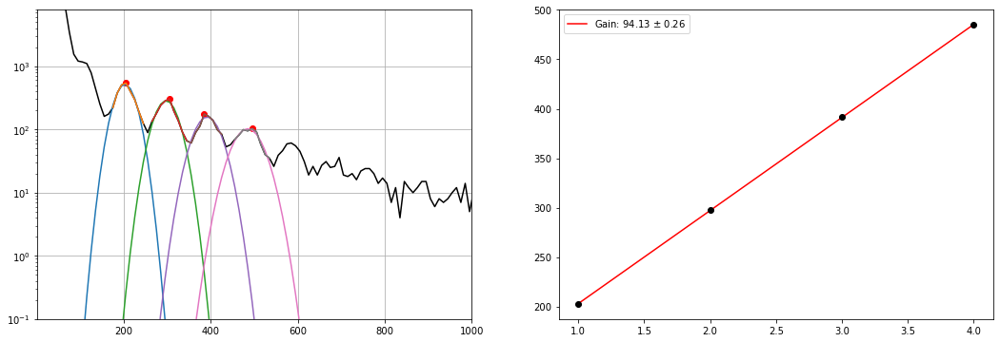

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_8.h5
Guess:  [408, 205.0375457875458, 10]
Params:  [395.39276083 202.56646245  22.81956235]
Guess:  [282, 295.0540293040293, 10]
Params:  [269.32422886 296.89433502  23.6932671 ]
Guess:  [234, 395.0723443223443, 10]
Params:  [226.66921365 392.29470568  23.87290263]


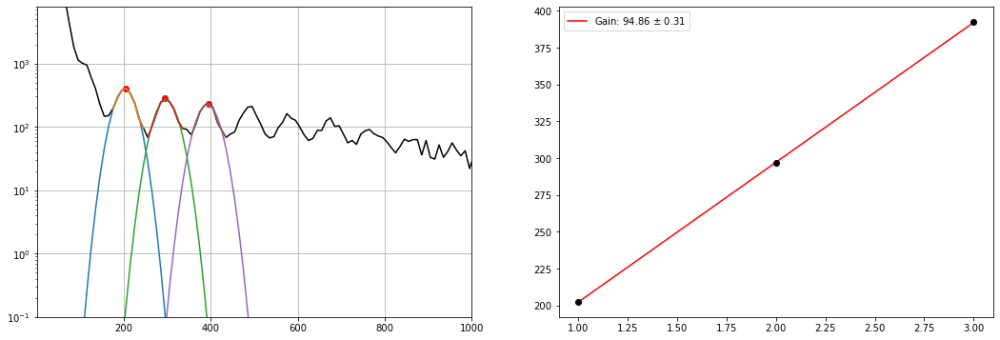

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_7.h5
Guess:  [419, 205.0375457875458, 10]
Params:  [420.60828359 202.41752528  22.19731948]
Guess:  [311, 295.0540293040293, 10]
Params:  [301.2264501  296.83186892  23.29797622]
Guess:  [250, 395.0723443223443, 10]
Params:  [227.75358232 392.12372874  25.1938656 ]


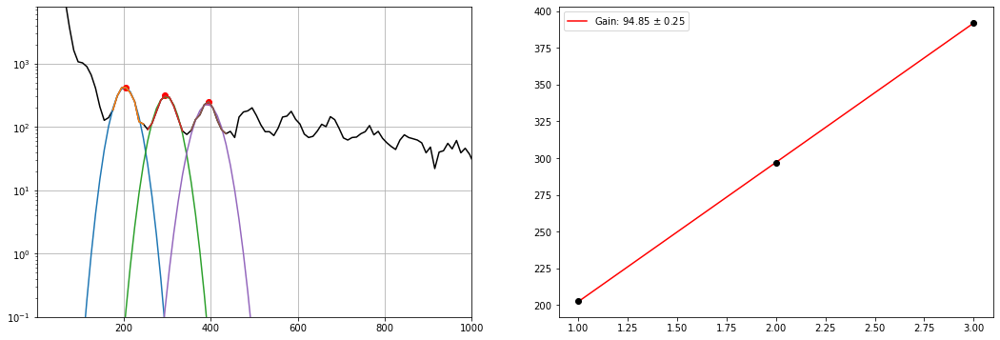

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_6.h5
Guess:  [432, 205.0375457875458, 10]
Params:  [424.60040358 201.80005341  21.62164965]
Guess:  [293, 295.0540293040293, 10]
Params:  [283.54760013 295.30717089  23.27043104]
Guess:  [236, 395.0723443223443, 10]
Params:  [221.85884269 392.35024207  26.53520504]


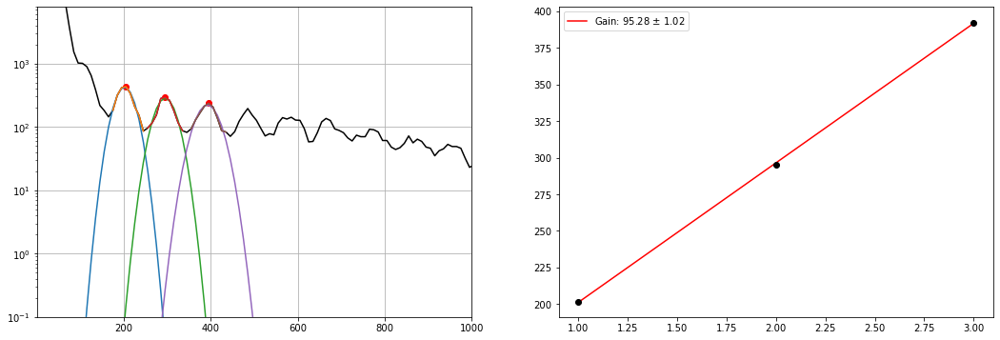

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_5.h5
Guess:  [408, 195.03571428571428, 10]
Params:  [384.26586028 200.69866521  24.61719673]
Guess:  [300, 295.0540293040293, 10]
Params:  [274.14802954 297.54386767  23.20005746]
Guess:  [241, 385.0705128205128, 10]
Params:  [218.80228599 389.46632141  27.1044213 ]


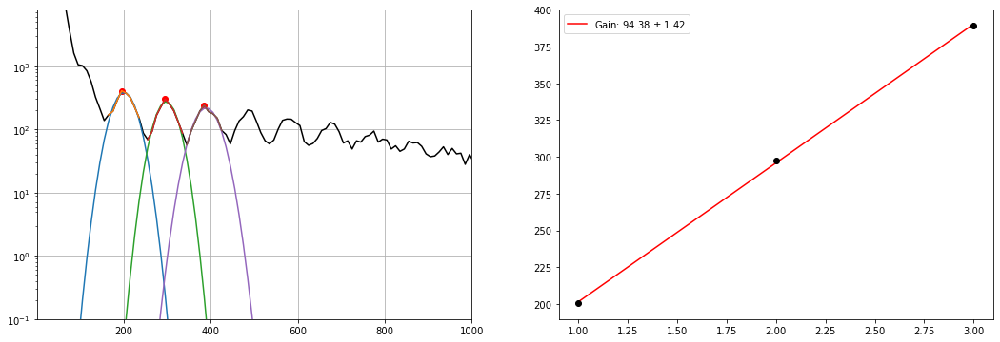

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_4.h5
Guess:  [383, 195.03571428571428, 10]
Params:  [387.7605959  200.81007697  24.10528469]
Guess:  [293, 295.0540293040293, 10]
Params:  [284.68931731 297.56131728  24.199498  ]
Guess:  [225, 395.0723443223443, 10]
Params:  [228.20359079 392.80385055  24.49872945]


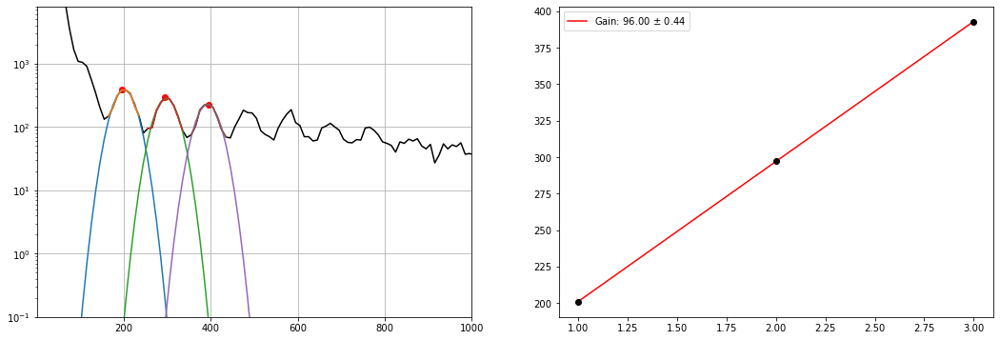

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_3.h5
Guess:  [409, 205.0375457875458, 10]
Params:  [406.36356286 202.27774928  22.3138069 ]
Guess:  [286, 295.0540293040293, 10]
Params:  [275.79446647 296.84752443  24.98656472]
Guess:  [254, 395.0723443223443, 10]
Params:  [229.13974448 392.64432467  24.73973515]


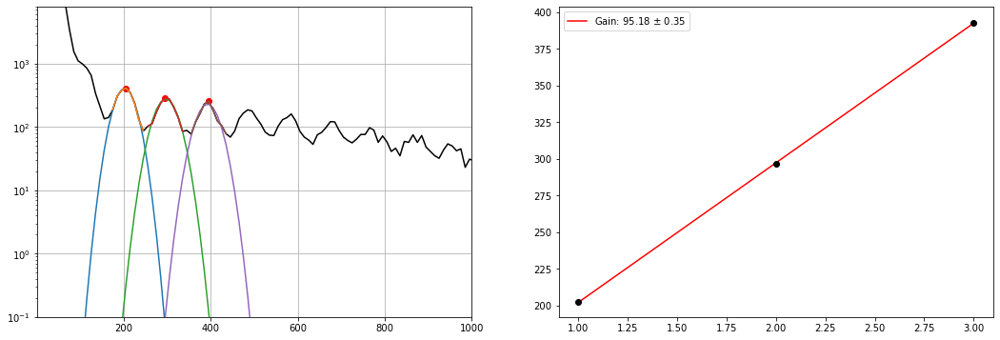

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_2.h5
Guess:  [395, 205.0375457875458, 10]
Params:  [400.348598   204.12926575  21.52939349]
Guess:  [304, 295.0540293040293, 10]
Params:  [287.67844137 296.01053035  22.96948945]
Guess:  [223, 385.0705128205128, 10]
Params:  [213.26935458 389.73208317  26.12230231]


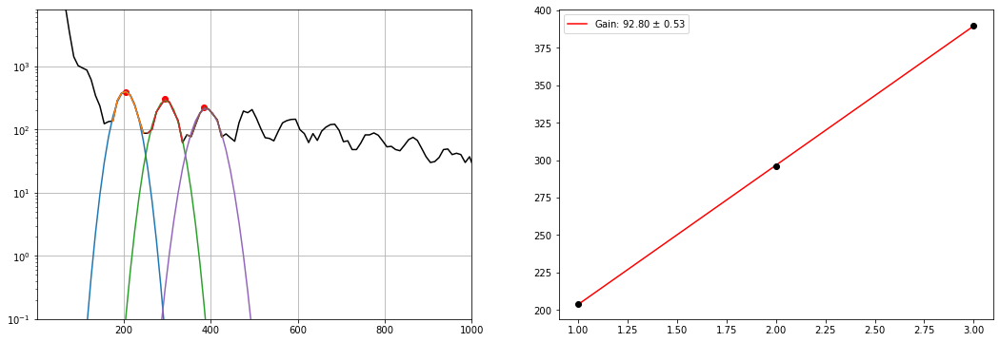

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_1.h5
Guess:  [397, 205.0375457875458, 10]
Params:  [399.17328282 200.1070331   23.99744066]
Guess:  [288, 295.0540293040293, 10]
Params:  [279.52570568 295.85147423  23.39640283]
Guess:  [237, 395.0723443223443, 10]
Params:  [230.36697744 392.84004334  24.93538348]


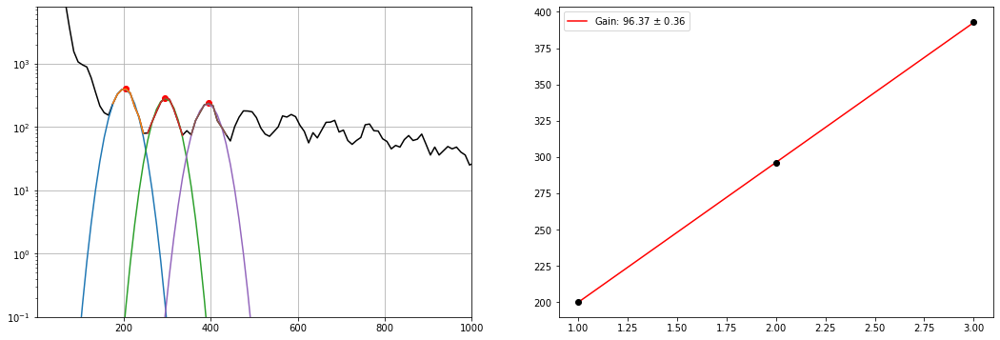

Working on file /gpfs/gibbs/project/david_moore/mpw46/purity_monitor/20230213/step7/mca_keith_31.40OV_310_0.h5
Guess:  [423, 205.0375457875458, 10]
Params:  [388.61795934 202.509552    21.93323247]
Guess:  [302, 295.0540293040293, 10]
Params:  [273.09522191 296.75671126  23.78977813]
Guess:  [248, 395.0723443223443, 10]
Params:  [230.22821273 392.0095778   23.9555325 ]


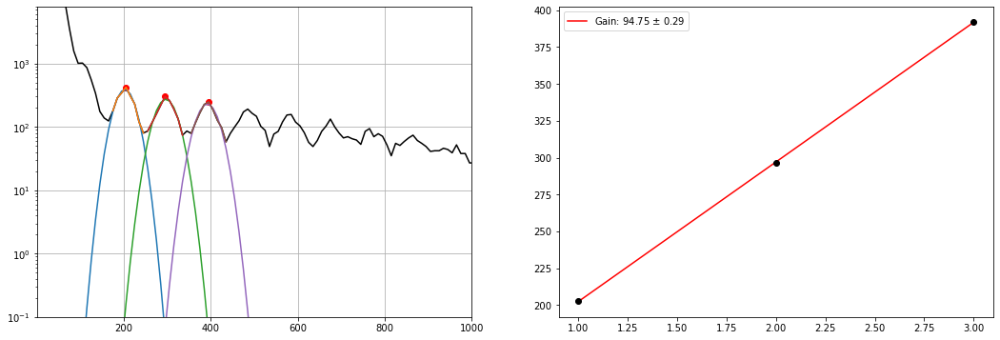

In [17]:
data_NO_FIELD = {'source':{}, 405.0:{}, 310.0:{}}

for file_type, file_list in files_7.items():
    # creating the data fields in the dict
    data_NO_FIELD[file_type]['pe_data'] = []
    data_NO_FIELD[file_type]['counts'] = []
    data_NO_FIELD[file_type]['gain'] = np.empty(len(file_list))
    data_NO_FIELD[file_type]['gain_err'] = np.empty(len(file_list))
    data_NO_FIELD[file_type]['dc_offset'] = np.empty(len(file_list))
    for i, file in enumerate(file_list):
        pe, counts, gain, gain_err, dc_offset = plot_fit_gain_dc(file, 25, 10, 10)
        data_NO_FIELD[file_type]['pe_data'].append(pe)
        data_NO_FIELD[file_type]['counts'].append(counts)
        data_NO_FIELD[file_type]['gain'][i] = gain
        data_NO_FIELD[file_type]['gain_err'][i] = gain_err
        data_NO_FIELD[file_type]['dc_offset'][i] = dc_offset
    # converting all the lists to arrays 
    data_NO_FIELD[file_type]['pe_data'] = np.array(data_NO_FIELD[file_type]['pe_data'])
    data_NO_FIELD[file_type]['counts'] = np.array(data_NO_FIELD[file_type]['counts'])

-1.094046176514988
-1.13732470808452
-1.1262883462987139


<Figure size 648x432 with 0 Axes>

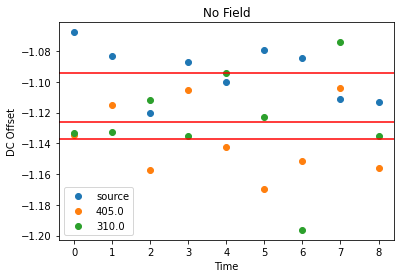

In [18]:
plt.figure(figsize = (9, 6))
# plotting the dc offset over time

# getting the "time"
time_NO_FIELD = {}
for key in files_7:
    time_NO_FIELD[key] = np.arange(0, len(files_7[key]))
plt.figure(figsize=(6,4))
for key in data_NO_FIELD:
    data_NO_FIELD[key]['dc_offset'] = np.asarray(data_NO_FIELD[key]['dc_offset'])
    data_NO_FIELD[key]['dc_offset'][data_NO_FIELD[key]['dc_offset'] < -5] = np.nan # setting any outliers to nan
    masked_data = np.ma.masked_array(data_NO_FIELD[key]['dc_offset'], np.isnan(data_NO_FIELD[key]['dc_offset'])) # creating a masked array to ignore the nan when tkaing the average dc offset
    dc_offset_mean = np.ma.average(masked_data)
    data_NO_FIELD[key]['mean_dc_offset'] = dc_offset_mean
    plt.scatter(time_NO_FIELD[key], data_NO_FIELD[key]['dc_offset'], marker='o', label= str(key))
    plt.axhline(y=dc_offset_mean, color='r')
    print(dc_offset_mean)

plt.ylabel('DC Offset')
plt.xlabel('Time')
plt.title('No Field')
# plt.ylim(-1.4, -1)
# plt.grid()
plt.legend(loc='best')
# plt.savefig('NO_FIELD_gain_comparison.pdf')
plt.show()

# Combining all the fields

-1.1004702837240543
-1.2172718342770532
-1.1498328817731895


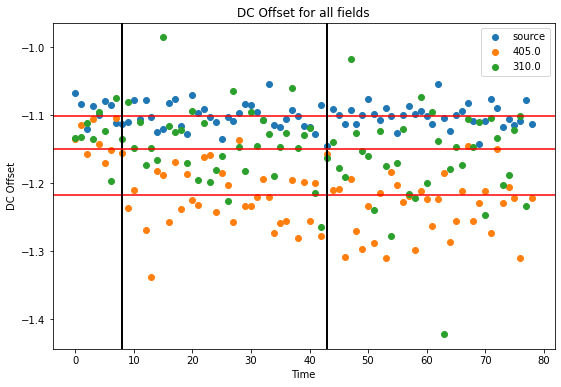

In [19]:
combined_time = {}
offset_means = {}
plt.figure(figsize = (9, 6))
plt.title('DC Offset for all fields')
plt.xlabel('Time')
plt.ylabel('DC Offset')

for file_type in data_NO_FIELD:
    combined_time[file_type] = np.arange(0, (len(time_NO_FIELD[file_type])+len(time_POS_FIELD[file_type])+len(time_NEG_FIELD[file_type])))
    combined_offsets = np.concatenate((data_NO_FIELD[file_type]['dc_offset'], data_POS_FIELD[file_type]['dc_offset'], data_NEG_FIELD[file_type]['dc_offset']))
    combined_masked_data = np.ma.masked_array(combined_offsets, np.isnan(combined_offsets)) # creating a masked array to ignore the nan when tkaing the average dc offset
    combined_dc_offset_mean = np.ma.average(combined_masked_data)
    print(combined_dc_offset_mean)
    offset_means[file_type] = combined_dc_offset_mean
    plt.scatter(combined_time[file_type], combined_offsets, label=file_type)
    plt.axvline(x=len(time_NO_FIELD['source'])-1, color='k')
    plt.axvline(x=len(time_NO_FIELD['source'])+len(time_POS_FIELD['source'])-1, color='k')
    plt.axhline(y=combined_dc_offset_mean, color='r')
plt.legend()

# Saving data to a json file

In [20]:
all_data = [data_NO_FIELD, data_POS_FIELD, data_NEG_FIELD, time_NO_FIELD, time_POS_FIELD, time_NEG_FIELD, pfsset_means]

with open('./data_for_pde.json', 'w') as f:
    json.dump()
        